### Imports

In [91]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from scipy.stats import norm, skew 
from scipy import stats
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy.special import boxcox1p
lam = 0.15
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)

### EDA

In [10]:
df = pd.read_csv('train.csv')
df.head()

,Year,Date,Locality,Address,Estimated Value,Sale Price,Property,Residential,num_rooms,carpet_area,property_tax_rate
0,2009,2009-01-02,Greenwich,40 ETTL LN UT 24,711270.0,975000.0,Condo,Condominium,2,760,1.025953
1,2009,2009-01-02,East Hampton,18 BAUER RD,119970.0,189900.0,Single Family,Detached House,3,921,1.025953
2,2009,2009-01-02,Ridgefield,48 HIGH VALLEY RD.,494530.0,825000.0,Single Family,Detached House,3,982,1.025953
3,2009,2009-01-02,Old Lyme,56 MERIDEN RD,197600.0,450000.0,Single Family,Detached House,3,976,1.025953
4,2009,2009-01-02,Naugatuck,13 CELENTANO DR,105440.0,200000.0,Single Family,Detached House,3,947,1.025953


In [11]:
#we do not have missing data
df.isnull().sum()

Year                 0
Date                 0
Locality             0
Address              0
Estimated Value      0
Sale Price           0
Property             0
Residential          0
num_rooms            0
carpet_area          0
property_tax_rate    0
dtype: int64

In [12]:
#Check duplicates for each year locality and address
df[df.duplicated(['Year','Locality','Address'])]

,Year,Date,Locality,Address,Estimated Value,Sale Price,Property,Residential,num_rooms,carpet_area,property_tax_rate
97,2009,2009-01-02,Wilton,151 GRUMMAN HL RD,418250.0,343000.0,Single Family,Detached House,3,974,1.025953
101,2009,2009-01-02,Derby,98 WATER ST,94920.0,26666.0,Two Family,Duplex,4,1352,1.025953
103,2009,2009-01-02,Waterford,96 OLD COLCHESTER RD,99530.0,72500.0,Single Family,Detached House,3,1096,1.025953
227,2009,2009-01-03,New Britain,72 1 7 WILCOX ST,108220.0,285000.0,Condo,Condominium,2,609,1.025953
291,2009,2009-01-03,Cheshire,75 CORLISS LN,285600.0,365000.0,Single Family,Detached House,3,1035,1.025953
...,...,...,...,...,...,...,...,...,...,...,...
553844,2022,2022-12-31,Windham,211 MANSFIELD AVE,102100.0,180000.0,Residential,Detached House,3,937,1.003979
553860,2022,2022-12-31,Danbury,16 SMITH ST,194700.0,395000.0,Residential,Duplex,4,1469,1.003979
553861,2022,2022-12-31,Vernon,92 HIGH ST,81320.0,155000.0,Residential,Duplex,4,1341,1.003979
553874,2022,2022-12-31,Enfield,472 TAYLOR RD,707520.0,403605.0,Residential,Condominium,2,695,1.003979


In [13]:
df = df.drop_duplicates(subset=['Year','Locality','Address'])

#### Check if we have Sale Price == 0 or Estimated Price == 0

In [14]:
df[df['Sale Price'] < 0]

,Year,Date,Locality,Address,Estimated Value,Sale Price,Property,Residential,num_rooms,carpet_area,property_tax_rate


In [15]:
df[df['Sale Price'] == 0]

,Year,Date,Locality,Address,Estimated Value,Sale Price,Property,Residential,num_rooms,carpet_area,property_tax_rate
4130,2009,2009-02-14,West Haven,54 MALTBY AVE,240100.0,0.0,Four Family,Fourplex,8,2962,1.025953
6669,2009,2009-03-12,New London,28 PARKWAY SOUTH,142940.0,0.0,Single Family,Detached House,3,963,1.025953
14736,2009,2009-05-21,Guilford,83 LONG HILL FARMS,245000.0,0.0,Condo,Condominium,2,609,1.025953
18857,2009,2009-06-21,New London,30 TRUMAN ST,95830.0,0.0,Two Family,Duplex,4,1414,1.025953
26106,2009,2009-08-08,Stratford,STONYBROOK RD,19110000.0,0.0,Single Family,Detached House,3,982,1.025953
...,...,...,...,...,...,...,...,...,...,...,...
440649,2020,2020-11-01,Berlin,20-22 FAIRVIEW DRIVE,172700.0,0.0,Two Family,Duplex,4,1244,1.025440
441723,2020,2020-11-09,Berlin,1275 WORTHINGTON RIDGE,112000.0,0.0,Single Family,Detached House,3,912,1.025440
442424,2020,2020-11-15,Berlin,127 WETHERSFIELD ROAD,157100.0,0.0,Single Family,Detached House,3,1010,1.025440
442832,2020,2020-11-19,Berlin,218 BROOKE MEADOW ROAD,231000.0,0.0,Single Family,Detached House,3,1076,1.025440


In [16]:
df[df['Estimated Value'] == 0]

,Year,Date,Locality,Address,Estimated Value,Sale Price,Property,Residential,num_rooms,carpet_area,property_tax_rate
111,2009,2009-01-02,Suffield,69 BOYSENBERRY CT,0.0,369864.0,Condo,Condominium,2,636,1.025953
206,2009,2009-01-02,Norwich,296 HAMILTON AVE 7,0.0,218900.0,Condo,Condominium,2,741,1.025953
216,2009,2009-01-03,Southington,217 DUNHAM 14,0.0,84685.0,Single Family,Detached House,3,1073,1.025953
254,2009,2009-01-03,Greenwich,1 PARK ST,0.0,1745000.0,Single Family,Detached House,3,1096,1.025953
261,2009,2009-01-03,Ridgefield,MAIN ST P B,0.0,700000.0,Single Family,Detached House,3,913,1.025953
...,...,...,...,...,...,...,...,...,...,...,...
552646,2022,2022-12-23,Beacon Falls,11 TWIN OAKS TRAIL,0.0,543812.0,Residential,Condominium,2,635,1.003979
552720,2022,2022-12-23,Greenwich,125 FIELD POINT ROAD B6,0.0,3750000.0,Residential,Condominium,2,640,1.003979
552826,2022,2022-12-23,Greenwich,125 FIELD POINT ROAD A2,0.0,3250000.0,Residential,Condominium,2,773,1.003979
553606,2022,2022-12-30,Greenwich,125 FIELD POINT ROAD B4,0.0,3150000.0,Residential,Condominium,2,644,1.003979


**Yes! We have to handle these cases.**

Let's imput either Sale Price or Estimated value to remove 0 values.

In [17]:
df['Sale Price'] = np.where(df['Sale Price'] == 0, df['Estimated Value'], df['Sale Price'])
df['Estimated Value'] = np.where(df['Estimated Value'] == 0, df['Sale Price'], df['Estimated Value'])

#### Handle those cases when Sale Price or Estimated Value is too low (probably manual mistake at data entering)

Solution:
Take those cases where we have reliable data. Group by on year - locality and residential category level. Use the carpet area to multiply the median value for those.

In [23]:
df['Sale_per_estimated'] = df['Sale Price'] / df['Estimated Value']

<AxesSubplot:xlabel='Sale_per_estimated'>

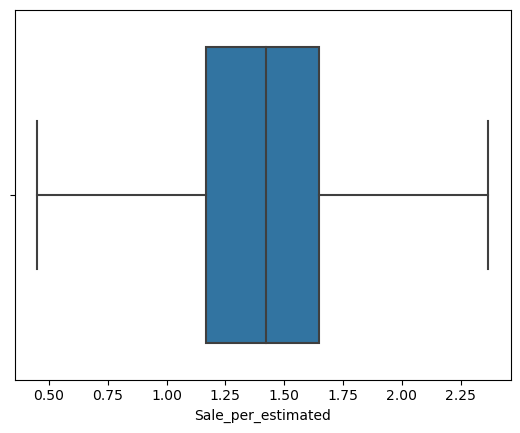

In [24]:
sns.boxplot(x=df['Sale_per_estimated'], showfliers=False)

In [25]:
df_help = df[df['Sale_per_estimated'].between(0.05,5, inclusive='both')].copy()
df_help['price_per_carpet'] = df_help['Sale Price'] / df['carpet_area']
df_help['estimated_per_carpet'] = df_help['Estimated Value'] / df['carpet_area']

In [26]:
df_imput = df_help.groupby(['Year','Locality','Residential']).agg(mean_price=('price_per_carpet','median'), mean_estimated_value=('estimated_per_carpet','median')).reset_index()

In [27]:
df_imput

,Year,Locality,Residential,mean_price,mean_estimated_value
0,2009,***Unknown***,Detached House,281.605184,66.340977
1,2009,Andover,Detached House,302.887915,210.722927
2,2009,Ansonia,Condominium,209.379503,102.986450
3,2009,Ansonia,Detached House,233.902566,105.374283
4,2009,Ansonia,Duplex,195.876289,76.928729
...,...,...,...,...,...
7081,2022,Woodbury,Detached House,360.221731,238.831856
7082,2022,Woodbury,Duplex,284.690799,200.557300
7083,2022,Woodstock,Condominium,203.555964,116.009728
7084,2022,Woodstock,Detached House,283.401463,164.395986


In [494]:
df = df.merge(df_imput, on=['Year','Locality','Residential'], how='left')

In [495]:
df['Estimated Value'] = np.where((df['Sale_per_estimated'] > 20) & (df['mean_estimated_value'].notnull()), df['mean_estimated_value'] * df['carpet_area'],df['Estimated Value'])
df['Sale Price'] = np.where(df['Sale_per_estimated'] < 0.1, df['mean_price'] * df['carpet_area'],df['Sale Price'])

In [496]:
df = df.drop(columns=['mean_price','mean_estimated_value','Sale_per_estimated'])

#### Remove outliers

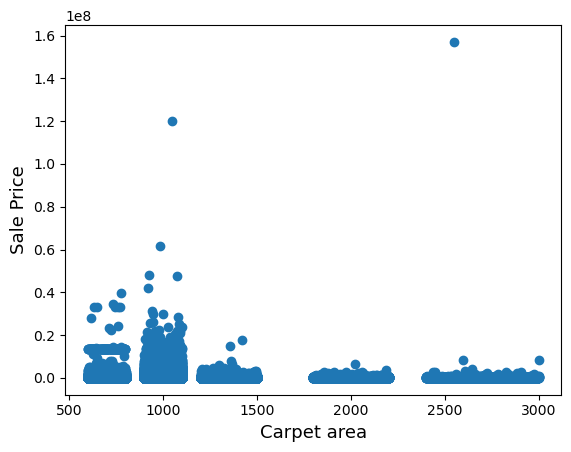

In [28]:
fig, ax = plt.subplots()
ax.scatter(x = df['carpet_area'], y = df['Sale Price'])
plt.ylabel('Sale Price', fontsize=13)
plt.xlabel('Carpet area', fontsize=13)
plt.show()

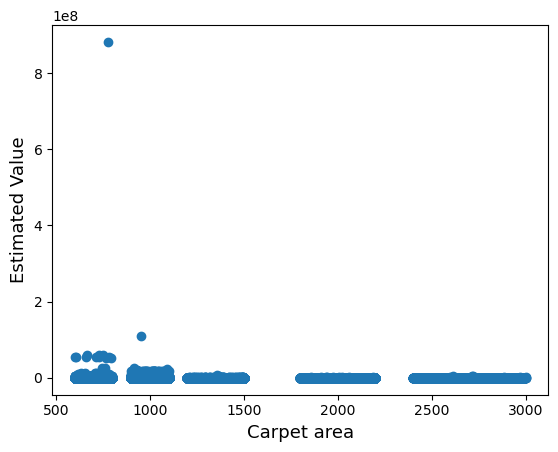

In [29]:
fig, ax = plt.subplots()
ax.scatter(x = df['carpet_area'], y = df['Estimated Value'])
plt.ylabel('Estimated Value', fontsize=13)
plt.xlabel('Carpet area', fontsize=13)
plt.show()

In [30]:
#Remove those where the sale price were outliers
df = df[df['Sale Price'] < 100000000]
#set estimated value to Sale price where Estimated value was outlier
df['Estimated Value'] = np.where(df['Estimated Value'] > 100000000, df['Sale Price'], df["Estimated Value"])

In [31]:
import plotly.express as px
fig = px.histogram(df, x="Year")
fig.show()

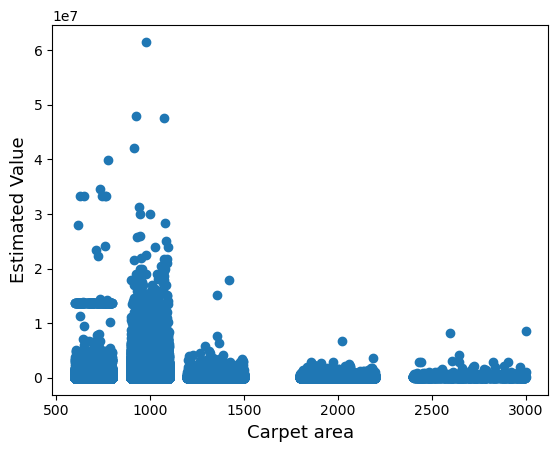

In [32]:
fig, ax = plt.subplots()
ax.scatter(x = df['carpet_area'], y = df['Sale Price'])
plt.ylabel('Estimated Value', fontsize=13)
plt.xlabel('Carpet area', fontsize=13)
plt.show()

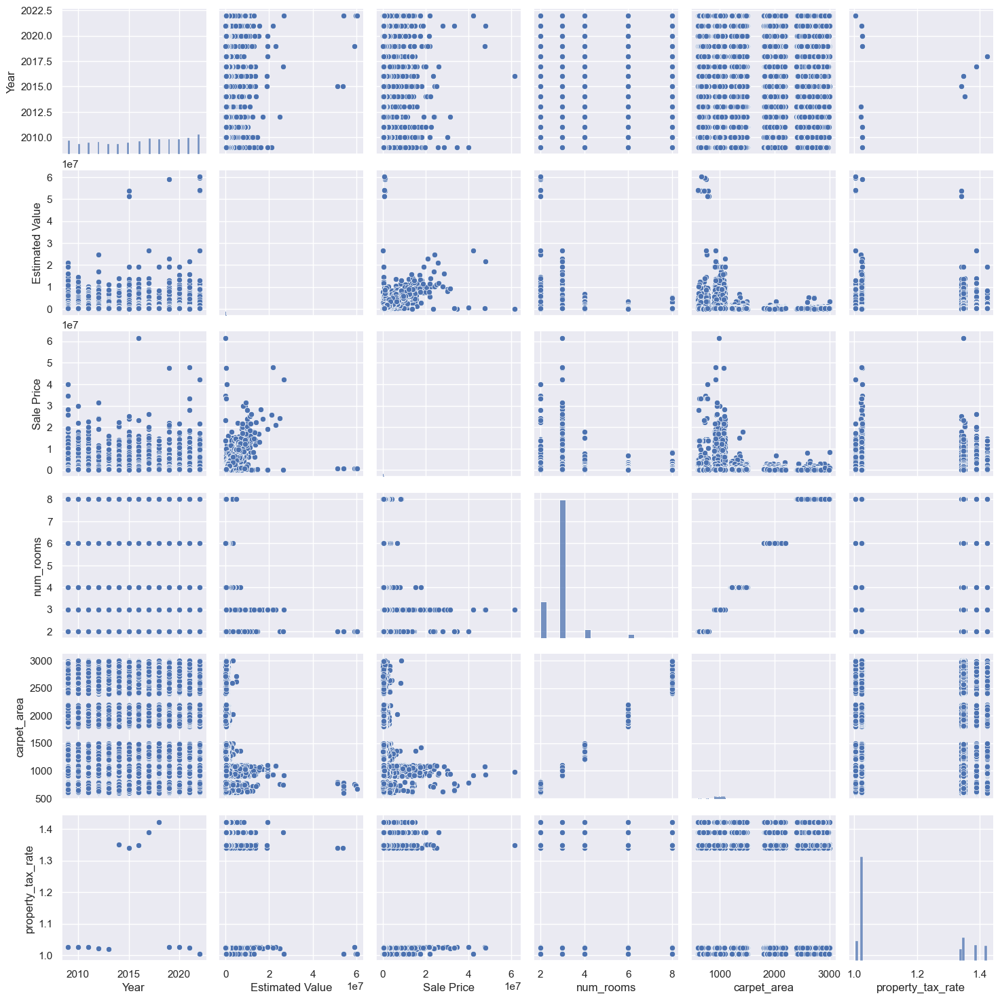

In [377]:
sns.set()
sns.pairplot(df, height = 2.5)
plt.show();

In [502]:
df['Gain'] = (df['Sale Price'] - df['Estimated Value']) / 100

<AxesSubplot:>

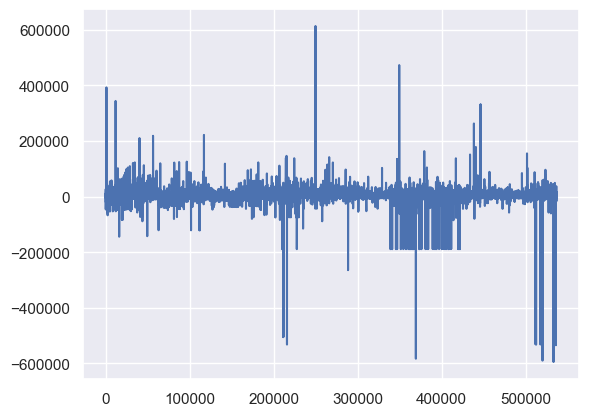

In [503]:
df['Gain'].plot()

### Target Variable Transform


 mu = 355186.55 and sigma = 622545.71



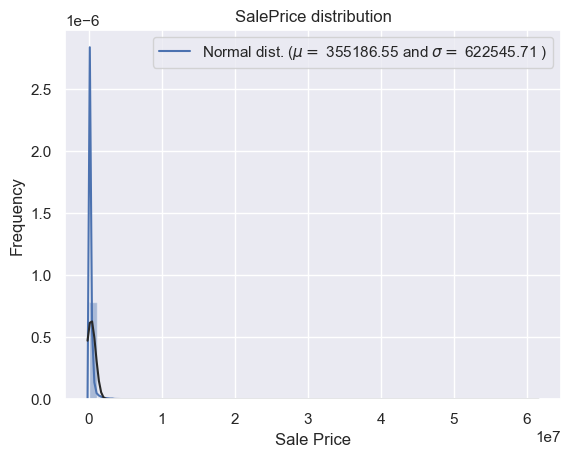

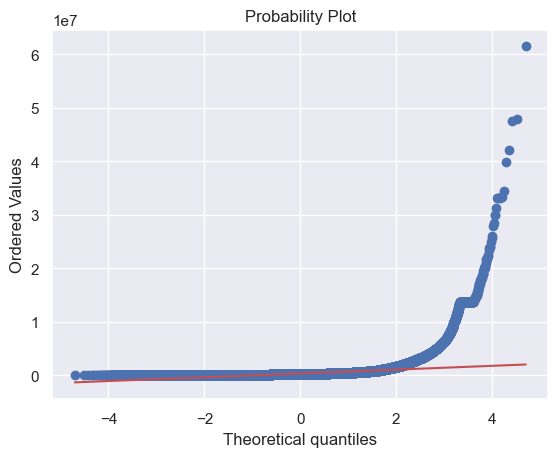

In [378]:
sns.distplot(df['Sale Price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Sale Price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Sale Price'], plot=plt)
plt.show()


 mu = 12.36 and sigma = 0.86



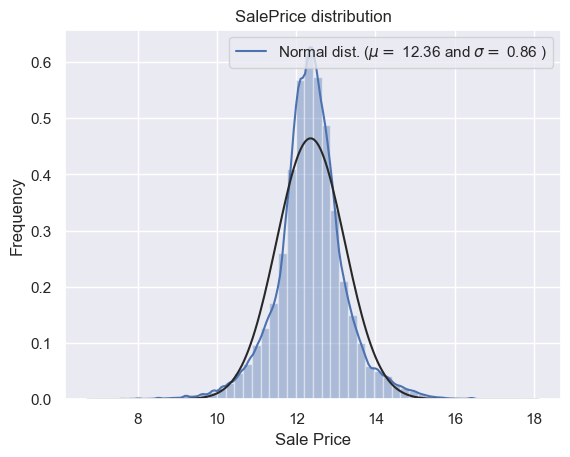

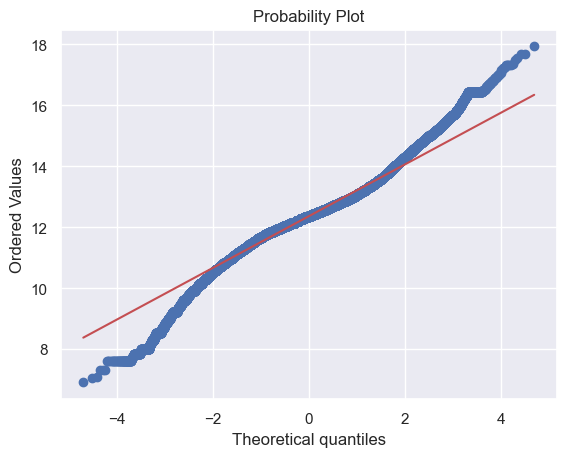

In [379]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
df["Sale Price"] = np.log1p(df["Sale Price"])

#Check the new distribution 
sns.distplot(df['Sale Price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Sale Price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Sale Price'], plot=plt)
plt.show()

### Feature Engineering

In [380]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 536816 entries, 0 to 536820
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Year               536816 non-null  int64  
 1   Date               536816 non-null  object 
 2   Locality           536816 non-null  object 
 3   Address            536816 non-null  object 
 4   Estimated Value    536816 non-null  float64
 5   Sale Price         536816 non-null  float64
 6   Property           536816 non-null  object 
 7   Residential        536816 non-null  object 
 8   num_rooms          536816 non-null  int64  
 9   carpet_area        536816 non-null  int64  
 10  property_tax_rate  536816 non-null  float64
dtypes: float64(3), int64(3), object(5)
memory usage: 65.3+ MB


In [381]:
df['num_rooms'] = df['num_rooms'].apply(str)

In [382]:
numeric_feats = df.dtypes[df.dtypes != "object"].index

# Check the skew of all numerical features
skewed_feats = df[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness.head(15)


Skew in numerical features: 



,Skew
Estimated Value,39.643119
carpet_area,2.801709
property_tax_rate,0.690451
Sale Price,-0.015582
Year,-0.222393



 mu = 250164.83 and sigma = 490663.45



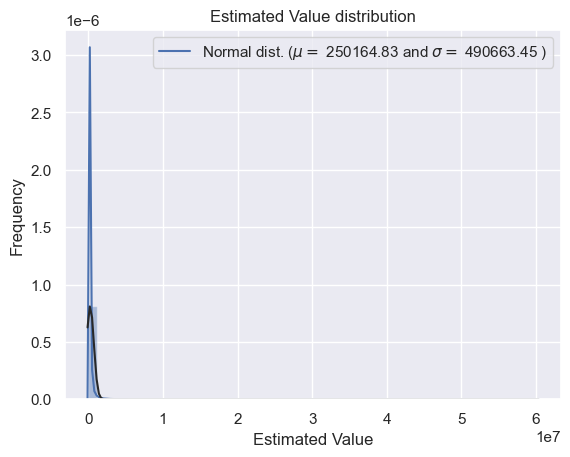

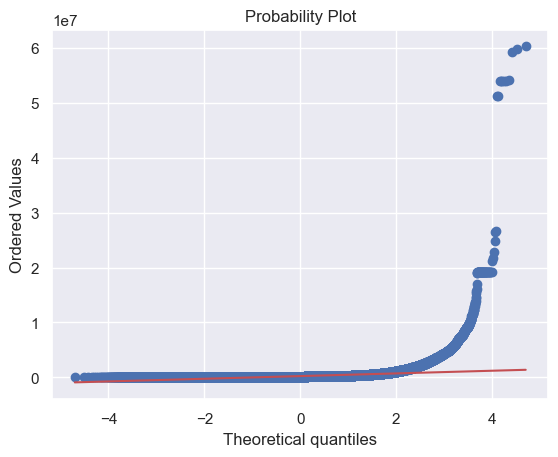

In [383]:
sns.distplot(df['Estimated Value'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Estimated Value'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Estimated Value distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Estimated Value'], plot=plt)
plt.show()


 mu = 12.36 and sigma = 0.86



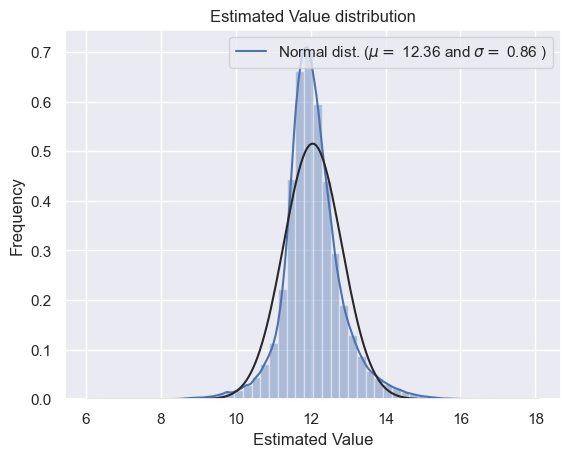

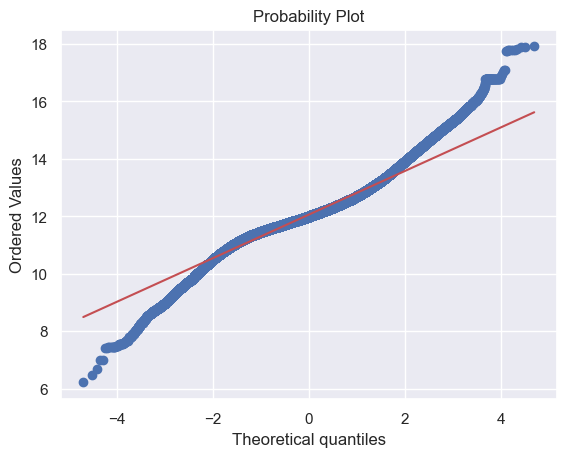

In [384]:
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
df["Estimated Value"] = np.log1p(df["Estimated Value"])

#Check the new distribution 
sns.distplot(df['Estimated Value'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(df['Sale Price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('Estimated Value distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(df['Estimated Value'], plot=plt)
plt.show()

<AxesSubplot:>

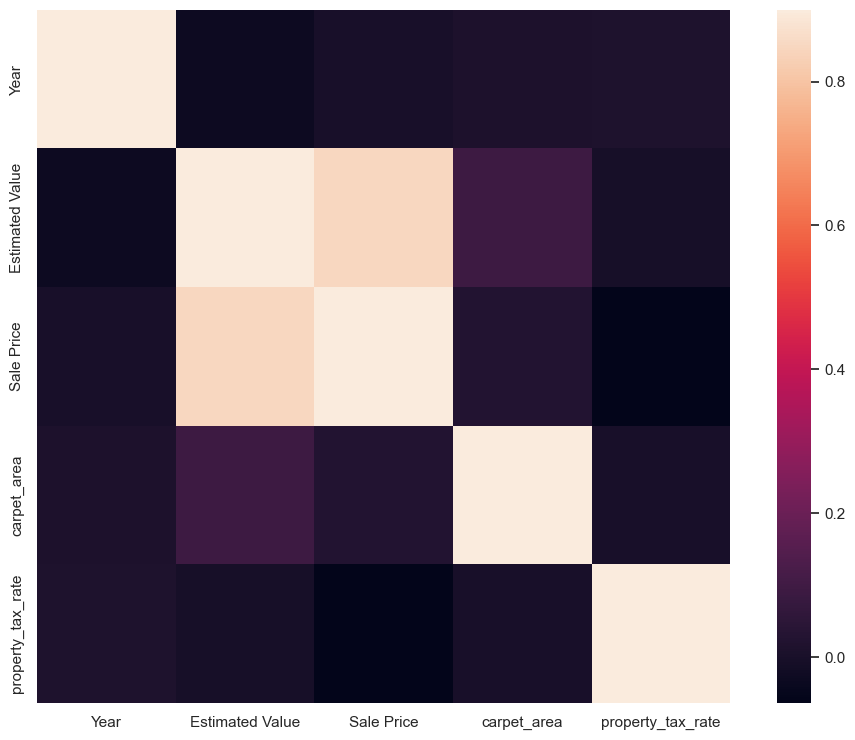

In [387]:
#Correlation map to see how features are correlated with SalePrice
corrmat = df.corr()
plt.subplots(figsize=(12,9))
sns.heatmap(corrmat, vmax=0.9, square=True)

In [388]:
#create feature to which month it was sold or valued
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month
#remove unknown from Locality
df = df.drop(df[df['Locality'] == '***Unknown***'].index)

#### Below we can generate a new feature which indicates the median price change compared to the previous year per locality (based on estimated value - it can be calculated on test set as well)

In [16]:
#df_price_area = df.groupby(['Year','Locality']).agg(median_value=('Estimated Value','median')).reset_index()
#df_price_area.sort_values(['Locality','Year'], inplace = True, ascending=[True, True])
#df_price_area['change_to_prev_year'] = (df_price_area.groupby('Locality')['median_value']
#                                  .apply(pd.Series.pct_change) * 100)
#df = df.merge(df_price_area,on=['Year','Locality'], how='left')
#df = df[df['Year'] >=2010]

,Year,Locality,median_value_per_area,change_to_prev_year
0,2009,Andover,1.772633,NaN
168,2010,Andover,1.742164,-1.718832
337,2011,Andover,1.748249,0.349254
505,2012,Andover,1.750036,0.102251
674,2013,Andover,1.741163,-0.507042


In [389]:
df = df.drop(columns=['Date','Year','Address','Residential','Month'])

In [390]:
df_encoded = pd.get_dummies(df, columns = ['Property','num_rooms'])

In [391]:
df_encoded

,Locality,Estimated Value,Sale Price,carpet_area,property_tax_rate,Property_Condo,Property_Four Family,Property_Residential,Property_Single Family,Property_Three Family,Property_Two Family,num_rooms_2,num_rooms_3,num_rooms_4,num_rooms_6,num_rooms_8
0,Greenwich,13.474809,13.790194,6.634633,1.025953,1,0,0,0,0,0,1,0,0,0,0
1,East Hampton,11.695005,12.154258,6.826545,1.025953,0,0,0,1,0,0,0,1,0,0,0
2,Ridgefield,13.111365,13.623140,6.890609,1.025953,0,0,0,1,0,0,0,1,0,0,0
3,Old Lyme,12.194005,13.017005,6.884487,1.025953,0,0,0,1,0,0,0,1,0,0,0
4,Naugatuck,11.565907,12.206078,6.854355,1.025953,0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536816,Enfield,11.715221,12.196027,6.917706,1.003979,0,0,1,0,0,0,0,1,0,0,0
536817,Naugatuck,11.843531,12.675767,6.907755,1.003979,0,0,1,0,0,0,0,1,0,0,0
536818,South Windsor,12.206078,12.628070,6.925595,1.003979,0,0,1,0,0,0,0,1,0,0,0
536819,Bloomfield,12.183014,12.509878,6.967909,1.003979,0,0,1,0,0,0,0,1,0,0,0


In [392]:
label_encoder = LabelEncoder()
df_encoded["Locality"] = label_encoder.fit_transform(df_encoded["Locality"])

In [393]:
df_encoded

,Locality,Estimated Value,Sale Price,carpet_area,property_tax_rate,Property_Condo,Property_Four Family,Property_Residential,Property_Single Family,Property_Three Family,Property_Two Family,num_rooms_2,num_rooms_3,num_rooms_4,num_rooms_6,num_rooms_8
0,56,13.474809,13.790194,6.634633,1.025953,1,0,0,0,0,0,1,0,0,0,0
1,40,11.695005,12.154258,6.826545,1.025953,0,0,0,1,0,0,0,1,0,0,0
2,117,13.111365,13.623140,6.890609,1.025953,0,0,0,1,0,0,0,1,0,0,0
3,104,12.194005,13.017005,6.884487,1.025953,0,0,0,1,0,0,0,1,0,0,0
4,87,11.565907,12.206078,6.854355,1.025953,0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536816,48,11.715221,12.196027,6.917706,1.003979,0,0,1,0,0,0,0,1,0,0,0
536817,87,11.843531,12.675767,6.907755,1.003979,0,0,1,0,0,0,0,1,0,0,0
536818,129,12.206078,12.628070,6.925595,1.003979,0,0,1,0,0,0,0,1,0,0,0
536819,10,12.183014,12.509878,6.967909,1.003979,0,0,1,0,0,0,0,1,0,0,0


### Summary

In [3]:
def train_test_load_transform(train_csv, test_csv):
    #LOAD FILES
    df_train = pd.read_csv(train_csv)
    df_test = pd.read_csv(test_csv)
    df_all = pd.concat([df_train,df_test])
    #drop duplicates
    df_train = df_train.drop_duplicates(subset=['Year','Locality','Address'])
    #imput estimated value or sale price where we have 0 values
    df_train['Sale Price'] = np.where(df_train['Sale Price'] == 0, df_train['Estimated Value'], df_train['Sale Price'])
    df_train['Estimated Value'] = np.where(df_train['Estimated Value'] == 0, df_train['Sale Price'], df_train['Estimated Value'])
    #we have many cases where the estimated value or the sale price not entered correctly - e.g. 1000 times higher prices
    df_train['Sale_per_estimated'] = df_train['Sale Price'] / df_train['Estimated Value']
    df_help = df_train[df_train['Sale_per_estimated'].between(0.01,2, inclusive='both')].copy()
    df_help['price_per_carpet'] = df_help['Sale Price'] / df_help['carpet_area']
    df_help['estimated_per_carpet'] = df_help['Estimated Value'] / df_help['carpet_area']
    df_imput = df_help.groupby(['Year','Locality','Residential']).agg(mean_price=('price_per_carpet','median'), mean_estimated_value=('estimated_per_carpet','median')).reset_index()
    #df_train = df_train.merge(df_imput, on=['Year','Locality','Residential'], how='left')
    #df_train['Estimated Value'] = np.where((df_train['Sale_per_estimated'] > 20) & (df_train['mean_estimated_value'].notnull()), df_train['mean_estimated_value'] * df_train['carpet_area'],df_train['Estimated Value'])
    #df_train['Sale Price'] = np.where(df_train['Sale_per_estimated'] < 0.1, df_train['mean_price'] * df_train['carpet_area'],df_train['Sale Price'])
    df_train = df_train[df_train['Sale_per_estimated'].between(0.02,2, inclusive='both')]
    df_train = df_train.drop(columns=['Sale_per_estimated','property_tax_rate'])
    #df_train = df_train.drop(columns=['mean_price','mean_estimated_value','Sale_per_estimated'])
    #Remove those where the sale price were outliers
    df_train = df_train[df_train['Sale Price'] < 100000000]
    #set estimated value to Sale price where Estimated value was outlier
    df_train['Estimated Value'] = np.where(df_train['Estimated Value'] > 100000000, df_train['Sale Price'], df_train["Estimated Value"])
    df_train['num_rooms'] = df_train['num_rooms'].apply(str)
    #test transform - imput low not realistic estimated values by the 2022 median estimated values * carpet_area
    df_imput_2022 = df_imput[df_imput['Year'] == 2022]
    df_test = df_test.merge(df_imput_2022[['Locality','Residential','mean_estimated_value']], on=['Locality','Residential'], how='left')
    df_test['Estimated Value'] = np.where(df_test['Estimated Value'] < 10000, df_test['carpet_area'] * df_test['mean_estimated_value'], df_test['Estimated Value'])
    df_test = df_test.drop(columns=['mean_estimated_value'])
    #transform the target variable
    df_train["Sale Price"] = np.log1p(df_train["Sale Price"])
    #transform the etimated value similarly to the target    
    df_train["Estimated Value"] = np.log1p(df_train["Estimated Value"])
    #transform the variable at the test set as well
    df_test["Estimated Value"] = np.log1p(df_test["Estimated Value"])
    df_train['carpet_area_category'] = pd.cut(df_train['carpet_area'], [0, 850, 1150,1600,2250,100000], labels=['0-850','850-1150','1150-1600','1600-2250','2250-more'])
    df_test['carpet_area_category'] = pd.cut(df_test['carpet_area'], [0, 850, 1150,1600,2250,100000], labels=['0-850','850-1150','1150-1600','1600-2250','2250-more'])
    #transform the carpet area 
    #df_train["carpet_area"] = np.log1p(df_train['carpet_area'])
    #df_test["carpet_area"] = np.log1p(df_test['carpet_area'])
    #create feature to which month it was sold or valued
    df_train['Date'] = pd.to_datetime(df_train['Date'])
    #df_train['Month'] = df_train['Date'].dt.month
    df_test['Date'] = pd.to_datetime(df_test['Date'])
    #df_test['Month'] = df_test['Date'].dt.month
    #remove unknown from Locality
    df_train = df_train.drop(df_train[df_train['Locality'] == '***Unknown***'].index)
    #create extra feature
    #df_price_area = df_all.groupby(['Year','Locality']).agg(median_value_per_area=('Estimated Value','median')).reset_index()
    #df_price_area.sort_values(['Locality','Year'], inplace = True, ascending=[True, True])
    #df_price_area['change_to_prev_year'] = (df_price_area.groupby(['Locality'])['median_value_per_area']
    #                          .apply(pd.Series.pct_change) * 100)
    #df_train = df_train.merge(df_price_area,on=['Year','Locality'], how='left')
    #df_test = df_test.merge(df_price_area,on=['Year','Locality'], how='left')
    #transform the new features as well
    #df_train["median_value_per_area"] = boxcox1p(df_train['median_value_per_area'], lam)
    #df_test["median_value_per_area"] = boxcox1p(df_test['median_value_per_area'], lam)
    #df_train['change_to_prev_year'] = np.where(df_train['change_to_prev_year'].isnull(), 0, df_train['change_to_prev_year'])
    #df_test['change_to_prev_year'] = np.where(df_test['change_to_prev_year'].isnull(), 0, df_test['change_to_prev_year'])
    #df_train["change_to_prev_year"] = boxcox1p(df_train['change_to_prev_year'], lam)
    #df_test["change_to_prev_year"] = boxcox1p(df_test['change_to_prev_year'], lam)
    #filter the dates
    #df_train = df_train[df_train['Year'] >=2011]
    #drop the features we do not need
    #Property is dropped because all the test data has the same value
    df_train = df_train.drop(columns=['Date','carpet_area','Address','Property','num_rooms'])
    df_test = df_test.drop(columns=['Date','carpet_area','Address','Property','property_tax_rate','num_rooms'])
    #encode the categorical features
    df_train = pd.get_dummies(df_train, columns = ['carpet_area_category','Residential'])
    df_test = pd.get_dummies(df_test, columns = ['carpet_area_category','Residential'])
    #label encode Locality, Residental, Property
    label_encoder = LabelEncoder()
    df_train["Locality"] = label_encoder.fit_transform(df_train["Locality"])
    df_test["Locality"] = label_encoder.transform(df_test["Locality"])
    #double check missing columns
    missing_columns = df_train.columns.difference(df_test.columns)
    df_test[missing_columns] = 0 #np.nan
    columns = df_train.columns
    df_test_final = df_test[columns]
    #remove target variables
    y_train = df_train['Sale Price']
    df_train = df_train.drop(columns=['Sale Price'])
    df_test_final = df_test_final.drop(columns=['Sale Price'])
    
    return df_train, df_test_final, y_train

### Modelling

In [4]:
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
import lightgbm as lgb

#### LightGBM

In [44]:
X, X_test, y = train_test_load_transform('train.csv','test.csv')

In [45]:
# split X and y into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.1, random_state = 0, shuffle=False)

In [74]:
hyper_params = {
    'metric': ['rmse'],
}

regressor= lgb.LGBMRegressor(**hyper_params)

In [92]:
%%time
from sklearn.model_selection import GridSearchCV
# set up our search grid
param_grid = {"max_depth":    [4,5,6],
              "n_estimators": [600, 700,800],
              "learning_rate": [0.1]}
# try out every combination of the above values
search = GridSearchCV(regressor, param_grid).fit(X_train, y_train,
        eval_set=[(X_val, y_val)],
        early_stopping_rounds=1000)

print("The best hyperparameters are ",search.best_params_)

[1]	valid_0's rmse: 0.779947
[2]	valid_0's rmse: 0.716634
[3]	valid_0's rmse: 0.660271
[4]	valid_0's rmse: 0.611402
[5]	valid_0's rmse: 0.568284
[6]	valid_0's rmse: 0.530355
[7]	valid_0's rmse: 0.498429
[8]	valid_0's rmse: 0.470459
[9]	valid_0's rmse: 0.446288
[10]	valid_0's rmse: 0.42469
[11]	valid_0's rmse: 0.406989
[12]	valid_0's rmse: 0.392428
[13]	valid_0's rmse: 0.379754
[14]	valid_0's rmse: 0.368895
[15]	valid_0's rmse: 0.359788
[16]	valid_0's rmse: 0.352224
[17]	valid_0's rmse: 0.345438
[18]	valid_0's rmse: 0.340503
[19]	valid_0's rmse: 0.335944
[20]	valid_0's rmse: 0.331683
[21]	valid_0's rmse: 0.328251
[22]	valid_0's rmse: 0.325329
[23]	valid_0's rmse: 0.323433
[24]	valid_0's rmse: 0.32119
[25]	valid_0's rmse: 0.319562
[26]	valid_0's rmse: 0.318052
[27]	valid_0's rmse: 0.316257
[28]	valid_0's rmse: 0.314861
[29]	valid_0's rmse: 0.314002
[30]	valid_0's rmse: 0.313354
[31]	valid_0's rmse: 0.312181
[32]	valid_0's rmse: 0.311705
[33]	valid_0's rmse: 0.311359
[34]	valid_0's rmse: 

[322]	valid_0's rmse: 0.299222
[323]	valid_0's rmse: 0.29922
[324]	valid_0's rmse: 0.299228
[325]	valid_0's rmse: 0.299247
[326]	valid_0's rmse: 0.299243
[327]	valid_0's rmse: 0.299228
[328]	valid_0's rmse: 0.299203
[329]	valid_0's rmse: 0.299209
[330]	valid_0's rmse: 0.299208
[331]	valid_0's rmse: 0.29921
[332]	valid_0's rmse: 0.299212
[333]	valid_0's rmse: 0.299211
[334]	valid_0's rmse: 0.299195
[335]	valid_0's rmse: 0.299181
[336]	valid_0's rmse: 0.299169
[337]	valid_0's rmse: 0.299162
[338]	valid_0's rmse: 0.299161
[339]	valid_0's rmse: 0.299171
[340]	valid_0's rmse: 0.299141
[341]	valid_0's rmse: 0.299159
[342]	valid_0's rmse: 0.299154
[343]	valid_0's rmse: 0.299147
[344]	valid_0's rmse: 0.29914
[345]	valid_0's rmse: 0.299145
[346]	valid_0's rmse: 0.299136
[347]	valid_0's rmse: 0.299139
[348]	valid_0's rmse: 0.299146
[349]	valid_0's rmse: 0.299152
[350]	valid_0's rmse: 0.299154
[351]	valid_0's rmse: 0.299149
[352]	valid_0's rmse: 0.299146
[353]	valid_0's rmse: 0.299138
[354]	valid

[1]	valid_0's rmse: 0.770784
[2]	valid_0's rmse: 0.706732
[3]	valid_0's rmse: 0.650135
[4]	valid_0's rmse: 0.600594
[5]	valid_0's rmse: 0.557266
[6]	valid_0's rmse: 0.519798
[7]	valid_0's rmse: 0.487493
[8]	valid_0's rmse: 0.459743
[9]	valid_0's rmse: 0.436349
[10]	valid_0's rmse: 0.416371
[11]	valid_0's rmse: 0.399102
[12]	valid_0's rmse: 0.384843
[13]	valid_0's rmse: 0.3731
[14]	valid_0's rmse: 0.363056
[15]	valid_0's rmse: 0.354468
[16]	valid_0's rmse: 0.347418
[17]	valid_0's rmse: 0.341565
[18]	valid_0's rmse: 0.336401
[19]	valid_0's rmse: 0.332822
[20]	valid_0's rmse: 0.329329
[21]	valid_0's rmse: 0.326384
[22]	valid_0's rmse: 0.323477
[23]	valid_0's rmse: 0.321259
[24]	valid_0's rmse: 0.319288
[25]	valid_0's rmse: 0.317884
[26]	valid_0's rmse: 0.316187
[27]	valid_0's rmse: 0.315224
[28]	valid_0's rmse: 0.314182
[29]	valid_0's rmse: 0.312634
[30]	valid_0's rmse: 0.31174
[31]	valid_0's rmse: 0.311022
[32]	valid_0's rmse: 0.310552
[33]	valid_0's rmse: 0.309859
[34]	valid_0's rmse: 0

[272]	valid_0's rmse: 0.298966
[273]	valid_0's rmse: 0.298968
[274]	valid_0's rmse: 0.298967
[275]	valid_0's rmse: 0.298948
[276]	valid_0's rmse: 0.298939
[277]	valid_0's rmse: 0.298909
[278]	valid_0's rmse: 0.298909
[279]	valid_0's rmse: 0.298887
[280]	valid_0's rmse: 0.298889
[281]	valid_0's rmse: 0.29889
[282]	valid_0's rmse: 0.298894
[283]	valid_0's rmse: 0.298882
[284]	valid_0's rmse: 0.298881
[285]	valid_0's rmse: 0.29889
[286]	valid_0's rmse: 0.298899
[287]	valid_0's rmse: 0.298907
[288]	valid_0's rmse: 0.298902
[289]	valid_0's rmse: 0.298913
[290]	valid_0's rmse: 0.29891
[291]	valid_0's rmse: 0.298911
[292]	valid_0's rmse: 0.298896
[293]	valid_0's rmse: 0.298889
[294]	valid_0's rmse: 0.298876
[295]	valid_0's rmse: 0.298894
[296]	valid_0's rmse: 0.298904
[297]	valid_0's rmse: 0.298925
[298]	valid_0's rmse: 0.298917
[299]	valid_0's rmse: 0.298916
[300]	valid_0's rmse: 0.298909
[301]	valid_0's rmse: 0.298907
[302]	valid_0's rmse: 0.298907
[303]	valid_0's rmse: 0.2989
[304]	valid_0

[1]	valid_0's rmse: 0.771832
[2]	valid_0's rmse: 0.709313
[3]	valid_0's rmse: 0.654142
[4]	valid_0's rmse: 0.605868
[5]	valid_0's rmse: 0.56353
[6]	valid_0's rmse: 0.526868
[7]	valid_0's rmse: 0.494983
[8]	valid_0's rmse: 0.467376
[9]	valid_0's rmse: 0.444211
[10]	valid_0's rmse: 0.424142
[11]	valid_0's rmse: 0.406479
[12]	valid_0's rmse: 0.392796
[13]	valid_0's rmse: 0.38076
[14]	valid_0's rmse: 0.370801
[15]	valid_0's rmse: 0.361891
[16]	valid_0's rmse: 0.354193
[17]	valid_0's rmse: 0.348542
[18]	valid_0's rmse: 0.342996
[19]	valid_0's rmse: 0.338992
[20]	valid_0's rmse: 0.335196
[21]	valid_0's rmse: 0.331562
[22]	valid_0's rmse: 0.328352
[23]	valid_0's rmse: 0.326773
[24]	valid_0's rmse: 0.324464
[25]	valid_0's rmse: 0.323025
[26]	valid_0's rmse: 0.321078
[27]	valid_0's rmse: 0.319331
[28]	valid_0's rmse: 0.317661
[29]	valid_0's rmse: 0.31658
[30]	valid_0's rmse: 0.315611
[31]	valid_0's rmse: 0.314428
[32]	valid_0's rmse: 0.313424
[33]	valid_0's rmse: 0.312105
[34]	valid_0's rmse: 0

[322]	valid_0's rmse: 0.299084
[323]	valid_0's rmse: 0.299045
[324]	valid_0's rmse: 0.299037
[325]	valid_0's rmse: 0.299021
[326]	valid_0's rmse: 0.299039
[327]	valid_0's rmse: 0.299039
[328]	valid_0's rmse: 0.299049
[329]	valid_0's rmse: 0.299058
[330]	valid_0's rmse: 0.299045
[331]	valid_0's rmse: 0.299041
[332]	valid_0's rmse: 0.299064
[333]	valid_0's rmse: 0.299044
[334]	valid_0's rmse: 0.299035
[335]	valid_0's rmse: 0.299014
[336]	valid_0's rmse: 0.299005
[337]	valid_0's rmse: 0.299
[338]	valid_0's rmse: 0.299009
[339]	valid_0's rmse: 0.29901
[340]	valid_0's rmse: 0.299018
[341]	valid_0's rmse: 0.299023
[342]	valid_0's rmse: 0.299025
[343]	valid_0's rmse: 0.299018
[344]	valid_0's rmse: 0.299016
[345]	valid_0's rmse: 0.29901
[346]	valid_0's rmse: 0.299022
[347]	valid_0's rmse: 0.299018
[348]	valid_0's rmse: 0.299007
[349]	valid_0's rmse: 0.299014
[350]	valid_0's rmse: 0.298984
[351]	valid_0's rmse: 0.298981
[352]	valid_0's rmse: 0.298963
[353]	valid_0's rmse: 0.298951
[354]	valid_0

[1]	valid_0's rmse: 0.77127
[2]	valid_0's rmse: 0.708423
[3]	valid_0's rmse: 0.65315
[4]	valid_0's rmse: 0.604889
[5]	valid_0's rmse: 0.563847
[6]	valid_0's rmse: 0.527779
[7]	valid_0's rmse: 0.496246
[8]	valid_0's rmse: 0.469625
[9]	valid_0's rmse: 0.445892
[10]	valid_0's rmse: 0.425424
[11]	valid_0's rmse: 0.40902
[12]	valid_0's rmse: 0.394174
[13]	valid_0's rmse: 0.381783
[14]	valid_0's rmse: 0.372708
[15]	valid_0's rmse: 0.364483
[16]	valid_0's rmse: 0.356572
[17]	valid_0's rmse: 0.349571
[18]	valid_0's rmse: 0.345323
[19]	valid_0's rmse: 0.339845
[20]	valid_0's rmse: 0.335717
[21]	valid_0's rmse: 0.332051
[22]	valid_0's rmse: 0.329416
[23]	valid_0's rmse: 0.326028
[24]	valid_0's rmse: 0.323415
[25]	valid_0's rmse: 0.321312
[26]	valid_0's rmse: 0.319761
[27]	valid_0's rmse: 0.318204
[28]	valid_0's rmse: 0.31744
[29]	valid_0's rmse: 0.316519
[30]	valid_0's rmse: 0.315497
[31]	valid_0's rmse: 0.314154
[32]	valid_0's rmse: 0.313324
[33]	valid_0's rmse: 0.312461
[34]	valid_0's rmse: 0.

[295]	valid_0's rmse: 0.299194
[296]	valid_0's rmse: 0.299197
[297]	valid_0's rmse: 0.299195
[298]	valid_0's rmse: 0.299206
[299]	valid_0's rmse: 0.299167
[300]	valid_0's rmse: 0.299165
[301]	valid_0's rmse: 0.299167
[302]	valid_0's rmse: 0.29917
[303]	valid_0's rmse: 0.299176
[304]	valid_0's rmse: 0.299142
[305]	valid_0's rmse: 0.299143
[306]	valid_0's rmse: 0.299137
[307]	valid_0's rmse: 0.299142
[308]	valid_0's rmse: 0.299121
[309]	valid_0's rmse: 0.299111
[310]	valid_0's rmse: 0.299108
[311]	valid_0's rmse: 0.299082
[312]	valid_0's rmse: 0.299085
[313]	valid_0's rmse: 0.299086
[314]	valid_0's rmse: 0.299063
[315]	valid_0's rmse: 0.299069
[316]	valid_0's rmse: 0.299068
[317]	valid_0's rmse: 0.299072
[318]	valid_0's rmse: 0.299084
[319]	valid_0's rmse: 0.299089
[320]	valid_0's rmse: 0.299058
[321]	valid_0's rmse: 0.299043
[322]	valid_0's rmse: 0.299056
[323]	valid_0's rmse: 0.299043
[324]	valid_0's rmse: 0.299046
[325]	valid_0's rmse: 0.299023
[326]	valid_0's rmse: 0.299007
[327]	val

[1]	valid_0's rmse: 0.775341
[2]	valid_0's rmse: 0.711833
[3]	valid_0's rmse: 0.656386
[4]	valid_0's rmse: 0.607826
[5]	valid_0's rmse: 0.565777
[6]	valid_0's rmse: 0.529649
[7]	valid_0's rmse: 0.498874
[8]	valid_0's rmse: 0.472657
[9]	valid_0's rmse: 0.450543
[10]	valid_0's rmse: 0.43136
[11]	valid_0's rmse: 0.415441
[12]	valid_0's rmse: 0.401725
[13]	valid_0's rmse: 0.391656
[14]	valid_0's rmse: 0.383113
[15]	valid_0's rmse: 0.376231
[16]	valid_0's rmse: 0.369845
[17]	valid_0's rmse: 0.364487
[18]	valid_0's rmse: 0.359761
[19]	valid_0's rmse: 0.355799
[20]	valid_0's rmse: 0.353005
[21]	valid_0's rmse: 0.351234
[22]	valid_0's rmse: 0.348466
[23]	valid_0's rmse: 0.346176
[24]	valid_0's rmse: 0.343913
[25]	valid_0's rmse: 0.342779
[26]	valid_0's rmse: 0.342238
[27]	valid_0's rmse: 0.341354
[28]	valid_0's rmse: 0.339975
[29]	valid_0's rmse: 0.33781
[30]	valid_0's rmse: 0.3378
[31]	valid_0's rmse: 0.336277
[32]	valid_0's rmse: 0.336066
[33]	valid_0's rmse: 0.33542
[34]	valid_0's rmse: 0.3

[309]	valid_0's rmse: 0.316529
[310]	valid_0's rmse: 0.316527
[311]	valid_0's rmse: 0.316495
[312]	valid_0's rmse: 0.316498
[313]	valid_0's rmse: 0.316524
[314]	valid_0's rmse: 0.316518
[315]	valid_0's rmse: 0.316511
[316]	valid_0's rmse: 0.316521
[317]	valid_0's rmse: 0.316524
[318]	valid_0's rmse: 0.316505
[319]	valid_0's rmse: 0.316508
[320]	valid_0's rmse: 0.316511
[321]	valid_0's rmse: 0.316489
[322]	valid_0's rmse: 0.316504
[323]	valid_0's rmse: 0.316501
[324]	valid_0's rmse: 0.316472
[325]	valid_0's rmse: 0.316461
[326]	valid_0's rmse: 0.31646
[327]	valid_0's rmse: 0.316431
[328]	valid_0's rmse: 0.316442
[329]	valid_0's rmse: 0.316402
[330]	valid_0's rmse: 0.316354
[331]	valid_0's rmse: 0.316366
[332]	valid_0's rmse: 0.316357
[333]	valid_0's rmse: 0.316317
[334]	valid_0's rmse: 0.316332
[335]	valid_0's rmse: 0.316334
[336]	valid_0's rmse: 0.316335
[337]	valid_0's rmse: 0.316328
[338]	valid_0's rmse: 0.316331
[339]	valid_0's rmse: 0.316374
[340]	valid_0's rmse: 0.316378
[341]	val

[584]	valid_0's rmse: 0.315559
[585]	valid_0's rmse: 0.315552
[586]	valid_0's rmse: 0.315548
[587]	valid_0's rmse: 0.31556
[588]	valid_0's rmse: 0.31556
[589]	valid_0's rmse: 0.31559
[590]	valid_0's rmse: 0.315582
[591]	valid_0's rmse: 0.31558
[592]	valid_0's rmse: 0.3156
[593]	valid_0's rmse: 0.315595
[594]	valid_0's rmse: 0.315583
[595]	valid_0's rmse: 0.315587
[596]	valid_0's rmse: 0.315591
[597]	valid_0's rmse: 0.315581
[598]	valid_0's rmse: 0.31557
[599]	valid_0's rmse: 0.315569
[600]	valid_0's rmse: 0.315574
[1]	valid_0's rmse: 0.779947
[2]	valid_0's rmse: 0.716634
[3]	valid_0's rmse: 0.660271
[4]	valid_0's rmse: 0.611402
[5]	valid_0's rmse: 0.568284
[6]	valid_0's rmse: 0.530355
[7]	valid_0's rmse: 0.498429
[8]	valid_0's rmse: 0.470459
[9]	valid_0's rmse: 0.446288
[10]	valid_0's rmse: 0.42469
[11]	valid_0's rmse: 0.406989
[12]	valid_0's rmse: 0.392428
[13]	valid_0's rmse: 0.379754
[14]	valid_0's rmse: 0.368895
[15]	valid_0's rmse: 0.359788
[16]	valid_0's rmse: 0.352224
[17]	valid

[265]	valid_0's rmse: 0.299449
[266]	valid_0's rmse: 0.299456
[267]	valid_0's rmse: 0.29946
[268]	valid_0's rmse: 0.299468
[269]	valid_0's rmse: 0.299467
[270]	valid_0's rmse: 0.299448
[271]	valid_0's rmse: 0.299446
[272]	valid_0's rmse: 0.299448
[273]	valid_0's rmse: 0.299448
[274]	valid_0's rmse: 0.299441
[275]	valid_0's rmse: 0.299428
[276]	valid_0's rmse: 0.29941
[277]	valid_0's rmse: 0.299398
[278]	valid_0's rmse: 0.299403
[279]	valid_0's rmse: 0.2994
[280]	valid_0's rmse: 0.299352
[281]	valid_0's rmse: 0.299351
[282]	valid_0's rmse: 0.299351
[283]	valid_0's rmse: 0.299338
[284]	valid_0's rmse: 0.299326
[285]	valid_0's rmse: 0.299321
[286]	valid_0's rmse: 0.299324
[287]	valid_0's rmse: 0.299317
[288]	valid_0's rmse: 0.299313
[289]	valid_0's rmse: 0.299312
[290]	valid_0's rmse: 0.299327
[291]	valid_0's rmse: 0.29932
[292]	valid_0's rmse: 0.299334
[293]	valid_0's rmse: 0.299341
[294]	valid_0's rmse: 0.299325
[295]	valid_0's rmse: 0.299325
[296]	valid_0's rmse: 0.299338
[297]	valid_0

[533]	valid_0's rmse: 0.29909
[534]	valid_0's rmse: 0.299091
[535]	valid_0's rmse: 0.299131
[536]	valid_0's rmse: 0.299135
[537]	valid_0's rmse: 0.299133
[538]	valid_0's rmse: 0.299131
[539]	valid_0's rmse: 0.299124
[540]	valid_0's rmse: 0.299127
[541]	valid_0's rmse: 0.29913
[542]	valid_0's rmse: 0.299128
[543]	valid_0's rmse: 0.299124
[544]	valid_0's rmse: 0.299121
[545]	valid_0's rmse: 0.299114
[546]	valid_0's rmse: 0.299112
[547]	valid_0's rmse: 0.299118
[548]	valid_0's rmse: 0.299118
[549]	valid_0's rmse: 0.299104
[550]	valid_0's rmse: 0.299108
[551]	valid_0's rmse: 0.299108
[552]	valid_0's rmse: 0.299109
[553]	valid_0's rmse: 0.299111
[554]	valid_0's rmse: 0.299112
[555]	valid_0's rmse: 0.29912
[556]	valid_0's rmse: 0.299121
[557]	valid_0's rmse: 0.299095
[558]	valid_0's rmse: 0.299094
[559]	valid_0's rmse: 0.299099
[560]	valid_0's rmse: 0.2991
[561]	valid_0's rmse: 0.299101
[562]	valid_0's rmse: 0.299102
[563]	valid_0's rmse: 0.299093
[564]	valid_0's rmse: 0.299095
[565]	valid_0

[152]	valid_0's rmse: 0.299594
[153]	valid_0's rmse: 0.299561
[154]	valid_0's rmse: 0.299555
[155]	valid_0's rmse: 0.299567
[156]	valid_0's rmse: 0.299592
[157]	valid_0's rmse: 0.299558
[158]	valid_0's rmse: 0.299565
[159]	valid_0's rmse: 0.299553
[160]	valid_0's rmse: 0.299565
[161]	valid_0's rmse: 0.299565
[162]	valid_0's rmse: 0.299573
[163]	valid_0's rmse: 0.29957
[164]	valid_0's rmse: 0.299515
[165]	valid_0's rmse: 0.299537
[166]	valid_0's rmse: 0.299509
[167]	valid_0's rmse: 0.299537
[168]	valid_0's rmse: 0.299505
[169]	valid_0's rmse: 0.299489
[170]	valid_0's rmse: 0.299493
[171]	valid_0's rmse: 0.299478
[172]	valid_0's rmse: 0.299472
[173]	valid_0's rmse: 0.299458
[174]	valid_0's rmse: 0.299403
[175]	valid_0's rmse: 0.299421
[176]	valid_0's rmse: 0.299424
[177]	valid_0's rmse: 0.299429
[178]	valid_0's rmse: 0.299455
[179]	valid_0's rmse: 0.299405
[180]	valid_0's rmse: 0.299417
[181]	valid_0's rmse: 0.299395
[182]	valid_0's rmse: 0.299381
[183]	valid_0's rmse: 0.299349
[184]	val

[446]	valid_0's rmse: 0.298627
[447]	valid_0's rmse: 0.29861
[448]	valid_0's rmse: 0.298606
[449]	valid_0's rmse: 0.298612
[450]	valid_0's rmse: 0.29861
[451]	valid_0's rmse: 0.298616
[452]	valid_0's rmse: 0.298622
[453]	valid_0's rmse: 0.298616
[454]	valid_0's rmse: 0.298617
[455]	valid_0's rmse: 0.298613
[456]	valid_0's rmse: 0.298594
[457]	valid_0's rmse: 0.298602
[458]	valid_0's rmse: 0.298585
[459]	valid_0's rmse: 0.298574
[460]	valid_0's rmse: 0.298584
[461]	valid_0's rmse: 0.298585
[462]	valid_0's rmse: 0.298587
[463]	valid_0's rmse: 0.298586
[464]	valid_0's rmse: 0.298589
[465]	valid_0's rmse: 0.298597
[466]	valid_0's rmse: 0.298592
[467]	valid_0's rmse: 0.298603
[468]	valid_0's rmse: 0.298604
[469]	valid_0's rmse: 0.29861
[470]	valid_0's rmse: 0.298607
[471]	valid_0's rmse: 0.298618
[472]	valid_0's rmse: 0.298612
[473]	valid_0's rmse: 0.298614
[474]	valid_0's rmse: 0.298618
[475]	valid_0's rmse: 0.298608
[476]	valid_0's rmse: 0.298589
[477]	valid_0's rmse: 0.29859
[478]	valid_

[56]	valid_0's rmse: 0.303509
[57]	valid_0's rmse: 0.303252
[58]	valid_0's rmse: 0.303148
[59]	valid_0's rmse: 0.303096
[60]	valid_0's rmse: 0.302964
[61]	valid_0's rmse: 0.302596
[62]	valid_0's rmse: 0.30255
[63]	valid_0's rmse: 0.302245
[64]	valid_0's rmse: 0.302176
[65]	valid_0's rmse: 0.302072
[66]	valid_0's rmse: 0.302028
[67]	valid_0's rmse: 0.301979
[68]	valid_0's rmse: 0.302008
[69]	valid_0's rmse: 0.301928
[70]	valid_0's rmse: 0.301867
[71]	valid_0's rmse: 0.301824
[72]	valid_0's rmse: 0.301789
[73]	valid_0's rmse: 0.301684
[74]	valid_0's rmse: 0.301636
[75]	valid_0's rmse: 0.30146
[76]	valid_0's rmse: 0.301433
[77]	valid_0's rmse: 0.301178
[78]	valid_0's rmse: 0.301115
[79]	valid_0's rmse: 0.301115
[80]	valid_0's rmse: 0.301086
[81]	valid_0's rmse: 0.301054
[82]	valid_0's rmse: 0.300883
[83]	valid_0's rmse: 0.300864
[84]	valid_0's rmse: 0.300898
[85]	valid_0's rmse: 0.300909
[86]	valid_0's rmse: 0.300897
[87]	valid_0's rmse: 0.30091
[88]	valid_0's rmse: 0.300858
[89]	valid_0'

[344]	valid_0's rmse: 0.299016
[345]	valid_0's rmse: 0.29901
[346]	valid_0's rmse: 0.299022
[347]	valid_0's rmse: 0.299018
[348]	valid_0's rmse: 0.299007
[349]	valid_0's rmse: 0.299014
[350]	valid_0's rmse: 0.298984
[351]	valid_0's rmse: 0.298981
[352]	valid_0's rmse: 0.298963
[353]	valid_0's rmse: 0.298951
[354]	valid_0's rmse: 0.298951
[355]	valid_0's rmse: 0.298956
[356]	valid_0's rmse: 0.298938
[357]	valid_0's rmse: 0.298954
[358]	valid_0's rmse: 0.298964
[359]	valid_0's rmse: 0.298973
[360]	valid_0's rmse: 0.298949
[361]	valid_0's rmse: 0.298953
[362]	valid_0's rmse: 0.298965
[363]	valid_0's rmse: 0.29897
[364]	valid_0's rmse: 0.298973
[365]	valid_0's rmse: 0.298953
[366]	valid_0's rmse: 0.29895
[367]	valid_0's rmse: 0.298949
[368]	valid_0's rmse: 0.29895
[369]	valid_0's rmse: 0.298956
[370]	valid_0's rmse: 0.298943
[371]	valid_0's rmse: 0.298952
[372]	valid_0's rmse: 0.298947
[373]	valid_0's rmse: 0.298979
[374]	valid_0's rmse: 0.298967
[375]	valid_0's rmse: 0.298971
[376]	valid_

[626]	valid_0's rmse: 0.298725
[627]	valid_0's rmse: 0.298707
[628]	valid_0's rmse: 0.298708
[629]	valid_0's rmse: 0.298702
[630]	valid_0's rmse: 0.298709
[631]	valid_0's rmse: 0.298713
[632]	valid_0's rmse: 0.29871
[633]	valid_0's rmse: 0.298714
[634]	valid_0's rmse: 0.298715
[635]	valid_0's rmse: 0.298716
[636]	valid_0's rmse: 0.298716
[637]	valid_0's rmse: 0.298714
[638]	valid_0's rmse: 0.298713
[639]	valid_0's rmse: 0.298713
[640]	valid_0's rmse: 0.298698
[641]	valid_0's rmse: 0.298698
[642]	valid_0's rmse: 0.298701
[643]	valid_0's rmse: 0.29869
[644]	valid_0's rmse: 0.298675
[645]	valid_0's rmse: 0.298681
[646]	valid_0's rmse: 0.298691
[647]	valid_0's rmse: 0.298697
[648]	valid_0's rmse: 0.298727
[649]	valid_0's rmse: 0.298719
[650]	valid_0's rmse: 0.298724
[651]	valid_0's rmse: 0.298749
[652]	valid_0's rmse: 0.298749
[653]	valid_0's rmse: 0.298771
[654]	valid_0's rmse: 0.298764
[655]	valid_0's rmse: 0.298758
[656]	valid_0's rmse: 0.298739
[657]	valid_0's rmse: 0.298719
[658]	vali

[225]	valid_0's rmse: 0.299535
[226]	valid_0's rmse: 0.299558
[227]	valid_0's rmse: 0.299525
[228]	valid_0's rmse: 0.299525
[229]	valid_0's rmse: 0.299481
[230]	valid_0's rmse: 0.299482
[231]	valid_0's rmse: 0.299481
[232]	valid_0's rmse: 0.299501
[233]	valid_0's rmse: 0.299464
[234]	valid_0's rmse: 0.299479
[235]	valid_0's rmse: 0.299466
[236]	valid_0's rmse: 0.299402
[237]	valid_0's rmse: 0.29941
[238]	valid_0's rmse: 0.299406
[239]	valid_0's rmse: 0.299418
[240]	valid_0's rmse: 0.299423
[241]	valid_0's rmse: 0.299421
[242]	valid_0's rmse: 0.299379
[243]	valid_0's rmse: 0.299383
[244]	valid_0's rmse: 0.299356
[245]	valid_0's rmse: 0.29936
[246]	valid_0's rmse: 0.299376
[247]	valid_0's rmse: 0.299365
[248]	valid_0's rmse: 0.299334
[249]	valid_0's rmse: 0.299322
[250]	valid_0's rmse: 0.299322
[251]	valid_0's rmse: 0.299361
[252]	valid_0's rmse: 0.299367
[253]	valid_0's rmse: 0.29937
[254]	valid_0's rmse: 0.299348
[255]	valid_0's rmse: 0.299353
[256]	valid_0's rmse: 0.299318
[257]	valid

[512]	valid_0's rmse: 0.298579
[513]	valid_0's rmse: 0.298575
[514]	valid_0's rmse: 0.298578
[515]	valid_0's rmse: 0.298572
[516]	valid_0's rmse: 0.298567
[517]	valid_0's rmse: 0.29857
[518]	valid_0's rmse: 0.298582
[519]	valid_0's rmse: 0.298562
[520]	valid_0's rmse: 0.298578
[521]	valid_0's rmse: 0.29857
[522]	valid_0's rmse: 0.298564
[523]	valid_0's rmse: 0.298564
[524]	valid_0's rmse: 0.298559
[525]	valid_0's rmse: 0.298594
[526]	valid_0's rmse: 0.298586
[527]	valid_0's rmse: 0.29858
[528]	valid_0's rmse: 0.298572
[529]	valid_0's rmse: 0.298587
[530]	valid_0's rmse: 0.298589
[531]	valid_0's rmse: 0.298608
[532]	valid_0's rmse: 0.298596
[533]	valid_0's rmse: 0.298596
[534]	valid_0's rmse: 0.298596
[535]	valid_0's rmse: 0.298598
[536]	valid_0's rmse: 0.298599
[537]	valid_0's rmse: 0.298595
[538]	valid_0's rmse: 0.29859
[539]	valid_0's rmse: 0.298588
[540]	valid_0's rmse: 0.29858
[541]	valid_0's rmse: 0.298594
[542]	valid_0's rmse: 0.298588
[543]	valid_0's rmse: 0.298594
[544]	valid_0

[111]	valid_0's rmse: 0.317523
[112]	valid_0's rmse: 0.317498
[113]	valid_0's rmse: 0.317531
[114]	valid_0's rmse: 0.317541
[115]	valid_0's rmse: 0.317452
[116]	valid_0's rmse: 0.317396
[117]	valid_0's rmse: 0.317363
[118]	valid_0's rmse: 0.317385
[119]	valid_0's rmse: 0.31739
[120]	valid_0's rmse: 0.317273
[121]	valid_0's rmse: 0.317218
[122]	valid_0's rmse: 0.317227
[123]	valid_0's rmse: 0.317241
[124]	valid_0's rmse: 0.31724
[125]	valid_0's rmse: 0.31725
[126]	valid_0's rmse: 0.317281
[127]	valid_0's rmse: 0.317311
[128]	valid_0's rmse: 0.317403
[129]	valid_0's rmse: 0.31713
[130]	valid_0's rmse: 0.317162
[131]	valid_0's rmse: 0.317115
[132]	valid_0's rmse: 0.317086
[133]	valid_0's rmse: 0.317049
[134]	valid_0's rmse: 0.317038
[135]	valid_0's rmse: 0.316984
[136]	valid_0's rmse: 0.316999
[137]	valid_0's rmse: 0.317014
[138]	valid_0's rmse: 0.31706
[139]	valid_0's rmse: 0.317065
[140]	valid_0's rmse: 0.316848
[141]	valid_0's rmse: 0.316951
[142]	valid_0's rmse: 0.31694
[143]	valid_0'

[394]	valid_0's rmse: 0.316294
[395]	valid_0's rmse: 0.316288
[396]	valid_0's rmse: 0.316285
[397]	valid_0's rmse: 0.316302
[398]	valid_0's rmse: 0.316299
[399]	valid_0's rmse: 0.316264
[400]	valid_0's rmse: 0.316272
[401]	valid_0's rmse: 0.316234
[402]	valid_0's rmse: 0.316231
[403]	valid_0's rmse: 0.316241
[404]	valid_0's rmse: 0.316205
[405]	valid_0's rmse: 0.316218
[406]	valid_0's rmse: 0.316219
[407]	valid_0's rmse: 0.316175
[408]	valid_0's rmse: 0.316197
[409]	valid_0's rmse: 0.316206
[410]	valid_0's rmse: 0.316143
[411]	valid_0's rmse: 0.316149
[412]	valid_0's rmse: 0.316116
[413]	valid_0's rmse: 0.316112
[414]	valid_0's rmse: 0.316129
[415]	valid_0's rmse: 0.316121
[416]	valid_0's rmse: 0.316146
[417]	valid_0's rmse: 0.316137
[418]	valid_0's rmse: 0.316135
[419]	valid_0's rmse: 0.316154
[420]	valid_0's rmse: 0.316137
[421]	valid_0's rmse: 0.316183
[422]	valid_0's rmse: 0.316153
[423]	valid_0's rmse: 0.316047
[424]	valid_0's rmse: 0.316015
[425]	valid_0's rmse: 0.316024
[426]	va

[679]	valid_0's rmse: 0.31553
[680]	valid_0's rmse: 0.315528
[681]	valid_0's rmse: 0.315523
[682]	valid_0's rmse: 0.315544
[683]	valid_0's rmse: 0.315546
[684]	valid_0's rmse: 0.315541
[685]	valid_0's rmse: 0.315542
[686]	valid_0's rmse: 0.315545
[687]	valid_0's rmse: 0.315522
[688]	valid_0's rmse: 0.315523
[689]	valid_0's rmse: 0.315422
[690]	valid_0's rmse: 0.315424
[691]	valid_0's rmse: 0.315438
[692]	valid_0's rmse: 0.315456
[693]	valid_0's rmse: 0.31543
[694]	valid_0's rmse: 0.315431
[695]	valid_0's rmse: 0.315424
[696]	valid_0's rmse: 0.315432
[697]	valid_0's rmse: 0.315432
[698]	valid_0's rmse: 0.315426
[699]	valid_0's rmse: 0.31541
[700]	valid_0's rmse: 0.315409
[1]	valid_0's rmse: 0.779947
[2]	valid_0's rmse: 0.716634
[3]	valid_0's rmse: 0.660271
[4]	valid_0's rmse: 0.611402
[5]	valid_0's rmse: 0.568284
[6]	valid_0's rmse: 0.530355
[7]	valid_0's rmse: 0.498429
[8]	valid_0's rmse: 0.470459
[9]	valid_0's rmse: 0.446288
[10]	valid_0's rmse: 0.42469
[11]	valid_0's rmse: 0.406989
[

[286]	valid_0's rmse: 0.299324
[287]	valid_0's rmse: 0.299317
[288]	valid_0's rmse: 0.299313
[289]	valid_0's rmse: 0.299312
[290]	valid_0's rmse: 0.299327
[291]	valid_0's rmse: 0.29932
[292]	valid_0's rmse: 0.299334
[293]	valid_0's rmse: 0.299341
[294]	valid_0's rmse: 0.299325
[295]	valid_0's rmse: 0.299325
[296]	valid_0's rmse: 0.299338
[297]	valid_0's rmse: 0.299346
[298]	valid_0's rmse: 0.299322
[299]	valid_0's rmse: 0.299291
[300]	valid_0's rmse: 0.299292
[301]	valid_0's rmse: 0.29928
[302]	valid_0's rmse: 0.299283
[303]	valid_0's rmse: 0.299278
[304]	valid_0's rmse: 0.29928
[305]	valid_0's rmse: 0.299287
[306]	valid_0's rmse: 0.299284
[307]	valid_0's rmse: 0.299285
[308]	valid_0's rmse: 0.299279
[309]	valid_0's rmse: 0.299272
[310]	valid_0's rmse: 0.299279
[311]	valid_0's rmse: 0.299288
[312]	valid_0's rmse: 0.299295
[313]	valid_0's rmse: 0.299281
[314]	valid_0's rmse: 0.299291
[315]	valid_0's rmse: 0.299273
[316]	valid_0's rmse: 0.299278
[317]	valid_0's rmse: 0.299282
[318]	valid

[590]	valid_0's rmse: 0.299041
[591]	valid_0's rmse: 0.29905
[592]	valid_0's rmse: 0.299043
[593]	valid_0's rmse: 0.299042
[594]	valid_0's rmse: 0.299038
[595]	valid_0's rmse: 0.299051
[596]	valid_0's rmse: 0.299055
[597]	valid_0's rmse: 0.299049
[598]	valid_0's rmse: 0.299057
[599]	valid_0's rmse: 0.299042
[600]	valid_0's rmse: 0.299032
[601]	valid_0's rmse: 0.299035
[602]	valid_0's rmse: 0.299033
[603]	valid_0's rmse: 0.299037
[604]	valid_0's rmse: 0.299031
[605]	valid_0's rmse: 0.299035
[606]	valid_0's rmse: 0.299029
[607]	valid_0's rmse: 0.299028
[608]	valid_0's rmse: 0.299023
[609]	valid_0's rmse: 0.299024
[610]	valid_0's rmse: 0.299018
[611]	valid_0's rmse: 0.299011
[612]	valid_0's rmse: 0.299008
[613]	valid_0's rmse: 0.299006
[614]	valid_0's rmse: 0.298996
[615]	valid_0's rmse: 0.299004
[616]	valid_0's rmse: 0.299008
[617]	valid_0's rmse: 0.299013
[618]	valid_0's rmse: 0.299011
[619]	valid_0's rmse: 0.299017
[620]	valid_0's rmse: 0.299016
[621]	valid_0's rmse: 0.299018
[622]	val

[107]	valid_0's rmse: 0.300169
[108]	valid_0's rmse: 0.300119
[109]	valid_0's rmse: 0.300112
[110]	valid_0's rmse: 0.300113
[111]	valid_0's rmse: 0.30014
[112]	valid_0's rmse: 0.300084
[113]	valid_0's rmse: 0.300085
[114]	valid_0's rmse: 0.300086
[115]	valid_0's rmse: 0.300036
[116]	valid_0's rmse: 0.300012
[117]	valid_0's rmse: 0.300032
[118]	valid_0's rmse: 0.299982
[119]	valid_0's rmse: 0.299999
[120]	valid_0's rmse: 0.300022
[121]	valid_0's rmse: 0.299994
[122]	valid_0's rmse: 0.29997
[123]	valid_0's rmse: 0.299971
[124]	valid_0's rmse: 0.299909
[125]	valid_0's rmse: 0.299916
[126]	valid_0's rmse: 0.299929
[127]	valid_0's rmse: 0.299935
[128]	valid_0's rmse: 0.299941
[129]	valid_0's rmse: 0.299879
[130]	valid_0's rmse: 0.299879
[131]	valid_0's rmse: 0.299853
[132]	valid_0's rmse: 0.299862
[133]	valid_0's rmse: 0.299848
[134]	valid_0's rmse: 0.29986
[135]	valid_0's rmse: 0.299833
[136]	valid_0's rmse: 0.299836
[137]	valid_0's rmse: 0.299862
[138]	valid_0's rmse: 0.29985
[139]	valid_

[404]	valid_0's rmse: 0.298678
[405]	valid_0's rmse: 0.298684
[406]	valid_0's rmse: 0.298681
[407]	valid_0's rmse: 0.298671
[408]	valid_0's rmse: 0.298675
[409]	valid_0's rmse: 0.298663
[410]	valid_0's rmse: 0.298662
[411]	valid_0's rmse: 0.298651
[412]	valid_0's rmse: 0.298613
[413]	valid_0's rmse: 0.298622
[414]	valid_0's rmse: 0.298628
[415]	valid_0's rmse: 0.298627
[416]	valid_0's rmse: 0.298618
[417]	valid_0's rmse: 0.298612
[418]	valid_0's rmse: 0.29861
[419]	valid_0's rmse: 0.298607
[420]	valid_0's rmse: 0.298613
[421]	valid_0's rmse: 0.298602
[422]	valid_0's rmse: 0.298604
[423]	valid_0's rmse: 0.298612
[424]	valid_0's rmse: 0.298615
[425]	valid_0's rmse: 0.298613
[426]	valid_0's rmse: 0.298629
[427]	valid_0's rmse: 0.298625
[428]	valid_0's rmse: 0.298615
[429]	valid_0's rmse: 0.298612
[430]	valid_0's rmse: 0.298616
[431]	valid_0's rmse: 0.298623
[432]	valid_0's rmse: 0.298626
[433]	valid_0's rmse: 0.298627
[434]	valid_0's rmse: 0.29864
[435]	valid_0's rmse: 0.29864
[436]	valid

[703]	valid_0's rmse: 0.298469
[704]	valid_0's rmse: 0.298462
[705]	valid_0's rmse: 0.298462
[706]	valid_0's rmse: 0.298464
[707]	valid_0's rmse: 0.298454
[708]	valid_0's rmse: 0.298457
[709]	valid_0's rmse: 0.298455
[710]	valid_0's rmse: 0.298454
[711]	valid_0's rmse: 0.298456
[712]	valid_0's rmse: 0.298439
[713]	valid_0's rmse: 0.29844
[714]	valid_0's rmse: 0.298441
[715]	valid_0's rmse: 0.298436
[716]	valid_0's rmse: 0.298439
[717]	valid_0's rmse: 0.298445
[718]	valid_0's rmse: 0.298447
[719]	valid_0's rmse: 0.298442
[720]	valid_0's rmse: 0.29843
[721]	valid_0's rmse: 0.298431
[722]	valid_0's rmse: 0.298429
[723]	valid_0's rmse: 0.298426
[724]	valid_0's rmse: 0.298426
[725]	valid_0's rmse: 0.298427
[726]	valid_0's rmse: 0.298441
[727]	valid_0's rmse: 0.298441
[728]	valid_0's rmse: 0.298439
[729]	valid_0's rmse: 0.298446
[730]	valid_0's rmse: 0.298441
[731]	valid_0's rmse: 0.298436
[732]	valid_0's rmse: 0.298442
[733]	valid_0's rmse: 0.298443
[734]	valid_0's rmse: 0.298454
[735]	vali

[216]	valid_0's rmse: 0.299279
[217]	valid_0's rmse: 0.299282
[218]	valid_0's rmse: 0.299269
[219]	valid_0's rmse: 0.299274
[220]	valid_0's rmse: 0.299279
[221]	valid_0's rmse: 0.299286
[222]	valid_0's rmse: 0.299272
[223]	valid_0's rmse: 0.29928
[224]	valid_0's rmse: 0.299222
[225]	valid_0's rmse: 0.29922
[226]	valid_0's rmse: 0.299218
[227]	valid_0's rmse: 0.299217
[228]	valid_0's rmse: 0.29922
[229]	valid_0's rmse: 0.299183
[230]	valid_0's rmse: 0.2992
[231]	valid_0's rmse: 0.299201
[232]	valid_0's rmse: 0.299178
[233]	valid_0's rmse: 0.29918
[234]	valid_0's rmse: 0.299183
[235]	valid_0's rmse: 0.299186
[236]	valid_0's rmse: 0.299189
[237]	valid_0's rmse: 0.299184
[238]	valid_0's rmse: 0.299177
[239]	valid_0's rmse: 0.299192
[240]	valid_0's rmse: 0.299212
[241]	valid_0's rmse: 0.299181
[242]	valid_0's rmse: 0.299172
[243]	valid_0's rmse: 0.299167
[244]	valid_0's rmse: 0.299169
[245]	valid_0's rmse: 0.299155
[246]	valid_0's rmse: 0.299163
[247]	valid_0's rmse: 0.299151
[248]	valid_0'

[536]	valid_0's rmse: 0.298742
[537]	valid_0's rmse: 0.298726
[538]	valid_0's rmse: 0.298728
[539]	valid_0's rmse: 0.298723
[540]	valid_0's rmse: 0.298699
[541]	valid_0's rmse: 0.298697
[542]	valid_0's rmse: 0.298689
[543]	valid_0's rmse: 0.29869
[544]	valid_0's rmse: 0.29872
[545]	valid_0's rmse: 0.298729
[546]	valid_0's rmse: 0.298721
[547]	valid_0's rmse: 0.298721
[548]	valid_0's rmse: 0.298752
[549]	valid_0's rmse: 0.298756
[550]	valid_0's rmse: 0.298753
[551]	valid_0's rmse: 0.298772
[552]	valid_0's rmse: 0.29879
[553]	valid_0's rmse: 0.298794
[554]	valid_0's rmse: 0.298792
[555]	valid_0's rmse: 0.298774
[556]	valid_0's rmse: 0.298761
[557]	valid_0's rmse: 0.298753
[558]	valid_0's rmse: 0.298751
[559]	valid_0's rmse: 0.298759
[560]	valid_0's rmse: 0.298751
[561]	valid_0's rmse: 0.298764
[562]	valid_0's rmse: 0.298775
[563]	valid_0's rmse: 0.298772
[564]	valid_0's rmse: 0.29877
[565]	valid_0's rmse: 0.298767
[566]	valid_0's rmse: 0.298785
[567]	valid_0's rmse: 0.29879
[568]	valid_0

[58]	valid_0's rmse: 0.303399
[59]	valid_0's rmse: 0.303413
[60]	valid_0's rmse: 0.30323
[61]	valid_0's rmse: 0.303057
[62]	valid_0's rmse: 0.302625
[63]	valid_0's rmse: 0.30259
[64]	valid_0's rmse: 0.302552
[65]	valid_0's rmse: 0.302377
[66]	valid_0's rmse: 0.302282
[67]	valid_0's rmse: 0.302196
[68]	valid_0's rmse: 0.302094
[69]	valid_0's rmse: 0.3021
[70]	valid_0's rmse: 0.301799
[71]	valid_0's rmse: 0.301775
[72]	valid_0's rmse: 0.301489
[73]	valid_0's rmse: 0.301409
[74]	valid_0's rmse: 0.301351
[75]	valid_0's rmse: 0.301279
[76]	valid_0's rmse: 0.30106
[77]	valid_0's rmse: 0.301015
[78]	valid_0's rmse: 0.300964
[79]	valid_0's rmse: 0.300805
[80]	valid_0's rmse: 0.300781
[81]	valid_0's rmse: 0.300647
[82]	valid_0's rmse: 0.300541
[83]	valid_0's rmse: 0.300569
[84]	valid_0's rmse: 0.300577
[85]	valid_0's rmse: 0.300573
[86]	valid_0's rmse: 0.300578
[87]	valid_0's rmse: 0.300594
[88]	valid_0's rmse: 0.300588
[89]	valid_0's rmse: 0.300457
[90]	valid_0's rmse: 0.300465
[91]	valid_0's 

[334]	valid_0's rmse: 0.299093
[335]	valid_0's rmse: 0.299082
[336]	valid_0's rmse: 0.299077
[337]	valid_0's rmse: 0.29905
[338]	valid_0's rmse: 0.29904
[339]	valid_0's rmse: 0.299031
[340]	valid_0's rmse: 0.299039
[341]	valid_0's rmse: 0.299046
[342]	valid_0's rmse: 0.299054
[343]	valid_0's rmse: 0.299046
[344]	valid_0's rmse: 0.299049
[345]	valid_0's rmse: 0.299075
[346]	valid_0's rmse: 0.299066
[347]	valid_0's rmse: 0.299057
[348]	valid_0's rmse: 0.299004
[349]	valid_0's rmse: 0.299001
[350]	valid_0's rmse: 0.299003
[351]	valid_0's rmse: 0.299007
[352]	valid_0's rmse: 0.298994
[353]	valid_0's rmse: 0.299009
[354]	valid_0's rmse: 0.299016
[355]	valid_0's rmse: 0.299008
[356]	valid_0's rmse: 0.299021
[357]	valid_0's rmse: 0.299031
[358]	valid_0's rmse: 0.299024
[359]	valid_0's rmse: 0.298972
[360]	valid_0's rmse: 0.298965
[361]	valid_0's rmse: 0.298965
[362]	valid_0's rmse: 0.298971
[363]	valid_0's rmse: 0.298967
[364]	valid_0's rmse: 0.298964
[365]	valid_0's rmse: 0.298977
[366]	vali

[616]	valid_0's rmse: 0.298553
[617]	valid_0's rmse: 0.298549
[618]	valid_0's rmse: 0.298554
[619]	valid_0's rmse: 0.29858
[620]	valid_0's rmse: 0.298573
[621]	valid_0's rmse: 0.298565
[622]	valid_0's rmse: 0.298564
[623]	valid_0's rmse: 0.298552
[624]	valid_0's rmse: 0.298554
[625]	valid_0's rmse: 0.298552
[626]	valid_0's rmse: 0.298566
[627]	valid_0's rmse: 0.298566
[628]	valid_0's rmse: 0.298572
[629]	valid_0's rmse: 0.298557
[630]	valid_0's rmse: 0.298556
[631]	valid_0's rmse: 0.298547
[632]	valid_0's rmse: 0.298546
[633]	valid_0's rmse: 0.298541
[634]	valid_0's rmse: 0.298549
[635]	valid_0's rmse: 0.298542
[636]	valid_0's rmse: 0.298537
[637]	valid_0's rmse: 0.298526
[638]	valid_0's rmse: 0.298514
[639]	valid_0's rmse: 0.298488
[640]	valid_0's rmse: 0.298485
[641]	valid_0's rmse: 0.298482
[642]	valid_0's rmse: 0.298472
[643]	valid_0's rmse: 0.29846
[644]	valid_0's rmse: 0.298468
[645]	valid_0's rmse: 0.298479
[646]	valid_0's rmse: 0.298485
[647]	valid_0's rmse: 0.298483
[648]	vali

[118]	valid_0's rmse: 0.317385
[119]	valid_0's rmse: 0.31739
[120]	valid_0's rmse: 0.317273
[121]	valid_0's rmse: 0.317218
[122]	valid_0's rmse: 0.317227
[123]	valid_0's rmse: 0.317241
[124]	valid_0's rmse: 0.31724
[125]	valid_0's rmse: 0.31725
[126]	valid_0's rmse: 0.317281
[127]	valid_0's rmse: 0.317311
[128]	valid_0's rmse: 0.317403
[129]	valid_0's rmse: 0.31713
[130]	valid_0's rmse: 0.317162
[131]	valid_0's rmse: 0.317115
[132]	valid_0's rmse: 0.317086
[133]	valid_0's rmse: 0.317049
[134]	valid_0's rmse: 0.317038
[135]	valid_0's rmse: 0.316984
[136]	valid_0's rmse: 0.316999
[137]	valid_0's rmse: 0.317014
[138]	valid_0's rmse: 0.31706
[139]	valid_0's rmse: 0.317065
[140]	valid_0's rmse: 0.316848
[141]	valid_0's rmse: 0.316951
[142]	valid_0's rmse: 0.31694
[143]	valid_0's rmse: 0.316965
[144]	valid_0's rmse: 0.316923
[145]	valid_0's rmse: 0.316949
[146]	valid_0's rmse: 0.316982
[147]	valid_0's rmse: 0.316974
[148]	valid_0's rmse: 0.316953
[149]	valid_0's rmse: 0.316981
[150]	valid_0'

[400]	valid_0's rmse: 0.316272
[401]	valid_0's rmse: 0.316234
[402]	valid_0's rmse: 0.316231
[403]	valid_0's rmse: 0.316241
[404]	valid_0's rmse: 0.316205
[405]	valid_0's rmse: 0.316218
[406]	valid_0's rmse: 0.316219
[407]	valid_0's rmse: 0.316175
[408]	valid_0's rmse: 0.316197
[409]	valid_0's rmse: 0.316206
[410]	valid_0's rmse: 0.316143
[411]	valid_0's rmse: 0.316149
[412]	valid_0's rmse: 0.316116
[413]	valid_0's rmse: 0.316112
[414]	valid_0's rmse: 0.316129
[415]	valid_0's rmse: 0.316121
[416]	valid_0's rmse: 0.316146
[417]	valid_0's rmse: 0.316137
[418]	valid_0's rmse: 0.316135
[419]	valid_0's rmse: 0.316154
[420]	valid_0's rmse: 0.316137
[421]	valid_0's rmse: 0.316183
[422]	valid_0's rmse: 0.316153
[423]	valid_0's rmse: 0.316047
[424]	valid_0's rmse: 0.316015
[425]	valid_0's rmse: 0.316024
[426]	valid_0's rmse: 0.315964
[427]	valid_0's rmse: 0.315928
[428]	valid_0's rmse: 0.315917
[429]	valid_0's rmse: 0.31582
[430]	valid_0's rmse: 0.315776
[431]	valid_0's rmse: 0.315777
[432]	val

[680]	valid_0's rmse: 0.315528
[681]	valid_0's rmse: 0.315523
[682]	valid_0's rmse: 0.315544
[683]	valid_0's rmse: 0.315546
[684]	valid_0's rmse: 0.315541
[685]	valid_0's rmse: 0.315542
[686]	valid_0's rmse: 0.315545
[687]	valid_0's rmse: 0.315522
[688]	valid_0's rmse: 0.315523
[689]	valid_0's rmse: 0.315422
[690]	valid_0's rmse: 0.315424
[691]	valid_0's rmse: 0.315438
[692]	valid_0's rmse: 0.315456
[693]	valid_0's rmse: 0.31543
[694]	valid_0's rmse: 0.315431
[695]	valid_0's rmse: 0.315424
[696]	valid_0's rmse: 0.315432
[697]	valid_0's rmse: 0.315432
[698]	valid_0's rmse: 0.315426
[699]	valid_0's rmse: 0.31541
[700]	valid_0's rmse: 0.315409
[701]	valid_0's rmse: 0.31541
[702]	valid_0's rmse: 0.315343
[703]	valid_0's rmse: 0.315354
[704]	valid_0's rmse: 0.315354
[705]	valid_0's rmse: 0.315363
[706]	valid_0's rmse: 0.315331
[707]	valid_0's rmse: 0.315323
[708]	valid_0's rmse: 0.315293
[709]	valid_0's rmse: 0.31531
[710]	valid_0's rmse: 0.315303
[711]	valid_0's rmse: 0.315316
[712]	valid_

[166]	valid_0's rmse: 0.299675
[167]	valid_0's rmse: 0.299669
[168]	valid_0's rmse: 0.299661
[169]	valid_0's rmse: 0.299634
[170]	valid_0's rmse: 0.299651
[171]	valid_0's rmse: 0.299635
[172]	valid_0's rmse: 0.299637
[173]	valid_0's rmse: 0.299645
[174]	valid_0's rmse: 0.299631
[175]	valid_0's rmse: 0.299635
[176]	valid_0's rmse: 0.299634
[177]	valid_0's rmse: 0.299617
[178]	valid_0's rmse: 0.299621
[179]	valid_0's rmse: 0.299628
[180]	valid_0's rmse: 0.299585
[181]	valid_0's rmse: 0.299577
[182]	valid_0's rmse: 0.299588
[183]	valid_0's rmse: 0.299583
[184]	valid_0's rmse: 0.299553
[185]	valid_0's rmse: 0.299549
[186]	valid_0's rmse: 0.299557
[187]	valid_0's rmse: 0.299527
[188]	valid_0's rmse: 0.299524
[189]	valid_0's rmse: 0.299524
[190]	valid_0's rmse: 0.299523
[191]	valid_0's rmse: 0.299546
[192]	valid_0's rmse: 0.299542
[193]	valid_0's rmse: 0.299543
[194]	valid_0's rmse: 0.299522
[195]	valid_0's rmse: 0.299518
[196]	valid_0's rmse: 0.299514
[197]	valid_0's rmse: 0.299499
[198]	va

[473]	valid_0's rmse: 0.299004
[474]	valid_0's rmse: 0.299
[475]	valid_0's rmse: 0.299004
[476]	valid_0's rmse: 0.299005
[477]	valid_0's rmse: 0.298984
[478]	valid_0's rmse: 0.298987
[479]	valid_0's rmse: 0.298981
[480]	valid_0's rmse: 0.298969
[481]	valid_0's rmse: 0.298971
[482]	valid_0's rmse: 0.298967
[483]	valid_0's rmse: 0.298975
[484]	valid_0's rmse: 0.298982
[485]	valid_0's rmse: 0.298982
[486]	valid_0's rmse: 0.298989
[487]	valid_0's rmse: 0.298995
[488]	valid_0's rmse: 0.298986
[489]	valid_0's rmse: 0.298986
[490]	valid_0's rmse: 0.298967
[491]	valid_0's rmse: 0.298978
[492]	valid_0's rmse: 0.298976
[493]	valid_0's rmse: 0.298977
[494]	valid_0's rmse: 0.298975
[495]	valid_0's rmse: 0.298982
[496]	valid_0's rmse: 0.298983
[497]	valid_0's rmse: 0.298975
[498]	valid_0's rmse: 0.298966
[499]	valid_0's rmse: 0.298972
[500]	valid_0's rmse: 0.29897
[501]	valid_0's rmse: 0.29897
[502]	valid_0's rmse: 0.298974
[503]	valid_0's rmse: 0.298974
[504]	valid_0's rmse: 0.298971
[505]	valid_0

[184]	valid_0's rmse: 0.298849
[185]	valid_0's rmse: 0.298851
[186]	valid_0's rmse: 0.298866
[187]	valid_0's rmse: 0.298851
[188]	valid_0's rmse: 0.298846
[189]	valid_0's rmse: 0.298865
[190]	valid_0's rmse: 0.298836
[191]	valid_0's rmse: 0.298854
[192]	valid_0's rmse: 0.29887
[193]	valid_0's rmse: 0.298881
[194]	valid_0's rmse: 0.29888
[195]	valid_0's rmse: 0.298869
[196]	valid_0's rmse: 0.298853
[197]	valid_0's rmse: 0.298841
[198]	valid_0's rmse: 0.298829
[199]	valid_0's rmse: 0.298828
[200]	valid_0's rmse: 0.298818
[201]	valid_0's rmse: 0.298824
[202]	valid_0's rmse: 0.298819
[203]	valid_0's rmse: 0.29883
[204]	valid_0's rmse: 0.298804
[205]	valid_0's rmse: 0.298821
[206]	valid_0's rmse: 0.298813
[207]	valid_0's rmse: 0.2988
[208]	valid_0's rmse: 0.298813
[209]	valid_0's rmse: 0.29882
[210]	valid_0's rmse: 0.298798
[211]	valid_0's rmse: 0.298788
[212]	valid_0's rmse: 0.298766
[213]	valid_0's rmse: 0.298765
[214]	valid_0's rmse: 0.298762
[215]	valid_0's rmse: 0.298767
[216]	valid_0'

[477]	valid_0's rmse: 0.298453
[478]	valid_0's rmse: 0.298471
[479]	valid_0's rmse: 0.298477
[480]	valid_0's rmse: 0.298475
[481]	valid_0's rmse: 0.298468
[482]	valid_0's rmse: 0.298467
[483]	valid_0's rmse: 0.298464
[484]	valid_0's rmse: 0.29846
[485]	valid_0's rmse: 0.298465
[486]	valid_0's rmse: 0.298462
[487]	valid_0's rmse: 0.298463
[488]	valid_0's rmse: 0.298465
[489]	valid_0's rmse: 0.29848
[490]	valid_0's rmse: 0.298489
[491]	valid_0's rmse: 0.298476
[492]	valid_0's rmse: 0.298472
[493]	valid_0's rmse: 0.298466
[494]	valid_0's rmse: 0.298455
[495]	valid_0's rmse: 0.298456
[496]	valid_0's rmse: 0.298456
[497]	valid_0's rmse: 0.29845
[498]	valid_0's rmse: 0.298451
[499]	valid_0's rmse: 0.298453
[500]	valid_0's rmse: 0.298456
[501]	valid_0's rmse: 0.298444
[502]	valid_0's rmse: 0.298449
[503]	valid_0's rmse: 0.298443
[504]	valid_0's rmse: 0.298446
[505]	valid_0's rmse: 0.298444
[506]	valid_0's rmse: 0.298438
[507]	valid_0's rmse: 0.298427
[508]	valid_0's rmse: 0.298455
[509]	valid

[184]	valid_0's rmse: 0.298965
[185]	valid_0's rmse: 0.298941
[186]	valid_0's rmse: 0.298943
[187]	valid_0's rmse: 0.298946
[188]	valid_0's rmse: 0.298951
[189]	valid_0's rmse: 0.298943
[190]	valid_0's rmse: 0.298904
[191]	valid_0's rmse: 0.298928
[192]	valid_0's rmse: 0.298953
[193]	valid_0's rmse: 0.298954
[194]	valid_0's rmse: 0.29894
[195]	valid_0's rmse: 0.298939
[196]	valid_0's rmse: 0.298917
[197]	valid_0's rmse: 0.298935
[198]	valid_0's rmse: 0.298922
[199]	valid_0's rmse: 0.2989
[200]	valid_0's rmse: 0.298863
[201]	valid_0's rmse: 0.298878
[202]	valid_0's rmse: 0.298852
[203]	valid_0's rmse: 0.298847
[204]	valid_0's rmse: 0.298856
[205]	valid_0's rmse: 0.298843
[206]	valid_0's rmse: 0.298854
[207]	valid_0's rmse: 0.298842
[208]	valid_0's rmse: 0.298831
[209]	valid_0's rmse: 0.298775
[210]	valid_0's rmse: 0.29876
[211]	valid_0's rmse: 0.298763
[212]	valid_0's rmse: 0.298723
[213]	valid_0's rmse: 0.298724
[214]	valid_0's rmse: 0.298715
[215]	valid_0's rmse: 0.298717
[216]	valid_

[456]	valid_0's rmse: 0.298583
[457]	valid_0's rmse: 0.298584
[458]	valid_0's rmse: 0.298584
[459]	valid_0's rmse: 0.298578
[460]	valid_0's rmse: 0.298591
[461]	valid_0's rmse: 0.298584
[462]	valid_0's rmse: 0.298594
[463]	valid_0's rmse: 0.298606
[464]	valid_0's rmse: 0.298603
[465]	valid_0's rmse: 0.298616
[466]	valid_0's rmse: 0.298633
[467]	valid_0's rmse: 0.298622
[468]	valid_0's rmse: 0.298612
[469]	valid_0's rmse: 0.298604
[470]	valid_0's rmse: 0.298609
[471]	valid_0's rmse: 0.298604
[472]	valid_0's rmse: 0.298594
[473]	valid_0's rmse: 0.298586
[474]	valid_0's rmse: 0.298578
[475]	valid_0's rmse: 0.298604
[476]	valid_0's rmse: 0.298599
[477]	valid_0's rmse: 0.298594
[478]	valid_0's rmse: 0.298598
[479]	valid_0's rmse: 0.298589
[480]	valid_0's rmse: 0.298585
[481]	valid_0's rmse: 0.298585
[482]	valid_0's rmse: 0.298571
[483]	valid_0's rmse: 0.298583
[484]	valid_0's rmse: 0.298586
[485]	valid_0's rmse: 0.298587
[486]	valid_0's rmse: 0.298589
[487]	valid_0's rmse: 0.298579
[488]	va

[129]	valid_0's rmse: 0.299699
[130]	valid_0's rmse: 0.299697
[131]	valid_0's rmse: 0.299724
[132]	valid_0's rmse: 0.299713
[133]	valid_0's rmse: 0.299704
[134]	valid_0's rmse: 0.299688
[135]	valid_0's rmse: 0.299724
[136]	valid_0's rmse: 0.299734
[137]	valid_0's rmse: 0.299745
[138]	valid_0's rmse: 0.299723
[139]	valid_0's rmse: 0.29973
[140]	valid_0's rmse: 0.299672
[141]	valid_0's rmse: 0.299672
[142]	valid_0's rmse: 0.299684
[143]	valid_0's rmse: 0.299682
[144]	valid_0's rmse: 0.299678
[145]	valid_0's rmse: 0.299664
[146]	valid_0's rmse: 0.299689
[147]	valid_0's rmse: 0.299685
[148]	valid_0's rmse: 0.299695
[149]	valid_0's rmse: 0.299656
[150]	valid_0's rmse: 0.299652
[151]	valid_0's rmse: 0.299681
[152]	valid_0's rmse: 0.299706
[153]	valid_0's rmse: 0.299699
[154]	valid_0's rmse: 0.299701
[155]	valid_0's rmse: 0.299709
[156]	valid_0's rmse: 0.299652
[157]	valid_0's rmse: 0.299657
[158]	valid_0's rmse: 0.299635
[159]	valid_0's rmse: 0.29966
[160]	valid_0's rmse: 0.299681
[161]	vali

[407]	valid_0's rmse: 0.298783
[408]	valid_0's rmse: 0.298772
[409]	valid_0's rmse: 0.298755
[410]	valid_0's rmse: 0.29875
[411]	valid_0's rmse: 0.298755
[412]	valid_0's rmse: 0.298763
[413]	valid_0's rmse: 0.29877
[414]	valid_0's rmse: 0.298777
[415]	valid_0's rmse: 0.298781
[416]	valid_0's rmse: 0.298786
[417]	valid_0's rmse: 0.298777
[418]	valid_0's rmse: 0.298758
[419]	valid_0's rmse: 0.298758
[420]	valid_0's rmse: 0.298762
[421]	valid_0's rmse: 0.298749
[422]	valid_0's rmse: 0.298744
[423]	valid_0's rmse: 0.29874
[424]	valid_0's rmse: 0.298735
[425]	valid_0's rmse: 0.298721
[426]	valid_0's rmse: 0.298723
[427]	valid_0's rmse: 0.29872
[428]	valid_0's rmse: 0.298711
[429]	valid_0's rmse: 0.298716
[430]	valid_0's rmse: 0.298724
[431]	valid_0's rmse: 0.298704
[432]	valid_0's rmse: 0.2987
[433]	valid_0's rmse: 0.298707
[434]	valid_0's rmse: 0.298709
[435]	valid_0's rmse: 0.298698
[436]	valid_0's rmse: 0.29867
[437]	valid_0's rmse: 0.298692
[438]	valid_0's rmse: 0.298686
[439]	valid_0's

[82]	valid_0's rmse: 0.316157
[83]	valid_0's rmse: 0.31622
[84]	valid_0's rmse: 0.31628
[85]	valid_0's rmse: 0.31622
[86]	valid_0's rmse: 0.316117
[87]	valid_0's rmse: 0.316142
[88]	valid_0's rmse: 0.316138
[89]	valid_0's rmse: 0.316171
[90]	valid_0's rmse: 0.315924
[91]	valid_0's rmse: 0.315987
[92]	valid_0's rmse: 0.316063
[93]	valid_0's rmse: 0.315862
[94]	valid_0's rmse: 0.315836
[95]	valid_0's rmse: 0.315796
[96]	valid_0's rmse: 0.315785
[97]	valid_0's rmse: 0.315765
[98]	valid_0's rmse: 0.315779
[99]	valid_0's rmse: 0.31579
[100]	valid_0's rmse: 0.31577
[101]	valid_0's rmse: 0.315799
[102]	valid_0's rmse: 0.315623
[103]	valid_0's rmse: 0.31561
[104]	valid_0's rmse: 0.31562
[105]	valid_0's rmse: 0.31559
[106]	valid_0's rmse: 0.315664
[107]	valid_0's rmse: 0.315783
[108]	valid_0's rmse: 0.31562
[109]	valid_0's rmse: 0.315668
[110]	valid_0's rmse: 0.315721
[111]	valid_0's rmse: 0.31557
[112]	valid_0's rmse: 0.31553
[113]	valid_0's rmse: 0.315474
[114]	valid_0's rmse: 0.315517
[115]	

[369]	valid_0's rmse: 0.314936
[370]	valid_0's rmse: 0.314933
[371]	valid_0's rmse: 0.314904
[372]	valid_0's rmse: 0.314912
[373]	valid_0's rmse: 0.314914
[374]	valid_0's rmse: 0.314906
[375]	valid_0's rmse: 0.314893
[376]	valid_0's rmse: 0.314891
[377]	valid_0's rmse: 0.314849
[378]	valid_0's rmse: 0.31484
[379]	valid_0's rmse: 0.314849
[380]	valid_0's rmse: 0.314824
[381]	valid_0's rmse: 0.31486
[382]	valid_0's rmse: 0.314847
[383]	valid_0's rmse: 0.314939
[384]	valid_0's rmse: 0.314914
[385]	valid_0's rmse: 0.314933
[386]	valid_0's rmse: 0.314914
[387]	valid_0's rmse: 0.314894
[388]	valid_0's rmse: 0.31491
[389]	valid_0's rmse: 0.314905
[390]	valid_0's rmse: 0.314901
[391]	valid_0's rmse: 0.314901
[392]	valid_0's rmse: 0.31488
[393]	valid_0's rmse: 0.314896
[394]	valid_0's rmse: 0.31493
[395]	valid_0's rmse: 0.314932
[396]	valid_0's rmse: 0.314933
[397]	valid_0's rmse: 0.314953
[398]	valid_0's rmse: 0.314939
[399]	valid_0's rmse: 0.314943
[400]	valid_0's rmse: 0.314944
[401]	valid_0

[68]	valid_0's rmse: 0.30104
[69]	valid_0's rmse: 0.300947
[70]	valid_0's rmse: 0.30086
[71]	valid_0's rmse: 0.300827
[72]	valid_0's rmse: 0.300822
[73]	valid_0's rmse: 0.300845
[74]	valid_0's rmse: 0.300824
[75]	valid_0's rmse: 0.300797
[76]	valid_0's rmse: 0.300739
[77]	valid_0's rmse: 0.300717
[78]	valid_0's rmse: 0.30065
[79]	valid_0's rmse: 0.300669
[80]	valid_0's rmse: 0.30063
[81]	valid_0's rmse: 0.300629
[82]	valid_0's rmse: 0.300603
[83]	valid_0's rmse: 0.300534
[84]	valid_0's rmse: 0.300525
[85]	valid_0's rmse: 0.300521
[86]	valid_0's rmse: 0.300452
[87]	valid_0's rmse: 0.300386
[88]	valid_0's rmse: 0.300405
[89]	valid_0's rmse: 0.300401
[90]	valid_0's rmse: 0.300367
[91]	valid_0's rmse: 0.300371
[92]	valid_0's rmse: 0.300366
[93]	valid_0's rmse: 0.300378
[94]	valid_0's rmse: 0.300346
[95]	valid_0's rmse: 0.30037
[96]	valid_0's rmse: 0.300361
[97]	valid_0's rmse: 0.300343
[98]	valid_0's rmse: 0.300337
[99]	valid_0's rmse: 0.300317
[100]	valid_0's rmse: 0.300306
[101]	valid_0'

[347]	valid_0's rmse: 0.298907
[348]	valid_0's rmse: 0.298915
[349]	valid_0's rmse: 0.298921
[350]	valid_0's rmse: 0.298923
[351]	valid_0's rmse: 0.298911
[352]	valid_0's rmse: 0.298902
[353]	valid_0's rmse: 0.298898
[354]	valid_0's rmse: 0.298894
[355]	valid_0's rmse: 0.298883
[356]	valid_0's rmse: 0.298889
[357]	valid_0's rmse: 0.298878
[358]	valid_0's rmse: 0.298877
[359]	valid_0's rmse: 0.298879
[360]	valid_0's rmse: 0.298879
[361]	valid_0's rmse: 0.29889
[362]	valid_0's rmse: 0.29888
[363]	valid_0's rmse: 0.298872
[364]	valid_0's rmse: 0.298866
[365]	valid_0's rmse: 0.298874
[366]	valid_0's rmse: 0.298876
[367]	valid_0's rmse: 0.298883
[368]	valid_0's rmse: 0.298873
[369]	valid_0's rmse: 0.298884
[370]	valid_0's rmse: 0.298879
[371]	valid_0's rmse: 0.298874
[372]	valid_0's rmse: 0.298898
[373]	valid_0's rmse: 0.29889
[374]	valid_0's rmse: 0.298895
[375]	valid_0's rmse: 0.298908
[376]	valid_0's rmse: 0.298899
[377]	valid_0's rmse: 0.298893
[378]	valid_0's rmse: 0.298888
[379]	valid

[645]	valid_0's rmse: 0.298922
[646]	valid_0's rmse: 0.298923
[647]	valid_0's rmse: 0.298911
[648]	valid_0's rmse: 0.298907
[649]	valid_0's rmse: 0.298907
[650]	valid_0's rmse: 0.298906
[651]	valid_0's rmse: 0.298922
[652]	valid_0's rmse: 0.298925
[653]	valid_0's rmse: 0.298928
[654]	valid_0's rmse: 0.298927
[655]	valid_0's rmse: 0.298924
[656]	valid_0's rmse: 0.298926
[657]	valid_0's rmse: 0.298933
[658]	valid_0's rmse: 0.29893
[659]	valid_0's rmse: 0.29893
[660]	valid_0's rmse: 0.298932
[661]	valid_0's rmse: 0.298947
[662]	valid_0's rmse: 0.298951
[663]	valid_0's rmse: 0.29897
[664]	valid_0's rmse: 0.298982
[665]	valid_0's rmse: 0.298975
[666]	valid_0's rmse: 0.298981
[667]	valid_0's rmse: 0.298983
[668]	valid_0's rmse: 0.299007
[669]	valid_0's rmse: 0.29901
[670]	valid_0's rmse: 0.299018
[671]	valid_0's rmse: 0.299006
[672]	valid_0's rmse: 0.299007
[673]	valid_0's rmse: 0.299004
[674]	valid_0's rmse: 0.299007
[675]	valid_0's rmse: 0.299005
[676]	valid_0's rmse: 0.299002
[677]	valid_

[234]	valid_0's rmse: 0.298637
[235]	valid_0's rmse: 0.298642
[236]	valid_0's rmse: 0.298678
[237]	valid_0's rmse: 0.298671
[238]	valid_0's rmse: 0.298681
[239]	valid_0's rmse: 0.298689
[240]	valid_0's rmse: 0.298677
[241]	valid_0's rmse: 0.298677
[242]	valid_0's rmse: 0.29867
[243]	valid_0's rmse: 0.29866
[244]	valid_0's rmse: 0.298654
[245]	valid_0's rmse: 0.298639
[246]	valid_0's rmse: 0.298639
[247]	valid_0's rmse: 0.29866
[248]	valid_0's rmse: 0.298649
[249]	valid_0's rmse: 0.298663
[250]	valid_0's rmse: 0.298623
[251]	valid_0's rmse: 0.29863
[252]	valid_0's rmse: 0.29864
[253]	valid_0's rmse: 0.298639
[254]	valid_0's rmse: 0.298651
[255]	valid_0's rmse: 0.298658
[256]	valid_0's rmse: 0.298662
[257]	valid_0's rmse: 0.298659
[258]	valid_0's rmse: 0.298661
[259]	valid_0's rmse: 0.298617
[260]	valid_0's rmse: 0.298628
[261]	valid_0's rmse: 0.298624
[262]	valid_0's rmse: 0.298591
[263]	valid_0's rmse: 0.298588
[264]	valid_0's rmse: 0.298596
[265]	valid_0's rmse: 0.298592
[266]	valid_0

[542]	valid_0's rmse: 0.298417
[543]	valid_0's rmse: 0.298421
[544]	valid_0's rmse: 0.298408
[545]	valid_0's rmse: 0.298398
[546]	valid_0's rmse: 0.298402
[547]	valid_0's rmse: 0.298402
[548]	valid_0's rmse: 0.298404
[549]	valid_0's rmse: 0.298401
[550]	valid_0's rmse: 0.298404
[551]	valid_0's rmse: 0.298389
[552]	valid_0's rmse: 0.298396
[553]	valid_0's rmse: 0.298388
[554]	valid_0's rmse: 0.298389
[555]	valid_0's rmse: 0.298378
[556]	valid_0's rmse: 0.298375
[557]	valid_0's rmse: 0.298374
[558]	valid_0's rmse: 0.29837
[559]	valid_0's rmse: 0.298361
[560]	valid_0's rmse: 0.298359
[561]	valid_0's rmse: 0.298366
[562]	valid_0's rmse: 0.298366
[563]	valid_0's rmse: 0.298356
[564]	valid_0's rmse: 0.298356
[565]	valid_0's rmse: 0.298367
[566]	valid_0's rmse: 0.29836
[567]	valid_0's rmse: 0.298361
[568]	valid_0's rmse: 0.298361
[569]	valid_0's rmse: 0.298352
[570]	valid_0's rmse: 0.298345
[571]	valid_0's rmse: 0.298343
[572]	valid_0's rmse: 0.298335
[573]	valid_0's rmse: 0.298335
[574]	vali

[135]	valid_0's rmse: 0.299016
[136]	valid_0's rmse: 0.298978
[137]	valid_0's rmse: 0.298977
[138]	valid_0's rmse: 0.299016
[139]	valid_0's rmse: 0.299016
[140]	valid_0's rmse: 0.299012
[141]	valid_0's rmse: 0.299024
[142]	valid_0's rmse: 0.299045
[143]	valid_0's rmse: 0.299057
[144]	valid_0's rmse: 0.299003
[145]	valid_0's rmse: 0.298973
[146]	valid_0's rmse: 0.298971
[147]	valid_0's rmse: 0.298973
[148]	valid_0's rmse: 0.298977
[149]	valid_0's rmse: 0.298977
[150]	valid_0's rmse: 0.298987
[151]	valid_0's rmse: 0.299006
[152]	valid_0's rmse: 0.298977
[153]	valid_0's rmse: 0.298963
[154]	valid_0's rmse: 0.29894
[155]	valid_0's rmse: 0.298944
[156]	valid_0's rmse: 0.298941
[157]	valid_0's rmse: 0.298922
[158]	valid_0's rmse: 0.298952
[159]	valid_0's rmse: 0.299007
[160]	valid_0's rmse: 0.299003
[161]	valid_0's rmse: 0.298992
[162]	valid_0's rmse: 0.298975
[163]	valid_0's rmse: 0.298974
[164]	valid_0's rmse: 0.298976
[165]	valid_0's rmse: 0.298959
[166]	valid_0's rmse: 0.298983
[167]	val

[429]	valid_0's rmse: 0.298559
[430]	valid_0's rmse: 0.298569
[431]	valid_0's rmse: 0.298582
[432]	valid_0's rmse: 0.298571
[433]	valid_0's rmse: 0.298562
[434]	valid_0's rmse: 0.298562
[435]	valid_0's rmse: 0.298561
[436]	valid_0's rmse: 0.298563
[437]	valid_0's rmse: 0.298574
[438]	valid_0's rmse: 0.29857
[439]	valid_0's rmse: 0.298568
[440]	valid_0's rmse: 0.298579
[441]	valid_0's rmse: 0.298581
[442]	valid_0's rmse: 0.298591
[443]	valid_0's rmse: 0.29859
[444]	valid_0's rmse: 0.298595
[445]	valid_0's rmse: 0.298584
[446]	valid_0's rmse: 0.298594
[447]	valid_0's rmse: 0.29859
[448]	valid_0's rmse: 0.298596
[449]	valid_0's rmse: 0.2986
[450]	valid_0's rmse: 0.298602
[451]	valid_0's rmse: 0.29861
[452]	valid_0's rmse: 0.298611
[453]	valid_0's rmse: 0.298605
[454]	valid_0's rmse: 0.298591
[455]	valid_0's rmse: 0.298591
[456]	valid_0's rmse: 0.298583
[457]	valid_0's rmse: 0.298584
[458]	valid_0's rmse: 0.298584
[459]	valid_0's rmse: 0.298578
[460]	valid_0's rmse: 0.298591
[461]	valid_0'

[1]	valid_0's rmse: 0.770387
[2]	valid_0's rmse: 0.706679
[3]	valid_0's rmse: 0.650428
[4]	valid_0's rmse: 0.601416
[5]	valid_0's rmse: 0.558032
[6]	valid_0's rmse: 0.521414
[7]	valid_0's rmse: 0.489434
[8]	valid_0's rmse: 0.462388
[9]	valid_0's rmse: 0.438769
[10]	valid_0's rmse: 0.419125
[11]	valid_0's rmse: 0.401535
[12]	valid_0's rmse: 0.386234
[13]	valid_0's rmse: 0.37383
[14]	valid_0's rmse: 0.363338
[15]	valid_0's rmse: 0.354746
[16]	valid_0's rmse: 0.347302
[17]	valid_0's rmse: 0.341173
[18]	valid_0's rmse: 0.335965
[19]	valid_0's rmse: 0.331266
[20]	valid_0's rmse: 0.327757
[21]	valid_0's rmse: 0.324984
[22]	valid_0's rmse: 0.321716
[23]	valid_0's rmse: 0.319805
[24]	valid_0's rmse: 0.317504
[25]	valid_0's rmse: 0.316043
[26]	valid_0's rmse: 0.313855
[27]	valid_0's rmse: 0.313037
[28]	valid_0's rmse: 0.311399
[29]	valid_0's rmse: 0.310022
[30]	valid_0's rmse: 0.309285
[31]	valid_0's rmse: 0.308697
[32]	valid_0's rmse: 0.307996
[33]	valid_0's rmse: 0.30737
[34]	valid_0's rmse: 

[317]	valid_0's rmse: 0.298927
[318]	valid_0's rmse: 0.298932
[319]	valid_0's rmse: 0.298936
[320]	valid_0's rmse: 0.298929
[321]	valid_0's rmse: 0.298932
[322]	valid_0's rmse: 0.298929
[323]	valid_0's rmse: 0.298927
[324]	valid_0's rmse: 0.298912
[325]	valid_0's rmse: 0.298907
[326]	valid_0's rmse: 0.298893
[327]	valid_0's rmse: 0.29889
[328]	valid_0's rmse: 0.298887
[329]	valid_0's rmse: 0.298891
[330]	valid_0's rmse: 0.298884
[331]	valid_0's rmse: 0.298889
[332]	valid_0's rmse: 0.298888
[333]	valid_0's rmse: 0.298883
[334]	valid_0's rmse: 0.298896
[335]	valid_0's rmse: 0.298898
[336]	valid_0's rmse: 0.298903
[337]	valid_0's rmse: 0.298908
[338]	valid_0's rmse: 0.298908
[339]	valid_0's rmse: 0.298892
[340]	valid_0's rmse: 0.298888
[341]	valid_0's rmse: 0.298902
[342]	valid_0's rmse: 0.298861
[343]	valid_0's rmse: 0.298827
[344]	valid_0's rmse: 0.298822
[345]	valid_0's rmse: 0.298799
[346]	valid_0's rmse: 0.298792
[347]	valid_0's rmse: 0.298797
[348]	valid_0's rmse: 0.298755
[349]	val

[615]	valid_0's rmse: 0.298593
[616]	valid_0's rmse: 0.298591
[617]	valid_0's rmse: 0.298595
[618]	valid_0's rmse: 0.298589
[619]	valid_0's rmse: 0.298567
[620]	valid_0's rmse: 0.298574
[621]	valid_0's rmse: 0.298581
[622]	valid_0's rmse: 0.298582
[623]	valid_0's rmse: 0.298578
[624]	valid_0's rmse: 0.298577
[625]	valid_0's rmse: 0.298573
[626]	valid_0's rmse: 0.298564
[627]	valid_0's rmse: 0.298563
[628]	valid_0's rmse: 0.298574
[629]	valid_0's rmse: 0.298564
[630]	valid_0's rmse: 0.298565
[631]	valid_0's rmse: 0.298557
[632]	valid_0's rmse: 0.298555
[633]	valid_0's rmse: 0.298552
[634]	valid_0's rmse: 0.298559
[635]	valid_0's rmse: 0.298556
[636]	valid_0's rmse: 0.298558
[637]	valid_0's rmse: 0.29857
[638]	valid_0's rmse: 0.29855
[639]	valid_0's rmse: 0.298559
[640]	valid_0's rmse: 0.298547
[641]	valid_0's rmse: 0.298545
[642]	valid_0's rmse: 0.298544
[643]	valid_0's rmse: 0.298544
[644]	valid_0's rmse: 0.298542
[645]	valid_0's rmse: 0.298548
[646]	valid_0's rmse: 0.298544
[647]	vali

[232]	valid_0's rmse: 0.314862
[233]	valid_0's rmse: 0.314901
[234]	valid_0's rmse: 0.314878
[235]	valid_0's rmse: 0.314895
[236]	valid_0's rmse: 0.314889
[237]	valid_0's rmse: 0.314849
[238]	valid_0's rmse: 0.314851
[239]	valid_0's rmse: 0.314909
[240]	valid_0's rmse: 0.314903
[241]	valid_0's rmse: 0.314891
[242]	valid_0's rmse: 0.3149
[243]	valid_0's rmse: 0.314895
[244]	valid_0's rmse: 0.314939
[245]	valid_0's rmse: 0.314941
[246]	valid_0's rmse: 0.314906
[247]	valid_0's rmse: 0.314844
[248]	valid_0's rmse: 0.314842
[249]	valid_0's rmse: 0.314831
[250]	valid_0's rmse: 0.314707
[251]	valid_0's rmse: 0.31468
[252]	valid_0's rmse: 0.314722
[253]	valid_0's rmse: 0.314732
[254]	valid_0's rmse: 0.314754
[255]	valid_0's rmse: 0.314753
[256]	valid_0's rmse: 0.31475
[257]	valid_0's rmse: 0.314788
[258]	valid_0's rmse: 0.31465
[259]	valid_0's rmse: 0.314649
[260]	valid_0's rmse: 0.314654
[261]	valid_0's rmse: 0.314652
[262]	valid_0's rmse: 0.314645
[263]	valid_0's rmse: 0.31467
[264]	valid_0'

[533]	valid_0's rmse: 0.3148
[534]	valid_0's rmse: 0.3148
[535]	valid_0's rmse: 0.314792
[536]	valid_0's rmse: 0.314789
[537]	valid_0's rmse: 0.314776
[538]	valid_0's rmse: 0.314768
[539]	valid_0's rmse: 0.314783
[540]	valid_0's rmse: 0.314792
[541]	valid_0's rmse: 0.314794
[542]	valid_0's rmse: 0.314772
[543]	valid_0's rmse: 0.314764
[544]	valid_0's rmse: 0.314777
[545]	valid_0's rmse: 0.314759
[546]	valid_0's rmse: 0.314757
[547]	valid_0's rmse: 0.314771
[548]	valid_0's rmse: 0.314773
[549]	valid_0's rmse: 0.314775
[550]	valid_0's rmse: 0.314785
[551]	valid_0's rmse: 0.314796
[552]	valid_0's rmse: 0.314769
[553]	valid_0's rmse: 0.314754
[554]	valid_0's rmse: 0.314764
[555]	valid_0's rmse: 0.314783
[556]	valid_0's rmse: 0.314833
[557]	valid_0's rmse: 0.314842
[558]	valid_0's rmse: 0.31486
[559]	valid_0's rmse: 0.314869
[560]	valid_0's rmse: 0.314856
[561]	valid_0's rmse: 0.314854
[562]	valid_0's rmse: 0.314878
[563]	valid_0's rmse: 0.314854
[564]	valid_0's rmse: 0.314851
[565]	valid_0

[133]	valid_0's rmse: 0.299931
[134]	valid_0's rmse: 0.299918
[135]	valid_0's rmse: 0.299882
[136]	valid_0's rmse: 0.299863
[137]	valid_0's rmse: 0.299866
[138]	valid_0's rmse: 0.299862
[139]	valid_0's rmse: 0.299855
[140]	valid_0's rmse: 0.299825
[141]	valid_0's rmse: 0.299806
[142]	valid_0's rmse: 0.299779
[143]	valid_0's rmse: 0.299768
[144]	valid_0's rmse: 0.299762
[145]	valid_0's rmse: 0.299756
[146]	valid_0's rmse: 0.29975
[147]	valid_0's rmse: 0.299745
[148]	valid_0's rmse: 0.299734
[149]	valid_0's rmse: 0.299749
[150]	valid_0's rmse: 0.299757
[151]	valid_0's rmse: 0.299768
[152]	valid_0's rmse: 0.299767
[153]	valid_0's rmse: 0.29975
[154]	valid_0's rmse: 0.299743
[155]	valid_0's rmse: 0.299725
[156]	valid_0's rmse: 0.299707
[157]	valid_0's rmse: 0.299716
[158]	valid_0's rmse: 0.299718
[159]	valid_0's rmse: 0.299706
[160]	valid_0's rmse: 0.299674
[161]	valid_0's rmse: 0.299696
[162]	valid_0's rmse: 0.299686
[163]	valid_0's rmse: 0.299692
[164]	valid_0's rmse: 0.299696
[165]	vali

[435]	valid_0's rmse: 0.298972
[436]	valid_0's rmse: 0.298955
[437]	valid_0's rmse: 0.298956
[438]	valid_0's rmse: 0.298955
[439]	valid_0's rmse: 0.298963
[440]	valid_0's rmse: 0.298971
[441]	valid_0's rmse: 0.298965
[442]	valid_0's rmse: 0.298971
[443]	valid_0's rmse: 0.298968
[444]	valid_0's rmse: 0.298959
[445]	valid_0's rmse: 0.298958
[446]	valid_0's rmse: 0.298956
[447]	valid_0's rmse: 0.298958
[448]	valid_0's rmse: 0.298963
[449]	valid_0's rmse: 0.298966
[450]	valid_0's rmse: 0.298976
[451]	valid_0's rmse: 0.29898
[452]	valid_0's rmse: 0.298984
[453]	valid_0's rmse: 0.298976
[454]	valid_0's rmse: 0.298978
[455]	valid_0's rmse: 0.298983
[456]	valid_0's rmse: 0.298996
[457]	valid_0's rmse: 0.299007
[458]	valid_0's rmse: 0.299016
[459]	valid_0's rmse: 0.299013
[460]	valid_0's rmse: 0.299013
[461]	valid_0's rmse: 0.299008
[462]	valid_0's rmse: 0.299018
[463]	valid_0's rmse: 0.29903
[464]	valid_0's rmse: 0.29903
[465]	valid_0's rmse: 0.29904
[466]	valid_0's rmse: 0.299036
[467]	valid_

[735]	valid_0's rmse: 0.298988
[736]	valid_0's rmse: 0.298985
[737]	valid_0's rmse: 0.298993
[738]	valid_0's rmse: 0.298989
[739]	valid_0's rmse: 0.298991
[740]	valid_0's rmse: 0.298984
[741]	valid_0's rmse: 0.29898
[742]	valid_0's rmse: 0.298976
[743]	valid_0's rmse: 0.298974
[744]	valid_0's rmse: 0.298958
[745]	valid_0's rmse: 0.298955
[746]	valid_0's rmse: 0.298959
[747]	valid_0's rmse: 0.298964
[748]	valid_0's rmse: 0.29897
[749]	valid_0's rmse: 0.298973
[750]	valid_0's rmse: 0.298969
[751]	valid_0's rmse: 0.298964
[752]	valid_0's rmse: 0.298969
[753]	valid_0's rmse: 0.298969
[754]	valid_0's rmse: 0.298969
[755]	valid_0's rmse: 0.298977
[756]	valid_0's rmse: 0.298979
[757]	valid_0's rmse: 0.298981
[758]	valid_0's rmse: 0.298977
[759]	valid_0's rmse: 0.298975
[760]	valid_0's rmse: 0.298978
[761]	valid_0's rmse: 0.298967
[762]	valid_0's rmse: 0.298963
[763]	valid_0's rmse: 0.298958
[764]	valid_0's rmse: 0.298957
[765]	valid_0's rmse: 0.298935
[766]	valid_0's rmse: 0.298936
[767]	vali

[244]	valid_0's rmse: 0.298654
[245]	valid_0's rmse: 0.298639
[246]	valid_0's rmse: 0.298639
[247]	valid_0's rmse: 0.29866
[248]	valid_0's rmse: 0.298649
[249]	valid_0's rmse: 0.298663
[250]	valid_0's rmse: 0.298623
[251]	valid_0's rmse: 0.29863
[252]	valid_0's rmse: 0.29864
[253]	valid_0's rmse: 0.298639
[254]	valid_0's rmse: 0.298651
[255]	valid_0's rmse: 0.298658
[256]	valid_0's rmse: 0.298662
[257]	valid_0's rmse: 0.298659
[258]	valid_0's rmse: 0.298661
[259]	valid_0's rmse: 0.298617
[260]	valid_0's rmse: 0.298628
[261]	valid_0's rmse: 0.298624
[262]	valid_0's rmse: 0.298591
[263]	valid_0's rmse: 0.298588
[264]	valid_0's rmse: 0.298596
[265]	valid_0's rmse: 0.298592
[266]	valid_0's rmse: 0.298587
[267]	valid_0's rmse: 0.298599
[268]	valid_0's rmse: 0.298586
[269]	valid_0's rmse: 0.298595
[270]	valid_0's rmse: 0.298602
[271]	valid_0's rmse: 0.298605
[272]	valid_0's rmse: 0.298604
[273]	valid_0's rmse: 0.298607
[274]	valid_0's rmse: 0.298601
[275]	valid_0's rmse: 0.298614
[276]	valid

[545]	valid_0's rmse: 0.298398
[546]	valid_0's rmse: 0.298402
[547]	valid_0's rmse: 0.298402
[548]	valid_0's rmse: 0.298404
[549]	valid_0's rmse: 0.298401
[550]	valid_0's rmse: 0.298404
[551]	valid_0's rmse: 0.298389
[552]	valid_0's rmse: 0.298396
[553]	valid_0's rmse: 0.298388
[554]	valid_0's rmse: 0.298389
[555]	valid_0's rmse: 0.298378
[556]	valid_0's rmse: 0.298375
[557]	valid_0's rmse: 0.298374
[558]	valid_0's rmse: 0.29837
[559]	valid_0's rmse: 0.298361
[560]	valid_0's rmse: 0.298359
[561]	valid_0's rmse: 0.298366
[562]	valid_0's rmse: 0.298366
[563]	valid_0's rmse: 0.298356
[564]	valid_0's rmse: 0.298356
[565]	valid_0's rmse: 0.298367
[566]	valid_0's rmse: 0.29836
[567]	valid_0's rmse: 0.298361
[568]	valid_0's rmse: 0.298361
[569]	valid_0's rmse: 0.298352
[570]	valid_0's rmse: 0.298345
[571]	valid_0's rmse: 0.298343
[572]	valid_0's rmse: 0.298335
[573]	valid_0's rmse: 0.298335
[574]	valid_0's rmse: 0.298339
[575]	valid_0's rmse: 0.298345
[576]	valid_0's rmse: 0.29836
[577]	valid

[41]	valid_0's rmse: 0.304159
[42]	valid_0's rmse: 0.303899
[43]	valid_0's rmse: 0.303712
[44]	valid_0's rmse: 0.303255
[45]	valid_0's rmse: 0.303009
[46]	valid_0's rmse: 0.302578
[47]	valid_0's rmse: 0.302434
[48]	valid_0's rmse: 0.302358
[49]	valid_0's rmse: 0.302031
[50]	valid_0's rmse: 0.301915
[51]	valid_0's rmse: 0.301725
[52]	valid_0's rmse: 0.301571
[53]	valid_0's rmse: 0.301503
[54]	valid_0's rmse: 0.301419
[55]	valid_0's rmse: 0.301368
[56]	valid_0's rmse: 0.301139
[57]	valid_0's rmse: 0.301001
[58]	valid_0's rmse: 0.300893
[59]	valid_0's rmse: 0.300849
[60]	valid_0's rmse: 0.300673
[61]	valid_0's rmse: 0.300647
[62]	valid_0's rmse: 0.300654
[63]	valid_0's rmse: 0.300605
[64]	valid_0's rmse: 0.30054
[65]	valid_0's rmse: 0.30049
[66]	valid_0's rmse: 0.300437
[67]	valid_0's rmse: 0.30026
[68]	valid_0's rmse: 0.300204
[69]	valid_0's rmse: 0.30015
[70]	valid_0's rmse: 0.300082
[71]	valid_0's rmse: 0.300031
[72]	valid_0's rmse: 0.299995
[73]	valid_0's rmse: 0.299885
[74]	valid_0's

[337]	valid_0's rmse: 0.298507
[338]	valid_0's rmse: 0.298509
[339]	valid_0's rmse: 0.298499
[340]	valid_0's rmse: 0.298492
[341]	valid_0's rmse: 0.298501
[342]	valid_0's rmse: 0.298504
[343]	valid_0's rmse: 0.298516
[344]	valid_0's rmse: 0.298519
[345]	valid_0's rmse: 0.298527
[346]	valid_0's rmse: 0.298528
[347]	valid_0's rmse: 0.298528
[348]	valid_0's rmse: 0.298529
[349]	valid_0's rmse: 0.298523
[350]	valid_0's rmse: 0.29853
[351]	valid_0's rmse: 0.298529
[352]	valid_0's rmse: 0.298541
[353]	valid_0's rmse: 0.298556
[354]	valid_0's rmse: 0.298558
[355]	valid_0's rmse: 0.298548
[356]	valid_0's rmse: 0.29855
[357]	valid_0's rmse: 0.298539
[358]	valid_0's rmse: 0.298541
[359]	valid_0's rmse: 0.298548
[360]	valid_0's rmse: 0.298535
[361]	valid_0's rmse: 0.29855
[362]	valid_0's rmse: 0.298553
[363]	valid_0's rmse: 0.298558
[364]	valid_0's rmse: 0.29858
[365]	valid_0's rmse: 0.298571
[366]	valid_0's rmse: 0.29858
[367]	valid_0's rmse: 0.298581
[368]	valid_0's rmse: 0.298572
[369]	valid_0

[630]	valid_0's rmse: 0.298531
[631]	valid_0's rmse: 0.298531
[632]	valid_0's rmse: 0.298531
[633]	valid_0's rmse: 0.29853
[634]	valid_0's rmse: 0.29853
[635]	valid_0's rmse: 0.298525
[636]	valid_0's rmse: 0.298528
[637]	valid_0's rmse: 0.298532
[638]	valid_0's rmse: 0.298533
[639]	valid_0's rmse: 0.298534
[640]	valid_0's rmse: 0.298527
[641]	valid_0's rmse: 0.298531
[642]	valid_0's rmse: 0.29852
[643]	valid_0's rmse: 0.29852
[644]	valid_0's rmse: 0.29851
[645]	valid_0's rmse: 0.298505
[646]	valid_0's rmse: 0.298494
[647]	valid_0's rmse: 0.298493
[648]	valid_0's rmse: 0.298492
[649]	valid_0's rmse: 0.298497
[650]	valid_0's rmse: 0.298497
[651]	valid_0's rmse: 0.298498
[652]	valid_0's rmse: 0.298493
[653]	valid_0's rmse: 0.298497
[654]	valid_0's rmse: 0.298502
[655]	valid_0's rmse: 0.298515
[656]	valid_0's rmse: 0.298502
[657]	valid_0's rmse: 0.298497
[658]	valid_0's rmse: 0.298491
[659]	valid_0's rmse: 0.298491
[660]	valid_0's rmse: 0.298482
[661]	valid_0's rmse: 0.29848
[662]	valid_0'

[128]	valid_0's rmse: 0.299694
[129]	valid_0's rmse: 0.299699
[130]	valid_0's rmse: 0.299697
[131]	valid_0's rmse: 0.299724
[132]	valid_0's rmse: 0.299713
[133]	valid_0's rmse: 0.299704
[134]	valid_0's rmse: 0.299688
[135]	valid_0's rmse: 0.299724
[136]	valid_0's rmse: 0.299734
[137]	valid_0's rmse: 0.299745
[138]	valid_0's rmse: 0.299723
[139]	valid_0's rmse: 0.29973
[140]	valid_0's rmse: 0.299672
[141]	valid_0's rmse: 0.299672
[142]	valid_0's rmse: 0.299684
[143]	valid_0's rmse: 0.299682
[144]	valid_0's rmse: 0.299678
[145]	valid_0's rmse: 0.299664
[146]	valid_0's rmse: 0.299689
[147]	valid_0's rmse: 0.299685
[148]	valid_0's rmse: 0.299695
[149]	valid_0's rmse: 0.299656
[150]	valid_0's rmse: 0.299652
[151]	valid_0's rmse: 0.299681
[152]	valid_0's rmse: 0.299706
[153]	valid_0's rmse: 0.299699
[154]	valid_0's rmse: 0.299701
[155]	valid_0's rmse: 0.299709
[156]	valid_0's rmse: 0.299652
[157]	valid_0's rmse: 0.299657
[158]	valid_0's rmse: 0.299635
[159]	valid_0's rmse: 0.29966
[160]	vali

[417]	valid_0's rmse: 0.298777
[418]	valid_0's rmse: 0.298758
[419]	valid_0's rmse: 0.298758
[420]	valid_0's rmse: 0.298762
[421]	valid_0's rmse: 0.298749
[422]	valid_0's rmse: 0.298744
[423]	valid_0's rmse: 0.29874
[424]	valid_0's rmse: 0.298735
[425]	valid_0's rmse: 0.298721
[426]	valid_0's rmse: 0.298723
[427]	valid_0's rmse: 0.29872
[428]	valid_0's rmse: 0.298711
[429]	valid_0's rmse: 0.298716
[430]	valid_0's rmse: 0.298724
[431]	valid_0's rmse: 0.298704
[432]	valid_0's rmse: 0.2987
[433]	valid_0's rmse: 0.298707
[434]	valid_0's rmse: 0.298709
[435]	valid_0's rmse: 0.298698
[436]	valid_0's rmse: 0.29867
[437]	valid_0's rmse: 0.298692
[438]	valid_0's rmse: 0.298686
[439]	valid_0's rmse: 0.298692
[440]	valid_0's rmse: 0.298675
[441]	valid_0's rmse: 0.298675
[442]	valid_0's rmse: 0.298671
[443]	valid_0's rmse: 0.298671
[444]	valid_0's rmse: 0.298679
[445]	valid_0's rmse: 0.298678
[446]	valid_0's rmse: 0.298687
[447]	valid_0's rmse: 0.298682
[448]	valid_0's rmse: 0.29868
[449]	valid_0'

[717]	valid_0's rmse: 0.298619
[718]	valid_0's rmse: 0.298621
[719]	valid_0's rmse: 0.29862
[720]	valid_0's rmse: 0.298617
[721]	valid_0's rmse: 0.298618
[722]	valid_0's rmse: 0.298626
[723]	valid_0's rmse: 0.298625
[724]	valid_0's rmse: 0.298632
[725]	valid_0's rmse: 0.298626
[726]	valid_0's rmse: 0.29863
[727]	valid_0's rmse: 0.298631
[728]	valid_0's rmse: 0.298629
[729]	valid_0's rmse: 0.298637
[730]	valid_0's rmse: 0.298647
[731]	valid_0's rmse: 0.298643
[732]	valid_0's rmse: 0.298635
[733]	valid_0's rmse: 0.298636
[734]	valid_0's rmse: 0.298637
[735]	valid_0's rmse: 0.298637
[736]	valid_0's rmse: 0.298634
[737]	valid_0's rmse: 0.298638
[738]	valid_0's rmse: 0.298642
[739]	valid_0's rmse: 0.298641
[740]	valid_0's rmse: 0.298643
[741]	valid_0's rmse: 0.298645
[742]	valid_0's rmse: 0.298644
[743]	valid_0's rmse: 0.298637
[744]	valid_0's rmse: 0.298636
[745]	valid_0's rmse: 0.298637
[746]	valid_0's rmse: 0.298646
[747]	valid_0's rmse: 0.298651
[748]	valid_0's rmse: 0.298621
[749]	vali

[233]	valid_0's rmse: 0.314901
[234]	valid_0's rmse: 0.314878
[235]	valid_0's rmse: 0.314895
[236]	valid_0's rmse: 0.314889
[237]	valid_0's rmse: 0.314849
[238]	valid_0's rmse: 0.314851
[239]	valid_0's rmse: 0.314909
[240]	valid_0's rmse: 0.314903
[241]	valid_0's rmse: 0.314891
[242]	valid_0's rmse: 0.3149
[243]	valid_0's rmse: 0.314895
[244]	valid_0's rmse: 0.314939
[245]	valid_0's rmse: 0.314941
[246]	valid_0's rmse: 0.314906
[247]	valid_0's rmse: 0.314844
[248]	valid_0's rmse: 0.314842
[249]	valid_0's rmse: 0.314831
[250]	valid_0's rmse: 0.314707
[251]	valid_0's rmse: 0.31468
[252]	valid_0's rmse: 0.314722
[253]	valid_0's rmse: 0.314732
[254]	valid_0's rmse: 0.314754
[255]	valid_0's rmse: 0.314753
[256]	valid_0's rmse: 0.31475
[257]	valid_0's rmse: 0.314788
[258]	valid_0's rmse: 0.31465
[259]	valid_0's rmse: 0.314649
[260]	valid_0's rmse: 0.314654
[261]	valid_0's rmse: 0.314652
[262]	valid_0's rmse: 0.314645
[263]	valid_0's rmse: 0.31467
[264]	valid_0's rmse: 0.314648
[265]	valid_0'

[539]	valid_0's rmse: 0.314783
[540]	valid_0's rmse: 0.314792
[541]	valid_0's rmse: 0.314794
[542]	valid_0's rmse: 0.314772
[543]	valid_0's rmse: 0.314764
[544]	valid_0's rmse: 0.314777
[545]	valid_0's rmse: 0.314759
[546]	valid_0's rmse: 0.314757
[547]	valid_0's rmse: 0.314771
[548]	valid_0's rmse: 0.314773
[549]	valid_0's rmse: 0.314775
[550]	valid_0's rmse: 0.314785
[551]	valid_0's rmse: 0.314796
[552]	valid_0's rmse: 0.314769
[553]	valid_0's rmse: 0.314754
[554]	valid_0's rmse: 0.314764
[555]	valid_0's rmse: 0.314783
[556]	valid_0's rmse: 0.314833
[557]	valid_0's rmse: 0.314842
[558]	valid_0's rmse: 0.31486
[559]	valid_0's rmse: 0.314869
[560]	valid_0's rmse: 0.314856
[561]	valid_0's rmse: 0.314854
[562]	valid_0's rmse: 0.314878
[563]	valid_0's rmse: 0.314854
[564]	valid_0's rmse: 0.314851
[565]	valid_0's rmse: 0.31485
[566]	valid_0's rmse: 0.314824
[567]	valid_0's rmse: 0.314823
[568]	valid_0's rmse: 0.314848
[569]	valid_0's rmse: 0.314805
[570]	valid_0's rmse: 0.314804
[571]	vali

[39]	valid_0's rmse: 0.30335
[40]	valid_0's rmse: 0.303199
[41]	valid_0's rmse: 0.302905
[42]	valid_0's rmse: 0.302638
[43]	valid_0's rmse: 0.302251
[44]	valid_0's rmse: 0.302139
[45]	valid_0's rmse: 0.302
[46]	valid_0's rmse: 0.301836
[47]	valid_0's rmse: 0.301775
[48]	valid_0's rmse: 0.301623
[49]	valid_0's rmse: 0.301582
[50]	valid_0's rmse: 0.301456
[51]	valid_0's rmse: 0.301452
[52]	valid_0's rmse: 0.301347
[53]	valid_0's rmse: 0.301257
[54]	valid_0's rmse: 0.30126
[55]	valid_0's rmse: 0.301215
[56]	valid_0's rmse: 0.301231
[57]	valid_0's rmse: 0.301121
[58]	valid_0's rmse: 0.301033
[59]	valid_0's rmse: 0.301003
[60]	valid_0's rmse: 0.301029
[61]	valid_0's rmse: 0.301
[62]	valid_0's rmse: 0.300931
[63]	valid_0's rmse: 0.300959
[64]	valid_0's rmse: 0.300904
[65]	valid_0's rmse: 0.300829
[66]	valid_0's rmse: 0.300702
[67]	valid_0's rmse: 0.300699
[68]	valid_0's rmse: 0.300647
[69]	valid_0's rmse: 0.300636
[70]	valid_0's rmse: 0.300598
[71]	valid_0's rmse: 0.300619
[72]	valid_0's rms

[346]	valid_0's rmse: 0.298646
[347]	valid_0's rmse: 0.298661
[348]	valid_0's rmse: 0.298646
[349]	valid_0's rmse: 0.298651
[350]	valid_0's rmse: 0.298657
[351]	valid_0's rmse: 0.298663
[352]	valid_0's rmse: 0.298674
[353]	valid_0's rmse: 0.298681
[354]	valid_0's rmse: 0.298674
[355]	valid_0's rmse: 0.298671
[356]	valid_0's rmse: 0.298674
[357]	valid_0's rmse: 0.298679
[358]	valid_0's rmse: 0.298677
[359]	valid_0's rmse: 0.298677
[360]	valid_0's rmse: 0.29868
[361]	valid_0's rmse: 0.298675
[362]	valid_0's rmse: 0.298672
[363]	valid_0's rmse: 0.29868
[364]	valid_0's rmse: 0.298688
[365]	valid_0's rmse: 0.298666
[366]	valid_0's rmse: 0.298673
[367]	valid_0's rmse: 0.298659
[368]	valid_0's rmse: 0.298663
[369]	valid_0's rmse: 0.298663
[370]	valid_0's rmse: 0.298672
[371]	valid_0's rmse: 0.298666
[372]	valid_0's rmse: 0.298676
[373]	valid_0's rmse: 0.298642
[374]	valid_0's rmse: 0.298668
[375]	valid_0's rmse: 0.298689
[376]	valid_0's rmse: 0.29868
[377]	valid_0's rmse: 0.298666
[378]	valid

[37]	valid_0's rmse: 0.303855
[38]	valid_0's rmse: 0.303392
[39]	valid_0's rmse: 0.303009
[40]	valid_0's rmse: 0.302823
[41]	valid_0's rmse: 0.302455
[42]	valid_0's rmse: 0.302268
[43]	valid_0's rmse: 0.302106
[44]	valid_0's rmse: 0.301973
[45]	valid_0's rmse: 0.301773
[46]	valid_0's rmse: 0.301661
[47]	valid_0's rmse: 0.301354
[48]	valid_0's rmse: 0.30132
[49]	valid_0's rmse: 0.301346
[50]	valid_0's rmse: 0.30117
[51]	valid_0's rmse: 0.300991
[52]	valid_0's rmse: 0.300876
[53]	valid_0's rmse: 0.300798
[54]	valid_0's rmse: 0.300742
[55]	valid_0's rmse: 0.300616
[56]	valid_0's rmse: 0.300603
[57]	valid_0's rmse: 0.300601
[58]	valid_0's rmse: 0.300526
[59]	valid_0's rmse: 0.300528
[60]	valid_0's rmse: 0.30048
[61]	valid_0's rmse: 0.30045
[62]	valid_0's rmse: 0.300396
[63]	valid_0's rmse: 0.3004
[64]	valid_0's rmse: 0.300342
[65]	valid_0's rmse: 0.300361
[66]	valid_0's rmse: 0.300232
[67]	valid_0's rmse: 0.300191
[68]	valid_0's rmse: 0.300187
[69]	valid_0's rmse: 0.30014
[70]	valid_0's rm

[357]	valid_0's rmse: 0.298161
[358]	valid_0's rmse: 0.298153
[359]	valid_0's rmse: 0.298152
[360]	valid_0's rmse: 0.298147
[361]	valid_0's rmse: 0.298154
[362]	valid_0's rmse: 0.298159
[363]	valid_0's rmse: 0.298153
[364]	valid_0's rmse: 0.298165
[365]	valid_0's rmse: 0.298167
[366]	valid_0's rmse: 0.298176
[367]	valid_0's rmse: 0.298175
[368]	valid_0's rmse: 0.298176
[369]	valid_0's rmse: 0.298172
[370]	valid_0's rmse: 0.298179
[371]	valid_0's rmse: 0.298183
[372]	valid_0's rmse: 0.298188
[373]	valid_0's rmse: 0.298191
[374]	valid_0's rmse: 0.298191
[375]	valid_0's rmse: 0.298191
[376]	valid_0's rmse: 0.298196
[377]	valid_0's rmse: 0.298198
[378]	valid_0's rmse: 0.298189
[379]	valid_0's rmse: 0.298194
[380]	valid_0's rmse: 0.298185
[381]	valid_0's rmse: 0.298182
[382]	valid_0's rmse: 0.298186
[383]	valid_0's rmse: 0.298202
[384]	valid_0's rmse: 0.298197
[385]	valid_0's rmse: 0.298197
[386]	valid_0's rmse: 0.298197
[387]	valid_0's rmse: 0.29822
[388]	valid_0's rmse: 0.298223
[389]	val

[36]	valid_0's rmse: 0.30466
[37]	valid_0's rmse: 0.304235
[38]	valid_0's rmse: 0.304008
[39]	valid_0's rmse: 0.303612
[40]	valid_0's rmse: 0.303412
[41]	valid_0's rmse: 0.303118
[42]	valid_0's rmse: 0.302762
[43]	valid_0's rmse: 0.302383
[44]	valid_0's rmse: 0.302218
[45]	valid_0's rmse: 0.301917
[46]	valid_0's rmse: 0.301826
[47]	valid_0's rmse: 0.30154
[48]	valid_0's rmse: 0.30144
[49]	valid_0's rmse: 0.301247
[50]	valid_0's rmse: 0.301026
[51]	valid_0's rmse: 0.300969
[52]	valid_0's rmse: 0.300842
[53]	valid_0's rmse: 0.300745
[54]	valid_0's rmse: 0.300585
[55]	valid_0's rmse: 0.300561
[56]	valid_0's rmse: 0.300386
[57]	valid_0's rmse: 0.300385
[58]	valid_0's rmse: 0.300351
[59]	valid_0's rmse: 0.300284
[60]	valid_0's rmse: 0.300219
[61]	valid_0's rmse: 0.300233
[62]	valid_0's rmse: 0.300177
[63]	valid_0's rmse: 0.300071
[64]	valid_0's rmse: 0.300057
[65]	valid_0's rmse: 0.300022
[66]	valid_0's rmse: 0.29996
[67]	valid_0's rmse: 0.29995
[68]	valid_0's rmse: 0.299902
[69]	valid_0's 

[346]	valid_0's rmse: 0.298639
[347]	valid_0's rmse: 0.298639
[348]	valid_0's rmse: 0.298643
[349]	valid_0's rmse: 0.298631
[350]	valid_0's rmse: 0.298637
[351]	valid_0's rmse: 0.298647
[352]	valid_0's rmse: 0.29865
[353]	valid_0's rmse: 0.29861
[354]	valid_0's rmse: 0.298605
[355]	valid_0's rmse: 0.298606
[356]	valid_0's rmse: 0.298616
[357]	valid_0's rmse: 0.298612
[358]	valid_0's rmse: 0.298597
[359]	valid_0's rmse: 0.298593
[360]	valid_0's rmse: 0.298591
[361]	valid_0's rmse: 0.298589
[362]	valid_0's rmse: 0.298581
[363]	valid_0's rmse: 0.298605
[364]	valid_0's rmse: 0.298611
[365]	valid_0's rmse: 0.298633
[366]	valid_0's rmse: 0.298628
[367]	valid_0's rmse: 0.298627
[368]	valid_0's rmse: 0.298639
[369]	valid_0's rmse: 0.29861
[370]	valid_0's rmse: 0.298602
[371]	valid_0's rmse: 0.298613
[372]	valid_0's rmse: 0.298607
[373]	valid_0's rmse: 0.298612
[374]	valid_0's rmse: 0.298613
[375]	valid_0's rmse: 0.298619
[376]	valid_0's rmse: 0.298609
[377]	valid_0's rmse: 0.298611
[378]	valid

[39]	valid_0's rmse: 0.303742
[40]	valid_0's rmse: 0.30351
[41]	valid_0's rmse: 0.303244
[42]	valid_0's rmse: 0.302806
[43]	valid_0's rmse: 0.302382
[44]	valid_0's rmse: 0.302314
[45]	valid_0's rmse: 0.302085
[46]	valid_0's rmse: 0.30193
[47]	valid_0's rmse: 0.301748
[48]	valid_0's rmse: 0.30165
[49]	valid_0's rmse: 0.301526
[50]	valid_0's rmse: 0.301513
[51]	valid_0's rmse: 0.301211
[52]	valid_0's rmse: 0.301001
[53]	valid_0's rmse: 0.300934
[54]	valid_0's rmse: 0.300836
[55]	valid_0's rmse: 0.30064
[56]	valid_0's rmse: 0.300599
[57]	valid_0's rmse: 0.300529
[58]	valid_0's rmse: 0.300525
[59]	valid_0's rmse: 0.300502
[60]	valid_0's rmse: 0.300448
[61]	valid_0's rmse: 0.300461
[62]	valid_0's rmse: 0.300475
[63]	valid_0's rmse: 0.300394
[64]	valid_0's rmse: 0.300365
[65]	valid_0's rmse: 0.300366
[66]	valid_0's rmse: 0.300349
[67]	valid_0's rmse: 0.300325
[68]	valid_0's rmse: 0.3002
[69]	valid_0's rmse: 0.300199
[70]	valid_0's rmse: 0.300148
[71]	valid_0's rmse: 0.300055
[72]	valid_0's r

[346]	valid_0's rmse: 0.298217
[347]	valid_0's rmse: 0.298221
[348]	valid_0's rmse: 0.298187
[349]	valid_0's rmse: 0.298195
[350]	valid_0's rmse: 0.298201
[351]	valid_0's rmse: 0.298202
[352]	valid_0's rmse: 0.298203
[353]	valid_0's rmse: 0.298203
[354]	valid_0's rmse: 0.298217
[355]	valid_0's rmse: 0.298221
[356]	valid_0's rmse: 0.298227
[357]	valid_0's rmse: 0.298227
[358]	valid_0's rmse: 0.298221
[359]	valid_0's rmse: 0.298211
[360]	valid_0's rmse: 0.29821
[361]	valid_0's rmse: 0.298218
[362]	valid_0's rmse: 0.298221
[363]	valid_0's rmse: 0.298225
[364]	valid_0's rmse: 0.298221
[365]	valid_0's rmse: 0.298231
[366]	valid_0's rmse: 0.29823
[367]	valid_0's rmse: 0.298231
[368]	valid_0's rmse: 0.298226
[369]	valid_0's rmse: 0.298226
[370]	valid_0's rmse: 0.298207
[371]	valid_0's rmse: 0.298214
[372]	valid_0's rmse: 0.298214
[373]	valid_0's rmse: 0.298213
[374]	valid_0's rmse: 0.298175
[375]	valid_0's rmse: 0.298172
[376]	valid_0's rmse: 0.298188
[377]	valid_0's rmse: 0.298181
[378]	vali

[37]	valid_0's rmse: 0.32421
[38]	valid_0's rmse: 0.32331
[39]	valid_0's rmse: 0.322722
[40]	valid_0's rmse: 0.322218
[41]	valid_0's rmse: 0.321408
[42]	valid_0's rmse: 0.320591
[43]	valid_0's rmse: 0.320299
[44]	valid_0's rmse: 0.319865
[45]	valid_0's rmse: 0.319739
[46]	valid_0's rmse: 0.319329
[47]	valid_0's rmse: 0.319276
[48]	valid_0's rmse: 0.319164
[49]	valid_0's rmse: 0.318633
[50]	valid_0's rmse: 0.318596
[51]	valid_0's rmse: 0.318467
[52]	valid_0's rmse: 0.318375
[53]	valid_0's rmse: 0.317896
[54]	valid_0's rmse: 0.317822
[55]	valid_0's rmse: 0.317641
[56]	valid_0's rmse: 0.317572
[57]	valid_0's rmse: 0.317639
[58]	valid_0's rmse: 0.317381
[59]	valid_0's rmse: 0.317294
[60]	valid_0's rmse: 0.317197
[61]	valid_0's rmse: 0.317182
[62]	valid_0's rmse: 0.317089
[63]	valid_0's rmse: 0.317098
[64]	valid_0's rmse: 0.317073
[65]	valid_0's rmse: 0.316836
[66]	valid_0's rmse: 0.31681
[67]	valid_0's rmse: 0.31684
[68]	valid_0's rmse: 0.316636
[69]	valid_0's rmse: 0.316592
[70]	valid_0's

[305]	valid_0's rmse: 0.314882
[306]	valid_0's rmse: 0.314896
[307]	valid_0's rmse: 0.314894
[308]	valid_0's rmse: 0.314932
[309]	valid_0's rmse: 0.31493
[310]	valid_0's rmse: 0.314935
[311]	valid_0's rmse: 0.314988
[312]	valid_0's rmse: 0.314989
[313]	valid_0's rmse: 0.314974
[314]	valid_0's rmse: 0.314981
[315]	valid_0's rmse: 0.31498
[316]	valid_0's rmse: 0.314984
[317]	valid_0's rmse: 0.314975
[318]	valid_0's rmse: 0.31496
[319]	valid_0's rmse: 0.31501
[320]	valid_0's rmse: 0.315022
[321]	valid_0's rmse: 0.315014
[322]	valid_0's rmse: 0.315029
[323]	valid_0's rmse: 0.315023
[324]	valid_0's rmse: 0.314947
[325]	valid_0's rmse: 0.314958
[326]	valid_0's rmse: 0.314958
[327]	valid_0's rmse: 0.314958
[328]	valid_0's rmse: 0.314961
[329]	valid_0's rmse: 0.314958
[330]	valid_0's rmse: 0.314953
[331]	valid_0's rmse: 0.314951
[332]	valid_0's rmse: 0.314946
[333]	valid_0's rmse: 0.314949
[334]	valid_0's rmse: 0.31495
[335]	valid_0's rmse: 0.314942
[336]	valid_0's rmse: 0.314941
[337]	valid_0

[585]	valid_0's rmse: 0.314781
[586]	valid_0's rmse: 0.314784
[587]	valid_0's rmse: 0.314791
[588]	valid_0's rmse: 0.314797
[589]	valid_0's rmse: 0.314801
[590]	valid_0's rmse: 0.314805
[591]	valid_0's rmse: 0.3148
[592]	valid_0's rmse: 0.314824
[593]	valid_0's rmse: 0.314834
[594]	valid_0's rmse: 0.314832
[595]	valid_0's rmse: 0.314839
[596]	valid_0's rmse: 0.314794
[597]	valid_0's rmse: 0.314795
[598]	valid_0's rmse: 0.314795
[599]	valid_0's rmse: 0.314802
[600]	valid_0's rmse: 0.314799
[1]	valid_0's rmse: 0.779725
[2]	valid_0's rmse: 0.716034
[3]	valid_0's rmse: 0.658871
[4]	valid_0's rmse: 0.609717
[5]	valid_0's rmse: 0.565312
[6]	valid_0's rmse: 0.527726
[7]	valid_0's rmse: 0.494615
[8]	valid_0's rmse: 0.465783
[9]	valid_0's rmse: 0.441282
[10]	valid_0's rmse: 0.420731
[11]	valid_0's rmse: 0.402279
[12]	valid_0's rmse: 0.386672
[13]	valid_0's rmse: 0.37413
[14]	valid_0's rmse: 0.363163
[15]	valid_0's rmse: 0.35406
[16]	valid_0's rmse: 0.346223
[17]	valid_0's rmse: 0.339846
[18]	va

[290]	valid_0's rmse: 0.298802
[291]	valid_0's rmse: 0.298814
[292]	valid_0's rmse: 0.298786
[293]	valid_0's rmse: 0.298789
[294]	valid_0's rmse: 0.29876
[295]	valid_0's rmse: 0.298763
[296]	valid_0's rmse: 0.298774
[297]	valid_0's rmse: 0.298767
[298]	valid_0's rmse: 0.298768
[299]	valid_0's rmse: 0.298777
[300]	valid_0's rmse: 0.298779
[301]	valid_0's rmse: 0.298781
[302]	valid_0's rmse: 0.298784
[303]	valid_0's rmse: 0.29877
[304]	valid_0's rmse: 0.298766
[305]	valid_0's rmse: 0.29876
[306]	valid_0's rmse: 0.298745
[307]	valid_0's rmse: 0.298745
[308]	valid_0's rmse: 0.298724
[309]	valid_0's rmse: 0.298732
[310]	valid_0's rmse: 0.298722
[311]	valid_0's rmse: 0.298718
[312]	valid_0's rmse: 0.298718
[313]	valid_0's rmse: 0.298709
[314]	valid_0's rmse: 0.2987
[315]	valid_0's rmse: 0.298705
[316]	valid_0's rmse: 0.298695
[317]	valid_0's rmse: 0.298694
[318]	valid_0's rmse: 0.29869
[319]	valid_0's rmse: 0.298688
[320]	valid_0's rmse: 0.298705
[321]	valid_0's rmse: 0.298704
[322]	valid_0'

[572]	valid_0's rmse: 0.298821
[573]	valid_0's rmse: 0.29882
[574]	valid_0's rmse: 0.298821
[575]	valid_0's rmse: 0.298817
[576]	valid_0's rmse: 0.298816
[577]	valid_0's rmse: 0.298821
[578]	valid_0's rmse: 0.298815
[579]	valid_0's rmse: 0.298817
[580]	valid_0's rmse: 0.298821
[581]	valid_0's rmse: 0.29882
[582]	valid_0's rmse: 0.29882
[583]	valid_0's rmse: 0.298822
[584]	valid_0's rmse: 0.298824
[585]	valid_0's rmse: 0.29883
[586]	valid_0's rmse: 0.298832
[587]	valid_0's rmse: 0.298831
[588]	valid_0's rmse: 0.29883
[589]	valid_0's rmse: 0.298832
[590]	valid_0's rmse: 0.298835
[591]	valid_0's rmse: 0.298824
[592]	valid_0's rmse: 0.29882
[593]	valid_0's rmse: 0.298821
[594]	valid_0's rmse: 0.298814
[595]	valid_0's rmse: 0.298814
[596]	valid_0's rmse: 0.298815
[597]	valid_0's rmse: 0.298813
[598]	valid_0's rmse: 0.298809
[599]	valid_0's rmse: 0.298798
[600]	valid_0's rmse: 0.298799
[601]	valid_0's rmse: 0.298802
[602]	valid_0's rmse: 0.298793
[603]	valid_0's rmse: 0.298786
[604]	valid_0'

[185]	valid_0's rmse: 0.298562
[186]	valid_0's rmse: 0.29858
[187]	valid_0's rmse: 0.298549
[188]	valid_0's rmse: 0.298535
[189]	valid_0's rmse: 0.298529
[190]	valid_0's rmse: 0.29852
[191]	valid_0's rmse: 0.298518
[192]	valid_0's rmse: 0.298508
[193]	valid_0's rmse: 0.298509
[194]	valid_0's rmse: 0.298494
[195]	valid_0's rmse: 0.298495
[196]	valid_0's rmse: 0.298501
[197]	valid_0's rmse: 0.298504
[198]	valid_0's rmse: 0.298463
[199]	valid_0's rmse: 0.298459
[200]	valid_0's rmse: 0.29846
[201]	valid_0's rmse: 0.298457
[202]	valid_0's rmse: 0.29844
[203]	valid_0's rmse: 0.298421
[204]	valid_0's rmse: 0.298416
[205]	valid_0's rmse: 0.298411
[206]	valid_0's rmse: 0.298391
[207]	valid_0's rmse: 0.298403
[208]	valid_0's rmse: 0.298397
[209]	valid_0's rmse: 0.298383
[210]	valid_0's rmse: 0.298366
[211]	valid_0's rmse: 0.298359
[212]	valid_0's rmse: 0.29834
[213]	valid_0's rmse: 0.298327
[214]	valid_0's rmse: 0.29834
[215]	valid_0's rmse: 0.298342
[216]	valid_0's rmse: 0.298351
[217]	valid_0'

[459]	valid_0's rmse: 0.298285
[460]	valid_0's rmse: 0.298285
[461]	valid_0's rmse: 0.298288
[462]	valid_0's rmse: 0.298294
[463]	valid_0's rmse: 0.298295
[464]	valid_0's rmse: 0.298296
[465]	valid_0's rmse: 0.298287
[466]	valid_0's rmse: 0.298286
[467]	valid_0's rmse: 0.298291
[468]	valid_0's rmse: 0.298297
[469]	valid_0's rmse: 0.298297
[470]	valid_0's rmse: 0.298296
[471]	valid_0's rmse: 0.298292
[472]	valid_0's rmse: 0.298298
[473]	valid_0's rmse: 0.298306
[474]	valid_0's rmse: 0.298308
[475]	valid_0's rmse: 0.298308
[476]	valid_0's rmse: 0.298303
[477]	valid_0's rmse: 0.298307
[478]	valid_0's rmse: 0.2983
[479]	valid_0's rmse: 0.298304
[480]	valid_0's rmse: 0.298296
[481]	valid_0's rmse: 0.298304
[482]	valid_0's rmse: 0.298307
[483]	valid_0's rmse: 0.298311
[484]	valid_0's rmse: 0.298278
[485]	valid_0's rmse: 0.298277
[486]	valid_0's rmse: 0.298268
[487]	valid_0's rmse: 0.298253
[488]	valid_0's rmse: 0.29825
[489]	valid_0's rmse: 0.298252
[490]	valid_0's rmse: 0.298251
[491]	valid

[38]	valid_0's rmse: 0.304008
[39]	valid_0's rmse: 0.303612
[40]	valid_0's rmse: 0.303412
[41]	valid_0's rmse: 0.303118
[42]	valid_0's rmse: 0.302762
[43]	valid_0's rmse: 0.302383
[44]	valid_0's rmse: 0.302218
[45]	valid_0's rmse: 0.301917
[46]	valid_0's rmse: 0.301826
[47]	valid_0's rmse: 0.30154
[48]	valid_0's rmse: 0.30144
[49]	valid_0's rmse: 0.301247
[50]	valid_0's rmse: 0.301026
[51]	valid_0's rmse: 0.300969
[52]	valid_0's rmse: 0.300842
[53]	valid_0's rmse: 0.300745
[54]	valid_0's rmse: 0.300585
[55]	valid_0's rmse: 0.300561
[56]	valid_0's rmse: 0.300386
[57]	valid_0's rmse: 0.300385
[58]	valid_0's rmse: 0.300351
[59]	valid_0's rmse: 0.300284
[60]	valid_0's rmse: 0.300219
[61]	valid_0's rmse: 0.300233
[62]	valid_0's rmse: 0.300177
[63]	valid_0's rmse: 0.300071
[64]	valid_0's rmse: 0.300057
[65]	valid_0's rmse: 0.300022
[66]	valid_0's rmse: 0.29996
[67]	valid_0's rmse: 0.29995
[68]	valid_0's rmse: 0.299902
[69]	valid_0's rmse: 0.299837
[70]	valid_0's rmse: 0.299802
[71]	valid_0's

[355]	valid_0's rmse: 0.298606
[356]	valid_0's rmse: 0.298616
[357]	valid_0's rmse: 0.298612
[358]	valid_0's rmse: 0.298597
[359]	valid_0's rmse: 0.298593
[360]	valid_0's rmse: 0.298591
[361]	valid_0's rmse: 0.298589
[362]	valid_0's rmse: 0.298581
[363]	valid_0's rmse: 0.298605
[364]	valid_0's rmse: 0.298611
[365]	valid_0's rmse: 0.298633
[366]	valid_0's rmse: 0.298628
[367]	valid_0's rmse: 0.298627
[368]	valid_0's rmse: 0.298639
[369]	valid_0's rmse: 0.29861
[370]	valid_0's rmse: 0.298602
[371]	valid_0's rmse: 0.298613
[372]	valid_0's rmse: 0.298607
[373]	valid_0's rmse: 0.298612
[374]	valid_0's rmse: 0.298613
[375]	valid_0's rmse: 0.298619
[376]	valid_0's rmse: 0.298609
[377]	valid_0's rmse: 0.298611
[378]	valid_0's rmse: 0.298613
[379]	valid_0's rmse: 0.298606
[380]	valid_0's rmse: 0.298573
[381]	valid_0's rmse: 0.29858
[382]	valid_0's rmse: 0.298579
[383]	valid_0's rmse: 0.298584
[384]	valid_0's rmse: 0.298583
[385]	valid_0's rmse: 0.298596
[386]	valid_0's rmse: 0.298604
[387]	vali

[644]	valid_0's rmse: 0.298537
[645]	valid_0's rmse: 0.298533
[646]	valid_0's rmse: 0.29854
[647]	valid_0's rmse: 0.298535
[648]	valid_0's rmse: 0.298538
[649]	valid_0's rmse: 0.298542
[650]	valid_0's rmse: 0.298543
[651]	valid_0's rmse: 0.29854
[652]	valid_0's rmse: 0.298545
[653]	valid_0's rmse: 0.298547
[654]	valid_0's rmse: 0.298549
[655]	valid_0's rmse: 0.298535
[656]	valid_0's rmse: 0.298544
[657]	valid_0's rmse: 0.298535
[658]	valid_0's rmse: 0.298538
[659]	valid_0's rmse: 0.298542
[660]	valid_0's rmse: 0.298547
[661]	valid_0's rmse: 0.298544
[662]	valid_0's rmse: 0.298543
[663]	valid_0's rmse: 0.298547
[664]	valid_0's rmse: 0.298546
[665]	valid_0's rmse: 0.298543
[666]	valid_0's rmse: 0.298546
[667]	valid_0's rmse: 0.298546
[668]	valid_0's rmse: 0.298544
[669]	valid_0's rmse: 0.298564
[670]	valid_0's rmse: 0.298556
[671]	valid_0's rmse: 0.298559
[672]	valid_0's rmse: 0.298556
[673]	valid_0's rmse: 0.298567
[674]	valid_0's rmse: 0.29857
[675]	valid_0's rmse: 0.298574
[676]	valid

[240]	valid_0's rmse: 0.298502
[241]	valid_0's rmse: 0.298511
[242]	valid_0's rmse: 0.298505
[243]	valid_0's rmse: 0.298513
[244]	valid_0's rmse: 0.298515
[245]	valid_0's rmse: 0.298533
[246]	valid_0's rmse: 0.298505
[247]	valid_0's rmse: 0.298515
[248]	valid_0's rmse: 0.298523
[249]	valid_0's rmse: 0.298535
[250]	valid_0's rmse: 0.298532
[251]	valid_0's rmse: 0.298519
[252]	valid_0's rmse: 0.298519
[253]	valid_0's rmse: 0.298517
[254]	valid_0's rmse: 0.298515
[255]	valid_0's rmse: 0.298508
[256]	valid_0's rmse: 0.298505
[257]	valid_0's rmse: 0.298479
[258]	valid_0's rmse: 0.298454
[259]	valid_0's rmse: 0.298457
[260]	valid_0's rmse: 0.298458
[261]	valid_0's rmse: 0.298449
[262]	valid_0's rmse: 0.298425
[263]	valid_0's rmse: 0.298429
[264]	valid_0's rmse: 0.298428
[265]	valid_0's rmse: 0.298423
[266]	valid_0's rmse: 0.298421
[267]	valid_0's rmse: 0.298421
[268]	valid_0's rmse: 0.298424
[269]	valid_0's rmse: 0.298404
[270]	valid_0's rmse: 0.298387
[271]	valid_0's rmse: 0.298332
[272]	va

[523]	valid_0's rmse: 0.29821
[524]	valid_0's rmse: 0.298218
[525]	valid_0's rmse: 0.298228
[526]	valid_0's rmse: 0.298229
[527]	valid_0's rmse: 0.298202
[528]	valid_0's rmse: 0.298206
[529]	valid_0's rmse: 0.298202
[530]	valid_0's rmse: 0.298195
[531]	valid_0's rmse: 0.298201
[532]	valid_0's rmse: 0.298201
[533]	valid_0's rmse: 0.298178
[534]	valid_0's rmse: 0.298172
[535]	valid_0's rmse: 0.298169
[536]	valid_0's rmse: 0.298152
[537]	valid_0's rmse: 0.298157
[538]	valid_0's rmse: 0.298156
[539]	valid_0's rmse: 0.298154
[540]	valid_0's rmse: 0.298163
[541]	valid_0's rmse: 0.298168
[542]	valid_0's rmse: 0.298173
[543]	valid_0's rmse: 0.29818
[544]	valid_0's rmse: 0.29819
[545]	valid_0's rmse: 0.298184
[546]	valid_0's rmse: 0.29819
[547]	valid_0's rmse: 0.298194
[548]	valid_0's rmse: 0.298198
[549]	valid_0's rmse: 0.298202
[550]	valid_0's rmse: 0.2982
[551]	valid_0's rmse: 0.298204
[552]	valid_0's rmse: 0.298201
[553]	valid_0's rmse: 0.298197
[554]	valid_0's rmse: 0.29819
[555]	valid_0's

[128]	valid_0's rmse: 0.315276
[129]	valid_0's rmse: 0.315276
[130]	valid_0's rmse: 0.315239
[131]	valid_0's rmse: 0.315227
[132]	valid_0's rmse: 0.315268
[133]	valid_0's rmse: 0.315304
[134]	valid_0's rmse: 0.315274
[135]	valid_0's rmse: 0.315296
[136]	valid_0's rmse: 0.315323
[137]	valid_0's rmse: 0.315339
[138]	valid_0's rmse: 0.315326
[139]	valid_0's rmse: 0.315356
[140]	valid_0's rmse: 0.315366
[141]	valid_0's rmse: 0.315383
[142]	valid_0's rmse: 0.315366
[143]	valid_0's rmse: 0.315389
[144]	valid_0's rmse: 0.315393
[145]	valid_0's rmse: 0.315387
[146]	valid_0's rmse: 0.315237
[147]	valid_0's rmse: 0.315229
[148]	valid_0's rmse: 0.315228
[149]	valid_0's rmse: 0.31519
[150]	valid_0's rmse: 0.315198
[151]	valid_0's rmse: 0.315186
[152]	valid_0's rmse: 0.315209
[153]	valid_0's rmse: 0.315201
[154]	valid_0's rmse: 0.315193
[155]	valid_0's rmse: 0.315192
[156]	valid_0's rmse: 0.315205
[157]	valid_0's rmse: 0.315199
[158]	valid_0's rmse: 0.315106
[159]	valid_0's rmse: 0.315165
[160]	val

[409]	valid_0's rmse: 0.315006
[410]	valid_0's rmse: 0.315033
[411]	valid_0's rmse: 0.315035
[412]	valid_0's rmse: 0.315035
[413]	valid_0's rmse: 0.315045
[414]	valid_0's rmse: 0.315038
[415]	valid_0's rmse: 0.315042
[416]	valid_0's rmse: 0.315044
[417]	valid_0's rmse: 0.315039
[418]	valid_0's rmse: 0.315046
[419]	valid_0's rmse: 0.31503
[420]	valid_0's rmse: 0.315024
[421]	valid_0's rmse: 0.315016
[422]	valid_0's rmse: 0.31501
[423]	valid_0's rmse: 0.314992
[424]	valid_0's rmse: 0.315017
[425]	valid_0's rmse: 0.315013
[426]	valid_0's rmse: 0.315021
[427]	valid_0's rmse: 0.315025
[428]	valid_0's rmse: 0.315037
[429]	valid_0's rmse: 0.315034
[430]	valid_0's rmse: 0.315032
[431]	valid_0's rmse: 0.315033
[432]	valid_0's rmse: 0.315034
[433]	valid_0's rmse: 0.315049
[434]	valid_0's rmse: 0.315043
[435]	valid_0's rmse: 0.314995
[436]	valid_0's rmse: 0.315024
[437]	valid_0's rmse: 0.315024
[438]	valid_0's rmse: 0.315036
[439]	valid_0's rmse: 0.31504
[440]	valid_0's rmse: 0.315053
[441]	valid

[695]	valid_0's rmse: 0.314926
[696]	valid_0's rmse: 0.314933
[697]	valid_0's rmse: 0.314939
[698]	valid_0's rmse: 0.314943
[699]	valid_0's rmse: 0.314904
[700]	valid_0's rmse: 0.314908
[1]	valid_0's rmse: 0.779725
[2]	valid_0's rmse: 0.716034
[3]	valid_0's rmse: 0.658871
[4]	valid_0's rmse: 0.609717
[5]	valid_0's rmse: 0.565312
[6]	valid_0's rmse: 0.527726
[7]	valid_0's rmse: 0.494615
[8]	valid_0's rmse: 0.465783
[9]	valid_0's rmse: 0.441282
[10]	valid_0's rmse: 0.420731
[11]	valid_0's rmse: 0.402279
[12]	valid_0's rmse: 0.386672
[13]	valid_0's rmse: 0.37413
[14]	valid_0's rmse: 0.363163
[15]	valid_0's rmse: 0.35406
[16]	valid_0's rmse: 0.346223
[17]	valid_0's rmse: 0.339846
[18]	valid_0's rmse: 0.334124
[19]	valid_0's rmse: 0.329329
[20]	valid_0's rmse: 0.325636
[21]	valid_0's rmse: 0.322369
[22]	valid_0's rmse: 0.319394
[23]	valid_0's rmse: 0.317034
[24]	valid_0's rmse: 0.315282
[25]	valid_0's rmse: 0.313598
[26]	valid_0's rmse: 0.311894
[27]	valid_0's rmse: 0.310589
[28]	valid_0's 

[295]	valid_0's rmse: 0.298763
[296]	valid_0's rmse: 0.298774
[297]	valid_0's rmse: 0.298767
[298]	valid_0's rmse: 0.298768
[299]	valid_0's rmse: 0.298777
[300]	valid_0's rmse: 0.298779
[301]	valid_0's rmse: 0.298781
[302]	valid_0's rmse: 0.298784
[303]	valid_0's rmse: 0.29877
[304]	valid_0's rmse: 0.298766
[305]	valid_0's rmse: 0.29876
[306]	valid_0's rmse: 0.298745
[307]	valid_0's rmse: 0.298745
[308]	valid_0's rmse: 0.298724
[309]	valid_0's rmse: 0.298732
[310]	valid_0's rmse: 0.298722
[311]	valid_0's rmse: 0.298718
[312]	valid_0's rmse: 0.298718
[313]	valid_0's rmse: 0.298709
[314]	valid_0's rmse: 0.2987
[315]	valid_0's rmse: 0.298705
[316]	valid_0's rmse: 0.298695
[317]	valid_0's rmse: 0.298694
[318]	valid_0's rmse: 0.29869
[319]	valid_0's rmse: 0.298688
[320]	valid_0's rmse: 0.298705
[321]	valid_0's rmse: 0.298704
[322]	valid_0's rmse: 0.298701
[323]	valid_0's rmse: 0.298687
[324]	valid_0's rmse: 0.298695
[325]	valid_0's rmse: 0.29869
[326]	valid_0's rmse: 0.298676
[327]	valid_0'

[582]	valid_0's rmse: 0.29882
[583]	valid_0's rmse: 0.298822
[584]	valid_0's rmse: 0.298824
[585]	valid_0's rmse: 0.29883
[586]	valid_0's rmse: 0.298832
[587]	valid_0's rmse: 0.298831
[588]	valid_0's rmse: 0.29883
[589]	valid_0's rmse: 0.298832
[590]	valid_0's rmse: 0.298835
[591]	valid_0's rmse: 0.298824
[592]	valid_0's rmse: 0.29882
[593]	valid_0's rmse: 0.298821
[594]	valid_0's rmse: 0.298814
[595]	valid_0's rmse: 0.298814
[596]	valid_0's rmse: 0.298815
[597]	valid_0's rmse: 0.298813
[598]	valid_0's rmse: 0.298809
[599]	valid_0's rmse: 0.298798
[600]	valid_0's rmse: 0.298799
[601]	valid_0's rmse: 0.298802
[602]	valid_0's rmse: 0.298793
[603]	valid_0's rmse: 0.298786
[604]	valid_0's rmse: 0.298795
[605]	valid_0's rmse: 0.298799
[606]	valid_0's rmse: 0.298804
[607]	valid_0's rmse: 0.298807
[608]	valid_0's rmse: 0.298808
[609]	valid_0's rmse: 0.298806
[610]	valid_0's rmse: 0.298801
[611]	valid_0's rmse: 0.298803
[612]	valid_0's rmse: 0.298803
[613]	valid_0's rmse: 0.298803
[614]	valid_

[79]	valid_0's rmse: 0.299615
[80]	valid_0's rmse: 0.299597
[81]	valid_0's rmse: 0.299621
[82]	valid_0's rmse: 0.299582
[83]	valid_0's rmse: 0.299555
[84]	valid_0's rmse: 0.299497
[85]	valid_0's rmse: 0.299489
[86]	valid_0's rmse: 0.299476
[87]	valid_0's rmse: 0.299468
[88]	valid_0's rmse: 0.299475
[89]	valid_0's rmse: 0.29942
[90]	valid_0's rmse: 0.299412
[91]	valid_0's rmse: 0.299406
[92]	valid_0's rmse: 0.299394
[93]	valid_0's rmse: 0.299368
[94]	valid_0's rmse: 0.299341
[95]	valid_0's rmse: 0.299337
[96]	valid_0's rmse: 0.29931
[97]	valid_0's rmse: 0.299276
[98]	valid_0's rmse: 0.299269
[99]	valid_0's rmse: 0.299245
[100]	valid_0's rmse: 0.299255
[101]	valid_0's rmse: 0.299234
[102]	valid_0's rmse: 0.299208
[103]	valid_0's rmse: 0.299208
[104]	valid_0's rmse: 0.299222
[105]	valid_0's rmse: 0.299202
[106]	valid_0's rmse: 0.299186
[107]	valid_0's rmse: 0.299168
[108]	valid_0's rmse: 0.299163
[109]	valid_0's rmse: 0.29914
[110]	valid_0's rmse: 0.29913
[111]	valid_0's rmse: 0.299082
[1

[355]	valid_0's rmse: 0.298153
[356]	valid_0's rmse: 0.298151
[357]	valid_0's rmse: 0.298161
[358]	valid_0's rmse: 0.298153
[359]	valid_0's rmse: 0.298152
[360]	valid_0's rmse: 0.298147
[361]	valid_0's rmse: 0.298154
[362]	valid_0's rmse: 0.298159
[363]	valid_0's rmse: 0.298153
[364]	valid_0's rmse: 0.298165
[365]	valid_0's rmse: 0.298167
[366]	valid_0's rmse: 0.298176
[367]	valid_0's rmse: 0.298175
[368]	valid_0's rmse: 0.298176
[369]	valid_0's rmse: 0.298172
[370]	valid_0's rmse: 0.298179
[371]	valid_0's rmse: 0.298183
[372]	valid_0's rmse: 0.298188
[373]	valid_0's rmse: 0.298191
[374]	valid_0's rmse: 0.298191
[375]	valid_0's rmse: 0.298191
[376]	valid_0's rmse: 0.298196
[377]	valid_0's rmse: 0.298198
[378]	valid_0's rmse: 0.298189
[379]	valid_0's rmse: 0.298194
[380]	valid_0's rmse: 0.298185
[381]	valid_0's rmse: 0.298182
[382]	valid_0's rmse: 0.298186
[383]	valid_0's rmse: 0.298202
[384]	valid_0's rmse: 0.298197
[385]	valid_0's rmse: 0.298197
[386]	valid_0's rmse: 0.298197
[387]	va

[645]	valid_0's rmse: 0.298174
[646]	valid_0's rmse: 0.298173
[647]	valid_0's rmse: 0.298173
[648]	valid_0's rmse: 0.298189
[649]	valid_0's rmse: 0.298184
[650]	valid_0's rmse: 0.298179
[651]	valid_0's rmse: 0.29818
[652]	valid_0's rmse: 0.298179
[653]	valid_0's rmse: 0.298181
[654]	valid_0's rmse: 0.298189
[655]	valid_0's rmse: 0.298181
[656]	valid_0's rmse: 0.298181
[657]	valid_0's rmse: 0.298176
[658]	valid_0's rmse: 0.298178
[659]	valid_0's rmse: 0.298176
[660]	valid_0's rmse: 0.298161
[661]	valid_0's rmse: 0.298168
[662]	valid_0's rmse: 0.298163
[663]	valid_0's rmse: 0.298166
[664]	valid_0's rmse: 0.298172
[665]	valid_0's rmse: 0.298175
[666]	valid_0's rmse: 0.298174
[667]	valid_0's rmse: 0.298174
[668]	valid_0's rmse: 0.298175
[669]	valid_0's rmse: 0.298173
[670]	valid_0's rmse: 0.298172
[671]	valid_0's rmse: 0.298174
[672]	valid_0's rmse: 0.298172
[673]	valid_0's rmse: 0.29818
[674]	valid_0's rmse: 0.298179
[675]	valid_0's rmse: 0.298177
[676]	valid_0's rmse: 0.298191
[677]	vali

[132]	valid_0's rmse: 0.299186
[133]	valid_0's rmse: 0.299185
[134]	valid_0's rmse: 0.299164
[135]	valid_0's rmse: 0.299165
[136]	valid_0's rmse: 0.299171
[137]	valid_0's rmse: 0.299167
[138]	valid_0's rmse: 0.299172
[139]	valid_0's rmse: 0.299181
[140]	valid_0's rmse: 0.299173
[141]	valid_0's rmse: 0.299167
[142]	valid_0's rmse: 0.299167
[143]	valid_0's rmse: 0.299168
[144]	valid_0's rmse: 0.299121
[145]	valid_0's rmse: 0.299106
[146]	valid_0's rmse: 0.299088
[147]	valid_0's rmse: 0.299078
[148]	valid_0's rmse: 0.299067
[149]	valid_0's rmse: 0.299049
[150]	valid_0's rmse: 0.29903
[151]	valid_0's rmse: 0.299036
[152]	valid_0's rmse: 0.299047
[153]	valid_0's rmse: 0.299032
[154]	valid_0's rmse: 0.299004
[155]	valid_0's rmse: 0.298993
[156]	valid_0's rmse: 0.299001
[157]	valid_0's rmse: 0.298998
[158]	valid_0's rmse: 0.298969
[159]	valid_0's rmse: 0.298953
[160]	valid_0's rmse: 0.298962
[161]	valid_0's rmse: 0.298928
[162]	valid_0's rmse: 0.298905
[163]	valid_0's rmse: 0.298887
[164]	val

[408]	valid_0's rmse: 0.298566
[409]	valid_0's rmse: 0.298571
[410]	valid_0's rmse: 0.298573
[411]	valid_0's rmse: 0.298534
[412]	valid_0's rmse: 0.29851
[413]	valid_0's rmse: 0.29852
[414]	valid_0's rmse: 0.298521
[415]	valid_0's rmse: 0.298524
[416]	valid_0's rmse: 0.298518
[417]	valid_0's rmse: 0.298516
[418]	valid_0's rmse: 0.29852
[419]	valid_0's rmse: 0.298519
[420]	valid_0's rmse: 0.298517
[421]	valid_0's rmse: 0.29851
[422]	valid_0's rmse: 0.298516
[423]	valid_0's rmse: 0.2985
[424]	valid_0's rmse: 0.298508
[425]	valid_0's rmse: 0.298499
[426]	valid_0's rmse: 0.298503
[427]	valid_0's rmse: 0.298514
[428]	valid_0's rmse: 0.298531
[429]	valid_0's rmse: 0.298538
[430]	valid_0's rmse: 0.298532
[431]	valid_0's rmse: 0.298527
[432]	valid_0's rmse: 0.298522
[433]	valid_0's rmse: 0.298521
[434]	valid_0's rmse: 0.298511
[435]	valid_0's rmse: 0.29852
[436]	valid_0's rmse: 0.298508
[437]	valid_0's rmse: 0.298503
[438]	valid_0's rmse: 0.298488
[439]	valid_0's rmse: 0.298482
[440]	valid_0's

[703]	valid_0's rmse: 0.298607
[704]	valid_0's rmse: 0.29861
[705]	valid_0's rmse: 0.2986
[706]	valid_0's rmse: 0.298603
[707]	valid_0's rmse: 0.298608
[708]	valid_0's rmse: 0.298613
[709]	valid_0's rmse: 0.298604
[710]	valid_0's rmse: 0.298607
[711]	valid_0's rmse: 0.298595
[712]	valid_0's rmse: 0.29859
[713]	valid_0's rmse: 0.2986
[714]	valid_0's rmse: 0.298603
[715]	valid_0's rmse: 0.298601
[716]	valid_0's rmse: 0.298604
[717]	valid_0's rmse: 0.298599
[718]	valid_0's rmse: 0.298598
[719]	valid_0's rmse: 0.298603
[720]	valid_0's rmse: 0.298609
[721]	valid_0's rmse: 0.298611
[722]	valid_0's rmse: 0.298597
[723]	valid_0's rmse: 0.298599
[724]	valid_0's rmse: 0.298604
[725]	valid_0's rmse: 0.298611
[726]	valid_0's rmse: 0.298612
[727]	valid_0's rmse: 0.298614
[728]	valid_0's rmse: 0.298623
[729]	valid_0's rmse: 0.29862
[730]	valid_0's rmse: 0.298622
[731]	valid_0's rmse: 0.298624
[732]	valid_0's rmse: 0.298621
[733]	valid_0's rmse: 0.298619
[734]	valid_0's rmse: 0.298619
[735]	valid_0's

[185]	valid_0's rmse: 0.298592
[186]	valid_0's rmse: 0.298589
[187]	valid_0's rmse: 0.298568
[188]	valid_0's rmse: 0.298544
[189]	valid_0's rmse: 0.298586
[190]	valid_0's rmse: 0.298572
[191]	valid_0's rmse: 0.298586
[192]	valid_0's rmse: 0.298601
[193]	valid_0's rmse: 0.298589
[194]	valid_0's rmse: 0.298595
[195]	valid_0's rmse: 0.298594
[196]	valid_0's rmse: 0.298574
[197]	valid_0's rmse: 0.29859
[198]	valid_0's rmse: 0.29857
[199]	valid_0's rmse: 0.298577
[200]	valid_0's rmse: 0.298564
[201]	valid_0's rmse: 0.298558
[202]	valid_0's rmse: 0.298565
[203]	valid_0's rmse: 0.298568
[204]	valid_0's rmse: 0.29858
[205]	valid_0's rmse: 0.298579
[206]	valid_0's rmse: 0.29858
[207]	valid_0's rmse: 0.298576
[208]	valid_0's rmse: 0.298572
[209]	valid_0's rmse: 0.298534
[210]	valid_0's rmse: 0.298512
[211]	valid_0's rmse: 0.298511
[212]	valid_0's rmse: 0.298516
[213]	valid_0's rmse: 0.298517
[214]	valid_0's rmse: 0.298488
[215]	valid_0's rmse: 0.298493
[216]	valid_0's rmse: 0.298492
[217]	valid_

[473]	valid_0's rmse: 0.298239
[474]	valid_0's rmse: 0.298243
[475]	valid_0's rmse: 0.298245
[476]	valid_0's rmse: 0.298241
[477]	valid_0's rmse: 0.298244
[478]	valid_0's rmse: 0.298243
[479]	valid_0's rmse: 0.29825
[480]	valid_0's rmse: 0.298253
[481]	valid_0's rmse: 0.298259
[482]	valid_0's rmse: 0.298252
[483]	valid_0's rmse: 0.298215
[484]	valid_0's rmse: 0.298219
[485]	valid_0's rmse: 0.298213
[486]	valid_0's rmse: 0.298211
[487]	valid_0's rmse: 0.298215
[488]	valid_0's rmse: 0.298195
[489]	valid_0's rmse: 0.298202
[490]	valid_0's rmse: 0.298174
[491]	valid_0's rmse: 0.298172
[492]	valid_0's rmse: 0.298168
[493]	valid_0's rmse: 0.298171
[494]	valid_0's rmse: 0.298175
[495]	valid_0's rmse: 0.29818
[496]	valid_0's rmse: 0.298178
[497]	valid_0's rmse: 0.298182
[498]	valid_0's rmse: 0.298181
[499]	valid_0's rmse: 0.298178
[500]	valid_0's rmse: 0.298178
[501]	valid_0's rmse: 0.298184
[502]	valid_0's rmse: 0.298171
[503]	valid_0's rmse: 0.298186
[504]	valid_0's rmse: 0.298188
[505]	vali

[758]	valid_0's rmse: 0.298042
[759]	valid_0's rmse: 0.298045
[760]	valid_0's rmse: 0.298051
[761]	valid_0's rmse: 0.298054
[762]	valid_0's rmse: 0.298055
[763]	valid_0's rmse: 0.298055
[764]	valid_0's rmse: 0.298052
[765]	valid_0's rmse: 0.298049
[766]	valid_0's rmse: 0.298048
[767]	valid_0's rmse: 0.298058
[768]	valid_0's rmse: 0.298061
[769]	valid_0's rmse: 0.29806
[770]	valid_0's rmse: 0.298062
[771]	valid_0's rmse: 0.298043
[772]	valid_0's rmse: 0.298047
[773]	valid_0's rmse: 0.298045
[774]	valid_0's rmse: 0.298041
[775]	valid_0's rmse: 0.298042
[776]	valid_0's rmse: 0.298052
[777]	valid_0's rmse: 0.298053
[778]	valid_0's rmse: 0.29805
[779]	valid_0's rmse: 0.298043
[780]	valid_0's rmse: 0.298043
[781]	valid_0's rmse: 0.298051
[782]	valid_0's rmse: 0.298053
[783]	valid_0's rmse: 0.298063
[784]	valid_0's rmse: 0.298053
[785]	valid_0's rmse: 0.298057
[786]	valid_0's rmse: 0.298052
[787]	valid_0's rmse: 0.29805
[788]	valid_0's rmse: 0.298046
[789]	valid_0's rmse: 0.29805
[790]	valid_

[248]	valid_0's rmse: 0.314995
[249]	valid_0's rmse: 0.315028
[250]	valid_0's rmse: 0.314972
[251]	valid_0's rmse: 0.314971
[252]	valid_0's rmse: 0.314969
[253]	valid_0's rmse: 0.314963
[254]	valid_0's rmse: 0.314978
[255]	valid_0's rmse: 0.314983
[256]	valid_0's rmse: 0.31496
[257]	valid_0's rmse: 0.314975
[258]	valid_0's rmse: 0.314995
[259]	valid_0's rmse: 0.314989
[260]	valid_0's rmse: 0.314981
[261]	valid_0's rmse: 0.315001
[262]	valid_0's rmse: 0.315009
[263]	valid_0's rmse: 0.315006
[264]	valid_0's rmse: 0.315022
[265]	valid_0's rmse: 0.315023
[266]	valid_0's rmse: 0.315039
[267]	valid_0's rmse: 0.315007
[268]	valid_0's rmse: 0.315003
[269]	valid_0's rmse: 0.315015
[270]	valid_0's rmse: 0.315026
[271]	valid_0's rmse: 0.315025
[272]	valid_0's rmse: 0.315018
[273]	valid_0's rmse: 0.314963
[274]	valid_0's rmse: 0.314968
[275]	valid_0's rmse: 0.314967
[276]	valid_0's rmse: 0.314979
[277]	valid_0's rmse: 0.314896
[278]	valid_0's rmse: 0.314917
[279]	valid_0's rmse: 0.314913
[280]	val

[534]	valid_0's rmse: 0.314794
[535]	valid_0's rmse: 0.314783
[536]	valid_0's rmse: 0.314794
[537]	valid_0's rmse: 0.314784
[538]	valid_0's rmse: 0.314796
[539]	valid_0's rmse: 0.314815
[540]	valid_0's rmse: 0.314812
[541]	valid_0's rmse: 0.314806
[542]	valid_0's rmse: 0.314813
[543]	valid_0's rmse: 0.314809
[544]	valid_0's rmse: 0.314804
[545]	valid_0's rmse: 0.314819
[546]	valid_0's rmse: 0.314826
[547]	valid_0's rmse: 0.314826
[548]	valid_0's rmse: 0.314827
[549]	valid_0's rmse: 0.314831
[550]	valid_0's rmse: 0.314832
[551]	valid_0's rmse: 0.314834
[552]	valid_0's rmse: 0.31483
[553]	valid_0's rmse: 0.314837
[554]	valid_0's rmse: 0.314854
[555]	valid_0's rmse: 0.314836
[556]	valid_0's rmse: 0.31485
[557]	valid_0's rmse: 0.314854
[558]	valid_0's rmse: 0.314853
[559]	valid_0's rmse: 0.314851
[560]	valid_0's rmse: 0.314846
[561]	valid_0's rmse: 0.314851
[562]	valid_0's rmse: 0.31485
[563]	valid_0's rmse: 0.314849
[564]	valid_0's rmse: 0.314848
[565]	valid_0's rmse: 0.314825
[566]	valid

[1]	valid_0's rmse: 0.74422
[2]	valid_0's rmse: 0.656482
[3]	valid_0's rmse: 0.583321
[4]	valid_0's rmse: 0.524366
[5]	valid_0's rmse: 0.477584
[6]	valid_0's rmse: 0.440273
[7]	valid_0's rmse: 0.410015
[8]	valid_0's rmse: 0.387513
[9]	valid_0's rmse: 0.370651
[10]	valid_0's rmse: 0.357138
[11]	valid_0's rmse: 0.346078
[12]	valid_0's rmse: 0.33773
[13]	valid_0's rmse: 0.331387
[14]	valid_0's rmse: 0.326731
[15]	valid_0's rmse: 0.323302
[16]	valid_0's rmse: 0.320208
[17]	valid_0's rmse: 0.317655
[18]	valid_0's rmse: 0.315162
[19]	valid_0's rmse: 0.31373
[20]	valid_0's rmse: 0.312309
[21]	valid_0's rmse: 0.311144
[22]	valid_0's rmse: 0.310356
[23]	valid_0's rmse: 0.309517
[24]	valid_0's rmse: 0.308994
[25]	valid_0's rmse: 0.308376
[26]	valid_0's rmse: 0.307214
[27]	valid_0's rmse: 0.306993
[28]	valid_0's rmse: 0.306801
[29]	valid_0's rmse: 0.305774
[30]	valid_0's rmse: 0.304808
[31]	valid_0's rmse: 0.304745
[32]	valid_0's rmse: 0.304348
[33]	valid_0's rmse: 0.304197
[34]	valid_0's rmse: 0

[279]	valid_0's rmse: 0.299002
[280]	valid_0's rmse: 0.299016
[281]	valid_0's rmse: 0.299008
[282]	valid_0's rmse: 0.299014
[283]	valid_0's rmse: 0.299026
[284]	valid_0's rmse: 0.299037
[285]	valid_0's rmse: 0.299049
[286]	valid_0's rmse: 0.299024
[287]	valid_0's rmse: 0.298996
[288]	valid_0's rmse: 0.29898
[289]	valid_0's rmse: 0.298966
[290]	valid_0's rmse: 0.298975
[291]	valid_0's rmse: 0.298977
[292]	valid_0's rmse: 0.298988
[293]	valid_0's rmse: 0.299037
[294]	valid_0's rmse: 0.299014
[295]	valid_0's rmse: 0.299014
[296]	valid_0's rmse: 0.299019
[297]	valid_0's rmse: 0.298998
[298]	valid_0's rmse: 0.299014
[299]	valid_0's rmse: 0.299004
[300]	valid_0's rmse: 0.298987
[301]	valid_0's rmse: 0.29898
[302]	valid_0's rmse: 0.298974
[303]	valid_0's rmse: 0.298983
[304]	valid_0's rmse: 0.298972
[305]	valid_0's rmse: 0.298979
[306]	valid_0's rmse: 0.29898
[307]	valid_0's rmse: 0.298979
[308]	valid_0's rmse: 0.298981
[309]	valid_0's rmse: 0.298982
[310]	valid_0's rmse: 0.298961
[311]	valid

[565]	valid_0's rmse: 0.298764
[566]	valid_0's rmse: 0.298762
[567]	valid_0's rmse: 0.298757
[568]	valid_0's rmse: 0.298742
[569]	valid_0's rmse: 0.298729
[570]	valid_0's rmse: 0.29872
[571]	valid_0's rmse: 0.298726
[572]	valid_0's rmse: 0.298721
[573]	valid_0's rmse: 0.298719
[574]	valid_0's rmse: 0.298715
[575]	valid_0's rmse: 0.29871
[576]	valid_0's rmse: 0.298704
[577]	valid_0's rmse: 0.298698
[578]	valid_0's rmse: 0.298704
[579]	valid_0's rmse: 0.298708
[580]	valid_0's rmse: 0.298704
[581]	valid_0's rmse: 0.2987
[582]	valid_0's rmse: 0.298707
[583]	valid_0's rmse: 0.29871
[584]	valid_0's rmse: 0.298719
[585]	valid_0's rmse: 0.298714
[586]	valid_0's rmse: 0.298717
[587]	valid_0's rmse: 0.298711
[588]	valid_0's rmse: 0.298709
[589]	valid_0's rmse: 0.2987
[590]	valid_0's rmse: 0.298715
[591]	valid_0's rmse: 0.298725
[592]	valid_0's rmse: 0.298733
[593]	valid_0's rmse: 0.298735
[594]	valid_0's rmse: 0.298725
[595]	valid_0's rmse: 0.298719
[596]	valid_0's rmse: 0.298736
[597]	valid_0's

[279]	valid_0's rmse: 0.298988
[280]	valid_0's rmse: 0.298985
[281]	valid_0's rmse: 0.299012
[282]	valid_0's rmse: 0.299017
[283]	valid_0's rmse: 0.29902
[284]	valid_0's rmse: 0.299004
[285]	valid_0's rmse: 0.299007
[286]	valid_0's rmse: 0.299018
[287]	valid_0's rmse: 0.299
[288]	valid_0's rmse: 0.298996
[289]	valid_0's rmse: 0.298984
[290]	valid_0's rmse: 0.298976
[291]	valid_0's rmse: 0.298957
[292]	valid_0's rmse: 0.29895
[293]	valid_0's rmse: 0.298933
[294]	valid_0's rmse: 0.298944
[295]	valid_0's rmse: 0.298944
[296]	valid_0's rmse: 0.298916
[297]	valid_0's rmse: 0.298884
[298]	valid_0's rmse: 0.298871
[299]	valid_0's rmse: 0.2989
[300]	valid_0's rmse: 0.298904
[301]	valid_0's rmse: 0.298893
[302]	valid_0's rmse: 0.298884
[303]	valid_0's rmse: 0.298874
[304]	valid_0's rmse: 0.298838
[305]	valid_0's rmse: 0.298847
[306]	valid_0's rmse: 0.298845
[307]	valid_0's rmse: 0.298851
[308]	valid_0's rmse: 0.298849
[309]	valid_0's rmse: 0.298847
[310]	valid_0's rmse: 0.298851
[311]	valid_0's

[557]	valid_0's rmse: 0.298504
[558]	valid_0's rmse: 0.298504
[559]	valid_0's rmse: 0.298504
[560]	valid_0's rmse: 0.2985
[561]	valid_0's rmse: 0.298502
[562]	valid_0's rmse: 0.298499
[563]	valid_0's rmse: 0.298504
[564]	valid_0's rmse: 0.298496
[565]	valid_0's rmse: 0.298491
[566]	valid_0's rmse: 0.298491
[567]	valid_0's rmse: 0.298503
[568]	valid_0's rmse: 0.298497
[569]	valid_0's rmse: 0.298498
[570]	valid_0's rmse: 0.298497
[571]	valid_0's rmse: 0.298499
[572]	valid_0's rmse: 0.298506
[573]	valid_0's rmse: 0.298491
[574]	valid_0's rmse: 0.298491
[575]	valid_0's rmse: 0.298492
[576]	valid_0's rmse: 0.29851
[577]	valid_0's rmse: 0.298512
[578]	valid_0's rmse: 0.298509
[579]	valid_0's rmse: 0.298506
[580]	valid_0's rmse: 0.298509
[581]	valid_0's rmse: 0.298504
[582]	valid_0's rmse: 0.298489
[583]	valid_0's rmse: 0.298482
[584]	valid_0's rmse: 0.298473
[585]	valid_0's rmse: 0.298464
[586]	valid_0's rmse: 0.298457
[587]	valid_0's rmse: 0.298455
[588]	valid_0's rmse: 0.298455
[589]	valid

[229]	valid_0's rmse: 0.299525
[230]	valid_0's rmse: 0.299502
[231]	valid_0's rmse: 0.299499
[232]	valid_0's rmse: 0.299504
[233]	valid_0's rmse: 0.299501
[234]	valid_0's rmse: 0.299507
[235]	valid_0's rmse: 0.299502
[236]	valid_0's rmse: 0.29945
[237]	valid_0's rmse: 0.29945
[238]	valid_0's rmse: 0.299435
[239]	valid_0's rmse: 0.299435
[240]	valid_0's rmse: 0.299462
[241]	valid_0's rmse: 0.299448
[242]	valid_0's rmse: 0.299436
[243]	valid_0's rmse: 0.299429
[244]	valid_0's rmse: 0.299429
[245]	valid_0's rmse: 0.29946
[246]	valid_0's rmse: 0.299465
[247]	valid_0's rmse: 0.299475
[248]	valid_0's rmse: 0.299466
[249]	valid_0's rmse: 0.299475
[250]	valid_0's rmse: 0.299468
[251]	valid_0's rmse: 0.299473
[252]	valid_0's rmse: 0.299458
[253]	valid_0's rmse: 0.299484
[254]	valid_0's rmse: 0.299505
[255]	valid_0's rmse: 0.299465
[256]	valid_0's rmse: 0.299449
[257]	valid_0's rmse: 0.299465
[258]	valid_0's rmse: 0.299455
[259]	valid_0's rmse: 0.299438
[260]	valid_0's rmse: 0.299421
[261]	valid

[521]	valid_0's rmse: 0.298974
[522]	valid_0's rmse: 0.298996
[523]	valid_0's rmse: 0.298975
[524]	valid_0's rmse: 0.29896
[525]	valid_0's rmse: 0.299001
[526]	valid_0's rmse: 0.298998
[527]	valid_0's rmse: 0.299002
[528]	valid_0's rmse: 0.298994
[529]	valid_0's rmse: 0.298987
[530]	valid_0's rmse: 0.298981
[531]	valid_0's rmse: 0.298996
[532]	valid_0's rmse: 0.298977
[533]	valid_0's rmse: 0.298966
[534]	valid_0's rmse: 0.298975
[535]	valid_0's rmse: 0.298978
[536]	valid_0's rmse: 0.298985
[537]	valid_0's rmse: 0.29899
[538]	valid_0's rmse: 0.298985
[539]	valid_0's rmse: 0.29898
[540]	valid_0's rmse: 0.299009
[541]	valid_0's rmse: 0.298994
[542]	valid_0's rmse: 0.298989
[543]	valid_0's rmse: 0.298988
[544]	valid_0's rmse: 0.298992
[545]	valid_0's rmse: 0.298995
[546]	valid_0's rmse: 0.298981
[547]	valid_0's rmse: 0.298996
[548]	valid_0's rmse: 0.298986
[549]	valid_0's rmse: 0.298989
[550]	valid_0's rmse: 0.298972
[551]	valid_0's rmse: 0.298966
[552]	valid_0's rmse: 0.298941
[553]	valid

[232]	valid_0's rmse: 0.299116
[233]	valid_0's rmse: 0.299115
[234]	valid_0's rmse: 0.299122
[235]	valid_0's rmse: 0.299152
[236]	valid_0's rmse: 0.299154
[237]	valid_0's rmse: 0.29916
[238]	valid_0's rmse: 0.299153
[239]	valid_0's rmse: 0.299144
[240]	valid_0's rmse: 0.29912
[241]	valid_0's rmse: 0.299122
[242]	valid_0's rmse: 0.299132
[243]	valid_0's rmse: 0.299105
[244]	valid_0's rmse: 0.299125
[245]	valid_0's rmse: 0.299095
[246]	valid_0's rmse: 0.299065
[247]	valid_0's rmse: 0.299033
[248]	valid_0's rmse: 0.299028
[249]	valid_0's rmse: 0.299036
[250]	valid_0's rmse: 0.299039
[251]	valid_0's rmse: 0.298971
[252]	valid_0's rmse: 0.298984
[253]	valid_0's rmse: 0.298989
[254]	valid_0's rmse: 0.298953
[255]	valid_0's rmse: 0.29899
[256]	valid_0's rmse: 0.29898
[257]	valid_0's rmse: 0.298977
[258]	valid_0's rmse: 0.298966
[259]	valid_0's rmse: 0.298983
[260]	valid_0's rmse: 0.299012
[261]	valid_0's rmse: 0.298969
[262]	valid_0's rmse: 0.298971
[263]	valid_0's rmse: 0.298974
[264]	valid_

[512]	valid_0's rmse: 0.298343
[513]	valid_0's rmse: 0.298362
[514]	valid_0's rmse: 0.298358
[515]	valid_0's rmse: 0.298371
[516]	valid_0's rmse: 0.298381
[517]	valid_0's rmse: 0.298375
[518]	valid_0's rmse: 0.298391
[519]	valid_0's rmse: 0.298382
[520]	valid_0's rmse: 0.298377
[521]	valid_0's rmse: 0.298392
[522]	valid_0's rmse: 0.298394
[523]	valid_0's rmse: 0.298376
[524]	valid_0's rmse: 0.298365
[525]	valid_0's rmse: 0.29837
[526]	valid_0's rmse: 0.298371
[527]	valid_0's rmse: 0.298385
[528]	valid_0's rmse: 0.298384
[529]	valid_0's rmse: 0.29837
[530]	valid_0's rmse: 0.298376
[531]	valid_0's rmse: 0.298398
[532]	valid_0's rmse: 0.298389
[533]	valid_0's rmse: 0.29839
[534]	valid_0's rmse: 0.298384
[535]	valid_0's rmse: 0.298379
[536]	valid_0's rmse: 0.298395
[537]	valid_0's rmse: 0.298396
[538]	valid_0's rmse: 0.298382
[539]	valid_0's rmse: 0.298374
[540]	valid_0's rmse: 0.29838
[541]	valid_0's rmse: 0.29838
[542]	valid_0's rmse: 0.298379
[543]	valid_0's rmse: 0.298371
[544]	valid_0

[232]	valid_0's rmse: 0.316132
[233]	valid_0's rmse: 0.316156
[234]	valid_0's rmse: 0.316157
[235]	valid_0's rmse: 0.316115
[236]	valid_0's rmse: 0.316139
[237]	valid_0's rmse: 0.316144
[238]	valid_0's rmse: 0.316101
[239]	valid_0's rmse: 0.316114
[240]	valid_0's rmse: 0.316167
[241]	valid_0's rmse: 0.316158
[242]	valid_0's rmse: 0.31614
[243]	valid_0's rmse: 0.316211
[244]	valid_0's rmse: 0.316244
[245]	valid_0's rmse: 0.316187
[246]	valid_0's rmse: 0.316204
[247]	valid_0's rmse: 0.316194
[248]	valid_0's rmse: 0.316226
[249]	valid_0's rmse: 0.316257
[250]	valid_0's rmse: 0.316069
[251]	valid_0's rmse: 0.316
[252]	valid_0's rmse: 0.315962
[253]	valid_0's rmse: 0.31594
[254]	valid_0's rmse: 0.315911
[255]	valid_0's rmse: 0.3159
[256]	valid_0's rmse: 0.31587
[257]	valid_0's rmse: 0.315878
[258]	valid_0's rmse: 0.315879
[259]	valid_0's rmse: 0.3159
[260]	valid_0's rmse: 0.315907
[261]	valid_0's rmse: 0.315895
[262]	valid_0's rmse: 0.315942
[263]	valid_0's rmse: 0.315972
[264]	valid_0's rm

[516]	valid_0's rmse: 0.315109
[517]	valid_0's rmse: 0.315118
[518]	valid_0's rmse: 0.315104
[519]	valid_0's rmse: 0.315099
[520]	valid_0's rmse: 0.315093
[521]	valid_0's rmse: 0.3151
[522]	valid_0's rmse: 0.315092
[523]	valid_0's rmse: 0.315105
[524]	valid_0's rmse: 0.315101
[525]	valid_0's rmse: 0.315111
[526]	valid_0's rmse: 0.315108
[527]	valid_0's rmse: 0.315089
[528]	valid_0's rmse: 0.314991
[529]	valid_0's rmse: 0.315055
[530]	valid_0's rmse: 0.315043
[531]	valid_0's rmse: 0.315053
[532]	valid_0's rmse: 0.315049
[533]	valid_0's rmse: 0.315061
[534]	valid_0's rmse: 0.315064
[535]	valid_0's rmse: 0.315066
[536]	valid_0's rmse: 0.31508
[537]	valid_0's rmse: 0.315075
[538]	valid_0's rmse: 0.315075
[539]	valid_0's rmse: 0.315099
[540]	valid_0's rmse: 0.31509
[541]	valid_0's rmse: 0.315064
[542]	valid_0's rmse: 0.315062
[543]	valid_0's rmse: 0.315069
[544]	valid_0's rmse: 0.315062
[545]	valid_0's rmse: 0.315059
[546]	valid_0's rmse: 0.31505
[547]	valid_0's rmse: 0.315048
[548]	valid_0

[208]	valid_0's rmse: 0.299204
[209]	valid_0's rmse: 0.299201
[210]	valid_0's rmse: 0.299183
[211]	valid_0's rmse: 0.299194
[212]	valid_0's rmse: 0.299195
[213]	valid_0's rmse: 0.299192
[214]	valid_0's rmse: 0.299181
[215]	valid_0's rmse: 0.299148
[216]	valid_0's rmse: 0.299143
[217]	valid_0's rmse: 0.299121
[218]	valid_0's rmse: 0.299119
[219]	valid_0's rmse: 0.299107
[220]	valid_0's rmse: 0.299117
[221]	valid_0's rmse: 0.299122
[222]	valid_0's rmse: 0.299115
[223]	valid_0's rmse: 0.299106
[224]	valid_0's rmse: 0.299122
[225]	valid_0's rmse: 0.299119
[226]	valid_0's rmse: 0.299179
[227]	valid_0's rmse: 0.29917
[228]	valid_0's rmse: 0.29914
[229]	valid_0's rmse: 0.299133
[230]	valid_0's rmse: 0.299128
[231]	valid_0's rmse: 0.299141
[232]	valid_0's rmse: 0.299136
[233]	valid_0's rmse: 0.299122
[234]	valid_0's rmse: 0.299127
[235]	valid_0's rmse: 0.299122
[236]	valid_0's rmse: 0.299122
[237]	valid_0's rmse: 0.299145
[238]	valid_0's rmse: 0.299163
[239]	valid_0's rmse: 0.299122
[240]	vali

[492]	valid_0's rmse: 0.298796
[493]	valid_0's rmse: 0.298762
[494]	valid_0's rmse: 0.298739
[495]	valid_0's rmse: 0.298739
[496]	valid_0's rmse: 0.29875
[497]	valid_0's rmse: 0.298745
[498]	valid_0's rmse: 0.298751
[499]	valid_0's rmse: 0.298754
[500]	valid_0's rmse: 0.29874
[501]	valid_0's rmse: 0.298747
[502]	valid_0's rmse: 0.298743
[503]	valid_0's rmse: 0.298747
[504]	valid_0's rmse: 0.298741
[505]	valid_0's rmse: 0.298746
[506]	valid_0's rmse: 0.298752
[507]	valid_0's rmse: 0.298758
[508]	valid_0's rmse: 0.298762
[509]	valid_0's rmse: 0.298765
[510]	valid_0's rmse: 0.298784
[511]	valid_0's rmse: 0.298779
[512]	valid_0's rmse: 0.298775
[513]	valid_0's rmse: 0.298754
[514]	valid_0's rmse: 0.298748
[515]	valid_0's rmse: 0.298747
[516]	valid_0's rmse: 0.298715
[517]	valid_0's rmse: 0.298724
[518]	valid_0's rmse: 0.298717
[519]	valid_0's rmse: 0.298721
[520]	valid_0's rmse: 0.298722
[521]	valid_0's rmse: 0.298724
[522]	valid_0's rmse: 0.29872
[523]	valid_0's rmse: 0.298699
[524]	valid

[72]	valid_0's rmse: 0.300206
[73]	valid_0's rmse: 0.300196
[74]	valid_0's rmse: 0.300226
[75]	valid_0's rmse: 0.30021
[76]	valid_0's rmse: 0.300217
[77]	valid_0's rmse: 0.300169
[78]	valid_0's rmse: 0.300204
[79]	valid_0's rmse: 0.300094
[80]	valid_0's rmse: 0.300066
[81]	valid_0's rmse: 0.300035
[82]	valid_0's rmse: 0.300055
[83]	valid_0's rmse: 0.300048
[84]	valid_0's rmse: 0.300046
[85]	valid_0's rmse: 0.300033
[86]	valid_0's rmse: 0.300084
[87]	valid_0's rmse: 0.300028
[88]	valid_0's rmse: 0.300034
[89]	valid_0's rmse: 0.299989
[90]	valid_0's rmse: 0.299966
[91]	valid_0's rmse: 0.299927
[92]	valid_0's rmse: 0.299927
[93]	valid_0's rmse: 0.299953
[94]	valid_0's rmse: 0.300018
[95]	valid_0's rmse: 0.300027
[96]	valid_0's rmse: 0.300017
[97]	valid_0's rmse: 0.299939
[98]	valid_0's rmse: 0.299936
[99]	valid_0's rmse: 0.299936
[100]	valid_0's rmse: 0.29988
[101]	valid_0's rmse: 0.299886
[102]	valid_0's rmse: 0.299892
[103]	valid_0's rmse: 0.299855
[104]	valid_0's rmse: 0.299836
[105]	v

[378]	valid_0's rmse: 0.298755
[379]	valid_0's rmse: 0.298754
[380]	valid_0's rmse: 0.298782
[381]	valid_0's rmse: 0.298763
[382]	valid_0's rmse: 0.298775
[383]	valid_0's rmse: 0.298769
[384]	valid_0's rmse: 0.298783
[385]	valid_0's rmse: 0.298774
[386]	valid_0's rmse: 0.29876
[387]	valid_0's rmse: 0.298768
[388]	valid_0's rmse: 0.298769
[389]	valid_0's rmse: 0.298756
[390]	valid_0's rmse: 0.298759
[391]	valid_0's rmse: 0.298744
[392]	valid_0's rmse: 0.298741
[393]	valid_0's rmse: 0.298714
[394]	valid_0's rmse: 0.298709
[395]	valid_0's rmse: 0.298707
[396]	valid_0's rmse: 0.298711
[397]	valid_0's rmse: 0.298717
[398]	valid_0's rmse: 0.298714
[399]	valid_0's rmse: 0.298718
[400]	valid_0's rmse: 0.298726
[401]	valid_0's rmse: 0.298735
[402]	valid_0's rmse: 0.298768
[403]	valid_0's rmse: 0.298771
[404]	valid_0's rmse: 0.298784
[405]	valid_0's rmse: 0.298775
[406]	valid_0's rmse: 0.298789
[407]	valid_0's rmse: 0.298767
[408]	valid_0's rmse: 0.298758
[409]	valid_0's rmse: 0.298765
[410]	val

[673]	valid_0's rmse: 0.298384
[674]	valid_0's rmse: 0.298399
[675]	valid_0's rmse: 0.298401
[676]	valid_0's rmse: 0.298416
[677]	valid_0's rmse: 0.298417
[678]	valid_0's rmse: 0.298411
[679]	valid_0's rmse: 0.298417
[680]	valid_0's rmse: 0.298424
[681]	valid_0's rmse: 0.298437
[682]	valid_0's rmse: 0.298429
[683]	valid_0's rmse: 0.298421
[684]	valid_0's rmse: 0.298426
[685]	valid_0's rmse: 0.298419
[686]	valid_0's rmse: 0.298414
[687]	valid_0's rmse: 0.298426
[688]	valid_0's rmse: 0.298426
[689]	valid_0's rmse: 0.298426
[690]	valid_0's rmse: 0.298424
[691]	valid_0's rmse: 0.298422
[692]	valid_0's rmse: 0.29842
[693]	valid_0's rmse: 0.298416
[694]	valid_0's rmse: 0.298415
[695]	valid_0's rmse: 0.298416
[696]	valid_0's rmse: 0.298418
[697]	valid_0's rmse: 0.298418
[698]	valid_0's rmse: 0.298398
[699]	valid_0's rmse: 0.298399
[700]	valid_0's rmse: 0.298395
[1]	valid_0's rmse: 0.736973
[2]	valid_0's rmse: 0.649948
[3]	valid_0's rmse: 0.579152
[4]	valid_0's rmse: 0.522034
[5]	valid_0's rms

[273]	valid_0's rmse: 0.299379
[274]	valid_0's rmse: 0.299372
[275]	valid_0's rmse: 0.299394
[276]	valid_0's rmse: 0.299396
[277]	valid_0's rmse: 0.299391
[278]	valid_0's rmse: 0.299381
[279]	valid_0's rmse: 0.299377
[280]	valid_0's rmse: 0.299362
[281]	valid_0's rmse: 0.299341
[282]	valid_0's rmse: 0.299299
[283]	valid_0's rmse: 0.29927
[284]	valid_0's rmse: 0.299281
[285]	valid_0's rmse: 0.29927
[286]	valid_0's rmse: 0.29927
[287]	valid_0's rmse: 0.299286
[288]	valid_0's rmse: 0.299309
[289]	valid_0's rmse: 0.299316
[290]	valid_0's rmse: 0.299316
[291]	valid_0's rmse: 0.29931
[292]	valid_0's rmse: 0.299276
[293]	valid_0's rmse: 0.299274
[294]	valid_0's rmse: 0.299218
[295]	valid_0's rmse: 0.299213
[296]	valid_0's rmse: 0.299201
[297]	valid_0's rmse: 0.299191
[298]	valid_0's rmse: 0.2992
[299]	valid_0's rmse: 0.299173
[300]	valid_0's rmse: 0.299166
[301]	valid_0's rmse: 0.299151
[302]	valid_0's rmse: 0.299153
[303]	valid_0's rmse: 0.299161
[304]	valid_0's rmse: 0.299169
[305]	valid_0'

[590]	valid_0's rmse: 0.299005
[591]	valid_0's rmse: 0.298999
[592]	valid_0's rmse: 0.298955
[593]	valid_0's rmse: 0.298949
[594]	valid_0's rmse: 0.298948
[595]	valid_0's rmse: 0.298944
[596]	valid_0's rmse: 0.298957
[597]	valid_0's rmse: 0.298957
[598]	valid_0's rmse: 0.29896
[599]	valid_0's rmse: 0.298959
[600]	valid_0's rmse: 0.298953
[601]	valid_0's rmse: 0.298961
[602]	valid_0's rmse: 0.298966
[603]	valid_0's rmse: 0.29896
[604]	valid_0's rmse: 0.298957
[605]	valid_0's rmse: 0.298955
[606]	valid_0's rmse: 0.298948
[607]	valid_0's rmse: 0.298939
[608]	valid_0's rmse: 0.298945
[609]	valid_0's rmse: 0.298939
[610]	valid_0's rmse: 0.298943
[611]	valid_0's rmse: 0.298945
[612]	valid_0's rmse: 0.298956
[613]	valid_0's rmse: 0.298966
[614]	valid_0's rmse: 0.298957
[615]	valid_0's rmse: 0.298942
[616]	valid_0's rmse: 0.29894
[617]	valid_0's rmse: 0.298945
[618]	valid_0's rmse: 0.298948
[619]	valid_0's rmse: 0.298945
[620]	valid_0's rmse: 0.298939
[621]	valid_0's rmse: 0.29892
[622]	valid_

[171]	valid_0's rmse: 0.299275
[172]	valid_0's rmse: 0.29924
[173]	valid_0's rmse: 0.299238
[174]	valid_0's rmse: 0.29927
[175]	valid_0's rmse: 0.299265
[176]	valid_0's rmse: 0.299267
[177]	valid_0's rmse: 0.299258
[178]	valid_0's rmse: 0.29928
[179]	valid_0's rmse: 0.299275
[180]	valid_0's rmse: 0.299286
[181]	valid_0's rmse: 0.29931
[182]	valid_0's rmse: 0.299312
[183]	valid_0's rmse: 0.299302
[184]	valid_0's rmse: 0.299305
[185]	valid_0's rmse: 0.299293
[186]	valid_0's rmse: 0.299294
[187]	valid_0's rmse: 0.299304
[188]	valid_0's rmse: 0.299283
[189]	valid_0's rmse: 0.299273
[190]	valid_0's rmse: 0.299278
[191]	valid_0's rmse: 0.299262
[192]	valid_0's rmse: 0.299213
[193]	valid_0's rmse: 0.299208
[194]	valid_0's rmse: 0.299219
[195]	valid_0's rmse: 0.299177
[196]	valid_0's rmse: 0.299181
[197]	valid_0's rmse: 0.299151
[198]	valid_0's rmse: 0.299152
[199]	valid_0's rmse: 0.299148
[200]	valid_0's rmse: 0.299128
[201]	valid_0's rmse: 0.299127
[202]	valid_0's rmse: 0.299139
[203]	valid_

[492]	valid_0's rmse: 0.298396
[493]	valid_0's rmse: 0.298404
[494]	valid_0's rmse: 0.29842
[495]	valid_0's rmse: 0.298408
[496]	valid_0's rmse: 0.298404
[497]	valid_0's rmse: 0.298387
[498]	valid_0's rmse: 0.298376
[499]	valid_0's rmse: 0.298393
[500]	valid_0's rmse: 0.298396
[501]	valid_0's rmse: 0.298375
[502]	valid_0's rmse: 0.298371
[503]	valid_0's rmse: 0.298372
[504]	valid_0's rmse: 0.298368
[505]	valid_0's rmse: 0.298368
[506]	valid_0's rmse: 0.298369
[507]	valid_0's rmse: 0.298382
[508]	valid_0's rmse: 0.298377
[509]	valid_0's rmse: 0.298361
[510]	valid_0's rmse: 0.298364
[511]	valid_0's rmse: 0.298338
[512]	valid_0's rmse: 0.298343
[513]	valid_0's rmse: 0.298362
[514]	valid_0's rmse: 0.298358
[515]	valid_0's rmse: 0.298371
[516]	valid_0's rmse: 0.298381
[517]	valid_0's rmse: 0.298375
[518]	valid_0's rmse: 0.298391
[519]	valid_0's rmse: 0.298382
[520]	valid_0's rmse: 0.298377
[521]	valid_0's rmse: 0.298392
[522]	valid_0's rmse: 0.298394
[523]	valid_0's rmse: 0.298376
[524]	val

[114]	valid_0's rmse: 0.317198
[115]	valid_0's rmse: 0.317245
[116]	valid_0's rmse: 0.317314
[117]	valid_0's rmse: 0.31732
[118]	valid_0's rmse: 0.317327
[119]	valid_0's rmse: 0.31731
[120]	valid_0's rmse: 0.317309
[121]	valid_0's rmse: 0.317455
[122]	valid_0's rmse: 0.317464
[123]	valid_0's rmse: 0.317475
[124]	valid_0's rmse: 0.317523
[125]	valid_0's rmse: 0.31719
[126]	valid_0's rmse: 0.317192
[127]	valid_0's rmse: 0.317118
[128]	valid_0's rmse: 0.317071
[129]	valid_0's rmse: 0.317081
[130]	valid_0's rmse: 0.317092
[131]	valid_0's rmse: 0.317156
[132]	valid_0's rmse: 0.317077
[133]	valid_0's rmse: 0.317045
[134]	valid_0's rmse: 0.317058
[135]	valid_0's rmse: 0.317078
[136]	valid_0's rmse: 0.31708
[137]	valid_0's rmse: 0.31712
[138]	valid_0's rmse: 0.317112
[139]	valid_0's rmse: 0.317114
[140]	valid_0's rmse: 0.317138
[141]	valid_0's rmse: 0.316867
[142]	valid_0's rmse: 0.316879
[143]	valid_0's rmse: 0.316927
[144]	valid_0's rmse: 0.316839
[145]	valid_0's rmse: 0.316819
[146]	valid_0

[408]	valid_0's rmse: 0.315352
[409]	valid_0's rmse: 0.315302
[410]	valid_0's rmse: 0.315319
[411]	valid_0's rmse: 0.315309
[412]	valid_0's rmse: 0.315264
[413]	valid_0's rmse: 0.315245
[414]	valid_0's rmse: 0.31525
[415]	valid_0's rmse: 0.315256
[416]	valid_0's rmse: 0.315247
[417]	valid_0's rmse: 0.315248
[418]	valid_0's rmse: 0.315249
[419]	valid_0's rmse: 0.315262
[420]	valid_0's rmse: 0.315292
[421]	valid_0's rmse: 0.315297
[422]	valid_0's rmse: 0.31528
[423]	valid_0's rmse: 0.315246
[424]	valid_0's rmse: 0.31525
[425]	valid_0's rmse: 0.315269
[426]	valid_0's rmse: 0.315212
[427]	valid_0's rmse: 0.315202
[428]	valid_0's rmse: 0.315207
[429]	valid_0's rmse: 0.315219
[430]	valid_0's rmse: 0.315222
[431]	valid_0's rmse: 0.315222
[432]	valid_0's rmse: 0.31521
[433]	valid_0's rmse: 0.315218
[434]	valid_0's rmse: 0.315238
[435]	valid_0's rmse: 0.315243
[436]	valid_0's rmse: 0.31524
[437]	valid_0's rmse: 0.315253
[438]	valid_0's rmse: 0.315231
[439]	valid_0's rmse: 0.315237
[440]	valid_0

[693]	valid_0's rmse: 0.314671
[694]	valid_0's rmse: 0.314673
[695]	valid_0's rmse: 0.314626
[696]	valid_0's rmse: 0.314661
[697]	valid_0's rmse: 0.314671
[698]	valid_0's rmse: 0.314671
[699]	valid_0's rmse: 0.314642
[700]	valid_0's rmse: 0.314643
[1]	valid_0's rmse: 0.74422
[2]	valid_0's rmse: 0.656482
[3]	valid_0's rmse: 0.583321
[4]	valid_0's rmse: 0.524366
[5]	valid_0's rmse: 0.477584
[6]	valid_0's rmse: 0.440273
[7]	valid_0's rmse: 0.410015
[8]	valid_0's rmse: 0.387513
[9]	valid_0's rmse: 0.370651
[10]	valid_0's rmse: 0.357138
[11]	valid_0's rmse: 0.346078
[12]	valid_0's rmse: 0.33773
[13]	valid_0's rmse: 0.331387
[14]	valid_0's rmse: 0.326731
[15]	valid_0's rmse: 0.323302
[16]	valid_0's rmse: 0.320208
[17]	valid_0's rmse: 0.317655
[18]	valid_0's rmse: 0.315162
[19]	valid_0's rmse: 0.31373
[20]	valid_0's rmse: 0.312309
[21]	valid_0's rmse: 0.311144
[22]	valid_0's rmse: 0.310356
[23]	valid_0's rmse: 0.309517
[24]	valid_0's rmse: 0.308994
[25]	valid_0's rmse: 0.308376
[26]	valid_0's

[288]	valid_0's rmse: 0.29898
[289]	valid_0's rmse: 0.298966
[290]	valid_0's rmse: 0.298975
[291]	valid_0's rmse: 0.298977
[292]	valid_0's rmse: 0.298988
[293]	valid_0's rmse: 0.299037
[294]	valid_0's rmse: 0.299014
[295]	valid_0's rmse: 0.299014
[296]	valid_0's rmse: 0.299019
[297]	valid_0's rmse: 0.298998
[298]	valid_0's rmse: 0.299014
[299]	valid_0's rmse: 0.299004
[300]	valid_0's rmse: 0.298987
[301]	valid_0's rmse: 0.29898
[302]	valid_0's rmse: 0.298974
[303]	valid_0's rmse: 0.298983
[304]	valid_0's rmse: 0.298972
[305]	valid_0's rmse: 0.298979
[306]	valid_0's rmse: 0.29898
[307]	valid_0's rmse: 0.298979
[308]	valid_0's rmse: 0.298981
[309]	valid_0's rmse: 0.298982
[310]	valid_0's rmse: 0.298961
[311]	valid_0's rmse: 0.298975
[312]	valid_0's rmse: 0.298984
[313]	valid_0's rmse: 0.298978
[314]	valid_0's rmse: 0.298987
[315]	valid_0's rmse: 0.298986
[316]	valid_0's rmse: 0.298979
[317]	valid_0's rmse: 0.298976
[318]	valid_0's rmse: 0.299012
[319]	valid_0's rmse: 0.298995
[320]	valid

[585]	valid_0's rmse: 0.298714
[586]	valid_0's rmse: 0.298717
[587]	valid_0's rmse: 0.298711
[588]	valid_0's rmse: 0.298709
[589]	valid_0's rmse: 0.2987
[590]	valid_0's rmse: 0.298715
[591]	valid_0's rmse: 0.298725
[592]	valid_0's rmse: 0.298733
[593]	valid_0's rmse: 0.298735
[594]	valid_0's rmse: 0.298725
[595]	valid_0's rmse: 0.298719
[596]	valid_0's rmse: 0.298736
[597]	valid_0's rmse: 0.29875
[598]	valid_0's rmse: 0.298752
[599]	valid_0's rmse: 0.298749
[600]	valid_0's rmse: 0.298759
[601]	valid_0's rmse: 0.29876
[602]	valid_0's rmse: 0.298752
[603]	valid_0's rmse: 0.298751
[604]	valid_0's rmse: 0.298778
[605]	valid_0's rmse: 0.298772
[606]	valid_0's rmse: 0.298766
[607]	valid_0's rmse: 0.298778
[608]	valid_0's rmse: 0.298783
[609]	valid_0's rmse: 0.298782
[610]	valid_0's rmse: 0.298783
[611]	valid_0's rmse: 0.298805
[612]	valid_0's rmse: 0.298804
[613]	valid_0's rmse: 0.298799
[614]	valid_0's rmse: 0.298796
[615]	valid_0's rmse: 0.298801
[616]	valid_0's rmse: 0.2988
[617]	valid_0'

[53]	valid_0's rmse: 0.301305
[54]	valid_0's rmse: 0.301318
[55]	valid_0's rmse: 0.301013
[56]	valid_0's rmse: 0.300791
[57]	valid_0's rmse: 0.300698
[58]	valid_0's rmse: 0.300631
[59]	valid_0's rmse: 0.300573
[60]	valid_0's rmse: 0.300563
[61]	valid_0's rmse: 0.300563
[62]	valid_0's rmse: 0.300588
[63]	valid_0's rmse: 0.300566
[64]	valid_0's rmse: 0.300364
[65]	valid_0's rmse: 0.300377
[66]	valid_0's rmse: 0.300355
[67]	valid_0's rmse: 0.300366
[68]	valid_0's rmse: 0.300371
[69]	valid_0's rmse: 0.300403
[70]	valid_0's rmse: 0.30023
[71]	valid_0's rmse: 0.300224
[72]	valid_0's rmse: 0.300206
[73]	valid_0's rmse: 0.300196
[74]	valid_0's rmse: 0.300226
[75]	valid_0's rmse: 0.30021
[76]	valid_0's rmse: 0.300217
[77]	valid_0's rmse: 0.300169
[78]	valid_0's rmse: 0.300204
[79]	valid_0's rmse: 0.300094
[80]	valid_0's rmse: 0.300066
[81]	valid_0's rmse: 0.300035
[82]	valid_0's rmse: 0.300055
[83]	valid_0's rmse: 0.300048
[84]	valid_0's rmse: 0.300046
[85]	valid_0's rmse: 0.300033
[86]	valid_0

[342]	valid_0's rmse: 0.298765
[343]	valid_0's rmse: 0.298766
[344]	valid_0's rmse: 0.298755
[345]	valid_0's rmse: 0.298753
[346]	valid_0's rmse: 0.298764
[347]	valid_0's rmse: 0.29877
[348]	valid_0's rmse: 0.298776
[349]	valid_0's rmse: 0.298781
[350]	valid_0's rmse: 0.298781
[351]	valid_0's rmse: 0.298777
[352]	valid_0's rmse: 0.29879
[353]	valid_0's rmse: 0.298795
[354]	valid_0's rmse: 0.298793
[355]	valid_0's rmse: 0.298791
[356]	valid_0's rmse: 0.298766
[357]	valid_0's rmse: 0.298773
[358]	valid_0's rmse: 0.298764
[359]	valid_0's rmse: 0.298758
[360]	valid_0's rmse: 0.29875
[361]	valid_0's rmse: 0.29875
[362]	valid_0's rmse: 0.298745
[363]	valid_0's rmse: 0.298721
[364]	valid_0's rmse: 0.298726
[365]	valid_0's rmse: 0.298715
[366]	valid_0's rmse: 0.298743
[367]	valid_0's rmse: 0.298744
[368]	valid_0's rmse: 0.298756
[369]	valid_0's rmse: 0.298757
[370]	valid_0's rmse: 0.298752
[371]	valid_0's rmse: 0.298753
[372]	valid_0's rmse: 0.29875
[373]	valid_0's rmse: 0.298771
[374]	valid_0

[642]	valid_0's rmse: 0.298394
[643]	valid_0's rmse: 0.298389
[644]	valid_0's rmse: 0.298386
[645]	valid_0's rmse: 0.298415
[646]	valid_0's rmse: 0.29842
[647]	valid_0's rmse: 0.298417
[648]	valid_0's rmse: 0.298412
[649]	valid_0's rmse: 0.298409
[650]	valid_0's rmse: 0.29842
[651]	valid_0's rmse: 0.298414
[652]	valid_0's rmse: 0.298414
[653]	valid_0's rmse: 0.298415
[654]	valid_0's rmse: 0.298414
[655]	valid_0's rmse: 0.298409
[656]	valid_0's rmse: 0.298411
[657]	valid_0's rmse: 0.298431
[658]	valid_0's rmse: 0.298427
[659]	valid_0's rmse: 0.298438
[660]	valid_0's rmse: 0.29842
[661]	valid_0's rmse: 0.298424
[662]	valid_0's rmse: 0.29843
[663]	valid_0's rmse: 0.298435
[664]	valid_0's rmse: 0.298431
[665]	valid_0's rmse: 0.298429
[666]	valid_0's rmse: 0.298417
[667]	valid_0's rmse: 0.298408
[668]	valid_0's rmse: 0.298409
[669]	valid_0's rmse: 0.298415
[670]	valid_0's rmse: 0.298397
[671]	valid_0's rmse: 0.29838
[672]	valid_0's rmse: 0.298373
[673]	valid_0's rmse: 0.298384
[674]	valid_0

[114]	valid_0's rmse: 0.29973
[115]	valid_0's rmse: 0.299715
[116]	valid_0's rmse: 0.299752
[117]	valid_0's rmse: 0.299746
[118]	valid_0's rmse: 0.299794
[119]	valid_0's rmse: 0.299798
[120]	valid_0's rmse: 0.299789
[121]	valid_0's rmse: 0.299786
[122]	valid_0's rmse: 0.29975
[123]	valid_0's rmse: 0.299743
[124]	valid_0's rmse: 0.299766
[125]	valid_0's rmse: 0.299784
[126]	valid_0's rmse: 0.299736
[127]	valid_0's rmse: 0.299744
[128]	valid_0's rmse: 0.299745
[129]	valid_0's rmse: 0.299693
[130]	valid_0's rmse: 0.299726
[131]	valid_0's rmse: 0.299745
[132]	valid_0's rmse: 0.299779
[133]	valid_0's rmse: 0.299845
[134]	valid_0's rmse: 0.2998
[135]	valid_0's rmse: 0.299783
[136]	valid_0's rmse: 0.299805
[137]	valid_0's rmse: 0.299782
[138]	valid_0's rmse: 0.299781
[139]	valid_0's rmse: 0.299709
[140]	valid_0's rmse: 0.299712
[141]	valid_0's rmse: 0.299712
[142]	valid_0's rmse: 0.299719
[143]	valid_0's rmse: 0.299709
[144]	valid_0's rmse: 0.299717
[145]	valid_0's rmse: 0.299686
[146]	valid_

[408]	valid_0's rmse: 0.298956
[409]	valid_0's rmse: 0.299024
[410]	valid_0's rmse: 0.299042
[411]	valid_0's rmse: 0.299057
[412]	valid_0's rmse: 0.299061
[413]	valid_0's rmse: 0.299042
[414]	valid_0's rmse: 0.299035
[415]	valid_0's rmse: 0.299044
[416]	valid_0's rmse: 0.299039
[417]	valid_0's rmse: 0.299036
[418]	valid_0's rmse: 0.299031
[419]	valid_0's rmse: 0.29901
[420]	valid_0's rmse: 0.298982
[421]	valid_0's rmse: 0.298988
[422]	valid_0's rmse: 0.298967
[423]	valid_0's rmse: 0.298958
[424]	valid_0's rmse: 0.298964
[425]	valid_0's rmse: 0.298967
[426]	valid_0's rmse: 0.298944
[427]	valid_0's rmse: 0.298936
[428]	valid_0's rmse: 0.298921
[429]	valid_0's rmse: 0.298939
[430]	valid_0's rmse: 0.298956
[431]	valid_0's rmse: 0.29894
[432]	valid_0's rmse: 0.298961
[433]	valid_0's rmse: 0.298962
[434]	valid_0's rmse: 0.298976
[435]	valid_0's rmse: 0.298962
[436]	valid_0's rmse: 0.298956
[437]	valid_0's rmse: 0.298946
[438]	valid_0's rmse: 0.298947
[439]	valid_0's rmse: 0.298943
[440]	vali

[693]	valid_0's rmse: 0.298815
[694]	valid_0's rmse: 0.298818
[695]	valid_0's rmse: 0.298813
[696]	valid_0's rmse: 0.298816
[697]	valid_0's rmse: 0.298812
[698]	valid_0's rmse: 0.298809
[699]	valid_0's rmse: 0.298817
[700]	valid_0's rmse: 0.298808
[701]	valid_0's rmse: 0.298807
[702]	valid_0's rmse: 0.298812
[703]	valid_0's rmse: 0.298809
[704]	valid_0's rmse: 0.298784
[705]	valid_0's rmse: 0.298785
[706]	valid_0's rmse: 0.298788
[707]	valid_0's rmse: 0.298778
[708]	valid_0's rmse: 0.298772
[709]	valid_0's rmse: 0.298737
[710]	valid_0's rmse: 0.298744
[711]	valid_0's rmse: 0.298746
[712]	valid_0's rmse: 0.298737
[713]	valid_0's rmse: 0.298735
[714]	valid_0's rmse: 0.298741
[715]	valid_0's rmse: 0.298745
[716]	valid_0's rmse: 0.29875
[717]	valid_0's rmse: 0.298747
[718]	valid_0's rmse: 0.298736
[719]	valid_0's rmse: 0.29875
[720]	valid_0's rmse: 0.298748
[721]	valid_0's rmse: 0.298775
[722]	valid_0's rmse: 0.298785
[723]	valid_0's rmse: 0.298791
[724]	valid_0's rmse: 0.298767
[725]	vali

[167]	valid_0's rmse: 0.299315
[168]	valid_0's rmse: 0.299299
[169]	valid_0's rmse: 0.299292
[170]	valid_0's rmse: 0.299297
[171]	valid_0's rmse: 0.299275
[172]	valid_0's rmse: 0.29924
[173]	valid_0's rmse: 0.299238
[174]	valid_0's rmse: 0.29927
[175]	valid_0's rmse: 0.299265
[176]	valid_0's rmse: 0.299267
[177]	valid_0's rmse: 0.299258
[178]	valid_0's rmse: 0.29928
[179]	valid_0's rmse: 0.299275
[180]	valid_0's rmse: 0.299286
[181]	valid_0's rmse: 0.29931
[182]	valid_0's rmse: 0.299312
[183]	valid_0's rmse: 0.299302
[184]	valid_0's rmse: 0.299305
[185]	valid_0's rmse: 0.299293
[186]	valid_0's rmse: 0.299294
[187]	valid_0's rmse: 0.299304
[188]	valid_0's rmse: 0.299283
[189]	valid_0's rmse: 0.299273
[190]	valid_0's rmse: 0.299278
[191]	valid_0's rmse: 0.299262
[192]	valid_0's rmse: 0.299213
[193]	valid_0's rmse: 0.299208
[194]	valid_0's rmse: 0.299219
[195]	valid_0's rmse: 0.299177
[196]	valid_0's rmse: 0.299181
[197]	valid_0's rmse: 0.299151
[198]	valid_0's rmse: 0.299152
[199]	valid_

[457]	valid_0's rmse: 0.298386
[458]	valid_0's rmse: 0.298368
[459]	valid_0's rmse: 0.298387
[460]	valid_0's rmse: 0.298389
[461]	valid_0's rmse: 0.298396
[462]	valid_0's rmse: 0.298385
[463]	valid_0's rmse: 0.298391
[464]	valid_0's rmse: 0.298395
[465]	valid_0's rmse: 0.298389
[466]	valid_0's rmse: 0.298402
[467]	valid_0's rmse: 0.298406
[468]	valid_0's rmse: 0.298378
[469]	valid_0's rmse: 0.298345
[470]	valid_0's rmse: 0.298321
[471]	valid_0's rmse: 0.298351
[472]	valid_0's rmse: 0.298368
[473]	valid_0's rmse: 0.298368
[474]	valid_0's rmse: 0.298373
[475]	valid_0's rmse: 0.298376
[476]	valid_0's rmse: 0.29837
[477]	valid_0's rmse: 0.298368
[478]	valid_0's rmse: 0.298391
[479]	valid_0's rmse: 0.298402
[480]	valid_0's rmse: 0.298392
[481]	valid_0's rmse: 0.298393
[482]	valid_0's rmse: 0.298379
[483]	valid_0's rmse: 0.298385
[484]	valid_0's rmse: 0.298387
[485]	valid_0's rmse: 0.298395
[486]	valid_0's rmse: 0.298393
[487]	valid_0's rmse: 0.298412
[488]	valid_0's rmse: 0.298415
[489]	val

[743]	valid_0's rmse: 0.298348
[744]	valid_0's rmse: 0.298353
[745]	valid_0's rmse: 0.298351
[746]	valid_0's rmse: 0.298367
[747]	valid_0's rmse: 0.298356
[748]	valid_0's rmse: 0.298356
[749]	valid_0's rmse: 0.298351
[750]	valid_0's rmse: 0.298397
[751]	valid_0's rmse: 0.298388
[752]	valid_0's rmse: 0.298386
[753]	valid_0's rmse: 0.298386
[754]	valid_0's rmse: 0.298378
[755]	valid_0's rmse: 0.298379
[756]	valid_0's rmse: 0.298389
[757]	valid_0's rmse: 0.298412
[758]	valid_0's rmse: 0.298406
[759]	valid_0's rmse: 0.298402
[760]	valid_0's rmse: 0.298409
[761]	valid_0's rmse: 0.298424
[762]	valid_0's rmse: 0.298415
[763]	valid_0's rmse: 0.298404
[764]	valid_0's rmse: 0.298401
[765]	valid_0's rmse: 0.298396
[766]	valid_0's rmse: 0.298383
[767]	valid_0's rmse: 0.298388
[768]	valid_0's rmse: 0.298407
[769]	valid_0's rmse: 0.298408
[770]	valid_0's rmse: 0.298409
[771]	valid_0's rmse: 0.298412
[772]	valid_0's rmse: 0.298418
[773]	valid_0's rmse: 0.298424
[774]	valid_0's rmse: 0.298421
[775]	va

[241]	valid_0's rmse: 0.316158
[242]	valid_0's rmse: 0.31614
[243]	valid_0's rmse: 0.316211
[244]	valid_0's rmse: 0.316244
[245]	valid_0's rmse: 0.316187
[246]	valid_0's rmse: 0.316204
[247]	valid_0's rmse: 0.316194
[248]	valid_0's rmse: 0.316226
[249]	valid_0's rmse: 0.316257
[250]	valid_0's rmse: 0.316069
[251]	valid_0's rmse: 0.316
[252]	valid_0's rmse: 0.315962
[253]	valid_0's rmse: 0.31594
[254]	valid_0's rmse: 0.315911
[255]	valid_0's rmse: 0.3159
[256]	valid_0's rmse: 0.31587
[257]	valid_0's rmse: 0.315878
[258]	valid_0's rmse: 0.315879
[259]	valid_0's rmse: 0.3159
[260]	valid_0's rmse: 0.315907
[261]	valid_0's rmse: 0.315895
[262]	valid_0's rmse: 0.315942
[263]	valid_0's rmse: 0.315972
[264]	valid_0's rmse: 0.316
[265]	valid_0's rmse: 0.316035
[266]	valid_0's rmse: 0.316051
[267]	valid_0's rmse: 0.316042
[268]	valid_0's rmse: 0.316043
[269]	valid_0's rmse: 0.31604
[270]	valid_0's rmse: 0.315991
[271]	valid_0's rmse: 0.315991
[272]	valid_0's rmse: 0.316028
[273]	valid_0's rmse: 

[532]	valid_0's rmse: 0.315049
[533]	valid_0's rmse: 0.315061
[534]	valid_0's rmse: 0.315064
[535]	valid_0's rmse: 0.315066
[536]	valid_0's rmse: 0.31508
[537]	valid_0's rmse: 0.315075
[538]	valid_0's rmse: 0.315075
[539]	valid_0's rmse: 0.315099
[540]	valid_0's rmse: 0.31509
[541]	valid_0's rmse: 0.315064
[542]	valid_0's rmse: 0.315062
[543]	valid_0's rmse: 0.315069
[544]	valid_0's rmse: 0.315062
[545]	valid_0's rmse: 0.315059
[546]	valid_0's rmse: 0.31505
[547]	valid_0's rmse: 0.315048
[548]	valid_0's rmse: 0.315036
[549]	valid_0's rmse: 0.315014
[550]	valid_0's rmse: 0.315001
[551]	valid_0's rmse: 0.315074
[552]	valid_0's rmse: 0.315061
[553]	valid_0's rmse: 0.315063
[554]	valid_0's rmse: 0.315021
[555]	valid_0's rmse: 0.315037
[556]	valid_0's rmse: 0.315043
[557]	valid_0's rmse: 0.315041
[558]	valid_0's rmse: 0.315055
[559]	valid_0's rmse: 0.315059
[560]	valid_0's rmse: 0.315071
[561]	valid_0's rmse: 0.315081
[562]	valid_0's rmse: 0.315108
[563]	valid_0's rmse: 0.315116
[564]	valid

[1]	valid_0's rmse: 0.743165
[2]	valid_0's rmse: 0.653516
[3]	valid_0's rmse: 0.579099
[4]	valid_0's rmse: 0.518963
[5]	valid_0's rmse: 0.471298
[6]	valid_0's rmse: 0.433555
[7]	valid_0's rmse: 0.403871
[8]	valid_0's rmse: 0.380597
[9]	valid_0's rmse: 0.363314
[10]	valid_0's rmse: 0.349839
[11]	valid_0's rmse: 0.339702
[12]	valid_0's rmse: 0.331405
[13]	valid_0's rmse: 0.325825
[14]	valid_0's rmse: 0.321376
[15]	valid_0's rmse: 0.317647
[16]	valid_0's rmse: 0.315339
[17]	valid_0's rmse: 0.313237
[18]	valid_0's rmse: 0.311233
[19]	valid_0's rmse: 0.309735
[20]	valid_0's rmse: 0.308591
[21]	valid_0's rmse: 0.30762
[22]	valid_0's rmse: 0.307183
[23]	valid_0's rmse: 0.306297
[24]	valid_0's rmse: 0.305955
[25]	valid_0's rmse: 0.305154
[26]	valid_0's rmse: 0.304627
[27]	valid_0's rmse: 0.303926
[28]	valid_0's rmse: 0.303524
[29]	valid_0's rmse: 0.303327
[30]	valid_0's rmse: 0.302958
[31]	valid_0's rmse: 0.302795
[32]	valid_0's rmse: 0.302636
[33]	valid_0's rmse: 0.302413
[34]	valid_0's rmse:

[281]	valid_0's rmse: 0.299169
[282]	valid_0's rmse: 0.299151
[283]	valid_0's rmse: 0.299139
[284]	valid_0's rmse: 0.299116
[285]	valid_0's rmse: 0.29912
[286]	valid_0's rmse: 0.29912
[287]	valid_0's rmse: 0.299117
[288]	valid_0's rmse: 0.299116
[289]	valid_0's rmse: 0.299096
[290]	valid_0's rmse: 0.299105
[291]	valid_0's rmse: 0.299108
[292]	valid_0's rmse: 0.299079
[293]	valid_0's rmse: 0.299082
[294]	valid_0's rmse: 0.299067
[295]	valid_0's rmse: 0.299069
[296]	valid_0's rmse: 0.299068
[297]	valid_0's rmse: 0.299073
[298]	valid_0's rmse: 0.299075
[299]	valid_0's rmse: 0.299074
[300]	valid_0's rmse: 0.299073
[301]	valid_0's rmse: 0.299078
[302]	valid_0's rmse: 0.299056
[303]	valid_0's rmse: 0.299037
[304]	valid_0's rmse: 0.299044
[305]	valid_0's rmse: 0.299019
[306]	valid_0's rmse: 0.299016
[307]	valid_0's rmse: 0.299008
[308]	valid_0's rmse: 0.299014
[309]	valid_0's rmse: 0.29901
[310]	valid_0's rmse: 0.299015
[311]	valid_0's rmse: 0.29902
[312]	valid_0's rmse: 0.299026
[313]	valid_

[586]	valid_0's rmse: 0.2993
[587]	valid_0's rmse: 0.299293
[588]	valid_0's rmse: 0.299293
[589]	valid_0's rmse: 0.299306
[590]	valid_0's rmse: 0.299307
[591]	valid_0's rmse: 0.29931
[592]	valid_0's rmse: 0.299302
[593]	valid_0's rmse: 0.299308
[594]	valid_0's rmse: 0.29931
[595]	valid_0's rmse: 0.29931
[596]	valid_0's rmse: 0.299315
[597]	valid_0's rmse: 0.299288
[598]	valid_0's rmse: 0.299276
[599]	valid_0's rmse: 0.299276
[600]	valid_0's rmse: 0.299263
[1]	valid_0's rmse: 0.733841
[2]	valid_0's rmse: 0.643779
[3]	valid_0's rmse: 0.570903
[4]	valid_0's rmse: 0.511446
[5]	valid_0's rmse: 0.463948
[6]	valid_0's rmse: 0.42628
[7]	valid_0's rmse: 0.39814
[8]	valid_0's rmse: 0.376529
[9]	valid_0's rmse: 0.359322
[10]	valid_0's rmse: 0.346711
[11]	valid_0's rmse: 0.33695
[12]	valid_0's rmse: 0.329608
[13]	valid_0's rmse: 0.32408
[14]	valid_0's rmse: 0.320094
[15]	valid_0's rmse: 0.316564
[16]	valid_0's rmse: 0.313799
[17]	valid_0's rmse: 0.311616
[18]	valid_0's rmse: 0.310105
[19]	valid_0'

[301]	valid_0's rmse: 0.298384
[302]	valid_0's rmse: 0.298372
[303]	valid_0's rmse: 0.298339
[304]	valid_0's rmse: 0.298335
[305]	valid_0's rmse: 0.298324
[306]	valid_0's rmse: 0.298304
[307]	valid_0's rmse: 0.298307
[308]	valid_0's rmse: 0.298288
[309]	valid_0's rmse: 0.298291
[310]	valid_0's rmse: 0.298318
[311]	valid_0's rmse: 0.298309
[312]	valid_0's rmse: 0.298302
[313]	valid_0's rmse: 0.298294
[314]	valid_0's rmse: 0.298297
[315]	valid_0's rmse: 0.298289
[316]	valid_0's rmse: 0.298266
[317]	valid_0's rmse: 0.298262
[318]	valid_0's rmse: 0.298252
[319]	valid_0's rmse: 0.298245
[320]	valid_0's rmse: 0.298225
[321]	valid_0's rmse: 0.298217
[322]	valid_0's rmse: 0.29823
[323]	valid_0's rmse: 0.298225
[324]	valid_0's rmse: 0.298205
[325]	valid_0's rmse: 0.298197
[326]	valid_0's rmse: 0.298195
[327]	valid_0's rmse: 0.298187
[328]	valid_0's rmse: 0.298218
[329]	valid_0's rmse: 0.298216
[330]	valid_0's rmse: 0.298227
[331]	valid_0's rmse: 0.29824
[332]	valid_0's rmse: 0.298245
[333]	vali

[595]	valid_0's rmse: 0.298388
[596]	valid_0's rmse: 0.298394
[597]	valid_0's rmse: 0.298383
[598]	valid_0's rmse: 0.298356
[599]	valid_0's rmse: 0.29835
[600]	valid_0's rmse: 0.298344
[1]	valid_0's rmse: 0.734735
[2]	valid_0's rmse: 0.645363
[3]	valid_0's rmse: 0.572639
[4]	valid_0's rmse: 0.514718
[5]	valid_0's rmse: 0.46926
[6]	valid_0's rmse: 0.432454
[7]	valid_0's rmse: 0.403812
[8]	valid_0's rmse: 0.380934
[9]	valid_0's rmse: 0.364132
[10]	valid_0's rmse: 0.35044
[11]	valid_0's rmse: 0.340542
[12]	valid_0's rmse: 0.33267
[13]	valid_0's rmse: 0.326816
[14]	valid_0's rmse: 0.322694
[15]	valid_0's rmse: 0.319211
[16]	valid_0's rmse: 0.316545
[17]	valid_0's rmse: 0.314451
[18]	valid_0's rmse: 0.312303
[19]	valid_0's rmse: 0.310968
[20]	valid_0's rmse: 0.309139
[21]	valid_0's rmse: 0.308605
[22]	valid_0's rmse: 0.30706
[23]	valid_0's rmse: 0.306243
[24]	valid_0's rmse: 0.305569
[25]	valid_0's rmse: 0.305305
[26]	valid_0's rmse: 0.304338
[27]	valid_0's rmse: 0.303906
[28]	valid_0's rms

[295]	valid_0's rmse: 0.298588
[296]	valid_0's rmse: 0.298566
[297]	valid_0's rmse: 0.298566
[298]	valid_0's rmse: 0.298556
[299]	valid_0's rmse: 0.298566
[300]	valid_0's rmse: 0.298577
[301]	valid_0's rmse: 0.298572
[302]	valid_0's rmse: 0.298613
[303]	valid_0's rmse: 0.298608
[304]	valid_0's rmse: 0.298608
[305]	valid_0's rmse: 0.298608
[306]	valid_0's rmse: 0.29861
[307]	valid_0's rmse: 0.298627
[308]	valid_0's rmse: 0.298624
[309]	valid_0's rmse: 0.298617
[310]	valid_0's rmse: 0.298629
[311]	valid_0's rmse: 0.298626
[312]	valid_0's rmse: 0.298637
[313]	valid_0's rmse: 0.298626
[314]	valid_0's rmse: 0.298624
[315]	valid_0's rmse: 0.298619
[316]	valid_0's rmse: 0.298621
[317]	valid_0's rmse: 0.298621
[318]	valid_0's rmse: 0.298603
[319]	valid_0's rmse: 0.298582
[320]	valid_0's rmse: 0.298584
[321]	valid_0's rmse: 0.298585
[322]	valid_0's rmse: 0.298599
[323]	valid_0's rmse: 0.298571
[324]	valid_0's rmse: 0.29857
[325]	valid_0's rmse: 0.298548
[326]	valid_0's rmse: 0.298542
[327]	vali

[593]	valid_0's rmse: 0.298687
[594]	valid_0's rmse: 0.29868
[595]	valid_0's rmse: 0.298684
[596]	valid_0's rmse: 0.298706
[597]	valid_0's rmse: 0.298702
[598]	valid_0's rmse: 0.298718
[599]	valid_0's rmse: 0.298724
[600]	valid_0's rmse: 0.298715
[1]	valid_0's rmse: 0.734875
[2]	valid_0's rmse: 0.647993
[3]	valid_0's rmse: 0.573357
[4]	valid_0's rmse: 0.515819
[5]	valid_0's rmse: 0.469493
[6]	valid_0's rmse: 0.433579
[7]	valid_0's rmse: 0.404583
[8]	valid_0's rmse: 0.381976
[9]	valid_0's rmse: 0.365167
[10]	valid_0's rmse: 0.352169
[11]	valid_0's rmse: 0.342105
[12]	valid_0's rmse: 0.333504
[13]	valid_0's rmse: 0.328147
[14]	valid_0's rmse: 0.32396
[15]	valid_0's rmse: 0.319232
[16]	valid_0's rmse: 0.317004
[17]	valid_0's rmse: 0.31399
[18]	valid_0's rmse: 0.31203
[19]	valid_0's rmse: 0.310616
[20]	valid_0's rmse: 0.309548
[21]	valid_0's rmse: 0.308765
[22]	valid_0's rmse: 0.307706
[23]	valid_0's rmse: 0.306736
[24]	valid_0's rmse: 0.306174
[25]	valid_0's rmse: 0.305715
[26]	valid_0's 

[291]	valid_0's rmse: 0.298638
[292]	valid_0's rmse: 0.298648
[293]	valid_0's rmse: 0.298653
[294]	valid_0's rmse: 0.298642
[295]	valid_0's rmse: 0.298583
[296]	valid_0's rmse: 0.298608
[297]	valid_0's rmse: 0.298562
[298]	valid_0's rmse: 0.298553
[299]	valid_0's rmse: 0.298566
[300]	valid_0's rmse: 0.298566
[301]	valid_0's rmse: 0.298542
[302]	valid_0's rmse: 0.298554
[303]	valid_0's rmse: 0.298566
[304]	valid_0's rmse: 0.298583
[305]	valid_0's rmse: 0.298584
[306]	valid_0's rmse: 0.298591
[307]	valid_0's rmse: 0.298592
[308]	valid_0's rmse: 0.298587
[309]	valid_0's rmse: 0.298576
[310]	valid_0's rmse: 0.29857
[311]	valid_0's rmse: 0.298561
[312]	valid_0's rmse: 0.298565
[313]	valid_0's rmse: 0.298568
[314]	valid_0's rmse: 0.298562
[315]	valid_0's rmse: 0.298566
[316]	valid_0's rmse: 0.298581
[317]	valid_0's rmse: 0.298592
[318]	valid_0's rmse: 0.298588
[319]	valid_0's rmse: 0.298583
[320]	valid_0's rmse: 0.298577
[321]	valid_0's rmse: 0.298568
[322]	valid_0's rmse: 0.298581
[323]	val

[585]	valid_0's rmse: 0.298442
[586]	valid_0's rmse: 0.298463
[587]	valid_0's rmse: 0.298456
[588]	valid_0's rmse: 0.298459
[589]	valid_0's rmse: 0.298464
[590]	valid_0's rmse: 0.298467
[591]	valid_0's rmse: 0.298442
[592]	valid_0's rmse: 0.298445
[593]	valid_0's rmse: 0.298465
[594]	valid_0's rmse: 0.298447
[595]	valid_0's rmse: 0.298442
[596]	valid_0's rmse: 0.298447
[597]	valid_0's rmse: 0.298443
[598]	valid_0's rmse: 0.298456
[599]	valid_0's rmse: 0.298457
[600]	valid_0's rmse: 0.298444
[1]	valid_0's rmse: 0.738181
[2]	valid_0's rmse: 0.648592
[3]	valid_0's rmse: 0.575096
[4]	valid_0's rmse: 0.516925
[5]	valid_0's rmse: 0.471646
[6]	valid_0's rmse: 0.436559
[7]	valid_0's rmse: 0.409454
[8]	valid_0's rmse: 0.389493
[9]	valid_0's rmse: 0.373671
[10]	valid_0's rmse: 0.363007
[11]	valid_0's rmse: 0.3541
[12]	valid_0's rmse: 0.348413
[13]	valid_0's rmse: 0.344209
[14]	valid_0's rmse: 0.341819
[15]	valid_0's rmse: 0.340722
[16]	valid_0's rmse: 0.336228
[17]	valid_0's rmse: 0.334339
[18]	

[294]	valid_0's rmse: 0.314883
[295]	valid_0's rmse: 0.314831
[296]	valid_0's rmse: 0.314798
[297]	valid_0's rmse: 0.314784
[298]	valid_0's rmse: 0.314791
[299]	valid_0's rmse: 0.314798
[300]	valid_0's rmse: 0.314792
[301]	valid_0's rmse: 0.314834
[302]	valid_0's rmse: 0.314837
[303]	valid_0's rmse: 0.314834
[304]	valid_0's rmse: 0.314824
[305]	valid_0's rmse: 0.314811
[306]	valid_0's rmse: 0.314792
[307]	valid_0's rmse: 0.314767
[308]	valid_0's rmse: 0.314694
[309]	valid_0's rmse: 0.314711
[310]	valid_0's rmse: 0.314735
[311]	valid_0's rmse: 0.314732
[312]	valid_0's rmse: 0.314726
[313]	valid_0's rmse: 0.314742
[314]	valid_0's rmse: 0.31471
[315]	valid_0's rmse: 0.314721
[316]	valid_0's rmse: 0.314729
[317]	valid_0's rmse: 0.314738
[318]	valid_0's rmse: 0.314722
[319]	valid_0's rmse: 0.314766
[320]	valid_0's rmse: 0.314762
[321]	valid_0's rmse: 0.314791
[322]	valid_0's rmse: 0.314795
[323]	valid_0's rmse: 0.314775
[324]	valid_0's rmse: 0.314792
[325]	valid_0's rmse: 0.314811
[326]	val

[593]	valid_0's rmse: 0.315403
[594]	valid_0's rmse: 0.315402
[595]	valid_0's rmse: 0.315378
[596]	valid_0's rmse: 0.315382
[597]	valid_0's rmse: 0.315395
[598]	valid_0's rmse: 0.315395
[599]	valid_0's rmse: 0.315384
[600]	valid_0's rmse: 0.315385
[1]	valid_0's rmse: 0.743165
[2]	valid_0's rmse: 0.653516
[3]	valid_0's rmse: 0.579099
[4]	valid_0's rmse: 0.518963
[5]	valid_0's rmse: 0.471298
[6]	valid_0's rmse: 0.433555
[7]	valid_0's rmse: 0.403871
[8]	valid_0's rmse: 0.380597
[9]	valid_0's rmse: 0.363314
[10]	valid_0's rmse: 0.349839
[11]	valid_0's rmse: 0.339702
[12]	valid_0's rmse: 0.331405
[13]	valid_0's rmse: 0.325825
[14]	valid_0's rmse: 0.321376
[15]	valid_0's rmse: 0.317647
[16]	valid_0's rmse: 0.315339
[17]	valid_0's rmse: 0.313237
[18]	valid_0's rmse: 0.311233
[19]	valid_0's rmse: 0.309735
[20]	valid_0's rmse: 0.308591
[21]	valid_0's rmse: 0.30762
[22]	valid_0's rmse: 0.307183
[23]	valid_0's rmse: 0.306297
[24]	valid_0's rmse: 0.305955
[25]	valid_0's rmse: 0.305154
[26]	valid_0

[284]	valid_0's rmse: 0.299116
[285]	valid_0's rmse: 0.29912
[286]	valid_0's rmse: 0.29912
[287]	valid_0's rmse: 0.299117
[288]	valid_0's rmse: 0.299116
[289]	valid_0's rmse: 0.299096
[290]	valid_0's rmse: 0.299105
[291]	valid_0's rmse: 0.299108
[292]	valid_0's rmse: 0.299079
[293]	valid_0's rmse: 0.299082
[294]	valid_0's rmse: 0.299067
[295]	valid_0's rmse: 0.299069
[296]	valid_0's rmse: 0.299068
[297]	valid_0's rmse: 0.299073
[298]	valid_0's rmse: 0.299075
[299]	valid_0's rmse: 0.299074
[300]	valid_0's rmse: 0.299073
[301]	valid_0's rmse: 0.299078
[302]	valid_0's rmse: 0.299056
[303]	valid_0's rmse: 0.299037
[304]	valid_0's rmse: 0.299044
[305]	valid_0's rmse: 0.299019
[306]	valid_0's rmse: 0.299016
[307]	valid_0's rmse: 0.299008
[308]	valid_0's rmse: 0.299014
[309]	valid_0's rmse: 0.29901
[310]	valid_0's rmse: 0.299015
[311]	valid_0's rmse: 0.29902
[312]	valid_0's rmse: 0.299026
[313]	valid_0's rmse: 0.299029
[314]	valid_0's rmse: 0.299022
[315]	valid_0's rmse: 0.299044
[316]	valid_

[582]	valid_0's rmse: 0.299304
[583]	valid_0's rmse: 0.299307
[584]	valid_0's rmse: 0.299307
[585]	valid_0's rmse: 0.299307
[586]	valid_0's rmse: 0.2993
[587]	valid_0's rmse: 0.299293
[588]	valid_0's rmse: 0.299293
[589]	valid_0's rmse: 0.299306
[590]	valid_0's rmse: 0.299307
[591]	valid_0's rmse: 0.29931
[592]	valid_0's rmse: 0.299302
[593]	valid_0's rmse: 0.299308
[594]	valid_0's rmse: 0.29931
[595]	valid_0's rmse: 0.29931
[596]	valid_0's rmse: 0.299315
[597]	valid_0's rmse: 0.299288
[598]	valid_0's rmse: 0.299276
[599]	valid_0's rmse: 0.299276
[600]	valid_0's rmse: 0.299263
[601]	valid_0's rmse: 0.299278
[602]	valid_0's rmse: 0.299279
[603]	valid_0's rmse: 0.299275
[604]	valid_0's rmse: 0.299308
[605]	valid_0's rmse: 0.299307
[606]	valid_0's rmse: 0.299301
[607]	valid_0's rmse: 0.299288
[608]	valid_0's rmse: 0.299289
[609]	valid_0's rmse: 0.299301
[610]	valid_0's rmse: 0.299302
[611]	valid_0's rmse: 0.299301
[612]	valid_0's rmse: 0.299304
[613]	valid_0's rmse: 0.299315
[614]	valid_0

[182]	valid_0's rmse: 0.298608
[183]	valid_0's rmse: 0.298617
[184]	valid_0's rmse: 0.298623
[185]	valid_0's rmse: 0.298628
[186]	valid_0's rmse: 0.298646
[187]	valid_0's rmse: 0.298636
[188]	valid_0's rmse: 0.298625
[189]	valid_0's rmse: 0.298645
[190]	valid_0's rmse: 0.298661
[191]	valid_0's rmse: 0.29866
[192]	valid_0's rmse: 0.298673
[193]	valid_0's rmse: 0.298664
[194]	valid_0's rmse: 0.298627
[195]	valid_0's rmse: 0.298615
[196]	valid_0's rmse: 0.29859
[197]	valid_0's rmse: 0.298608
[198]	valid_0's rmse: 0.298603
[199]	valid_0's rmse: 0.298585
[200]	valid_0's rmse: 0.298573
[201]	valid_0's rmse: 0.298574
[202]	valid_0's rmse: 0.298572
[203]	valid_0's rmse: 0.298585
[204]	valid_0's rmse: 0.298587
[205]	valid_0's rmse: 0.298595
[206]	valid_0's rmse: 0.29857
[207]	valid_0's rmse: 0.298579
[208]	valid_0's rmse: 0.298584
[209]	valid_0's rmse: 0.298599
[210]	valid_0's rmse: 0.298595
[211]	valid_0's rmse: 0.298601
[212]	valid_0's rmse: 0.298587
[213]	valid_0's rmse: 0.29859
[214]	valid_

[485]	valid_0's rmse: 0.298214
[486]	valid_0's rmse: 0.298197
[487]	valid_0's rmse: 0.298187
[488]	valid_0's rmse: 0.298192
[489]	valid_0's rmse: 0.298172
[490]	valid_0's rmse: 0.298181
[491]	valid_0's rmse: 0.298191
[492]	valid_0's rmse: 0.298196
[493]	valid_0's rmse: 0.298207
[494]	valid_0's rmse: 0.298203
[495]	valid_0's rmse: 0.298203
[496]	valid_0's rmse: 0.298211
[497]	valid_0's rmse: 0.298207
[498]	valid_0's rmse: 0.298213
[499]	valid_0's rmse: 0.298229
[500]	valid_0's rmse: 0.298214
[501]	valid_0's rmse: 0.298227
[502]	valid_0's rmse: 0.298219
[503]	valid_0's rmse: 0.298226
[504]	valid_0's rmse: 0.298224
[505]	valid_0's rmse: 0.298214
[506]	valid_0's rmse: 0.298229
[507]	valid_0's rmse: 0.298232
[508]	valid_0's rmse: 0.298221
[509]	valid_0's rmse: 0.298221
[510]	valid_0's rmse: 0.298225
[511]	valid_0's rmse: 0.298215
[512]	valid_0's rmse: 0.298212
[513]	valid_0's rmse: 0.298208
[514]	valid_0's rmse: 0.298233
[515]	valid_0's rmse: 0.298231
[516]	valid_0's rmse: 0.298244
[517]	va

[90]	valid_0's rmse: 0.299217
[91]	valid_0's rmse: 0.299209
[92]	valid_0's rmse: 0.299174
[93]	valid_0's rmse: 0.299207
[94]	valid_0's rmse: 0.299209
[95]	valid_0's rmse: 0.299213
[96]	valid_0's rmse: 0.299216
[97]	valid_0's rmse: 0.299226
[98]	valid_0's rmse: 0.299255
[99]	valid_0's rmse: 0.299216
[100]	valid_0's rmse: 0.299172
[101]	valid_0's rmse: 0.29919
[102]	valid_0's rmse: 0.299177
[103]	valid_0's rmse: 0.299187
[104]	valid_0's rmse: 0.299128
[105]	valid_0's rmse: 0.299162
[106]	valid_0's rmse: 0.29913
[107]	valid_0's rmse: 0.299122
[108]	valid_0's rmse: 0.299103
[109]	valid_0's rmse: 0.299091
[110]	valid_0's rmse: 0.29913
[111]	valid_0's rmse: 0.299051
[112]	valid_0's rmse: 0.29904
[113]	valid_0's rmse: 0.299064
[114]	valid_0's rmse: 0.299055
[115]	valid_0's rmse: 0.299024
[116]	valid_0's rmse: 0.299045
[117]	valid_0's rmse: 0.299078
[118]	valid_0's rmse: 0.299066
[119]	valid_0's rmse: 0.299067
[120]	valid_0's rmse: 0.299066
[121]	valid_0's rmse: 0.299098
[122]	valid_0's rmse: 

[385]	valid_0's rmse: 0.298549
[386]	valid_0's rmse: 0.298539
[387]	valid_0's rmse: 0.298531
[388]	valid_0's rmse: 0.298524
[389]	valid_0's rmse: 0.298512
[390]	valid_0's rmse: 0.298513
[391]	valid_0's rmse: 0.29852
[392]	valid_0's rmse: 0.298521
[393]	valid_0's rmse: 0.298528
[394]	valid_0's rmse: 0.298493
[395]	valid_0's rmse: 0.298499
[396]	valid_0's rmse: 0.29849
[397]	valid_0's rmse: 0.298484
[398]	valid_0's rmse: 0.298482
[399]	valid_0's rmse: 0.298494
[400]	valid_0's rmse: 0.298495
[401]	valid_0's rmse: 0.298516
[402]	valid_0's rmse: 0.298527
[403]	valid_0's rmse: 0.298521
[404]	valid_0's rmse: 0.298523
[405]	valid_0's rmse: 0.298526
[406]	valid_0's rmse: 0.298529
[407]	valid_0's rmse: 0.298514
[408]	valid_0's rmse: 0.298516
[409]	valid_0's rmse: 0.298527
[410]	valid_0's rmse: 0.298531
[411]	valid_0's rmse: 0.298514
[412]	valid_0's rmse: 0.298514
[413]	valid_0's rmse: 0.298508
[414]	valid_0's rmse: 0.298509
[415]	valid_0's rmse: 0.298503
[416]	valid_0's rmse: 0.29848
[417]	valid

[685]	valid_0's rmse: 0.298647
[686]	valid_0's rmse: 0.29865
[687]	valid_0's rmse: 0.29865
[688]	valid_0's rmse: 0.298657
[689]	valid_0's rmse: 0.298655
[690]	valid_0's rmse: 0.298661
[691]	valid_0's rmse: 0.298662
[692]	valid_0's rmse: 0.298665
[693]	valid_0's rmse: 0.298668
[694]	valid_0's rmse: 0.298671
[695]	valid_0's rmse: 0.298654
[696]	valid_0's rmse: 0.298667
[697]	valid_0's rmse: 0.298663
[698]	valid_0's rmse: 0.298668
[699]	valid_0's rmse: 0.298669
[700]	valid_0's rmse: 0.29867
[1]	valid_0's rmse: 0.734875
[2]	valid_0's rmse: 0.647993
[3]	valid_0's rmse: 0.573357
[4]	valid_0's rmse: 0.515819
[5]	valid_0's rmse: 0.469493
[6]	valid_0's rmse: 0.433579
[7]	valid_0's rmse: 0.404583
[8]	valid_0's rmse: 0.381976
[9]	valid_0's rmse: 0.365167
[10]	valid_0's rmse: 0.352169
[11]	valid_0's rmse: 0.342105
[12]	valid_0's rmse: 0.333504
[13]	valid_0's rmse: 0.328147
[14]	valid_0's rmse: 0.32396
[15]	valid_0's rmse: 0.319232
[16]	valid_0's rmse: 0.317004
[17]	valid_0's rmse: 0.31399
[18]	val

[271]	valid_0's rmse: 0.298617
[272]	valid_0's rmse: 0.298592
[273]	valid_0's rmse: 0.29858
[274]	valid_0's rmse: 0.298558
[275]	valid_0's rmse: 0.29856
[276]	valid_0's rmse: 0.298567
[277]	valid_0's rmse: 0.298601
[278]	valid_0's rmse: 0.298614
[279]	valid_0's rmse: 0.298649
[280]	valid_0's rmse: 0.298633
[281]	valid_0's rmse: 0.298622
[282]	valid_0's rmse: 0.298637
[283]	valid_0's rmse: 0.298638
[284]	valid_0's rmse: 0.298642
[285]	valid_0's rmse: 0.298618
[286]	valid_0's rmse: 0.298625
[287]	valid_0's rmse: 0.298639
[288]	valid_0's rmse: 0.298651
[289]	valid_0's rmse: 0.298644
[290]	valid_0's rmse: 0.298641
[291]	valid_0's rmse: 0.298638
[292]	valid_0's rmse: 0.298648
[293]	valid_0's rmse: 0.298653
[294]	valid_0's rmse: 0.298642
[295]	valid_0's rmse: 0.298583
[296]	valid_0's rmse: 0.298608
[297]	valid_0's rmse: 0.298562
[298]	valid_0's rmse: 0.298553
[299]	valid_0's rmse: 0.298566
[300]	valid_0's rmse: 0.298566
[301]	valid_0's rmse: 0.298542
[302]	valid_0's rmse: 0.298554
[303]	vali

[569]	valid_0's rmse: 0.298466
[570]	valid_0's rmse: 0.298486
[571]	valid_0's rmse: 0.298471
[572]	valid_0's rmse: 0.298468
[573]	valid_0's rmse: 0.298461
[574]	valid_0's rmse: 0.298461
[575]	valid_0's rmse: 0.298467
[576]	valid_0's rmse: 0.298476
[577]	valid_0's rmse: 0.298467
[578]	valid_0's rmse: 0.298467
[579]	valid_0's rmse: 0.298459
[580]	valid_0's rmse: 0.298451
[581]	valid_0's rmse: 0.298469
[582]	valid_0's rmse: 0.298466
[583]	valid_0's rmse: 0.298469
[584]	valid_0's rmse: 0.29847
[585]	valid_0's rmse: 0.298442
[586]	valid_0's rmse: 0.298463
[587]	valid_0's rmse: 0.298456
[588]	valid_0's rmse: 0.298459
[589]	valid_0's rmse: 0.298464
[590]	valid_0's rmse: 0.298467
[591]	valid_0's rmse: 0.298442
[592]	valid_0's rmse: 0.298445
[593]	valid_0's rmse: 0.298465
[594]	valid_0's rmse: 0.298447
[595]	valid_0's rmse: 0.298442
[596]	valid_0's rmse: 0.298447
[597]	valid_0's rmse: 0.298443
[598]	valid_0's rmse: 0.298456
[599]	valid_0's rmse: 0.298457
[600]	valid_0's rmse: 0.298444
[601]	val

[140]	valid_0's rmse: 0.315237
[141]	valid_0's rmse: 0.315203
[142]	valid_0's rmse: 0.315208
[143]	valid_0's rmse: 0.315189
[144]	valid_0's rmse: 0.315185
[145]	valid_0's rmse: 0.315146
[146]	valid_0's rmse: 0.315066
[147]	valid_0's rmse: 0.315089
[148]	valid_0's rmse: 0.315166
[149]	valid_0's rmse: 0.315125
[150]	valid_0's rmse: 0.315169
[151]	valid_0's rmse: 0.315148
[152]	valid_0's rmse: 0.315159
[153]	valid_0's rmse: 0.315177
[154]	valid_0's rmse: 0.315215
[155]	valid_0's rmse: 0.315209
[156]	valid_0's rmse: 0.315166
[157]	valid_0's rmse: 0.315144
[158]	valid_0's rmse: 0.315166
[159]	valid_0's rmse: 0.315149
[160]	valid_0's rmse: 0.31521
[161]	valid_0's rmse: 0.315241
[162]	valid_0's rmse: 0.315285
[163]	valid_0's rmse: 0.315257
[164]	valid_0's rmse: 0.315265
[165]	valid_0's rmse: 0.315272
[166]	valid_0's rmse: 0.315255
[167]	valid_0's rmse: 0.315273
[168]	valid_0's rmse: 0.315286
[169]	valid_0's rmse: 0.315282
[170]	valid_0's rmse: 0.315281
[171]	valid_0's rmse: 0.315188
[172]	val

[441]	valid_0's rmse: 0.315225
[442]	valid_0's rmse: 0.315225
[443]	valid_0's rmse: 0.315223
[444]	valid_0's rmse: 0.315216
[445]	valid_0's rmse: 0.315212
[446]	valid_0's rmse: 0.315226
[447]	valid_0's rmse: 0.315214
[448]	valid_0's rmse: 0.315208
[449]	valid_0's rmse: 0.315205
[450]	valid_0's rmse: 0.315207
[451]	valid_0's rmse: 0.315197
[452]	valid_0's rmse: 0.315218
[453]	valid_0's rmse: 0.315231
[454]	valid_0's rmse: 0.315249
[455]	valid_0's rmse: 0.315239
[456]	valid_0's rmse: 0.315246
[457]	valid_0's rmse: 0.315246
[458]	valid_0's rmse: 0.315257
[459]	valid_0's rmse: 0.315253
[460]	valid_0's rmse: 0.315257
[461]	valid_0's rmse: 0.315268
[462]	valid_0's rmse: 0.315259
[463]	valid_0's rmse: 0.315234
[464]	valid_0's rmse: 0.315244
[465]	valid_0's rmse: 0.315245
[466]	valid_0's rmse: 0.31525
[467]	valid_0's rmse: 0.315256
[468]	valid_0's rmse: 0.315304
[469]	valid_0's rmse: 0.315311
[470]	valid_0's rmse: 0.315325
[471]	valid_0's rmse: 0.315316
[472]	valid_0's rmse: 0.315306
[473]	val

[45]	valid_0's rmse: 0.301107
[46]	valid_0's rmse: 0.301095
[47]	valid_0's rmse: 0.300931
[48]	valid_0's rmse: 0.300833
[49]	valid_0's rmse: 0.300852
[50]	valid_0's rmse: 0.30086
[51]	valid_0's rmse: 0.300743
[52]	valid_0's rmse: 0.300726
[53]	valid_0's rmse: 0.300693
[54]	valid_0's rmse: 0.300629
[55]	valid_0's rmse: 0.300634
[56]	valid_0's rmse: 0.300505
[57]	valid_0's rmse: 0.300461
[58]	valid_0's rmse: 0.300445
[59]	valid_0's rmse: 0.300443
[60]	valid_0's rmse: 0.300396
[61]	valid_0's rmse: 0.300387
[62]	valid_0's rmse: 0.300343
[63]	valid_0's rmse: 0.300402
[64]	valid_0's rmse: 0.300462
[65]	valid_0's rmse: 0.30036
[66]	valid_0's rmse: 0.300273
[67]	valid_0's rmse: 0.300232
[68]	valid_0's rmse: 0.30023
[69]	valid_0's rmse: 0.30025
[70]	valid_0's rmse: 0.300267
[71]	valid_0's rmse: 0.300332
[72]	valid_0's rmse: 0.300305
[73]	valid_0's rmse: 0.300289
[74]	valid_0's rmse: 0.30023
[75]	valid_0's rmse: 0.300277
[76]	valid_0's rmse: 0.300233
[77]	valid_0's rmse: 0.300203
[78]	valid_0's 

[345]	valid_0's rmse: 0.299042
[346]	valid_0's rmse: 0.299023
[347]	valid_0's rmse: 0.299028
[348]	valid_0's rmse: 0.299049
[349]	valid_0's rmse: 0.299024
[350]	valid_0's rmse: 0.299002
[351]	valid_0's rmse: 0.299005
[352]	valid_0's rmse: 0.298994
[353]	valid_0's rmse: 0.298994
[354]	valid_0's rmse: 0.299007
[355]	valid_0's rmse: 0.299006
[356]	valid_0's rmse: 0.299012
[357]	valid_0's rmse: 0.299002
[358]	valid_0's rmse: 0.298998
[359]	valid_0's rmse: 0.299003
[360]	valid_0's rmse: 0.299011
[361]	valid_0's rmse: 0.299022
[362]	valid_0's rmse: 0.299043
[363]	valid_0's rmse: 0.299061
[364]	valid_0's rmse: 0.29906
[365]	valid_0's rmse: 0.299059
[366]	valid_0's rmse: 0.29909
[367]	valid_0's rmse: 0.299089
[368]	valid_0's rmse: 0.299074
[369]	valid_0's rmse: 0.299059
[370]	valid_0's rmse: 0.29906
[371]	valid_0's rmse: 0.299068
[372]	valid_0's rmse: 0.29907
[373]	valid_0's rmse: 0.299075
[374]	valid_0's rmse: 0.299076
[375]	valid_0's rmse: 0.299068
[376]	valid_0's rmse: 0.299064
[377]	valid_

[618]	valid_0's rmse: 0.29932
[619]	valid_0's rmse: 0.299333
[620]	valid_0's rmse: 0.299334
[621]	valid_0's rmse: 0.299328
[622]	valid_0's rmse: 0.299347
[623]	valid_0's rmse: 0.299351
[624]	valid_0's rmse: 0.299342
[625]	valid_0's rmse: 0.299335
[626]	valid_0's rmse: 0.29932
[627]	valid_0's rmse: 0.299333
[628]	valid_0's rmse: 0.299341
[629]	valid_0's rmse: 0.299342
[630]	valid_0's rmse: 0.299341
[631]	valid_0's rmse: 0.299345
[632]	valid_0's rmse: 0.299344
[633]	valid_0's rmse: 0.299346
[634]	valid_0's rmse: 0.299355
[635]	valid_0's rmse: 0.299365
[636]	valid_0's rmse: 0.29935
[637]	valid_0's rmse: 0.299351
[638]	valid_0's rmse: 0.299339
[639]	valid_0's rmse: 0.299346
[640]	valid_0's rmse: 0.299349
[641]	valid_0's rmse: 0.299351
[642]	valid_0's rmse: 0.299352
[643]	valid_0's rmse: 0.299352
[644]	valid_0's rmse: 0.29935
[645]	valid_0's rmse: 0.299352
[646]	valid_0's rmse: 0.299337
[647]	valid_0's rmse: 0.299334
[648]	valid_0's rmse: 0.29935
[649]	valid_0's rmse: 0.299356
[650]	valid_0

[129]	valid_0's rmse: 0.299004
[130]	valid_0's rmse: 0.299008
[131]	valid_0's rmse: 0.299012
[132]	valid_0's rmse: 0.299
[133]	valid_0's rmse: 0.29901
[134]	valid_0's rmse: 0.299006
[135]	valid_0's rmse: 0.29896
[136]	valid_0's rmse: 0.298953
[137]	valid_0's rmse: 0.298952
[138]	valid_0's rmse: 0.298938
[139]	valid_0's rmse: 0.298935
[140]	valid_0's rmse: 0.298924
[141]	valid_0's rmse: 0.298896
[142]	valid_0's rmse: 0.298913
[143]	valid_0's rmse: 0.298916
[144]	valid_0's rmse: 0.298933
[145]	valid_0's rmse: 0.298937
[146]	valid_0's rmse: 0.298914
[147]	valid_0's rmse: 0.298905
[148]	valid_0's rmse: 0.298905
[149]	valid_0's rmse: 0.298888
[150]	valid_0's rmse: 0.298882
[151]	valid_0's rmse: 0.298869
[152]	valid_0's rmse: 0.298875
[153]	valid_0's rmse: 0.298869
[154]	valid_0's rmse: 0.298863
[155]	valid_0's rmse: 0.298865
[156]	valid_0's rmse: 0.298865
[157]	valid_0's rmse: 0.298865
[158]	valid_0's rmse: 0.298794
[159]	valid_0's rmse: 0.298784
[160]	valid_0's rmse: 0.298761
[161]	valid_0

[419]	valid_0's rmse: 0.29821
[420]	valid_0's rmse: 0.298212
[421]	valid_0's rmse: 0.298213
[422]	valid_0's rmse: 0.29822
[423]	valid_0's rmse: 0.298226
[424]	valid_0's rmse: 0.298227
[425]	valid_0's rmse: 0.298222
[426]	valid_0's rmse: 0.298219
[427]	valid_0's rmse: 0.298216
[428]	valid_0's rmse: 0.298204
[429]	valid_0's rmse: 0.29819
[430]	valid_0's rmse: 0.298199
[431]	valid_0's rmse: 0.298206
[432]	valid_0's rmse: 0.298194
[433]	valid_0's rmse: 0.298193
[434]	valid_0's rmse: 0.298193
[435]	valid_0's rmse: 0.298187
[436]	valid_0's rmse: 0.298183
[437]	valid_0's rmse: 0.298197
[438]	valid_0's rmse: 0.2982
[439]	valid_0's rmse: 0.298205
[440]	valid_0's rmse: 0.298215
[441]	valid_0's rmse: 0.298208
[442]	valid_0's rmse: 0.298206
[443]	valid_0's rmse: 0.298218
[444]	valid_0's rmse: 0.29822
[445]	valid_0's rmse: 0.298231
[446]	valid_0's rmse: 0.298221
[447]	valid_0's rmse: 0.29822
[448]	valid_0's rmse: 0.298222
[449]	valid_0's rmse: 0.298227
[450]	valid_0's rmse: 0.298226
[451]	valid_0's

[684]	valid_0's rmse: 0.298463
[685]	valid_0's rmse: 0.298465
[686]	valid_0's rmse: 0.298476
[687]	valid_0's rmse: 0.298464
[688]	valid_0's rmse: 0.298453
[689]	valid_0's rmse: 0.298463
[690]	valid_0's rmse: 0.298457
[691]	valid_0's rmse: 0.298462
[692]	valid_0's rmse: 0.298463
[693]	valid_0's rmse: 0.298456
[694]	valid_0's rmse: 0.298447
[695]	valid_0's rmse: 0.298458
[696]	valid_0's rmse: 0.298457
[697]	valid_0's rmse: 0.298449
[698]	valid_0's rmse: 0.298456
[699]	valid_0's rmse: 0.298452
[700]	valid_0's rmse: 0.298451
[701]	valid_0's rmse: 0.298464
[702]	valid_0's rmse: 0.298468
[703]	valid_0's rmse: 0.298462
[704]	valid_0's rmse: 0.298469
[705]	valid_0's rmse: 0.298469
[706]	valid_0's rmse: 0.298466
[707]	valid_0's rmse: 0.298459
[708]	valid_0's rmse: 0.298449
[709]	valid_0's rmse: 0.298478
[710]	valid_0's rmse: 0.298485
[711]	valid_0's rmse: 0.298481
[712]	valid_0's rmse: 0.29848
[713]	valid_0's rmse: 0.298484
[714]	valid_0's rmse: 0.298487
[715]	valid_0's rmse: 0.298483
[716]	val

[199]	valid_0's rmse: 0.298992
[200]	valid_0's rmse: 0.298995
[201]	valid_0's rmse: 0.298941
[202]	valid_0's rmse: 0.298929
[203]	valid_0's rmse: 0.298928
[204]	valid_0's rmse: 0.298908
[205]	valid_0's rmse: 0.298901
[206]	valid_0's rmse: 0.298905
[207]	valid_0's rmse: 0.298931
[208]	valid_0's rmse: 0.298922
[209]	valid_0's rmse: 0.298918
[210]	valid_0's rmse: 0.298928
[211]	valid_0's rmse: 0.298932
[212]	valid_0's rmse: 0.298925
[213]	valid_0's rmse: 0.298905
[214]	valid_0's rmse: 0.298904
[215]	valid_0's rmse: 0.298909
[216]	valid_0's rmse: 0.298917
[217]	valid_0's rmse: 0.29894
[218]	valid_0's rmse: 0.298936
[219]	valid_0's rmse: 0.298931
[220]	valid_0's rmse: 0.29894
[221]	valid_0's rmse: 0.298948
[222]	valid_0's rmse: 0.298973
[223]	valid_0's rmse: 0.298949
[224]	valid_0's rmse: 0.298929
[225]	valid_0's rmse: 0.298889
[226]	valid_0's rmse: 0.298878
[227]	valid_0's rmse: 0.298893
[228]	valid_0's rmse: 0.298889
[229]	valid_0's rmse: 0.298884
[230]	valid_0's rmse: 0.298877
[231]	vali

[516]	valid_0's rmse: 0.298576
[517]	valid_0's rmse: 0.298573
[518]	valid_0's rmse: 0.298571
[519]	valid_0's rmse: 0.298577
[520]	valid_0's rmse: 0.298586
[521]	valid_0's rmse: 0.298586
[522]	valid_0's rmse: 0.298582
[523]	valid_0's rmse: 0.298586
[524]	valid_0's rmse: 0.298602
[525]	valid_0's rmse: 0.298602
[526]	valid_0's rmse: 0.298624
[527]	valid_0's rmse: 0.298617
[528]	valid_0's rmse: 0.298619
[529]	valid_0's rmse: 0.298621
[530]	valid_0's rmse: 0.29861
[531]	valid_0's rmse: 0.298593
[532]	valid_0's rmse: 0.298592
[533]	valid_0's rmse: 0.298607
[534]	valid_0's rmse: 0.298611
[535]	valid_0's rmse: 0.298606
[536]	valid_0's rmse: 0.298591
[537]	valid_0's rmse: 0.298592
[538]	valid_0's rmse: 0.298581
[539]	valid_0's rmse: 0.298588
[540]	valid_0's rmse: 0.298589
[541]	valid_0's rmse: 0.298583
[542]	valid_0's rmse: 0.298574
[543]	valid_0's rmse: 0.298578
[544]	valid_0's rmse: 0.298592
[545]	valid_0's rmse: 0.298593
[546]	valid_0's rmse: 0.298592
[547]	valid_0's rmse: 0.298588
[548]	val

[1]	valid_0's rmse: 0.734875
[2]	valid_0's rmse: 0.647993
[3]	valid_0's rmse: 0.573357
[4]	valid_0's rmse: 0.515819
[5]	valid_0's rmse: 0.469493
[6]	valid_0's rmse: 0.433579
[7]	valid_0's rmse: 0.404583
[8]	valid_0's rmse: 0.381976
[9]	valid_0's rmse: 0.365167
[10]	valid_0's rmse: 0.352169
[11]	valid_0's rmse: 0.342105
[12]	valid_0's rmse: 0.333504
[13]	valid_0's rmse: 0.328147
[14]	valid_0's rmse: 0.32396
[15]	valid_0's rmse: 0.319232
[16]	valid_0's rmse: 0.317004
[17]	valid_0's rmse: 0.31399
[18]	valid_0's rmse: 0.31203
[19]	valid_0's rmse: 0.310616
[20]	valid_0's rmse: 0.309548
[21]	valid_0's rmse: 0.308765
[22]	valid_0's rmse: 0.307706
[23]	valid_0's rmse: 0.306736
[24]	valid_0's rmse: 0.306174
[25]	valid_0's rmse: 0.305715
[26]	valid_0's rmse: 0.305002
[27]	valid_0's rmse: 0.304503
[28]	valid_0's rmse: 0.303999
[29]	valid_0's rmse: 0.303627
[30]	valid_0's rmse: 0.30296
[31]	valid_0's rmse: 0.302924
[32]	valid_0's rmse: 0.302704
[33]	valid_0's rmse: 0.302172
[34]	valid_0's rmse: 0.

[313]	valid_0's rmse: 0.298568
[314]	valid_0's rmse: 0.298562
[315]	valid_0's rmse: 0.298566
[316]	valid_0's rmse: 0.298581
[317]	valid_0's rmse: 0.298592
[318]	valid_0's rmse: 0.298588
[319]	valid_0's rmse: 0.298583
[320]	valid_0's rmse: 0.298577
[321]	valid_0's rmse: 0.298568
[322]	valid_0's rmse: 0.298581
[323]	valid_0's rmse: 0.298582
[324]	valid_0's rmse: 0.298569
[325]	valid_0's rmse: 0.298521
[326]	valid_0's rmse: 0.298525
[327]	valid_0's rmse: 0.298524
[328]	valid_0's rmse: 0.298514
[329]	valid_0's rmse: 0.298524
[330]	valid_0's rmse: 0.298517
[331]	valid_0's rmse: 0.298516
[332]	valid_0's rmse: 0.298518
[333]	valid_0's rmse: 0.298518
[334]	valid_0's rmse: 0.298512
[335]	valid_0's rmse: 0.298509
[336]	valid_0's rmse: 0.298506
[337]	valid_0's rmse: 0.298517
[338]	valid_0's rmse: 0.298514
[339]	valid_0's rmse: 0.298478
[340]	valid_0's rmse: 0.298452
[341]	valid_0's rmse: 0.298483
[342]	valid_0's rmse: 0.298469
[343]	valid_0's rmse: 0.298457
[344]	valid_0's rmse: 0.298469
[345]	va

[581]	valid_0's rmse: 0.298469
[582]	valid_0's rmse: 0.298466
[583]	valid_0's rmse: 0.298469
[584]	valid_0's rmse: 0.29847
[585]	valid_0's rmse: 0.298442
[586]	valid_0's rmse: 0.298463
[587]	valid_0's rmse: 0.298456
[588]	valid_0's rmse: 0.298459
[589]	valid_0's rmse: 0.298464
[590]	valid_0's rmse: 0.298467
[591]	valid_0's rmse: 0.298442
[592]	valid_0's rmse: 0.298445
[593]	valid_0's rmse: 0.298465
[594]	valid_0's rmse: 0.298447
[595]	valid_0's rmse: 0.298442
[596]	valid_0's rmse: 0.298447
[597]	valid_0's rmse: 0.298443
[598]	valid_0's rmse: 0.298456
[599]	valid_0's rmse: 0.298457
[600]	valid_0's rmse: 0.298444
[601]	valid_0's rmse: 0.298472
[602]	valid_0's rmse: 0.298489
[603]	valid_0's rmse: 0.298486
[604]	valid_0's rmse: 0.298491
[605]	valid_0's rmse: 0.298445
[606]	valid_0's rmse: 0.298435
[607]	valid_0's rmse: 0.298464
[608]	valid_0's rmse: 0.29847
[609]	valid_0's rmse: 0.298478
[610]	valid_0's rmse: 0.298499
[611]	valid_0's rmse: 0.298493
[612]	valid_0's rmse: 0.298483
[613]	vali

[99]	valid_0's rmse: 0.31564
[100]	valid_0's rmse: 0.3157
[101]	valid_0's rmse: 0.3155
[102]	valid_0's rmse: 0.315319
[103]	valid_0's rmse: 0.315391
[104]	valid_0's rmse: 0.315383
[105]	valid_0's rmse: 0.31543
[106]	valid_0's rmse: 0.315365
[107]	valid_0's rmse: 0.315443
[108]	valid_0's rmse: 0.315523
[109]	valid_0's rmse: 0.315552
[110]	valid_0's rmse: 0.315495
[111]	valid_0's rmse: 0.315436
[112]	valid_0's rmse: 0.315388
[113]	valid_0's rmse: 0.315395
[114]	valid_0's rmse: 0.315385
[115]	valid_0's rmse: 0.315431
[116]	valid_0's rmse: 0.315439
[117]	valid_0's rmse: 0.315445
[118]	valid_0's rmse: 0.315458
[119]	valid_0's rmse: 0.315441
[120]	valid_0's rmse: 0.315439
[121]	valid_0's rmse: 0.315459
[122]	valid_0's rmse: 0.315442
[123]	valid_0's rmse: 0.315468
[124]	valid_0's rmse: 0.315473
[125]	valid_0's rmse: 0.315506
[126]	valid_0's rmse: 0.315529
[127]	valid_0's rmse: 0.315488
[128]	valid_0's rmse: 0.315481
[129]	valid_0's rmse: 0.315436
[130]	valid_0's rmse: 0.315441
[131]	valid_0's

[412]	valid_0's rmse: 0.315141
[413]	valid_0's rmse: 0.315133
[414]	valid_0's rmse: 0.315107
[415]	valid_0's rmse: 0.315127
[416]	valid_0's rmse: 0.31514
[417]	valid_0's rmse: 0.315134
[418]	valid_0's rmse: 0.315151
[419]	valid_0's rmse: 0.315154
[420]	valid_0's rmse: 0.315165
[421]	valid_0's rmse: 0.315171
[422]	valid_0's rmse: 0.315184
[423]	valid_0's rmse: 0.315189
[424]	valid_0's rmse: 0.315191
[425]	valid_0's rmse: 0.315205
[426]	valid_0's rmse: 0.315212
[427]	valid_0's rmse: 0.315195
[428]	valid_0's rmse: 0.315187
[429]	valid_0's rmse: 0.315209
[430]	valid_0's rmse: 0.315205
[431]	valid_0's rmse: 0.315192
[432]	valid_0's rmse: 0.315191
[433]	valid_0's rmse: 0.315192
[434]	valid_0's rmse: 0.315199
[435]	valid_0's rmse: 0.315193
[436]	valid_0's rmse: 0.315199
[437]	valid_0's rmse: 0.315217
[438]	valid_0's rmse: 0.315216
[439]	valid_0's rmse: 0.315227
[440]	valid_0's rmse: 0.315208
[441]	valid_0's rmse: 0.315225
[442]	valid_0's rmse: 0.315225
[443]	valid_0's rmse: 0.315223
[444]	val

[726]	valid_0's rmse: 0.315715
[727]	valid_0's rmse: 0.315712
[728]	valid_0's rmse: 0.315717
[729]	valid_0's rmse: 0.315723
[730]	valid_0's rmse: 0.315742
[731]	valid_0's rmse: 0.315717
[732]	valid_0's rmse: 0.315715
[733]	valid_0's rmse: 0.315765
[734]	valid_0's rmse: 0.315767
[735]	valid_0's rmse: 0.315767
[736]	valid_0's rmse: 0.315769
[737]	valid_0's rmse: 0.315754
[738]	valid_0's rmse: 0.315761
[739]	valid_0's rmse: 0.315759
[740]	valid_0's rmse: 0.315759
[741]	valid_0's rmse: 0.315771
[742]	valid_0's rmse: 0.315778
[743]	valid_0's rmse: 0.315783
[744]	valid_0's rmse: 0.315787
[745]	valid_0's rmse: 0.315803
[746]	valid_0's rmse: 0.315801
[747]	valid_0's rmse: 0.315826
[748]	valid_0's rmse: 0.315829
[749]	valid_0's rmse: 0.315833
[750]	valid_0's rmse: 0.315833
[751]	valid_0's rmse: 0.315837
[752]	valid_0's rmse: 0.315853
[753]	valid_0's rmse: 0.315849
[754]	valid_0's rmse: 0.315821
[755]	valid_0's rmse: 0.315803
[756]	valid_0's rmse: 0.315797
[757]	valid_0's rmse: 0.315774
[758]	va

[218]	valid_0's rmse: 0.299185
[219]	valid_0's rmse: 0.299197
[220]	valid_0's rmse: 0.299186
[221]	valid_0's rmse: 0.299192
[222]	valid_0's rmse: 0.299205
[223]	valid_0's rmse: 0.299185
[224]	valid_0's rmse: 0.299189
[225]	valid_0's rmse: 0.299181
[226]	valid_0's rmse: 0.299185
[227]	valid_0's rmse: 0.299193
[228]	valid_0's rmse: 0.299169
[229]	valid_0's rmse: 0.29917
[230]	valid_0's rmse: 0.299183
[231]	valid_0's rmse: 0.299135
[232]	valid_0's rmse: 0.299131
[233]	valid_0's rmse: 0.299136
[234]	valid_0's rmse: 0.29914
[235]	valid_0's rmse: 0.299123
[236]	valid_0's rmse: 0.299125
[237]	valid_0's rmse: 0.299127
[238]	valid_0's rmse: 0.299086
[239]	valid_0's rmse: 0.299084
[240]	valid_0's rmse: 0.299064
[241]	valid_0's rmse: 0.299072
[242]	valid_0's rmse: 0.299074
[243]	valid_0's rmse: 0.299068
[244]	valid_0's rmse: 0.299063
[245]	valid_0's rmse: 0.299069
[246]	valid_0's rmse: 0.299057
[247]	valid_0's rmse: 0.29906
[248]	valid_0's rmse: 0.299041
[249]	valid_0's rmse: 0.299028
[250]	valid

[525]	valid_0's rmse: 0.299326
[526]	valid_0's rmse: 0.299323
[527]	valid_0's rmse: 0.299321
[528]	valid_0's rmse: 0.299322
[529]	valid_0's rmse: 0.299326
[530]	valid_0's rmse: 0.299341
[531]	valid_0's rmse: 0.299339
[532]	valid_0's rmse: 0.299343
[533]	valid_0's rmse: 0.299344
[534]	valid_0's rmse: 0.299346
[535]	valid_0's rmse: 0.299352
[536]	valid_0's rmse: 0.299353
[537]	valid_0's rmse: 0.299362
[538]	valid_0's rmse: 0.299378
[539]	valid_0's rmse: 0.29939
[540]	valid_0's rmse: 0.299393
[541]	valid_0's rmse: 0.299397
[542]	valid_0's rmse: 0.299413
[543]	valid_0's rmse: 0.299416
[544]	valid_0's rmse: 0.299411
[545]	valid_0's rmse: 0.299419
[546]	valid_0's rmse: 0.29941
[547]	valid_0's rmse: 0.299402
[548]	valid_0's rmse: 0.299402
[549]	valid_0's rmse: 0.299407
[550]	valid_0's rmse: 0.299419
[551]	valid_0's rmse: 0.299417
[552]	valid_0's rmse: 0.299415
[553]	valid_0's rmse: 0.299417
[554]	valid_0's rmse: 0.299423
[555]	valid_0's rmse: 0.299421
[556]	valid_0's rmse: 0.299433
[557]	vali

[211]	valid_0's rmse: 0.298262
[212]	valid_0's rmse: 0.298246
[213]	valid_0's rmse: 0.298212
[214]	valid_0's rmse: 0.298223
[215]	valid_0's rmse: 0.298207
[216]	valid_0's rmse: 0.298217
[217]	valid_0's rmse: 0.298192
[218]	valid_0's rmse: 0.298176
[219]	valid_0's rmse: 0.29819
[220]	valid_0's rmse: 0.298198
[221]	valid_0's rmse: 0.2982
[222]	valid_0's rmse: 0.298201
[223]	valid_0's rmse: 0.298203
[224]	valid_0's rmse: 0.298199
[225]	valid_0's rmse: 0.298216
[226]	valid_0's rmse: 0.298246
[227]	valid_0's rmse: 0.298254
[228]	valid_0's rmse: 0.298262
[229]	valid_0's rmse: 0.298257
[230]	valid_0's rmse: 0.298247
[231]	valid_0's rmse: 0.298254
[232]	valid_0's rmse: 0.298258
[233]	valid_0's rmse: 0.298264
[234]	valid_0's rmse: 0.29826
[235]	valid_0's rmse: 0.298277
[236]	valid_0's rmse: 0.298289
[237]	valid_0's rmse: 0.298299
[238]	valid_0's rmse: 0.298274
[239]	valid_0's rmse: 0.298284
[240]	valid_0's rmse: 0.298283
[241]	valid_0's rmse: 0.298275
[242]	valid_0's rmse: 0.298287
[243]	valid_

[527]	valid_0's rmse: 0.298297
[528]	valid_0's rmse: 0.29828
[529]	valid_0's rmse: 0.298286
[530]	valid_0's rmse: 0.298296
[531]	valid_0's rmse: 0.298301
[532]	valid_0's rmse: 0.298305
[533]	valid_0's rmse: 0.298293
[534]	valid_0's rmse: 0.298286
[535]	valid_0's rmse: 0.298293
[536]	valid_0's rmse: 0.298304
[537]	valid_0's rmse: 0.298303
[538]	valid_0's rmse: 0.298303
[539]	valid_0's rmse: 0.298314
[540]	valid_0's rmse: 0.298299
[541]	valid_0's rmse: 0.298303
[542]	valid_0's rmse: 0.298317
[543]	valid_0's rmse: 0.298298
[544]	valid_0's rmse: 0.298292
[545]	valid_0's rmse: 0.298295
[546]	valid_0's rmse: 0.298294
[547]	valid_0's rmse: 0.298295
[548]	valid_0's rmse: 0.298294
[549]	valid_0's rmse: 0.298301
[550]	valid_0's rmse: 0.298304
[551]	valid_0's rmse: 0.298319
[552]	valid_0's rmse: 0.298319
[553]	valid_0's rmse: 0.298324
[554]	valid_0's rmse: 0.29831
[555]	valid_0's rmse: 0.29832
[556]	valid_0's rmse: 0.298323
[557]	valid_0's rmse: 0.298325
[558]	valid_0's rmse: 0.298335
[559]	valid

[213]	valid_0's rmse: 0.298453
[214]	valid_0's rmse: 0.298452
[215]	valid_0's rmse: 0.298449
[216]	valid_0's rmse: 0.29844
[217]	valid_0's rmse: 0.29844
[218]	valid_0's rmse: 0.298444
[219]	valid_0's rmse: 0.298451
[220]	valid_0's rmse: 0.298454
[221]	valid_0's rmse: 0.298487
[222]	valid_0's rmse: 0.298483
[223]	valid_0's rmse: 0.298482
[224]	valid_0's rmse: 0.298464
[225]	valid_0's rmse: 0.298447
[226]	valid_0's rmse: 0.298455
[227]	valid_0's rmse: 0.298444
[228]	valid_0's rmse: 0.298468
[229]	valid_0's rmse: 0.298471
[230]	valid_0's rmse: 0.29848
[231]	valid_0's rmse: 0.298487
[232]	valid_0's rmse: 0.298498
[233]	valid_0's rmse: 0.298517
[234]	valid_0's rmse: 0.298516
[235]	valid_0's rmse: 0.298536
[236]	valid_0's rmse: 0.29853
[237]	valid_0's rmse: 0.29853
[238]	valid_0's rmse: 0.298525
[239]	valid_0's rmse: 0.298527
[240]	valid_0's rmse: 0.298532
[241]	valid_0's rmse: 0.298513
[242]	valid_0's rmse: 0.298519
[243]	valid_0's rmse: 0.298531
[244]	valid_0's rmse: 0.298522
[245]	valid_0

[524]	valid_0's rmse: 0.298537
[525]	valid_0's rmse: 0.298542
[526]	valid_0's rmse: 0.298521
[527]	valid_0's rmse: 0.298525
[528]	valid_0's rmse: 0.298528
[529]	valid_0's rmse: 0.298538
[530]	valid_0's rmse: 0.298542
[531]	valid_0's rmse: 0.298542
[532]	valid_0's rmse: 0.298541
[533]	valid_0's rmse: 0.29853
[534]	valid_0's rmse: 0.298525
[535]	valid_0's rmse: 0.298533
[536]	valid_0's rmse: 0.29854
[537]	valid_0's rmse: 0.298537
[538]	valid_0's rmse: 0.298533
[539]	valid_0's rmse: 0.298536
[540]	valid_0's rmse: 0.298539
[541]	valid_0's rmse: 0.298546
[542]	valid_0's rmse: 0.298541
[543]	valid_0's rmse: 0.298538
[544]	valid_0's rmse: 0.298528
[545]	valid_0's rmse: 0.298529
[546]	valid_0's rmse: 0.298531
[547]	valid_0's rmse: 0.298539
[548]	valid_0's rmse: 0.298536
[549]	valid_0's rmse: 0.298552
[550]	valid_0's rmse: 0.29855
[551]	valid_0's rmse: 0.298549
[552]	valid_0's rmse: 0.298554
[553]	valid_0's rmse: 0.298563
[554]	valid_0's rmse: 0.298562
[555]	valid_0's rmse: 0.298562
[556]	valid

[207]	valid_0's rmse: 0.298915
[208]	valid_0's rmse: 0.298915
[209]	valid_0's rmse: 0.298877
[210]	valid_0's rmse: 0.298866
[211]	valid_0's rmse: 0.298825
[212]	valid_0's rmse: 0.298817
[213]	valid_0's rmse: 0.298806
[214]	valid_0's rmse: 0.298853
[215]	valid_0's rmse: 0.298834
[216]	valid_0's rmse: 0.298878
[217]	valid_0's rmse: 0.298879
[218]	valid_0's rmse: 0.29889
[219]	valid_0's rmse: 0.298865
[220]	valid_0's rmse: 0.298885
[221]	valid_0's rmse: 0.298881
[222]	valid_0's rmse: 0.298867
[223]	valid_0's rmse: 0.298881
[224]	valid_0's rmse: 0.298879
[225]	valid_0's rmse: 0.298892
[226]	valid_0's rmse: 0.298906
[227]	valid_0's rmse: 0.298878
[228]	valid_0's rmse: 0.298891
[229]	valid_0's rmse: 0.298887
[230]	valid_0's rmse: 0.298864
[231]	valid_0's rmse: 0.298855
[232]	valid_0's rmse: 0.298788
[233]	valid_0's rmse: 0.298783
[234]	valid_0's rmse: 0.298776
[235]	valid_0's rmse: 0.298811
[236]	valid_0's rmse: 0.298813
[237]	valid_0's rmse: 0.298826
[238]	valid_0's rmse: 0.298837
[239]	val

[502]	valid_0's rmse: 0.298604
[503]	valid_0's rmse: 0.298588
[504]	valid_0's rmse: 0.298587
[505]	valid_0's rmse: 0.298589
[506]	valid_0's rmse: 0.298571
[507]	valid_0's rmse: 0.298552
[508]	valid_0's rmse: 0.298558
[509]	valid_0's rmse: 0.298546
[510]	valid_0's rmse: 0.298537
[511]	valid_0's rmse: 0.298549
[512]	valid_0's rmse: 0.298539
[513]	valid_0's rmse: 0.298538
[514]	valid_0's rmse: 0.298544
[515]	valid_0's rmse: 0.298551
[516]	valid_0's rmse: 0.298554
[517]	valid_0's rmse: 0.298556
[518]	valid_0's rmse: 0.298555
[519]	valid_0's rmse: 0.29856
[520]	valid_0's rmse: 0.298558
[521]	valid_0's rmse: 0.298558
[522]	valid_0's rmse: 0.298559
[523]	valid_0's rmse: 0.298563
[524]	valid_0's rmse: 0.298561
[525]	valid_0's rmse: 0.298561
[526]	valid_0's rmse: 0.298577
[527]	valid_0's rmse: 0.298584
[528]	valid_0's rmse: 0.29859
[529]	valid_0's rmse: 0.298597
[530]	valid_0's rmse: 0.298601
[531]	valid_0's rmse: 0.298602
[532]	valid_0's rmse: 0.298614
[533]	valid_0's rmse: 0.298614
[534]	vali

[194]	valid_0's rmse: 0.314586
[195]	valid_0's rmse: 0.314588
[196]	valid_0's rmse: 0.314588
[197]	valid_0's rmse: 0.314612
[198]	valid_0's rmse: 0.314601
[199]	valid_0's rmse: 0.314619
[200]	valid_0's rmse: 0.314682
[201]	valid_0's rmse: 0.314688
[202]	valid_0's rmse: 0.314679
[203]	valid_0's rmse: 0.314672
[204]	valid_0's rmse: 0.314677
[205]	valid_0's rmse: 0.314632
[206]	valid_0's rmse: 0.314642
[207]	valid_0's rmse: 0.314662
[208]	valid_0's rmse: 0.31464
[209]	valid_0's rmse: 0.314644
[210]	valid_0's rmse: 0.314625
[211]	valid_0's rmse: 0.314624
[212]	valid_0's rmse: 0.314595
[213]	valid_0's rmse: 0.314591
[214]	valid_0's rmse: 0.314583
[215]	valid_0's rmse: 0.314577
[216]	valid_0's rmse: 0.31459
[217]	valid_0's rmse: 0.314591
[218]	valid_0's rmse: 0.314603
[219]	valid_0's rmse: 0.314567
[220]	valid_0's rmse: 0.314571
[221]	valid_0's rmse: 0.314547
[222]	valid_0's rmse: 0.314552
[223]	valid_0's rmse: 0.314577
[224]	valid_0's rmse: 0.314568
[225]	valid_0's rmse: 0.314605
[226]	vali

[509]	valid_0's rmse: 0.315226
[510]	valid_0's rmse: 0.315212
[511]	valid_0's rmse: 0.31521
[512]	valid_0's rmse: 0.315225
[513]	valid_0's rmse: 0.315212
[514]	valid_0's rmse: 0.315198
[515]	valid_0's rmse: 0.315203
[516]	valid_0's rmse: 0.315201
[517]	valid_0's rmse: 0.315203
[518]	valid_0's rmse: 0.315219
[519]	valid_0's rmse: 0.315203
[520]	valid_0's rmse: 0.315199
[521]	valid_0's rmse: 0.315205
[522]	valid_0's rmse: 0.31521
[523]	valid_0's rmse: 0.315184
[524]	valid_0's rmse: 0.31518
[525]	valid_0's rmse: 0.315203
[526]	valid_0's rmse: 0.315216
[527]	valid_0's rmse: 0.315212
[528]	valid_0's rmse: 0.315227
[529]	valid_0's rmse: 0.315235
[530]	valid_0's rmse: 0.315249
[531]	valid_0's rmse: 0.315247
[532]	valid_0's rmse: 0.31529
[533]	valid_0's rmse: 0.315285
[534]	valid_0's rmse: 0.315304
[535]	valid_0's rmse: 0.315309
[536]	valid_0's rmse: 0.315321
[537]	valid_0's rmse: 0.315316
[538]	valid_0's rmse: 0.315329
[539]	valid_0's rmse: 0.315364
[540]	valid_0's rmse: 0.315359
[541]	valid_

[178]	valid_0's rmse: 0.299136
[179]	valid_0's rmse: 0.29914
[180]	valid_0's rmse: 0.299136
[181]	valid_0's rmse: 0.299147
[182]	valid_0's rmse: 0.299138
[183]	valid_0's rmse: 0.299176
[184]	valid_0's rmse: 0.299186
[185]	valid_0's rmse: 0.299152
[186]	valid_0's rmse: 0.299136
[187]	valid_0's rmse: 0.299145
[188]	valid_0's rmse: 0.299149
[189]	valid_0's rmse: 0.299154
[190]	valid_0's rmse: 0.29914
[191]	valid_0's rmse: 0.299188
[192]	valid_0's rmse: 0.299157
[193]	valid_0's rmse: 0.299156
[194]	valid_0's rmse: 0.299132
[195]	valid_0's rmse: 0.299135
[196]	valid_0's rmse: 0.299143
[197]	valid_0's rmse: 0.299148
[198]	valid_0's rmse: 0.299147
[199]	valid_0's rmse: 0.29915
[200]	valid_0's rmse: 0.299173
[201]	valid_0's rmse: 0.299214
[202]	valid_0's rmse: 0.299203
[203]	valid_0's rmse: 0.299207
[204]	valid_0's rmse: 0.299216
[205]	valid_0's rmse: 0.299201
[206]	valid_0's rmse: 0.299214
[207]	valid_0's rmse: 0.299232
[208]	valid_0's rmse: 0.299221
[209]	valid_0's rmse: 0.299218
[210]	valid

[454]	valid_0's rmse: 0.299313
[455]	valid_0's rmse: 0.299319
[456]	valid_0's rmse: 0.299317
[457]	valid_0's rmse: 0.299325
[458]	valid_0's rmse: 0.299338
[459]	valid_0's rmse: 0.299344
[460]	valid_0's rmse: 0.299339
[461]	valid_0's rmse: 0.299332
[462]	valid_0's rmse: 0.299349
[463]	valid_0's rmse: 0.29934
[464]	valid_0's rmse: 0.299331
[465]	valid_0's rmse: 0.299328
[466]	valid_0's rmse: 0.299332
[467]	valid_0's rmse: 0.299329
[468]	valid_0's rmse: 0.299335
[469]	valid_0's rmse: 0.299325
[470]	valid_0's rmse: 0.299319
[471]	valid_0's rmse: 0.299322
[472]	valid_0's rmse: 0.299339
[473]	valid_0's rmse: 0.299331
[474]	valid_0's rmse: 0.29933
[475]	valid_0's rmse: 0.299323
[476]	valid_0's rmse: 0.299306
[477]	valid_0's rmse: 0.299308
[478]	valid_0's rmse: 0.299306
[479]	valid_0's rmse: 0.299306
[480]	valid_0's rmse: 0.299304
[481]	valid_0's rmse: 0.299316
[482]	valid_0's rmse: 0.299316
[483]	valid_0's rmse: 0.299312
[484]	valid_0's rmse: 0.299313
[485]	valid_0's rmse: 0.299312
[486]	vali

[34]	valid_0's rmse: 0.300732
[35]	valid_0's rmse: 0.300615
[36]	valid_0's rmse: 0.300621
[37]	valid_0's rmse: 0.300516
[38]	valid_0's rmse: 0.300432
[39]	valid_0's rmse: 0.300397
[40]	valid_0's rmse: 0.3003
[41]	valid_0's rmse: 0.300292
[42]	valid_0's rmse: 0.300329
[43]	valid_0's rmse: 0.30026
[44]	valid_0's rmse: 0.300192
[45]	valid_0's rmse: 0.299989
[46]	valid_0's rmse: 0.299915
[47]	valid_0's rmse: 0.299875
[48]	valid_0's rmse: 0.299834
[49]	valid_0's rmse: 0.299787
[50]	valid_0's rmse: 0.299769
[51]	valid_0's rmse: 0.299726
[52]	valid_0's rmse: 0.299696
[53]	valid_0's rmse: 0.299572
[54]	valid_0's rmse: 0.299599
[55]	valid_0's rmse: 0.299509
[56]	valid_0's rmse: 0.299463
[57]	valid_0's rmse: 0.299491
[58]	valid_0's rmse: 0.299483
[59]	valid_0's rmse: 0.29938
[60]	valid_0's rmse: 0.299363
[61]	valid_0's rmse: 0.299402
[62]	valid_0's rmse: 0.299397
[63]	valid_0's rmse: 0.299403
[64]	valid_0's rmse: 0.29938
[65]	valid_0's rmse: 0.299312
[66]	valid_0's rmse: 0.299281
[67]	valid_0's 

[364]	valid_0's rmse: 0.298186
[365]	valid_0's rmse: 0.298174
[366]	valid_0's rmse: 0.298178
[367]	valid_0's rmse: 0.298171
[368]	valid_0's rmse: 0.298168
[369]	valid_0's rmse: 0.298171
[370]	valid_0's rmse: 0.298174
[371]	valid_0's rmse: 0.298179
[372]	valid_0's rmse: 0.298173
[373]	valid_0's rmse: 0.298174
[374]	valid_0's rmse: 0.298168
[375]	valid_0's rmse: 0.298203
[376]	valid_0's rmse: 0.298195
[377]	valid_0's rmse: 0.29819
[378]	valid_0's rmse: 0.2982
[379]	valid_0's rmse: 0.298179
[380]	valid_0's rmse: 0.298172
[381]	valid_0's rmse: 0.298167
[382]	valid_0's rmse: 0.298166
[383]	valid_0's rmse: 0.298168
[384]	valid_0's rmse: 0.29817
[385]	valid_0's rmse: 0.298191
[386]	valid_0's rmse: 0.298191
[387]	valid_0's rmse: 0.298216
[388]	valid_0's rmse: 0.298226
[389]	valid_0's rmse: 0.298236
[390]	valid_0's rmse: 0.298239
[391]	valid_0's rmse: 0.298237
[392]	valid_0's rmse: 0.298241
[393]	valid_0's rmse: 0.298251
[394]	valid_0's rmse: 0.298255
[395]	valid_0's rmse: 0.298257
[396]	valid_

[672]	valid_0's rmse: 0.298518
[673]	valid_0's rmse: 0.298516
[674]	valid_0's rmse: 0.298514
[675]	valid_0's rmse: 0.298513
[676]	valid_0's rmse: 0.298497
[677]	valid_0's rmse: 0.298512
[678]	valid_0's rmse: 0.298517
[679]	valid_0's rmse: 0.298523
[680]	valid_0's rmse: 0.298522
[681]	valid_0's rmse: 0.298524
[682]	valid_0's rmse: 0.298542
[683]	valid_0's rmse: 0.298537
[684]	valid_0's rmse: 0.298506
[685]	valid_0's rmse: 0.298507
[686]	valid_0's rmse: 0.298499
[687]	valid_0's rmse: 0.298502
[688]	valid_0's rmse: 0.298503
[689]	valid_0's rmse: 0.298504
[690]	valid_0's rmse: 0.298507
[691]	valid_0's rmse: 0.298519
[692]	valid_0's rmse: 0.298512
[693]	valid_0's rmse: 0.298517
[694]	valid_0's rmse: 0.298514
[695]	valid_0's rmse: 0.298508
[696]	valid_0's rmse: 0.298509
[697]	valid_0's rmse: 0.298505
[698]	valid_0's rmse: 0.298509
[699]	valid_0's rmse: 0.298505
[700]	valid_0's rmse: 0.298496
[1]	valid_0's rmse: 0.735913
[2]	valid_0's rmse: 0.648438
[3]	valid_0's rmse: 0.576295
[4]	valid_0's 

[293]	valid_0's rmse: 0.29845
[294]	valid_0's rmse: 0.29845
[295]	valid_0's rmse: 0.298461
[296]	valid_0's rmse: 0.298444
[297]	valid_0's rmse: 0.29843
[298]	valid_0's rmse: 0.298417
[299]	valid_0's rmse: 0.29841
[300]	valid_0's rmse: 0.298406
[301]	valid_0's rmse: 0.29839
[302]	valid_0's rmse: 0.298415
[303]	valid_0's rmse: 0.298411
[304]	valid_0's rmse: 0.298412
[305]	valid_0's rmse: 0.298416
[306]	valid_0's rmse: 0.298419
[307]	valid_0's rmse: 0.298407
[308]	valid_0's rmse: 0.298413
[309]	valid_0's rmse: 0.298417
[310]	valid_0's rmse: 0.298404
[311]	valid_0's rmse: 0.298403
[312]	valid_0's rmse: 0.298397
[313]	valid_0's rmse: 0.298385
[314]	valid_0's rmse: 0.298359
[315]	valid_0's rmse: 0.298352
[316]	valid_0's rmse: 0.298366
[317]	valid_0's rmse: 0.298339
[318]	valid_0's rmse: 0.298351
[319]	valid_0's rmse: 0.298351
[320]	valid_0's rmse: 0.298342
[321]	valid_0's rmse: 0.298351
[322]	valid_0's rmse: 0.298353
[323]	valid_0's rmse: 0.29835
[324]	valid_0's rmse: 0.298357
[325]	valid_0'

[580]	valid_0's rmse: 0.298607
[581]	valid_0's rmse: 0.298608
[582]	valid_0's rmse: 0.298597
[583]	valid_0's rmse: 0.298602
[584]	valid_0's rmse: 0.298608
[585]	valid_0's rmse: 0.298609
[586]	valid_0's rmse: 0.298604
[587]	valid_0's rmse: 0.298611
[588]	valid_0's rmse: 0.298611
[589]	valid_0's rmse: 0.29861
[590]	valid_0's rmse: 0.298623
[591]	valid_0's rmse: 0.298619
[592]	valid_0's rmse: 0.298625
[593]	valid_0's rmse: 0.298621
[594]	valid_0's rmse: 0.298616
[595]	valid_0's rmse: 0.298623
[596]	valid_0's rmse: 0.298629
[597]	valid_0's rmse: 0.29863
[598]	valid_0's rmse: 0.298623
[599]	valid_0's rmse: 0.298634
[600]	valid_0's rmse: 0.298637
[601]	valid_0's rmse: 0.298632
[602]	valid_0's rmse: 0.298635
[603]	valid_0's rmse: 0.298641
[604]	valid_0's rmse: 0.298636
[605]	valid_0's rmse: 0.298645
[606]	valid_0's rmse: 0.298646
[607]	valid_0's rmse: 0.298645
[608]	valid_0's rmse: 0.298633
[609]	valid_0's rmse: 0.298634
[610]	valid_0's rmse: 0.298653
[611]	valid_0's rmse: 0.298653
[612]	vali

[150]	valid_0's rmse: 0.299029
[151]	valid_0's rmse: 0.299026
[152]	valid_0's rmse: 0.299015
[153]	valid_0's rmse: 0.299041
[154]	valid_0's rmse: 0.299016
[155]	valid_0's rmse: 0.299007
[156]	valid_0's rmse: 0.299015
[157]	valid_0's rmse: 0.299029
[158]	valid_0's rmse: 0.298994
[159]	valid_0's rmse: 0.299004
[160]	valid_0's rmse: 0.298942
[161]	valid_0's rmse: 0.298959
[162]	valid_0's rmse: 0.298974
[163]	valid_0's rmse: 0.298957
[164]	valid_0's rmse: 0.29895
[165]	valid_0's rmse: 0.298946
[166]	valid_0's rmse: 0.298888
[167]	valid_0's rmse: 0.29889
[168]	valid_0's rmse: 0.298905
[169]	valid_0's rmse: 0.298918
[170]	valid_0's rmse: 0.298926
[171]	valid_0's rmse: 0.298927
[172]	valid_0's rmse: 0.298908
[173]	valid_0's rmse: 0.29889
[174]	valid_0's rmse: 0.298915
[175]	valid_0's rmse: 0.298922
[176]	valid_0's rmse: 0.298938
[177]	valid_0's rmse: 0.298939
[178]	valid_0's rmse: 0.298961
[179]	valid_0's rmse: 0.298986
[180]	valid_0's rmse: 0.29898
[181]	valid_0's rmse: 0.298977
[182]	valid_

[453]	valid_0's rmse: 0.298596
[454]	valid_0's rmse: 0.2986
[455]	valid_0's rmse: 0.298594
[456]	valid_0's rmse: 0.29861
[457]	valid_0's rmse: 0.298595
[458]	valid_0's rmse: 0.298587
[459]	valid_0's rmse: 0.298594
[460]	valid_0's rmse: 0.298581
[461]	valid_0's rmse: 0.298569
[462]	valid_0's rmse: 0.29859
[463]	valid_0's rmse: 0.298603
[464]	valid_0's rmse: 0.298599
[465]	valid_0's rmse: 0.298588
[466]	valid_0's rmse: 0.298582
[467]	valid_0's rmse: 0.298597
[468]	valid_0's rmse: 0.298601
[469]	valid_0's rmse: 0.298591
[470]	valid_0's rmse: 0.298589
[471]	valid_0's rmse: 0.298607
[472]	valid_0's rmse: 0.298595
[473]	valid_0's rmse: 0.298606
[474]	valid_0's rmse: 0.298599
[475]	valid_0's rmse: 0.298567
[476]	valid_0's rmse: 0.298557
[477]	valid_0's rmse: 0.298555
[478]	valid_0's rmse: 0.298563
[479]	valid_0's rmse: 0.298559
[480]	valid_0's rmse: 0.298557
[481]	valid_0's rmse: 0.298565
[482]	valid_0's rmse: 0.298561
[483]	valid_0's rmse: 0.298564
[484]	valid_0's rmse: 0.298579
[485]	valid_

[39]	valid_0's rmse: 0.316707
[40]	valid_0's rmse: 0.316743
[41]	valid_0's rmse: 0.316678
[42]	valid_0's rmse: 0.316621
[43]	valid_0's rmse: 0.316313
[44]	valid_0's rmse: 0.316416
[45]	valid_0's rmse: 0.316361
[46]	valid_0's rmse: 0.316298
[47]	valid_0's rmse: 0.316362
[48]	valid_0's rmse: 0.316061
[49]	valid_0's rmse: 0.315999
[50]	valid_0's rmse: 0.316089
[51]	valid_0's rmse: 0.316023
[52]	valid_0's rmse: 0.316007
[53]	valid_0's rmse: 0.316039
[54]	valid_0's rmse: 0.315791
[55]	valid_0's rmse: 0.316019
[56]	valid_0's rmse: 0.316034
[57]	valid_0's rmse: 0.316114
[58]	valid_0's rmse: 0.316177
[59]	valid_0's rmse: 0.315879
[60]	valid_0's rmse: 0.315851
[61]	valid_0's rmse: 0.315856
[62]	valid_0's rmse: 0.315778
[63]	valid_0's rmse: 0.315743
[64]	valid_0's rmse: 0.315686
[65]	valid_0's rmse: 0.3158
[66]	valid_0's rmse: 0.315784
[67]	valid_0's rmse: 0.315963
[68]	valid_0's rmse: 0.315991
[69]	valid_0's rmse: 0.315771
[70]	valid_0's rmse: 0.315751
[71]	valid_0's rmse: 0.315663
[72]	valid_0

[326]	valid_0's rmse: 0.31513
[327]	valid_0's rmse: 0.315127
[328]	valid_0's rmse: 0.315133
[329]	valid_0's rmse: 0.31513
[330]	valid_0's rmse: 0.315134
[331]	valid_0's rmse: 0.31513
[332]	valid_0's rmse: 0.315119
[333]	valid_0's rmse: 0.315119
[334]	valid_0's rmse: 0.315139
[335]	valid_0's rmse: 0.315127
[336]	valid_0's rmse: 0.315133
[337]	valid_0's rmse: 0.315121
[338]	valid_0's rmse: 0.315164
[339]	valid_0's rmse: 0.315139
[340]	valid_0's rmse: 0.315155
[341]	valid_0's rmse: 0.315109
[342]	valid_0's rmse: 0.315123
[343]	valid_0's rmse: 0.315129
[344]	valid_0's rmse: 0.315134
[345]	valid_0's rmse: 0.315132
[346]	valid_0's rmse: 0.315118
[347]	valid_0's rmse: 0.31513
[348]	valid_0's rmse: 0.315134
[349]	valid_0's rmse: 0.315132
[350]	valid_0's rmse: 0.315099
[351]	valid_0's rmse: 0.315067
[352]	valid_0's rmse: 0.315075
[353]	valid_0's rmse: 0.315087
[354]	valid_0's rmse: 0.315111
[355]	valid_0's rmse: 0.315123
[356]	valid_0's rmse: 0.315134
[357]	valid_0's rmse: 0.315133
[358]	valid_

[626]	valid_0's rmse: 0.315536
[627]	valid_0's rmse: 0.315541
[628]	valid_0's rmse: 0.315545
[629]	valid_0's rmse: 0.315525
[630]	valid_0's rmse: 0.315534
[631]	valid_0's rmse: 0.315557
[632]	valid_0's rmse: 0.315559
[633]	valid_0's rmse: 0.315557
[634]	valid_0's rmse: 0.315538
[635]	valid_0's rmse: 0.315511
[636]	valid_0's rmse: 0.31552
[637]	valid_0's rmse: 0.315515
[638]	valid_0's rmse: 0.315507
[639]	valid_0's rmse: 0.315514
[640]	valid_0's rmse: 0.315513
[641]	valid_0's rmse: 0.315515
[642]	valid_0's rmse: 0.315537
[643]	valid_0's rmse: 0.315549
[644]	valid_0's rmse: 0.315542
[645]	valid_0's rmse: 0.315551
[646]	valid_0's rmse: 0.315559
[647]	valid_0's rmse: 0.315572
[648]	valid_0's rmse: 0.31557
[649]	valid_0's rmse: 0.315574
[650]	valid_0's rmse: 0.315564
[651]	valid_0's rmse: 0.315563
[652]	valid_0's rmse: 0.31557
[653]	valid_0's rmse: 0.315527
[654]	valid_0's rmse: 0.315543
[655]	valid_0's rmse: 0.315549
[656]	valid_0's rmse: 0.315549
[657]	valid_0's rmse: 0.315535
[658]	valid

[229]	valid_0's rmse: 0.29917
[230]	valid_0's rmse: 0.299183
[231]	valid_0's rmse: 0.299135
[232]	valid_0's rmse: 0.299131
[233]	valid_0's rmse: 0.299136
[234]	valid_0's rmse: 0.29914
[235]	valid_0's rmse: 0.299123
[236]	valid_0's rmse: 0.299125
[237]	valid_0's rmse: 0.299127
[238]	valid_0's rmse: 0.299086
[239]	valid_0's rmse: 0.299084
[240]	valid_0's rmse: 0.299064
[241]	valid_0's rmse: 0.299072
[242]	valid_0's rmse: 0.299074
[243]	valid_0's rmse: 0.299068
[244]	valid_0's rmse: 0.299063
[245]	valid_0's rmse: 0.299069
[246]	valid_0's rmse: 0.299057
[247]	valid_0's rmse: 0.29906
[248]	valid_0's rmse: 0.299041
[249]	valid_0's rmse: 0.299028
[250]	valid_0's rmse: 0.299033
[251]	valid_0's rmse: 0.299024
[252]	valid_0's rmse: 0.299014
[253]	valid_0's rmse: 0.299022
[254]	valid_0's rmse: 0.299026
[255]	valid_0's rmse: 0.299016
[256]	valid_0's rmse: 0.299032
[257]	valid_0's rmse: 0.29902
[258]	valid_0's rmse: 0.299026
[259]	valid_0's rmse: 0.299013
[260]	valid_0's rmse: 0.29899
[261]	valid_0

[502]	valid_0's rmse: 0.299264
[503]	valid_0's rmse: 0.299267
[504]	valid_0's rmse: 0.299269
[505]	valid_0's rmse: 0.299265
[506]	valid_0's rmse: 0.299264
[507]	valid_0's rmse: 0.299273
[508]	valid_0's rmse: 0.299279
[509]	valid_0's rmse: 0.299282
[510]	valid_0's rmse: 0.299283
[511]	valid_0's rmse: 0.299293
[512]	valid_0's rmse: 0.299294
[513]	valid_0's rmse: 0.299296
[514]	valid_0's rmse: 0.299286
[515]	valid_0's rmse: 0.299294
[516]	valid_0's rmse: 0.299307
[517]	valid_0's rmse: 0.299304
[518]	valid_0's rmse: 0.299315
[519]	valid_0's rmse: 0.299309
[520]	valid_0's rmse: 0.299312
[521]	valid_0's rmse: 0.299316
[522]	valid_0's rmse: 0.299321
[523]	valid_0's rmse: 0.299321
[524]	valid_0's rmse: 0.299324
[525]	valid_0's rmse: 0.299326
[526]	valid_0's rmse: 0.299323
[527]	valid_0's rmse: 0.299321
[528]	valid_0's rmse: 0.299322
[529]	valid_0's rmse: 0.299326
[530]	valid_0's rmse: 0.299341
[531]	valid_0's rmse: 0.299339
[532]	valid_0's rmse: 0.299343
[533]	valid_0's rmse: 0.299344
[534]	va

[788]	valid_0's rmse: 0.299772
[789]	valid_0's rmse: 0.299775
[790]	valid_0's rmse: 0.299778
[791]	valid_0's rmse: 0.299781
[792]	valid_0's rmse: 0.299783
[793]	valid_0's rmse: 0.299817
[794]	valid_0's rmse: 0.299818
[795]	valid_0's rmse: 0.299822
[796]	valid_0's rmse: 0.299814
[797]	valid_0's rmse: 0.29982
[798]	valid_0's rmse: 0.299819
[799]	valid_0's rmse: 0.299822
[800]	valid_0's rmse: 0.299818
[1]	valid_0's rmse: 0.733704
[2]	valid_0's rmse: 0.644078
[3]	valid_0's rmse: 0.571003
[4]	valid_0's rmse: 0.511991
[5]	valid_0's rmse: 0.464542
[6]	valid_0's rmse: 0.427713
[7]	valid_0's rmse: 0.398542
[8]	valid_0's rmse: 0.376468
[9]	valid_0's rmse: 0.359272
[10]	valid_0's rmse: 0.346029
[11]	valid_0's rmse: 0.335966
[12]	valid_0's rmse: 0.32853
[13]	valid_0's rmse: 0.322813
[14]	valid_0's rmse: 0.318671
[15]	valid_0's rmse: 0.315091
[16]	valid_0's rmse: 0.312672
[17]	valid_0's rmse: 0.310841
[18]	valid_0's rmse: 0.309087
[19]	valid_0's rmse: 0.307366
[20]	valid_0's rmse: 0.306435
[21]	val

[292]	valid_0's rmse: 0.298301
[293]	valid_0's rmse: 0.298293
[294]	valid_0's rmse: 0.298292
[295]	valid_0's rmse: 0.298291
[296]	valid_0's rmse: 0.298279
[297]	valid_0's rmse: 0.298273
[298]	valid_0's rmse: 0.29828
[299]	valid_0's rmse: 0.298263
[300]	valid_0's rmse: 0.298282
[301]	valid_0's rmse: 0.298286
[302]	valid_0's rmse: 0.298292
[303]	valid_0's rmse: 0.298285
[304]	valid_0's rmse: 0.298279
[305]	valid_0's rmse: 0.298266
[306]	valid_0's rmse: 0.298274
[307]	valid_0's rmse: 0.298258
[308]	valid_0's rmse: 0.298245
[309]	valid_0's rmse: 0.298234
[310]	valid_0's rmse: 0.298237
[311]	valid_0's rmse: 0.298295
[312]	valid_0's rmse: 0.298294
[313]	valid_0's rmse: 0.298296
[314]	valid_0's rmse: 0.298286
[315]	valid_0's rmse: 0.298301
[316]	valid_0's rmse: 0.298312
[317]	valid_0's rmse: 0.298328
[318]	valid_0's rmse: 0.298309
[319]	valid_0's rmse: 0.298298
[320]	valid_0's rmse: 0.2983
[321]	valid_0's rmse: 0.298294
[322]	valid_0's rmse: 0.298289
[323]	valid_0's rmse: 0.298293
[324]	valid

[559]	valid_0's rmse: 0.298339
[560]	valid_0's rmse: 0.298339
[561]	valid_0's rmse: 0.298338
[562]	valid_0's rmse: 0.298347
[563]	valid_0's rmse: 0.298354
[564]	valid_0's rmse: 0.298348
[565]	valid_0's rmse: 0.298349
[566]	valid_0's rmse: 0.29837
[567]	valid_0's rmse: 0.298378
[568]	valid_0's rmse: 0.298387
[569]	valid_0's rmse: 0.298391
[570]	valid_0's rmse: 0.298413
[571]	valid_0's rmse: 0.298416
[572]	valid_0's rmse: 0.298407
[573]	valid_0's rmse: 0.298415
[574]	valid_0's rmse: 0.298409
[575]	valid_0's rmse: 0.298414
[576]	valid_0's rmse: 0.29841
[577]	valid_0's rmse: 0.298411
[578]	valid_0's rmse: 0.298436
[579]	valid_0's rmse: 0.298441
[580]	valid_0's rmse: 0.298426
[581]	valid_0's rmse: 0.298441
[582]	valid_0's rmse: 0.298438
[583]	valid_0's rmse: 0.298436
[584]	valid_0's rmse: 0.298444
[585]	valid_0's rmse: 0.298447
[586]	valid_0's rmse: 0.298453
[587]	valid_0's rmse: 0.298456
[588]	valid_0's rmse: 0.298458
[589]	valid_0's rmse: 0.298461
[590]	valid_0's rmse: 0.298464
[591]	vali

[42]	valid_0's rmse: 0.300182
[43]	valid_0's rmse: 0.299992
[44]	valid_0's rmse: 0.299869
[45]	valid_0's rmse: 0.299797
[46]	valid_0's rmse: 0.299832
[47]	valid_0's rmse: 0.299819
[48]	valid_0's rmse: 0.299723
[49]	valid_0's rmse: 0.299695
[50]	valid_0's rmse: 0.29954
[51]	valid_0's rmse: 0.299517
[52]	valid_0's rmse: 0.299561
[53]	valid_0's rmse: 0.299529
[54]	valid_0's rmse: 0.299538
[55]	valid_0's rmse: 0.299485
[56]	valid_0's rmse: 0.299369
[57]	valid_0's rmse: 0.299354
[58]	valid_0's rmse: 0.299281
[59]	valid_0's rmse: 0.299284
[60]	valid_0's rmse: 0.299269
[61]	valid_0's rmse: 0.299291
[62]	valid_0's rmse: 0.299278
[63]	valid_0's rmse: 0.299343
[64]	valid_0's rmse: 0.299309
[65]	valid_0's rmse: 0.299274
[66]	valid_0's rmse: 0.299212
[67]	valid_0's rmse: 0.299221
[68]	valid_0's rmse: 0.299227
[69]	valid_0's rmse: 0.299167
[70]	valid_0's rmse: 0.299192
[71]	valid_0's rmse: 0.299243
[72]	valid_0's rmse: 0.299096
[73]	valid_0's rmse: 0.299059
[74]	valid_0's rmse: 0.299008
[75]	valid_

[338]	valid_0's rmse: 0.298302
[339]	valid_0's rmse: 0.298309
[340]	valid_0's rmse: 0.298303
[341]	valid_0's rmse: 0.298301
[342]	valid_0's rmse: 0.298306
[343]	valid_0's rmse: 0.298314
[344]	valid_0's rmse: 0.298299
[345]	valid_0's rmse: 0.298305
[346]	valid_0's rmse: 0.298311
[347]	valid_0's rmse: 0.298315
[348]	valid_0's rmse: 0.298313
[349]	valid_0's rmse: 0.298308
[350]	valid_0's rmse: 0.298292
[351]	valid_0's rmse: 0.298277
[352]	valid_0's rmse: 0.298262
[353]	valid_0's rmse: 0.298253
[354]	valid_0's rmse: 0.298284
[355]	valid_0's rmse: 0.298276
[356]	valid_0's rmse: 0.29826
[357]	valid_0's rmse: 0.298254
[358]	valid_0's rmse: 0.298257
[359]	valid_0's rmse: 0.29825
[360]	valid_0's rmse: 0.298255
[361]	valid_0's rmse: 0.29826
[362]	valid_0's rmse: 0.298269
[363]	valid_0's rmse: 0.298264
[364]	valid_0's rmse: 0.298258
[365]	valid_0's rmse: 0.298245
[366]	valid_0's rmse: 0.298252
[367]	valid_0's rmse: 0.298269
[368]	valid_0's rmse: 0.298262
[369]	valid_0's rmse: 0.298256
[370]	valid

[610]	valid_0's rmse: 0.298653
[611]	valid_0's rmse: 0.298653
[612]	valid_0's rmse: 0.29865
[613]	valid_0's rmse: 0.298643
[614]	valid_0's rmse: 0.298656
[615]	valid_0's rmse: 0.298645
[616]	valid_0's rmse: 0.29865
[617]	valid_0's rmse: 0.298655
[618]	valid_0's rmse: 0.298659
[619]	valid_0's rmse: 0.298666
[620]	valid_0's rmse: 0.298679
[621]	valid_0's rmse: 0.298687
[622]	valid_0's rmse: 0.298691
[623]	valid_0's rmse: 0.298689
[624]	valid_0's rmse: 0.298688
[625]	valid_0's rmse: 0.29869
[626]	valid_0's rmse: 0.298694
[627]	valid_0's rmse: 0.29869
[628]	valid_0's rmse: 0.298697
[629]	valid_0's rmse: 0.298703
[630]	valid_0's rmse: 0.298715
[631]	valid_0's rmse: 0.298712
[632]	valid_0's rmse: 0.298714
[633]	valid_0's rmse: 0.298712
[634]	valid_0's rmse: 0.298706
[635]	valid_0's rmse: 0.298708
[636]	valid_0's rmse: 0.298707
[637]	valid_0's rmse: 0.298693
[638]	valid_0's rmse: 0.298702
[639]	valid_0's rmse: 0.298701
[640]	valid_0's rmse: 0.298689
[641]	valid_0's rmse: 0.298686
[642]	valid_

[115]	valid_0's rmse: 0.299382
[116]	valid_0's rmse: 0.29939
[117]	valid_0's rmse: 0.299384
[118]	valid_0's rmse: 0.299362
[119]	valid_0's rmse: 0.299371
[120]	valid_0's rmse: 0.299364
[121]	valid_0's rmse: 0.299376
[122]	valid_0's rmse: 0.29931
[123]	valid_0's rmse: 0.299363
[124]	valid_0's rmse: 0.299343
[125]	valid_0's rmse: 0.299325
[126]	valid_0's rmse: 0.299313
[127]	valid_0's rmse: 0.299294
[128]	valid_0's rmse: 0.299272
[129]	valid_0's rmse: 0.299252
[130]	valid_0's rmse: 0.299261
[131]	valid_0's rmse: 0.29926
[132]	valid_0's rmse: 0.299303
[133]	valid_0's rmse: 0.299312
[134]	valid_0's rmse: 0.299318
[135]	valid_0's rmse: 0.299295
[136]	valid_0's rmse: 0.299271
[137]	valid_0's rmse: 0.299233
[138]	valid_0's rmse: 0.299245
[139]	valid_0's rmse: 0.299177
[140]	valid_0's rmse: 0.299136
[141]	valid_0's rmse: 0.299105
[142]	valid_0's rmse: 0.299095
[143]	valid_0's rmse: 0.299097
[144]	valid_0's rmse: 0.299068
[145]	valid_0's rmse: 0.29905
[146]	valid_0's rmse: 0.299046
[147]	valid_

[419]	valid_0's rmse: 0.298587
[420]	valid_0's rmse: 0.298584
[421]	valid_0's rmse: 0.29859
[422]	valid_0's rmse: 0.298599
[423]	valid_0's rmse: 0.298592
[424]	valid_0's rmse: 0.298616
[425]	valid_0's rmse: 0.298593
[426]	valid_0's rmse: 0.298593
[427]	valid_0's rmse: 0.298598
[428]	valid_0's rmse: 0.2986
[429]	valid_0's rmse: 0.298602
[430]	valid_0's rmse: 0.298617
[431]	valid_0's rmse: 0.298624
[432]	valid_0's rmse: 0.29859
[433]	valid_0's rmse: 0.29859
[434]	valid_0's rmse: 0.298582
[435]	valid_0's rmse: 0.298589
[436]	valid_0's rmse: 0.298592
[437]	valid_0's rmse: 0.298582
[438]	valid_0's rmse: 0.298591
[439]	valid_0's rmse: 0.298583
[440]	valid_0's rmse: 0.298584
[441]	valid_0's rmse: 0.298585
[442]	valid_0's rmse: 0.298579
[443]	valid_0's rmse: 0.298589
[444]	valid_0's rmse: 0.298586
[445]	valid_0's rmse: 0.298582
[446]	valid_0's rmse: 0.298575
[447]	valid_0's rmse: 0.298561
[448]	valid_0's rmse: 0.298572
[449]	valid_0's rmse: 0.298579
[450]	valid_0's rmse: 0.298577
[451]	valid_0

[688]	valid_0's rmse: 0.298655
[689]	valid_0's rmse: 0.298678
[690]	valid_0's rmse: 0.298688
[691]	valid_0's rmse: 0.298698
[692]	valid_0's rmse: 0.298699
[693]	valid_0's rmse: 0.298711
[694]	valid_0's rmse: 0.298714
[695]	valid_0's rmse: 0.298716
[696]	valid_0's rmse: 0.298727
[697]	valid_0's rmse: 0.298728
[698]	valid_0's rmse: 0.29873
[699]	valid_0's rmse: 0.298729
[700]	valid_0's rmse: 0.29872
[701]	valid_0's rmse: 0.298707
[702]	valid_0's rmse: 0.298706
[703]	valid_0's rmse: 0.298713
[704]	valid_0's rmse: 0.298708
[705]	valid_0's rmse: 0.298709
[706]	valid_0's rmse: 0.298715
[707]	valid_0's rmse: 0.298724
[708]	valid_0's rmse: 0.298728
[709]	valid_0's rmse: 0.298725
[710]	valid_0's rmse: 0.29872
[711]	valid_0's rmse: 0.298724
[712]	valid_0's rmse: 0.298707
[713]	valid_0's rmse: 0.298711
[714]	valid_0's rmse: 0.298711
[715]	valid_0's rmse: 0.298719
[716]	valid_0's rmse: 0.298741
[717]	valid_0's rmse: 0.298734
[718]	valid_0's rmse: 0.298721
[719]	valid_0's rmse: 0.29872
[720]	valid_

[177]	valid_0's rmse: 0.314503
[178]	valid_0's rmse: 0.314497
[179]	valid_0's rmse: 0.314499
[180]	valid_0's rmse: 0.314523
[181]	valid_0's rmse: 0.314524
[182]	valid_0's rmse: 0.314477
[183]	valid_0's rmse: 0.314517
[184]	valid_0's rmse: 0.314562
[185]	valid_0's rmse: 0.314592
[186]	valid_0's rmse: 0.31459
[187]	valid_0's rmse: 0.314534
[188]	valid_0's rmse: 0.31457
[189]	valid_0's rmse: 0.314559
[190]	valid_0's rmse: 0.314569
[191]	valid_0's rmse: 0.314583
[192]	valid_0's rmse: 0.314575
[193]	valid_0's rmse: 0.314603
[194]	valid_0's rmse: 0.314586
[195]	valid_0's rmse: 0.314588
[196]	valid_0's rmse: 0.314588
[197]	valid_0's rmse: 0.314612
[198]	valid_0's rmse: 0.314601
[199]	valid_0's rmse: 0.314619
[200]	valid_0's rmse: 0.314682
[201]	valid_0's rmse: 0.314688
[202]	valid_0's rmse: 0.314679
[203]	valid_0's rmse: 0.314672
[204]	valid_0's rmse: 0.314677
[205]	valid_0's rmse: 0.314632
[206]	valid_0's rmse: 0.314642
[207]	valid_0's rmse: 0.314662
[208]	valid_0's rmse: 0.31464
[209]	valid

[462]	valid_0's rmse: 0.31528
[463]	valid_0's rmse: 0.315278
[464]	valid_0's rmse: 0.31527
[465]	valid_0's rmse: 0.315275
[466]	valid_0's rmse: 0.315294
[467]	valid_0's rmse: 0.315276
[468]	valid_0's rmse: 0.315239
[469]	valid_0's rmse: 0.315241
[470]	valid_0's rmse: 0.315246
[471]	valid_0's rmse: 0.315255
[472]	valid_0's rmse: 0.315262
[473]	valid_0's rmse: 0.315259
[474]	valid_0's rmse: 0.315267
[475]	valid_0's rmse: 0.315229
[476]	valid_0's rmse: 0.315241
[477]	valid_0's rmse: 0.315239
[478]	valid_0's rmse: 0.315244
[479]	valid_0's rmse: 0.315239
[480]	valid_0's rmse: 0.315259
[481]	valid_0's rmse: 0.315259
[482]	valid_0's rmse: 0.315264
[483]	valid_0's rmse: 0.315265
[484]	valid_0's rmse: 0.315271
[485]	valid_0's rmse: 0.31527
[486]	valid_0's rmse: 0.315269
[487]	valid_0's rmse: 0.315265
[488]	valid_0's rmse: 0.315261
[489]	valid_0's rmse: 0.315255
[490]	valid_0's rmse: 0.31527
[491]	valid_0's rmse: 0.315263
[492]	valid_0's rmse: 0.315256
[493]	valid_0's rmse: 0.315239
[494]	valid_

[728]	valid_0's rmse: 0.315756
[729]	valid_0's rmse: 0.3159
[730]	valid_0's rmse: 0.315929
[731]	valid_0's rmse: 0.315933
[732]	valid_0's rmse: 0.315952
[733]	valid_0's rmse: 0.315948
[734]	valid_0's rmse: 0.31595
[735]	valid_0's rmse: 0.315953
[736]	valid_0's rmse: 0.31612
[737]	valid_0's rmse: 0.316096
[738]	valid_0's rmse: 0.316109
[739]	valid_0's rmse: 0.316113
[740]	valid_0's rmse: 0.316105
[741]	valid_0's rmse: 0.316094
[742]	valid_0's rmse: 0.316089
[743]	valid_0's rmse: 0.316094
[744]	valid_0's rmse: 0.316092
[745]	valid_0's rmse: 0.316252
[746]	valid_0's rmse: 0.316257
[747]	valid_0's rmse: 0.316264
[748]	valid_0's rmse: 0.316263
[749]	valid_0's rmse: 0.31625
[750]	valid_0's rmse: 0.316262
[751]	valid_0's rmse: 0.316273
[752]	valid_0's rmse: 0.316263
[753]	valid_0's rmse: 0.316267
[754]	valid_0's rmse: 0.316279
[755]	valid_0's rmse: 0.31629
[756]	valid_0's rmse: 0.316294
[757]	valid_0's rmse: 0.316297
[758]	valid_0's rmse: 0.316306
[759]	valid_0's rmse: 0.316311
[760]	valid_0'

[218]	valid_0's rmse: 0.29925
[219]	valid_0's rmse: 0.299259
[220]	valid_0's rmse: 0.299256
[221]	valid_0's rmse: 0.299254
[222]	valid_0's rmse: 0.299238
[223]	valid_0's rmse: 0.299232
[224]	valid_0's rmse: 0.299252
[225]	valid_0's rmse: 0.299237
[226]	valid_0's rmse: 0.299247
[227]	valid_0's rmse: 0.29923
[228]	valid_0's rmse: 0.299214
[229]	valid_0's rmse: 0.299221
[230]	valid_0's rmse: 0.299186
[231]	valid_0's rmse: 0.299204
[232]	valid_0's rmse: 0.299215
[233]	valid_0's rmse: 0.299207
[234]	valid_0's rmse: 0.299213
[235]	valid_0's rmse: 0.299221
[236]	valid_0's rmse: 0.299195
[237]	valid_0's rmse: 0.299159
[238]	valid_0's rmse: 0.299129
[239]	valid_0's rmse: 0.299113
[240]	valid_0's rmse: 0.299094
[241]	valid_0's rmse: 0.299072
[242]	valid_0's rmse: 0.299077
[243]	valid_0's rmse: 0.299073
[244]	valid_0's rmse: 0.299077
[245]	valid_0's rmse: 0.299079
[246]	valid_0's rmse: 0.299066
[247]	valid_0's rmse: 0.299073
[248]	valid_0's rmse: 0.299085
[249]	valid_0's rmse: 0.29907
[250]	valid

[492]	valid_0's rmse: 0.298859
[493]	valid_0's rmse: 0.298859
[494]	valid_0's rmse: 0.298857
[495]	valid_0's rmse: 0.298857
[496]	valid_0's rmse: 0.298838
[497]	valid_0's rmse: 0.298831
[498]	valid_0's rmse: 0.298835
[499]	valid_0's rmse: 0.298834
[500]	valid_0's rmse: 0.298838
[501]	valid_0's rmse: 0.298823
[502]	valid_0's rmse: 0.298826
[503]	valid_0's rmse: 0.298826
[504]	valid_0's rmse: 0.298821
[505]	valid_0's rmse: 0.298819
[506]	valid_0's rmse: 0.298827
[507]	valid_0's rmse: 0.298839
[508]	valid_0's rmse: 0.298856
[509]	valid_0's rmse: 0.298855
[510]	valid_0's rmse: 0.298869
[511]	valid_0's rmse: 0.298873
[512]	valid_0's rmse: 0.298865
[513]	valid_0's rmse: 0.298869
[514]	valid_0's rmse: 0.298881
[515]	valid_0's rmse: 0.29887
[516]	valid_0's rmse: 0.298871
[517]	valid_0's rmse: 0.298872
[518]	valid_0's rmse: 0.298871
[519]	valid_0's rmse: 0.298884
[520]	valid_0's rmse: 0.298884
[521]	valid_0's rmse: 0.298902
[522]	valid_0's rmse: 0.298905
[523]	valid_0's rmse: 0.298893
[524]	val

[168]	valid_0's rmse: 0.298853
[169]	valid_0's rmse: 0.298835
[170]	valid_0's rmse: 0.298882
[171]	valid_0's rmse: 0.298879
[172]	valid_0's rmse: 0.298882
[173]	valid_0's rmse: 0.298876
[174]	valid_0's rmse: 0.298842
[175]	valid_0's rmse: 0.298838
[176]	valid_0's rmse: 0.298846
[177]	valid_0's rmse: 0.298843
[178]	valid_0's rmse: 0.298826
[179]	valid_0's rmse: 0.298825
[180]	valid_0's rmse: 0.298852
[181]	valid_0's rmse: 0.298839
[182]	valid_0's rmse: 0.298853
[183]	valid_0's rmse: 0.298861
[184]	valid_0's rmse: 0.29885
[185]	valid_0's rmse: 0.298845
[186]	valid_0's rmse: 0.298867
[187]	valid_0's rmse: 0.298891
[188]	valid_0's rmse: 0.298849
[189]	valid_0's rmse: 0.298845
[190]	valid_0's rmse: 0.298863
[191]	valid_0's rmse: 0.298854
[192]	valid_0's rmse: 0.298819
[193]	valid_0's rmse: 0.298764
[194]	valid_0's rmse: 0.298766
[195]	valid_0's rmse: 0.298797
[196]	valid_0's rmse: 0.298773
[197]	valid_0's rmse: 0.298777
[198]	valid_0's rmse: 0.298833
[199]	valid_0's rmse: 0.298811
[200]	val

[437]	valid_0's rmse: 0.298702
[438]	valid_0's rmse: 0.298697
[439]	valid_0's rmse: 0.298708
[440]	valid_0's rmse: 0.298702
[441]	valid_0's rmse: 0.298703
[442]	valid_0's rmse: 0.298694
[443]	valid_0's rmse: 0.298686
[444]	valid_0's rmse: 0.298712
[445]	valid_0's rmse: 0.298714
[446]	valid_0's rmse: 0.298708
[447]	valid_0's rmse: 0.298706
[448]	valid_0's rmse: 0.298653
[449]	valid_0's rmse: 0.298661
[450]	valid_0's rmse: 0.298661
[451]	valid_0's rmse: 0.298655
[452]	valid_0's rmse: 0.298684
[453]	valid_0's rmse: 0.298657
[454]	valid_0's rmse: 0.298676
[455]	valid_0's rmse: 0.298689
[456]	valid_0's rmse: 0.298696
[457]	valid_0's rmse: 0.298708
[458]	valid_0's rmse: 0.298682
[459]	valid_0's rmse: 0.298667
[460]	valid_0's rmse: 0.298658
[461]	valid_0's rmse: 0.298654
[462]	valid_0's rmse: 0.298653
[463]	valid_0's rmse: 0.298661
[464]	valid_0's rmse: 0.298668
[465]	valid_0's rmse: 0.298678
[466]	valid_0's rmse: 0.298679
[467]	valid_0's rmse: 0.29867
[468]	valid_0's rmse: 0.298662
[469]	val

[112]	valid_0's rmse: 0.299222
[113]	valid_0's rmse: 0.299152
[114]	valid_0's rmse: 0.299139
[115]	valid_0's rmse: 0.29914
[116]	valid_0's rmse: 0.299171
[117]	valid_0's rmse: 0.299181
[118]	valid_0's rmse: 0.299175
[119]	valid_0's rmse: 0.29918
[120]	valid_0's rmse: 0.299197
[121]	valid_0's rmse: 0.299197
[122]	valid_0's rmse: 0.299168
[123]	valid_0's rmse: 0.299234
[124]	valid_0's rmse: 0.299277
[125]	valid_0's rmse: 0.299242
[126]	valid_0's rmse: 0.299247
[127]	valid_0's rmse: 0.299235
[128]	valid_0's rmse: 0.299192
[129]	valid_0's rmse: 0.299217
[130]	valid_0's rmse: 0.299206
[131]	valid_0's rmse: 0.299222
[132]	valid_0's rmse: 0.299199
[133]	valid_0's rmse: 0.299127
[134]	valid_0's rmse: 0.299111
[135]	valid_0's rmse: 0.299048
[136]	valid_0's rmse: 0.299032
[137]	valid_0's rmse: 0.298996
[138]	valid_0's rmse: 0.299025
[139]	valid_0's rmse: 0.29903
[140]	valid_0's rmse: 0.299073
[141]	valid_0's rmse: 0.299079
[142]	valid_0's rmse: 0.299097
[143]	valid_0's rmse: 0.299037
[144]	valid

[384]	valid_0's rmse: 0.298585
[385]	valid_0's rmse: 0.298576
[386]	valid_0's rmse: 0.298573
[387]	valid_0's rmse: 0.298566
[388]	valid_0's rmse: 0.298565
[389]	valid_0's rmse: 0.298577
[390]	valid_0's rmse: 0.298583
[391]	valid_0's rmse: 0.298573
[392]	valid_0's rmse: 0.298581
[393]	valid_0's rmse: 0.298556
[394]	valid_0's rmse: 0.298585
[395]	valid_0's rmse: 0.298578
[396]	valid_0's rmse: 0.298581
[397]	valid_0's rmse: 0.298602
[398]	valid_0's rmse: 0.29861
[399]	valid_0's rmse: 0.298606
[400]	valid_0's rmse: 0.298595
[401]	valid_0's rmse: 0.298586
[402]	valid_0's rmse: 0.298604
[403]	valid_0's rmse: 0.298582
[404]	valid_0's rmse: 0.298588
[405]	valid_0's rmse: 0.298572
[406]	valid_0's rmse: 0.298582
[407]	valid_0's rmse: 0.298563
[408]	valid_0's rmse: 0.298564
[409]	valid_0's rmse: 0.298598
[410]	valid_0's rmse: 0.298636
[411]	valid_0's rmse: 0.298634
[412]	valid_0's rmse: 0.298605
[413]	valid_0's rmse: 0.298618
[414]	valid_0's rmse: 0.298623
[415]	valid_0's rmse: 0.298618
[416]	val

[62]	valid_0's rmse: 0.300432
[63]	valid_0's rmse: 0.300275
[64]	valid_0's rmse: 0.300374
[65]	valid_0's rmse: 0.300493
[66]	valid_0's rmse: 0.300485
[67]	valid_0's rmse: 0.300545
[68]	valid_0's rmse: 0.300615
[69]	valid_0's rmse: 0.300524
[70]	valid_0's rmse: 0.30052
[71]	valid_0's rmse: 0.300442
[72]	valid_0's rmse: 0.300443
[73]	valid_0's rmse: 0.30047
[74]	valid_0's rmse: 0.30034
[75]	valid_0's rmse: 0.300371
[76]	valid_0's rmse: 0.30039
[77]	valid_0's rmse: 0.300363
[78]	valid_0's rmse: 0.300298
[79]	valid_0's rmse: 0.300281
[80]	valid_0's rmse: 0.300275
[81]	valid_0's rmse: 0.300283
[82]	valid_0's rmse: 0.30034
[83]	valid_0's rmse: 0.30037
[84]	valid_0's rmse: 0.300387
[85]	valid_0's rmse: 0.300365
[86]	valid_0's rmse: 0.300432
[87]	valid_0's rmse: 0.300409
[88]	valid_0's rmse: 0.300393
[89]	valid_0's rmse: 0.30029
[90]	valid_0's rmse: 0.300241
[91]	valid_0's rmse: 0.300253
[92]	valid_0's rmse: 0.300296
[93]	valid_0's rmse: 0.300292
[94]	valid_0's rmse: 0.300297
[95]	valid_0's rm

[340]	valid_0's rmse: 0.298832
[341]	valid_0's rmse: 0.298863
[342]	valid_0's rmse: 0.298845
[343]	valid_0's rmse: 0.298864
[344]	valid_0's rmse: 0.298898
[345]	valid_0's rmse: 0.298889
[346]	valid_0's rmse: 0.298877
[347]	valid_0's rmse: 0.298872
[348]	valid_0's rmse: 0.298869
[349]	valid_0's rmse: 0.298867
[350]	valid_0's rmse: 0.298843
[351]	valid_0's rmse: 0.298827
[352]	valid_0's rmse: 0.298809
[353]	valid_0's rmse: 0.298813
[354]	valid_0's rmse: 0.298806
[355]	valid_0's rmse: 0.298816
[356]	valid_0's rmse: 0.298852
[357]	valid_0's rmse: 0.298839
[358]	valid_0's rmse: 0.298839
[359]	valid_0's rmse: 0.298804
[360]	valid_0's rmse: 0.298803
[361]	valid_0's rmse: 0.298787
[362]	valid_0's rmse: 0.298799
[363]	valid_0's rmse: 0.298793
[364]	valid_0's rmse: 0.298801
[365]	valid_0's rmse: 0.298808
[366]	valid_0's rmse: 0.298822
[367]	valid_0's rmse: 0.298833
[368]	valid_0's rmse: 0.298833
[369]	valid_0's rmse: 0.298828
[370]	valid_0's rmse: 0.298815
[371]	valid_0's rmse: 0.298824
[372]	va

[58]	valid_0's rmse: 0.317043
[59]	valid_0's rmse: 0.316845
[60]	valid_0's rmse: 0.316961
[61]	valid_0's rmse: 0.31706
[62]	valid_0's rmse: 0.3172
[63]	valid_0's rmse: 0.317247
[64]	valid_0's rmse: 0.317215
[65]	valid_0's rmse: 0.317227
[66]	valid_0's rmse: 0.317479
[67]	valid_0's rmse: 0.31748
[68]	valid_0's rmse: 0.317222
[69]	valid_0's rmse: 0.317351
[70]	valid_0's rmse: 0.317265
[71]	valid_0's rmse: 0.317316
[72]	valid_0's rmse: 0.317221
[73]	valid_0's rmse: 0.317239
[74]	valid_0's rmse: 0.317314
[75]	valid_0's rmse: 0.317199
[76]	valid_0's rmse: 0.317293
[77]	valid_0's rmse: 0.317309
[78]	valid_0's rmse: 0.317104
[79]	valid_0's rmse: 0.317255
[80]	valid_0's rmse: 0.31717
[81]	valid_0's rmse: 0.317149
[82]	valid_0's rmse: 0.317212
[83]	valid_0's rmse: 0.317246
[84]	valid_0's rmse: 0.317267
[85]	valid_0's rmse: 0.317276
[86]	valid_0's rmse: 0.317328
[87]	valid_0's rmse: 0.317356
[88]	valid_0's rmse: 0.317309
[89]	valid_0's rmse: 0.317149
[90]	valid_0's rmse: 0.317112
[91]	valid_0's 

[338]	valid_0's rmse: 0.315387
[339]	valid_0's rmse: 0.31537
[340]	valid_0's rmse: 0.315394
[341]	valid_0's rmse: 0.315403
[342]	valid_0's rmse: 0.315402
[343]	valid_0's rmse: 0.315322
[344]	valid_0's rmse: 0.315288
[345]	valid_0's rmse: 0.315246
[346]	valid_0's rmse: 0.315244
[347]	valid_0's rmse: 0.31524
[348]	valid_0's rmse: 0.315212
[349]	valid_0's rmse: 0.315235
[350]	valid_0's rmse: 0.315244
[351]	valid_0's rmse: 0.315292
[352]	valid_0's rmse: 0.315287
[353]	valid_0's rmse: 0.315293
[354]	valid_0's rmse: 0.315248
[355]	valid_0's rmse: 0.315245
[356]	valid_0's rmse: 0.31524
[357]	valid_0's rmse: 0.315254
[358]	valid_0's rmse: 0.315269
[359]	valid_0's rmse: 0.31524
[360]	valid_0's rmse: 0.315253
[361]	valid_0's rmse: 0.315047
[362]	valid_0's rmse: 0.315047
[363]	valid_0's rmse: 0.315049
[364]	valid_0's rmse: 0.315057
[365]	valid_0's rmse: 0.315054
[366]	valid_0's rmse: 0.315034
[367]	valid_0's rmse: 0.315097
[368]	valid_0's rmse: 0.315112
[369]	valid_0's rmse: 0.315085
[370]	valid_

[54]	valid_0's rmse: 0.300913
[55]	valid_0's rmse: 0.300886
[56]	valid_0's rmse: 0.300905
[57]	valid_0's rmse: 0.300843
[58]	valid_0's rmse: 0.300837
[59]	valid_0's rmse: 0.300893
[60]	valid_0's rmse: 0.30075
[61]	valid_0's rmse: 0.300768
[62]	valid_0's rmse: 0.300726
[63]	valid_0's rmse: 0.300664
[64]	valid_0's rmse: 0.3007
[65]	valid_0's rmse: 0.300577
[66]	valid_0's rmse: 0.300586
[67]	valid_0's rmse: 0.300594
[68]	valid_0's rmse: 0.300547
[69]	valid_0's rmse: 0.300534
[70]	valid_0's rmse: 0.300463
[71]	valid_0's rmse: 0.300442
[72]	valid_0's rmse: 0.300404
[73]	valid_0's rmse: 0.300402
[74]	valid_0's rmse: 0.30041
[75]	valid_0's rmse: 0.300447
[76]	valid_0's rmse: 0.300464
[77]	valid_0's rmse: 0.300439
[78]	valid_0's rmse: 0.300339
[79]	valid_0's rmse: 0.300366
[80]	valid_0's rmse: 0.30031
[81]	valid_0's rmse: 0.300293
[82]	valid_0's rmse: 0.300324
[83]	valid_0's rmse: 0.300301
[84]	valid_0's rmse: 0.300314
[85]	valid_0's rmse: 0.300263
[86]	valid_0's rmse: 0.300248
[87]	valid_0's 

[330]	valid_0's rmse: 0.298993
[331]	valid_0's rmse: 0.298979
[332]	valid_0's rmse: 0.298995
[333]	valid_0's rmse: 0.299
[334]	valid_0's rmse: 0.298999
[335]	valid_0's rmse: 0.298985
[336]	valid_0's rmse: 0.29898
[337]	valid_0's rmse: 0.298968
[338]	valid_0's rmse: 0.298979
[339]	valid_0's rmse: 0.298994
[340]	valid_0's rmse: 0.298986
[341]	valid_0's rmse: 0.29897
[342]	valid_0's rmse: 0.29896
[343]	valid_0's rmse: 0.298961
[344]	valid_0's rmse: 0.298963
[345]	valid_0's rmse: 0.298972
[346]	valid_0's rmse: 0.298974
[347]	valid_0's rmse: 0.298975
[348]	valid_0's rmse: 0.298963
[349]	valid_0's rmse: 0.298912
[350]	valid_0's rmse: 0.298914
[351]	valid_0's rmse: 0.298898
[352]	valid_0's rmse: 0.29891
[353]	valid_0's rmse: 0.298909
[354]	valid_0's rmse: 0.2989
[355]	valid_0's rmse: 0.298899
[356]	valid_0's rmse: 0.298891
[357]	valid_0's rmse: 0.298898
[358]	valid_0's rmse: 0.298885
[359]	valid_0's rmse: 0.298946
[360]	valid_0's rmse: 0.298922
[361]	valid_0's rmse: 0.298926
[362]	valid_0's r

[602]	valid_0's rmse: 0.298841
[603]	valid_0's rmse: 0.298845
[604]	valid_0's rmse: 0.298842
[605]	valid_0's rmse: 0.298845
[606]	valid_0's rmse: 0.298859
[607]	valid_0's rmse: 0.298868
[608]	valid_0's rmse: 0.29887
[609]	valid_0's rmse: 0.298866
[610]	valid_0's rmse: 0.29886
[611]	valid_0's rmse: 0.298879
[612]	valid_0's rmse: 0.298883
[613]	valid_0's rmse: 0.298882
[614]	valid_0's rmse: 0.298869
[615]	valid_0's rmse: 0.298867
[616]	valid_0's rmse: 0.298853
[617]	valid_0's rmse: 0.298853
[618]	valid_0's rmse: 0.298852
[619]	valid_0's rmse: 0.298862
[620]	valid_0's rmse: 0.298862
[621]	valid_0's rmse: 0.298886
[622]	valid_0's rmse: 0.298897
[623]	valid_0's rmse: 0.298895
[624]	valid_0's rmse: 0.298886
[625]	valid_0's rmse: 0.29887
[626]	valid_0's rmse: 0.298853
[627]	valid_0's rmse: 0.298853
[628]	valid_0's rmse: 0.298862
[629]	valid_0's rmse: 0.298859
[630]	valid_0's rmse: 0.298852
[631]	valid_0's rmse: 0.298849
[632]	valid_0's rmse: 0.298834
[633]	valid_0's rmse: 0.298837
[634]	valid

[220]	valid_0's rmse: 0.298869
[221]	valid_0's rmse: 0.29886
[222]	valid_0's rmse: 0.298862
[223]	valid_0's rmse: 0.298893
[224]	valid_0's rmse: 0.298871
[225]	valid_0's rmse: 0.298884
[226]	valid_0's rmse: 0.298883
[227]	valid_0's rmse: 0.298804
[228]	valid_0's rmse: 0.298818
[229]	valid_0's rmse: 0.298807
[230]	valid_0's rmse: 0.298796
[231]	valid_0's rmse: 0.298818
[232]	valid_0's rmse: 0.298795
[233]	valid_0's rmse: 0.298799
[234]	valid_0's rmse: 0.298799
[235]	valid_0's rmse: 0.298825
[236]	valid_0's rmse: 0.2988
[237]	valid_0's rmse: 0.298784
[238]	valid_0's rmse: 0.298786
[239]	valid_0's rmse: 0.298791
[240]	valid_0's rmse: 0.298792
[241]	valid_0's rmse: 0.2988
[242]	valid_0's rmse: 0.298795
[243]	valid_0's rmse: 0.29879
[244]	valid_0's rmse: 0.298817
[245]	valid_0's rmse: 0.298836
[246]	valid_0's rmse: 0.298863
[247]	valid_0's rmse: 0.298872
[248]	valid_0's rmse: 0.298873
[249]	valid_0's rmse: 0.298885
[250]	valid_0's rmse: 0.298882
[251]	valid_0's rmse: 0.298876
[252]	valid_0'

[494]	valid_0's rmse: 0.298582
[495]	valid_0's rmse: 0.298579
[496]	valid_0's rmse: 0.298571
[497]	valid_0's rmse: 0.298567
[498]	valid_0's rmse: 0.298582
[499]	valid_0's rmse: 0.298593
[500]	valid_0's rmse: 0.298607
[501]	valid_0's rmse: 0.298604
[502]	valid_0's rmse: 0.298594
[503]	valid_0's rmse: 0.298598
[504]	valid_0's rmse: 0.298572
[505]	valid_0's rmse: 0.298564
[506]	valid_0's rmse: 0.298557
[507]	valid_0's rmse: 0.298557
[508]	valid_0's rmse: 0.298556
[509]	valid_0's rmse: 0.298556
[510]	valid_0's rmse: 0.298552
[511]	valid_0's rmse: 0.298586
[512]	valid_0's rmse: 0.298596
[513]	valid_0's rmse: 0.298594
[514]	valid_0's rmse: 0.298595
[515]	valid_0's rmse: 0.298592
[516]	valid_0's rmse: 0.29858
[517]	valid_0's rmse: 0.298577
[518]	valid_0's rmse: 0.298596
[519]	valid_0's rmse: 0.298605
[520]	valid_0's rmse: 0.298603
[521]	valid_0's rmse: 0.298593
[522]	valid_0's rmse: 0.298599
[523]	valid_0's rmse: 0.298596
[524]	valid_0's rmse: 0.298592
[525]	valid_0's rmse: 0.298599
[526]	val

[113]	valid_0's rmse: 0.299152
[114]	valid_0's rmse: 0.299139
[115]	valid_0's rmse: 0.29914
[116]	valid_0's rmse: 0.299171
[117]	valid_0's rmse: 0.299181
[118]	valid_0's rmse: 0.299175
[119]	valid_0's rmse: 0.29918
[120]	valid_0's rmse: 0.299197
[121]	valid_0's rmse: 0.299197
[122]	valid_0's rmse: 0.299168
[123]	valid_0's rmse: 0.299234
[124]	valid_0's rmse: 0.299277
[125]	valid_0's rmse: 0.299242
[126]	valid_0's rmse: 0.299247
[127]	valid_0's rmse: 0.299235
[128]	valid_0's rmse: 0.299192
[129]	valid_0's rmse: 0.299217
[130]	valid_0's rmse: 0.299206
[131]	valid_0's rmse: 0.299222
[132]	valid_0's rmse: 0.299199
[133]	valid_0's rmse: 0.299127
[134]	valid_0's rmse: 0.299111
[135]	valid_0's rmse: 0.299048
[136]	valid_0's rmse: 0.299032
[137]	valid_0's rmse: 0.298996
[138]	valid_0's rmse: 0.299025
[139]	valid_0's rmse: 0.29903
[140]	valid_0's rmse: 0.299073
[141]	valid_0's rmse: 0.299079
[142]	valid_0's rmse: 0.299097
[143]	valid_0's rmse: 0.299037
[144]	valid_0's rmse: 0.299029
[145]	valid

[402]	valid_0's rmse: 0.298604
[403]	valid_0's rmse: 0.298582
[404]	valid_0's rmse: 0.298588
[405]	valid_0's rmse: 0.298572
[406]	valid_0's rmse: 0.298582
[407]	valid_0's rmse: 0.298563
[408]	valid_0's rmse: 0.298564
[409]	valid_0's rmse: 0.298598
[410]	valid_0's rmse: 0.298636
[411]	valid_0's rmse: 0.298634
[412]	valid_0's rmse: 0.298605
[413]	valid_0's rmse: 0.298618
[414]	valid_0's rmse: 0.298623
[415]	valid_0's rmse: 0.298618
[416]	valid_0's rmse: 0.298628
[417]	valid_0's rmse: 0.298628
[418]	valid_0's rmse: 0.298564
[419]	valid_0's rmse: 0.298577
[420]	valid_0's rmse: 0.298581
[421]	valid_0's rmse: 0.298578
[422]	valid_0's rmse: 0.298577
[423]	valid_0's rmse: 0.298578
[424]	valid_0's rmse: 0.298584
[425]	valid_0's rmse: 0.298564
[426]	valid_0's rmse: 0.298572
[427]	valid_0's rmse: 0.298559
[428]	valid_0's rmse: 0.298563
[429]	valid_0's rmse: 0.29858
[430]	valid_0's rmse: 0.298563
[431]	valid_0's rmse: 0.298566
[432]	valid_0's rmse: 0.298557
[433]	valid_0's rmse: 0.298547
[434]	val

[680]	valid_0's rmse: 0.298481
[681]	valid_0's rmse: 0.298485
[682]	valid_0's rmse: 0.298491
[683]	valid_0's rmse: 0.298503
[684]	valid_0's rmse: 0.298517
[685]	valid_0's rmse: 0.298515
[686]	valid_0's rmse: 0.298518
[687]	valid_0's rmse: 0.298522
[688]	valid_0's rmse: 0.298516
[689]	valid_0's rmse: 0.298501
[690]	valid_0's rmse: 0.298509
[691]	valid_0's rmse: 0.298537
[692]	valid_0's rmse: 0.29855
[693]	valid_0's rmse: 0.298547
[694]	valid_0's rmse: 0.298545
[695]	valid_0's rmse: 0.298532
[696]	valid_0's rmse: 0.298534
[697]	valid_0's rmse: 0.298537
[698]	valid_0's rmse: 0.298538
[699]	valid_0's rmse: 0.298531
[700]	valid_0's rmse: 0.298531
[1]	valid_0's rmse: 0.701748
[2]	valid_0's rmse: 0.594947
[3]	valid_0's rmse: 0.51606
[4]	valid_0's rmse: 0.457177
[5]	valid_0's rmse: 0.416437
[6]	valid_0's rmse: 0.384601
[7]	valid_0's rmse: 0.363601
[8]	valid_0's rmse: 0.351698
[9]	valid_0's rmse: 0.339625
[10]	valid_0's rmse: 0.331933
[11]	valid_0's rmse: 0.326369
[12]	valid_0's rmse: 0.321974


[276]	valid_0's rmse: 0.299172
[277]	valid_0's rmse: 0.299177
[278]	valid_0's rmse: 0.299189
[279]	valid_0's rmse: 0.299184
[280]	valid_0's rmse: 0.299174
[281]	valid_0's rmse: 0.299196
[282]	valid_0's rmse: 0.29923
[283]	valid_0's rmse: 0.299219
[284]	valid_0's rmse: 0.299219
[285]	valid_0's rmse: 0.299204
[286]	valid_0's rmse: 0.299223
[287]	valid_0's rmse: 0.299211
[288]	valid_0's rmse: 0.299222
[289]	valid_0's rmse: 0.299223
[290]	valid_0's rmse: 0.299255
[291]	valid_0's rmse: 0.299258
[292]	valid_0's rmse: 0.299238
[293]	valid_0's rmse: 0.299205
[294]	valid_0's rmse: 0.299183
[295]	valid_0's rmse: 0.299179
[296]	valid_0's rmse: 0.299151
[297]	valid_0's rmse: 0.299161
[298]	valid_0's rmse: 0.299183
[299]	valid_0's rmse: 0.299131
[300]	valid_0's rmse: 0.299127
[301]	valid_0's rmse: 0.299146
[302]	valid_0's rmse: 0.29912
[303]	valid_0's rmse: 0.299123
[304]	valid_0's rmse: 0.299044
[305]	valid_0's rmse: 0.298939
[306]	valid_0's rmse: 0.298962
[307]	valid_0's rmse: 0.298961
[308]	vali

[560]	valid_0's rmse: 0.299068
[561]	valid_0's rmse: 0.299058
[562]	valid_0's rmse: 0.299051
[563]	valid_0's rmse: 0.299078
[564]	valid_0's rmse: 0.299074
[565]	valid_0's rmse: 0.299066
[566]	valid_0's rmse: 0.299075
[567]	valid_0's rmse: 0.299071
[568]	valid_0's rmse: 0.299062
[569]	valid_0's rmse: 0.299091
[570]	valid_0's rmse: 0.299095
[571]	valid_0's rmse: 0.299111
[572]	valid_0's rmse: 0.299109
[573]	valid_0's rmse: 0.299118
[574]	valid_0's rmse: 0.299104
[575]	valid_0's rmse: 0.299109
[576]	valid_0's rmse: 0.299102
[577]	valid_0's rmse: 0.29909
[578]	valid_0's rmse: 0.299089
[579]	valid_0's rmse: 0.299082
[580]	valid_0's rmse: 0.299079
[581]	valid_0's rmse: 0.299084
[582]	valid_0's rmse: 0.29908
[583]	valid_0's rmse: 0.299106
[584]	valid_0's rmse: 0.299102
[585]	valid_0's rmse: 0.299079
[586]	valid_0's rmse: 0.29908
[587]	valid_0's rmse: 0.29907
[588]	valid_0's rmse: 0.299051
[589]	valid_0's rmse: 0.299076
[590]	valid_0's rmse: 0.29908
[591]	valid_0's rmse: 0.299072
[592]	valid_0

[171]	valid_0's rmse: 0.316003
[172]	valid_0's rmse: 0.316059
[173]	valid_0's rmse: 0.316055
[174]	valid_0's rmse: 0.315969
[175]	valid_0's rmse: 0.316055
[176]	valid_0's rmse: 0.316025
[177]	valid_0's rmse: 0.315978
[178]	valid_0's rmse: 0.315932
[179]	valid_0's rmse: 0.315919
[180]	valid_0's rmse: 0.315957
[181]	valid_0's rmse: 0.316067
[182]	valid_0's rmse: 0.316038
[183]	valid_0's rmse: 0.316084
[184]	valid_0's rmse: 0.31606
[185]	valid_0's rmse: 0.316065
[186]	valid_0's rmse: 0.316087
[187]	valid_0's rmse: 0.315902
[188]	valid_0's rmse: 0.315916
[189]	valid_0's rmse: 0.315915
[190]	valid_0's rmse: 0.315898
[191]	valid_0's rmse: 0.315909
[192]	valid_0's rmse: 0.315907
[193]	valid_0's rmse: 0.315923
[194]	valid_0's rmse: 0.31592
[195]	valid_0's rmse: 0.31596
[196]	valid_0's rmse: 0.315892
[197]	valid_0's rmse: 0.315869
[198]	valid_0's rmse: 0.315891
[199]	valid_0's rmse: 0.315971
[200]	valid_0's rmse: 0.315943
[201]	valid_0's rmse: 0.315983
[202]	valid_0's rmse: 0.315757
[203]	valid

[451]	valid_0's rmse: 0.315252
[452]	valid_0's rmse: 0.315138
[453]	valid_0's rmse: 0.315143
[454]	valid_0's rmse: 0.315156
[455]	valid_0's rmse: 0.315229
[456]	valid_0's rmse: 0.3152
[457]	valid_0's rmse: 0.315179
[458]	valid_0's rmse: 0.315173
[459]	valid_0's rmse: 0.315181
[460]	valid_0's rmse: 0.31517
[461]	valid_0's rmse: 0.315205
[462]	valid_0's rmse: 0.315257
[463]	valid_0's rmse: 0.315262
[464]	valid_0's rmse: 0.315225
[465]	valid_0's rmse: 0.315199
[466]	valid_0's rmse: 0.315233
[467]	valid_0's rmse: 0.315178
[468]	valid_0's rmse: 0.315158
[469]	valid_0's rmse: 0.315164
[470]	valid_0's rmse: 0.315152
[471]	valid_0's rmse: 0.315151
[472]	valid_0's rmse: 0.315146
[473]	valid_0's rmse: 0.315144
[474]	valid_0's rmse: 0.315146
[475]	valid_0's rmse: 0.315156
[476]	valid_0's rmse: 0.315152
[477]	valid_0's rmse: 0.315182
[478]	valid_0's rmse: 0.315219
[479]	valid_0's rmse: 0.315065
[480]	valid_0's rmse: 0.315043
[481]	valid_0's rmse: 0.315039
[482]	valid_0's rmse: 0.315014
[483]	valid

[56]	valid_0's rmse: 0.300905
[57]	valid_0's rmse: 0.300843
[58]	valid_0's rmse: 0.300837
[59]	valid_0's rmse: 0.300893
[60]	valid_0's rmse: 0.30075
[61]	valid_0's rmse: 0.300768
[62]	valid_0's rmse: 0.300726
[63]	valid_0's rmse: 0.300664
[64]	valid_0's rmse: 0.3007
[65]	valid_0's rmse: 0.300577
[66]	valid_0's rmse: 0.300586
[67]	valid_0's rmse: 0.300594
[68]	valid_0's rmse: 0.300547
[69]	valid_0's rmse: 0.300534
[70]	valid_0's rmse: 0.300463
[71]	valid_0's rmse: 0.300442
[72]	valid_0's rmse: 0.300404
[73]	valid_0's rmse: 0.300402
[74]	valid_0's rmse: 0.30041
[75]	valid_0's rmse: 0.300447
[76]	valid_0's rmse: 0.300464
[77]	valid_0's rmse: 0.300439
[78]	valid_0's rmse: 0.300339
[79]	valid_0's rmse: 0.300366
[80]	valid_0's rmse: 0.30031
[81]	valid_0's rmse: 0.300293
[82]	valid_0's rmse: 0.300324
[83]	valid_0's rmse: 0.300301
[84]	valid_0's rmse: 0.300314
[85]	valid_0's rmse: 0.300263
[86]	valid_0's rmse: 0.300248
[87]	valid_0's rmse: 0.300246
[88]	valid_0's rmse: 0.30025
[89]	valid_0's r

[343]	valid_0's rmse: 0.298961
[344]	valid_0's rmse: 0.298963
[345]	valid_0's rmse: 0.298972
[346]	valid_0's rmse: 0.298974
[347]	valid_0's rmse: 0.298975
[348]	valid_0's rmse: 0.298963
[349]	valid_0's rmse: 0.298912
[350]	valid_0's rmse: 0.298914
[351]	valid_0's rmse: 0.298898
[352]	valid_0's rmse: 0.29891
[353]	valid_0's rmse: 0.298909
[354]	valid_0's rmse: 0.2989
[355]	valid_0's rmse: 0.298899
[356]	valid_0's rmse: 0.298891
[357]	valid_0's rmse: 0.298898
[358]	valid_0's rmse: 0.298885
[359]	valid_0's rmse: 0.298946
[360]	valid_0's rmse: 0.298922
[361]	valid_0's rmse: 0.298926
[362]	valid_0's rmse: 0.298917
[363]	valid_0's rmse: 0.298895
[364]	valid_0's rmse: 0.298897
[365]	valid_0's rmse: 0.298894
[366]	valid_0's rmse: 0.298889
[367]	valid_0's rmse: 0.298855
[368]	valid_0's rmse: 0.298868
[369]	valid_0's rmse: 0.298872
[370]	valid_0's rmse: 0.298874
[371]	valid_0's rmse: 0.298896
[372]	valid_0's rmse: 0.298927
[373]	valid_0's rmse: 0.298933
[374]	valid_0's rmse: 0.298929
[375]	valid

[623]	valid_0's rmse: 0.298895
[624]	valid_0's rmse: 0.298886
[625]	valid_0's rmse: 0.29887
[626]	valid_0's rmse: 0.298853
[627]	valid_0's rmse: 0.298853
[628]	valid_0's rmse: 0.298862
[629]	valid_0's rmse: 0.298859
[630]	valid_0's rmse: 0.298852
[631]	valid_0's rmse: 0.298849
[632]	valid_0's rmse: 0.298834
[633]	valid_0's rmse: 0.298837
[634]	valid_0's rmse: 0.298861
[635]	valid_0's rmse: 0.298863
[636]	valid_0's rmse: 0.298847
[637]	valid_0's rmse: 0.29884
[638]	valid_0's rmse: 0.298832
[639]	valid_0's rmse: 0.298813
[640]	valid_0's rmse: 0.298821
[641]	valid_0's rmse: 0.298835
[642]	valid_0's rmse: 0.298808
[643]	valid_0's rmse: 0.298812
[644]	valid_0's rmse: 0.29879
[645]	valid_0's rmse: 0.298797
[646]	valid_0's rmse: 0.298804
[647]	valid_0's rmse: 0.298813
[648]	valid_0's rmse: 0.29881
[649]	valid_0's rmse: 0.298803
[650]	valid_0's rmse: 0.298822
[651]	valid_0's rmse: 0.298825
[652]	valid_0's rmse: 0.298823
[653]	valid_0's rmse: 0.298831
[654]	valid_0's rmse: 0.298833
[655]	valid_

[110]	valid_0's rmse: 0.299322
[111]	valid_0's rmse: 0.299239
[112]	valid_0's rmse: 0.29918
[113]	valid_0's rmse: 0.29915
[114]	valid_0's rmse: 0.299179
[115]	valid_0's rmse: 0.299201
[116]	valid_0's rmse: 0.299209
[117]	valid_0's rmse: 0.299182
[118]	valid_0's rmse: 0.299203
[119]	valid_0's rmse: 0.299201
[120]	valid_0's rmse: 0.299187
[121]	valid_0's rmse: 0.299158
[122]	valid_0's rmse: 0.299151
[123]	valid_0's rmse: 0.299139
[124]	valid_0's rmse: 0.299126
[125]	valid_0's rmse: 0.299083
[126]	valid_0's rmse: 0.299019
[127]	valid_0's rmse: 0.29906
[128]	valid_0's rmse: 0.299058
[129]	valid_0's rmse: 0.299045
[130]	valid_0's rmse: 0.299069
[131]	valid_0's rmse: 0.299039
[132]	valid_0's rmse: 0.299099
[133]	valid_0's rmse: 0.299107
[134]	valid_0's rmse: 0.299102
[135]	valid_0's rmse: 0.299098
[136]	valid_0's rmse: 0.29912
[137]	valid_0's rmse: 0.299123
[138]	valid_0's rmse: 0.299024
[139]	valid_0's rmse: 0.298968
[140]	valid_0's rmse: 0.298978
[141]	valid_0's rmse: 0.298983
[142]	valid_

[427]	valid_0's rmse: 0.298729
[428]	valid_0's rmse: 0.298755
[429]	valid_0's rmse: 0.298733
[430]	valid_0's rmse: 0.298714
[431]	valid_0's rmse: 0.298713
[432]	valid_0's rmse: 0.298721
[433]	valid_0's rmse: 0.298719
[434]	valid_0's rmse: 0.298734
[435]	valid_0's rmse: 0.298723
[436]	valid_0's rmse: 0.298716
[437]	valid_0's rmse: 0.298702
[438]	valid_0's rmse: 0.298697
[439]	valid_0's rmse: 0.298708
[440]	valid_0's rmse: 0.298702
[441]	valid_0's rmse: 0.298703
[442]	valid_0's rmse: 0.298694
[443]	valid_0's rmse: 0.298686
[444]	valid_0's rmse: 0.298712
[445]	valid_0's rmse: 0.298714
[446]	valid_0's rmse: 0.298708
[447]	valid_0's rmse: 0.298706
[448]	valid_0's rmse: 0.298653
[449]	valid_0's rmse: 0.298661
[450]	valid_0's rmse: 0.298661
[451]	valid_0's rmse: 0.298655
[452]	valid_0's rmse: 0.298684
[453]	valid_0's rmse: 0.298657
[454]	valid_0's rmse: 0.298676
[455]	valid_0's rmse: 0.298689
[456]	valid_0's rmse: 0.298696
[457]	valid_0's rmse: 0.298708
[458]	valid_0's rmse: 0.298682
[459]	va

[740]	valid_0's rmse: 0.298571
[741]	valid_0's rmse: 0.2986
[742]	valid_0's rmse: 0.298594
[743]	valid_0's rmse: 0.298605
[744]	valid_0's rmse: 0.298624
[745]	valid_0's rmse: 0.298624
[746]	valid_0's rmse: 0.298632
[747]	valid_0's rmse: 0.298616
[748]	valid_0's rmse: 0.298618
[749]	valid_0's rmse: 0.298615
[750]	valid_0's rmse: 0.298602
[751]	valid_0's rmse: 0.298608
[752]	valid_0's rmse: 0.298624
[753]	valid_0's rmse: 0.298616
[754]	valid_0's rmse: 0.298629
[755]	valid_0's rmse: 0.298648
[756]	valid_0's rmse: 0.298648
[757]	valid_0's rmse: 0.298629
[758]	valid_0's rmse: 0.298641
[759]	valid_0's rmse: 0.298641
[760]	valid_0's rmse: 0.298637
[761]	valid_0's rmse: 0.298635
[762]	valid_0's rmse: 0.298613
[763]	valid_0's rmse: 0.298623
[764]	valid_0's rmse: 0.298631
[765]	valid_0's rmse: 0.298641
[766]	valid_0's rmse: 0.298647
[767]	valid_0's rmse: 0.298642
[768]	valid_0's rmse: 0.298641
[769]	valid_0's rmse: 0.29864
[770]	valid_0's rmse: 0.298625
[771]	valid_0's rmse: 0.298625
[772]	valid

[213]	valid_0's rmse: 0.298586
[214]	valid_0's rmse: 0.298595
[215]	valid_0's rmse: 0.298607
[216]	valid_0's rmse: 0.298608
[217]	valid_0's rmse: 0.298601
[218]	valid_0's rmse: 0.298602
[219]	valid_0's rmse: 0.298603
[220]	valid_0's rmse: 0.298594
[221]	valid_0's rmse: 0.298624
[222]	valid_0's rmse: 0.29864
[223]	valid_0's rmse: 0.298635
[224]	valid_0's rmse: 0.298645
[225]	valid_0's rmse: 0.298585
[226]	valid_0's rmse: 0.298626
[227]	valid_0's rmse: 0.29863
[228]	valid_0's rmse: 0.298634
[229]	valid_0's rmse: 0.298638
[230]	valid_0's rmse: 0.29864
[231]	valid_0's rmse: 0.298636
[232]	valid_0's rmse: 0.298643
[233]	valid_0's rmse: 0.298593
[234]	valid_0's rmse: 0.298592
[235]	valid_0's rmse: 0.29866
[236]	valid_0's rmse: 0.298636
[237]	valid_0's rmse: 0.29863
[238]	valid_0's rmse: 0.298622
[239]	valid_0's rmse: 0.298628
[240]	valid_0's rmse: 0.298621
[241]	valid_0's rmse: 0.298572
[242]	valid_0's rmse: 0.298562
[243]	valid_0's rmse: 0.298595
[244]	valid_0's rmse: 0.298627
[245]	valid_0

[495]	valid_0's rmse: 0.29848
[496]	valid_0's rmse: 0.29849
[497]	valid_0's rmse: 0.298494
[498]	valid_0's rmse: 0.29848
[499]	valid_0's rmse: 0.298484
[500]	valid_0's rmse: 0.298473
[501]	valid_0's rmse: 0.298466
[502]	valid_0's rmse: 0.298464
[503]	valid_0's rmse: 0.298461
[504]	valid_0's rmse: 0.298454
[505]	valid_0's rmse: 0.298466
[506]	valid_0's rmse: 0.298451
[507]	valid_0's rmse: 0.298467
[508]	valid_0's rmse: 0.298451
[509]	valid_0's rmse: 0.298454
[510]	valid_0's rmse: 0.298449
[511]	valid_0's rmse: 0.298451
[512]	valid_0's rmse: 0.29847
[513]	valid_0's rmse: 0.298471
[514]	valid_0's rmse: 0.298484
[515]	valid_0's rmse: 0.298487
[516]	valid_0's rmse: 0.298492
[517]	valid_0's rmse: 0.298493
[518]	valid_0's rmse: 0.298493
[519]	valid_0's rmse: 0.298493
[520]	valid_0's rmse: 0.298486
[521]	valid_0's rmse: 0.298487
[522]	valid_0's rmse: 0.298451
[523]	valid_0's rmse: 0.298485
[524]	valid_0's rmse: 0.298463
[525]	valid_0's rmse: 0.298473
[526]	valid_0's rmse: 0.298464
[527]	valid_

[765]	valid_0's rmse: 0.298593
[766]	valid_0's rmse: 0.298607
[767]	valid_0's rmse: 0.298607
[768]	valid_0's rmse: 0.2986
[769]	valid_0's rmse: 0.298599
[770]	valid_0's rmse: 0.298604
[771]	valid_0's rmse: 0.2986
[772]	valid_0's rmse: 0.298577
[773]	valid_0's rmse: 0.298574
[774]	valid_0's rmse: 0.298602
[775]	valid_0's rmse: 0.298593
[776]	valid_0's rmse: 0.298609
[777]	valid_0's rmse: 0.298608
[778]	valid_0's rmse: 0.298594
[779]	valid_0's rmse: 0.298597
[780]	valid_0's rmse: 0.298613
[781]	valid_0's rmse: 0.298615
[782]	valid_0's rmse: 0.298607
[783]	valid_0's rmse: 0.298598
[784]	valid_0's rmse: 0.29859
[785]	valid_0's rmse: 0.298585
[786]	valid_0's rmse: 0.29858
[787]	valid_0's rmse: 0.29858
[788]	valid_0's rmse: 0.298592
[789]	valid_0's rmse: 0.298589
[790]	valid_0's rmse: 0.298591
[791]	valid_0's rmse: 0.298601
[792]	valid_0's rmse: 0.298602
[793]	valid_0's rmse: 0.298602
[794]	valid_0's rmse: 0.298613
[795]	valid_0's rmse: 0.29861
[796]	valid_0's rmse: 0.298611
[797]	valid_0's 

[274]	valid_0's rmse: 0.299203
[275]	valid_0's rmse: 0.29918
[276]	valid_0's rmse: 0.299172
[277]	valid_0's rmse: 0.299177
[278]	valid_0's rmse: 0.299189
[279]	valid_0's rmse: 0.299184
[280]	valid_0's rmse: 0.299174
[281]	valid_0's rmse: 0.299196
[282]	valid_0's rmse: 0.29923
[283]	valid_0's rmse: 0.299219
[284]	valid_0's rmse: 0.299219
[285]	valid_0's rmse: 0.299204
[286]	valid_0's rmse: 0.299223
[287]	valid_0's rmse: 0.299211
[288]	valid_0's rmse: 0.299222
[289]	valid_0's rmse: 0.299223
[290]	valid_0's rmse: 0.299255
[291]	valid_0's rmse: 0.299258
[292]	valid_0's rmse: 0.299238
[293]	valid_0's rmse: 0.299205
[294]	valid_0's rmse: 0.299183
[295]	valid_0's rmse: 0.299179
[296]	valid_0's rmse: 0.299151
[297]	valid_0's rmse: 0.299161
[298]	valid_0's rmse: 0.299183
[299]	valid_0's rmse: 0.299131
[300]	valid_0's rmse: 0.299127
[301]	valid_0's rmse: 0.299146
[302]	valid_0's rmse: 0.29912
[303]	valid_0's rmse: 0.299123
[304]	valid_0's rmse: 0.299044
[305]	valid_0's rmse: 0.298939
[306]	valid

[553]	valid_0's rmse: 0.299092
[554]	valid_0's rmse: 0.299075
[555]	valid_0's rmse: 0.299077
[556]	valid_0's rmse: 0.29907
[557]	valid_0's rmse: 0.299074
[558]	valid_0's rmse: 0.299083
[559]	valid_0's rmse: 0.299082
[560]	valid_0's rmse: 0.299068
[561]	valid_0's rmse: 0.299058
[562]	valid_0's rmse: 0.299051
[563]	valid_0's rmse: 0.299078
[564]	valid_0's rmse: 0.299074
[565]	valid_0's rmse: 0.299066
[566]	valid_0's rmse: 0.299075
[567]	valid_0's rmse: 0.299071
[568]	valid_0's rmse: 0.299062
[569]	valid_0's rmse: 0.299091
[570]	valid_0's rmse: 0.299095
[571]	valid_0's rmse: 0.299111
[572]	valid_0's rmse: 0.299109
[573]	valid_0's rmse: 0.299118
[574]	valid_0's rmse: 0.299104
[575]	valid_0's rmse: 0.299109
[576]	valid_0's rmse: 0.299102
[577]	valid_0's rmse: 0.29909
[578]	valid_0's rmse: 0.299089
[579]	valid_0's rmse: 0.299082
[580]	valid_0's rmse: 0.299079
[581]	valid_0's rmse: 0.299084
[582]	valid_0's rmse: 0.29908
[583]	valid_0's rmse: 0.299106
[584]	valid_0's rmse: 0.299102
[585]	valid

[59]	valid_0's rmse: 0.316845
[60]	valid_0's rmse: 0.316961
[61]	valid_0's rmse: 0.31706
[62]	valid_0's rmse: 0.3172
[63]	valid_0's rmse: 0.317247
[64]	valid_0's rmse: 0.317215
[65]	valid_0's rmse: 0.317227
[66]	valid_0's rmse: 0.317479
[67]	valid_0's rmse: 0.31748
[68]	valid_0's rmse: 0.317222
[69]	valid_0's rmse: 0.317351
[70]	valid_0's rmse: 0.317265
[71]	valid_0's rmse: 0.317316
[72]	valid_0's rmse: 0.317221
[73]	valid_0's rmse: 0.317239
[74]	valid_0's rmse: 0.317314
[75]	valid_0's rmse: 0.317199
[76]	valid_0's rmse: 0.317293
[77]	valid_0's rmse: 0.317309
[78]	valid_0's rmse: 0.317104
[79]	valid_0's rmse: 0.317255
[80]	valid_0's rmse: 0.31717
[81]	valid_0's rmse: 0.317149
[82]	valid_0's rmse: 0.317212
[83]	valid_0's rmse: 0.317246
[84]	valid_0's rmse: 0.317267
[85]	valid_0's rmse: 0.317276
[86]	valid_0's rmse: 0.317328
[87]	valid_0's rmse: 0.317356
[88]	valid_0's rmse: 0.317309
[89]	valid_0's rmse: 0.317149
[90]	valid_0's rmse: 0.317112
[91]	valid_0's rmse: 0.316676
[92]	valid_0's 

[347]	valid_0's rmse: 0.31524
[348]	valid_0's rmse: 0.315212
[349]	valid_0's rmse: 0.315235
[350]	valid_0's rmse: 0.315244
[351]	valid_0's rmse: 0.315292
[352]	valid_0's rmse: 0.315287
[353]	valid_0's rmse: 0.315293
[354]	valid_0's rmse: 0.315248
[355]	valid_0's rmse: 0.315245
[356]	valid_0's rmse: 0.31524
[357]	valid_0's rmse: 0.315254
[358]	valid_0's rmse: 0.315269
[359]	valid_0's rmse: 0.31524
[360]	valid_0's rmse: 0.315253
[361]	valid_0's rmse: 0.315047
[362]	valid_0's rmse: 0.315047
[363]	valid_0's rmse: 0.315049
[364]	valid_0's rmse: 0.315057
[365]	valid_0's rmse: 0.315054
[366]	valid_0's rmse: 0.315034
[367]	valid_0's rmse: 0.315097
[368]	valid_0's rmse: 0.315112
[369]	valid_0's rmse: 0.315085
[370]	valid_0's rmse: 0.315077
[371]	valid_0's rmse: 0.315101
[372]	valid_0's rmse: 0.315112
[373]	valid_0's rmse: 0.315105
[374]	valid_0's rmse: 0.315123
[375]	valid_0's rmse: 0.315113
[376]	valid_0's rmse: 0.315112
[377]	valid_0's rmse: 0.3151
[378]	valid_0's rmse: 0.315065
[379]	valid_0

[617]	valid_0's rmse: 0.314996
[618]	valid_0's rmse: 0.314974
[619]	valid_0's rmse: 0.314999
[620]	valid_0's rmse: 0.314995
[621]	valid_0's rmse: 0.314993
[622]	valid_0's rmse: 0.315002
[623]	valid_0's rmse: 0.314988
[624]	valid_0's rmse: 0.31499
[625]	valid_0's rmse: 0.315005
[626]	valid_0's rmse: 0.31502
[627]	valid_0's rmse: 0.315023
[628]	valid_0's rmse: 0.315021
[629]	valid_0's rmse: 0.315011
[630]	valid_0's rmse: 0.315017
[631]	valid_0's rmse: 0.31503
[632]	valid_0's rmse: 0.315036
[633]	valid_0's rmse: 0.315019
[634]	valid_0's rmse: 0.315015
[635]	valid_0's rmse: 0.315015
[636]	valid_0's rmse: 0.315014
[637]	valid_0's rmse: 0.315017
[638]	valid_0's rmse: 0.315005
[639]	valid_0's rmse: 0.314998
[640]	valid_0's rmse: 0.315021
[641]	valid_0's rmse: 0.31502
[642]	valid_0's rmse: 0.31503
[643]	valid_0's rmse: 0.315018
[644]	valid_0's rmse: 0.315047
[645]	valid_0's rmse: 0.315032
[646]	valid_0's rmse: 0.315026
[647]	valid_0's rmse: 0.315021
[648]	valid_0's rmse: 0.315048
[649]	valid_0

[91]	valid_0's rmse: 0.299912
[92]	valid_0's rmse: 0.299914
[93]	valid_0's rmse: 0.299946
[94]	valid_0's rmse: 0.299863
[95]	valid_0's rmse: 0.299842
[96]	valid_0's rmse: 0.299858
[97]	valid_0's rmse: 0.299812
[98]	valid_0's rmse: 0.299829
[99]	valid_0's rmse: 0.299776
[100]	valid_0's rmse: 0.299788
[101]	valid_0's rmse: 0.299812
[102]	valid_0's rmse: 0.299786
[103]	valid_0's rmse: 0.29979
[104]	valid_0's rmse: 0.299767
[105]	valid_0's rmse: 0.299804
[106]	valid_0's rmse: 0.299794
[107]	valid_0's rmse: 0.299817
[108]	valid_0's rmse: 0.299811
[109]	valid_0's rmse: 0.299818
[110]	valid_0's rmse: 0.29981
[111]	valid_0's rmse: 0.299785
[112]	valid_0's rmse: 0.299759
[113]	valid_0's rmse: 0.299751
[114]	valid_0's rmse: 0.299732
[115]	valid_0's rmse: 0.299742
[116]	valid_0's rmse: 0.299704
[117]	valid_0's rmse: 0.2997
[118]	valid_0's rmse: 0.299712
[119]	valid_0's rmse: 0.299679
[120]	valid_0's rmse: 0.299692
[121]	valid_0's rmse: 0.299634
[122]	valid_0's rmse: 0.299647
[123]	valid_0's rmse:

[364]	valid_0's rmse: 0.299458
[365]	valid_0's rmse: 0.299462
[366]	valid_0's rmse: 0.299447
[367]	valid_0's rmse: 0.29943
[368]	valid_0's rmse: 0.299429
[369]	valid_0's rmse: 0.29943
[370]	valid_0's rmse: 0.29943
[371]	valid_0's rmse: 0.299422
[372]	valid_0's rmse: 0.299428
[373]	valid_0's rmse: 0.299431
[374]	valid_0's rmse: 0.299418
[375]	valid_0's rmse: 0.29943
[376]	valid_0's rmse: 0.299451
[377]	valid_0's rmse: 0.299448
[378]	valid_0's rmse: 0.299456
[379]	valid_0's rmse: 0.299466
[380]	valid_0's rmse: 0.299452
[381]	valid_0's rmse: 0.299456
[382]	valid_0's rmse: 0.29945
[383]	valid_0's rmse: 0.299461
[384]	valid_0's rmse: 0.299472
[385]	valid_0's rmse: 0.299478
[386]	valid_0's rmse: 0.299472
[387]	valid_0's rmse: 0.29947
[388]	valid_0's rmse: 0.299475
[389]	valid_0's rmse: 0.299478
[390]	valid_0's rmse: 0.299472
[391]	valid_0's rmse: 0.299473
[392]	valid_0's rmse: 0.299474
[393]	valid_0's rmse: 0.299467
[394]	valid_0's rmse: 0.299447
[395]	valid_0's rmse: 0.29945
[396]	valid_0's

[48]	valid_0's rmse: 0.29953
[49]	valid_0's rmse: 0.299548
[50]	valid_0's rmse: 0.299519
[51]	valid_0's rmse: 0.299572
[52]	valid_0's rmse: 0.299457
[53]	valid_0's rmse: 0.299483
[54]	valid_0's rmse: 0.299393
[55]	valid_0's rmse: 0.299394
[56]	valid_0's rmse: 0.299358
[57]	valid_0's rmse: 0.299327
[58]	valid_0's rmse: 0.299282
[59]	valid_0's rmse: 0.299309
[60]	valid_0's rmse: 0.299247
[61]	valid_0's rmse: 0.29923
[62]	valid_0's rmse: 0.299189
[63]	valid_0's rmse: 0.299186
[64]	valid_0's rmse: 0.299203
[65]	valid_0's rmse: 0.299199
[66]	valid_0's rmse: 0.299167
[67]	valid_0's rmse: 0.299106
[68]	valid_0's rmse: 0.299096
[69]	valid_0's rmse: 0.299038
[70]	valid_0's rmse: 0.298918
[71]	valid_0's rmse: 0.298919
[72]	valid_0's rmse: 0.298926
[73]	valid_0's rmse: 0.298928
[74]	valid_0's rmse: 0.298923
[75]	valid_0's rmse: 0.298944
[76]	valid_0's rmse: 0.298939
[77]	valid_0's rmse: 0.298926
[78]	valid_0's rmse: 0.298885
[79]	valid_0's rmse: 0.298923
[80]	valid_0's rmse: 0.298897
[81]	valid_0

[333]	valid_0's rmse: 0.298354
[334]	valid_0's rmse: 0.298365
[335]	valid_0's rmse: 0.298378
[336]	valid_0's rmse: 0.298388
[337]	valid_0's rmse: 0.298398
[338]	valid_0's rmse: 0.298392
[339]	valid_0's rmse: 0.298451
[340]	valid_0's rmse: 0.298455
[341]	valid_0's rmse: 0.298448
[342]	valid_0's rmse: 0.29844
[343]	valid_0's rmse: 0.29846
[344]	valid_0's rmse: 0.298464
[345]	valid_0's rmse: 0.298442
[346]	valid_0's rmse: 0.298444
[347]	valid_0's rmse: 0.298441
[348]	valid_0's rmse: 0.298439
[349]	valid_0's rmse: 0.298426
[350]	valid_0's rmse: 0.298437
[351]	valid_0's rmse: 0.298441
[352]	valid_0's rmse: 0.298453
[353]	valid_0's rmse: 0.29845
[354]	valid_0's rmse: 0.298434
[355]	valid_0's rmse: 0.29843
[356]	valid_0's rmse: 0.298442
[357]	valid_0's rmse: 0.298436
[358]	valid_0's rmse: 0.298431
[359]	valid_0's rmse: 0.29843
[360]	valid_0's rmse: 0.298435
[361]	valid_0's rmse: 0.298421
[362]	valid_0's rmse: 0.298422
[363]	valid_0's rmse: 0.298415
[364]	valid_0's rmse: 0.298409
[365]	valid_0

[1]	valid_0's rmse: 0.699492
[2]	valid_0's rmse: 0.589648
[3]	valid_0's rmse: 0.508181
[4]	valid_0's rmse: 0.450293
[5]	valid_0's rmse: 0.407787
[6]	valid_0's rmse: 0.377286
[7]	valid_0's rmse: 0.355759
[8]	valid_0's rmse: 0.34102
[9]	valid_0's rmse: 0.331477
[10]	valid_0's rmse: 0.324885
[11]	valid_0's rmse: 0.319583
[12]	valid_0's rmse: 0.315208
[13]	valid_0's rmse: 0.312793
[14]	valid_0's rmse: 0.310653
[15]	valid_0's rmse: 0.308999
[16]	valid_0's rmse: 0.307537
[17]	valid_0's rmse: 0.306945
[18]	valid_0's rmse: 0.305952
[19]	valid_0's rmse: 0.304609
[20]	valid_0's rmse: 0.304309
[21]	valid_0's rmse: 0.304166
[22]	valid_0's rmse: 0.30391
[23]	valid_0's rmse: 0.303026
[24]	valid_0's rmse: 0.302511
[25]	valid_0's rmse: 0.302356
[26]	valid_0's rmse: 0.302251
[27]	valid_0's rmse: 0.302035
[28]	valid_0's rmse: 0.301475
[29]	valid_0's rmse: 0.301061
[30]	valid_0's rmse: 0.301053
[31]	valid_0's rmse: 0.30086
[32]	valid_0's rmse: 0.300775
[33]	valid_0's rmse: 0.300755
[34]	valid_0's rmse: 0

[271]	valid_0's rmse: 0.298984
[272]	valid_0's rmse: 0.298985
[273]	valid_0's rmse: 0.298964
[274]	valid_0's rmse: 0.298972
[275]	valid_0's rmse: 0.298957
[276]	valid_0's rmse: 0.298977
[277]	valid_0's rmse: 0.298981
[278]	valid_0's rmse: 0.298956
[279]	valid_0's rmse: 0.29897
[280]	valid_0's rmse: 0.298968
[281]	valid_0's rmse: 0.298983
[282]	valid_0's rmse: 0.298947
[283]	valid_0's rmse: 0.298928
[284]	valid_0's rmse: 0.298943
[285]	valid_0's rmse: 0.298945
[286]	valid_0's rmse: 0.298937
[287]	valid_0's rmse: 0.298951
[288]	valid_0's rmse: 0.298956
[289]	valid_0's rmse: 0.298946
[290]	valid_0's rmse: 0.298933
[291]	valid_0's rmse: 0.298947
[292]	valid_0's rmse: 0.298945
[293]	valid_0's rmse: 0.298951
[294]	valid_0's rmse: 0.298961
[295]	valid_0's rmse: 0.298947
[296]	valid_0's rmse: 0.298955
[297]	valid_0's rmse: 0.298944
[298]	valid_0's rmse: 0.298961
[299]	valid_0's rmse: 0.298955
[300]	valid_0's rmse: 0.298957
[301]	valid_0's rmse: 0.298969
[302]	valid_0's rmse: 0.298961
[303]	val

[557]	valid_0's rmse: 0.298984
[558]	valid_0's rmse: 0.298988
[559]	valid_0's rmse: 0.298976
[560]	valid_0's rmse: 0.298976
[561]	valid_0's rmse: 0.298961
[562]	valid_0's rmse: 0.298966
[563]	valid_0's rmse: 0.298961
[564]	valid_0's rmse: 0.298947
[565]	valid_0's rmse: 0.298935
[566]	valid_0's rmse: 0.298933
[567]	valid_0's rmse: 0.298931
[568]	valid_0's rmse: 0.298941
[569]	valid_0's rmse: 0.298949
[570]	valid_0's rmse: 0.298947
[571]	valid_0's rmse: 0.298949
[572]	valid_0's rmse: 0.298947
[573]	valid_0's rmse: 0.298953
[574]	valid_0's rmse: 0.298956
[575]	valid_0's rmse: 0.298956
[576]	valid_0's rmse: 0.298965
[577]	valid_0's rmse: 0.298953
[578]	valid_0's rmse: 0.298941
[579]	valid_0's rmse: 0.298954
[580]	valid_0's rmse: 0.298947
[581]	valid_0's rmse: 0.298978
[582]	valid_0's rmse: 0.298988
[583]	valid_0's rmse: 0.298976
[584]	valid_0's rmse: 0.298927
[585]	valid_0's rmse: 0.298923
[586]	valid_0's rmse: 0.298933
[587]	valid_0's rmse: 0.298929
[588]	valid_0's rmse: 0.298931
[589]	va

[233]	valid_0's rmse: 0.299037
[234]	valid_0's rmse: 0.299016
[235]	valid_0's rmse: 0.299012
[236]	valid_0's rmse: 0.299001
[237]	valid_0's rmse: 0.299025
[238]	valid_0's rmse: 0.299038
[239]	valid_0's rmse: 0.299036
[240]	valid_0's rmse: 0.299042
[241]	valid_0's rmse: 0.299044
[242]	valid_0's rmse: 0.299052
[243]	valid_0's rmse: 0.299016
[244]	valid_0's rmse: 0.298974
[245]	valid_0's rmse: 0.298978
[246]	valid_0's rmse: 0.298961
[247]	valid_0's rmse: 0.29899
[248]	valid_0's rmse: 0.299001
[249]	valid_0's rmse: 0.299004
[250]	valid_0's rmse: 0.299007
[251]	valid_0's rmse: 0.298963
[252]	valid_0's rmse: 0.298962
[253]	valid_0's rmse: 0.298965
[254]	valid_0's rmse: 0.298952
[255]	valid_0's rmse: 0.298947
[256]	valid_0's rmse: 0.298947
[257]	valid_0's rmse: 0.298959
[258]	valid_0's rmse: 0.298959
[259]	valid_0's rmse: 0.298914
[260]	valid_0's rmse: 0.298919
[261]	valid_0's rmse: 0.29893
[262]	valid_0's rmse: 0.298925
[263]	valid_0's rmse: 0.298924
[264]	valid_0's rmse: 0.29894
[265]	valid

[517]	valid_0's rmse: 0.298986
[518]	valid_0's rmse: 0.298965
[519]	valid_0's rmse: 0.298966
[520]	valid_0's rmse: 0.298961
[521]	valid_0's rmse: 0.29895
[522]	valid_0's rmse: 0.298947
[523]	valid_0's rmse: 0.298943
[524]	valid_0's rmse: 0.298961
[525]	valid_0's rmse: 0.298964
[526]	valid_0's rmse: 0.29896
[527]	valid_0's rmse: 0.298961
[528]	valid_0's rmse: 0.298961
[529]	valid_0's rmse: 0.298964
[530]	valid_0's rmse: 0.298952
[531]	valid_0's rmse: 0.298967
[532]	valid_0's rmse: 0.298966
[533]	valid_0's rmse: 0.298974
[534]	valid_0's rmse: 0.298983
[535]	valid_0's rmse: 0.298994
[536]	valid_0's rmse: 0.298995
[537]	valid_0's rmse: 0.298975
[538]	valid_0's rmse: 0.298972
[539]	valid_0's rmse: 0.298981
[540]	valid_0's rmse: 0.299009
[541]	valid_0's rmse: 0.299012
[542]	valid_0's rmse: 0.299024
[543]	valid_0's rmse: 0.298997
[544]	valid_0's rmse: 0.298984
[545]	valid_0's rmse: 0.298975
[546]	valid_0's rmse: 0.298975
[547]	valid_0's rmse: 0.298984
[548]	valid_0's rmse: 0.298977
[549]	vali

[191]	valid_0's rmse: 0.315429
[192]	valid_0's rmse: 0.315441
[193]	valid_0's rmse: 0.315428
[194]	valid_0's rmse: 0.315462
[195]	valid_0's rmse: 0.315442
[196]	valid_0's rmse: 0.315484
[197]	valid_0's rmse: 0.315455
[198]	valid_0's rmse: 0.315436
[199]	valid_0's rmse: 0.31536
[200]	valid_0's rmse: 0.315385
[201]	valid_0's rmse: 0.315418
[202]	valid_0's rmse: 0.315441
[203]	valid_0's rmse: 0.315394
[204]	valid_0's rmse: 0.315321
[205]	valid_0's rmse: 0.315168
[206]	valid_0's rmse: 0.315289
[207]	valid_0's rmse: 0.315244
[208]	valid_0's rmse: 0.315265
[209]	valid_0's rmse: 0.315276
[210]	valid_0's rmse: 0.315292
[211]	valid_0's rmse: 0.315277
[212]	valid_0's rmse: 0.315419
[213]	valid_0's rmse: 0.315389
[214]	valid_0's rmse: 0.315407
[215]	valid_0's rmse: 0.315384
[216]	valid_0's rmse: 0.315332
[217]	valid_0's rmse: 0.315327
[218]	valid_0's rmse: 0.315342
[219]	valid_0's rmse: 0.315335
[220]	valid_0's rmse: 0.315332
[221]	valid_0's rmse: 0.315338
[222]	valid_0's rmse: 0.315374
[223]	val

[481]	valid_0's rmse: 0.315468
[482]	valid_0's rmse: 0.315471
[483]	valid_0's rmse: 0.315473
[484]	valid_0's rmse: 0.315476
[485]	valid_0's rmse: 0.315471
[486]	valid_0's rmse: 0.315464
[487]	valid_0's rmse: 0.31546
[488]	valid_0's rmse: 0.315477
[489]	valid_0's rmse: 0.315506
[490]	valid_0's rmse: 0.315497
[491]	valid_0's rmse: 0.315523
[492]	valid_0's rmse: 0.31554
[493]	valid_0's rmse: 0.31552
[494]	valid_0's rmse: 0.315533
[495]	valid_0's rmse: 0.315541
[496]	valid_0's rmse: 0.315544
[497]	valid_0's rmse: 0.315543
[498]	valid_0's rmse: 0.315569
[499]	valid_0's rmse: 0.315575
[500]	valid_0's rmse: 0.315573
[501]	valid_0's rmse: 0.315606
[502]	valid_0's rmse: 0.315625
[503]	valid_0's rmse: 0.315636
[504]	valid_0's rmse: 0.315634
[505]	valid_0's rmse: 0.315655
[506]	valid_0's rmse: 0.315628
[507]	valid_0's rmse: 0.31564
[508]	valid_0's rmse: 0.315641
[509]	valid_0's rmse: 0.315624
[510]	valid_0's rmse: 0.315631
[511]	valid_0's rmse: 0.315614
[512]	valid_0's rmse: 0.315625
[513]	valid_

[192]	valid_0's rmse: 0.299331
[193]	valid_0's rmse: 0.29929
[194]	valid_0's rmse: 0.299296
[195]	valid_0's rmse: 0.299292
[196]	valid_0's rmse: 0.299288
[197]	valid_0's rmse: 0.299276
[198]	valid_0's rmse: 0.29928
[199]	valid_0's rmse: 0.299275
[200]	valid_0's rmse: 0.299275
[201]	valid_0's rmse: 0.299291
[202]	valid_0's rmse: 0.299294
[203]	valid_0's rmse: 0.299294
[204]	valid_0's rmse: 0.299288
[205]	valid_0's rmse: 0.29928
[206]	valid_0's rmse: 0.299252
[207]	valid_0's rmse: 0.299255
[208]	valid_0's rmse: 0.299246
[209]	valid_0's rmse: 0.299259
[210]	valid_0's rmse: 0.299258
[211]	valid_0's rmse: 0.299264
[212]	valid_0's rmse: 0.299244
[213]	valid_0's rmse: 0.299256
[214]	valid_0's rmse: 0.299255
[215]	valid_0's rmse: 0.299239
[216]	valid_0's rmse: 0.299271
[217]	valid_0's rmse: 0.299264
[218]	valid_0's rmse: 0.299232
[219]	valid_0's rmse: 0.299235
[220]	valid_0's rmse: 0.299219
[221]	valid_0's rmse: 0.299207
[222]	valid_0's rmse: 0.299214
[223]	valid_0's rmse: 0.299188
[224]	valid

[466]	valid_0's rmse: 0.299514
[467]	valid_0's rmse: 0.299536
[468]	valid_0's rmse: 0.299558
[469]	valid_0's rmse: 0.299564
[470]	valid_0's rmse: 0.299583
[471]	valid_0's rmse: 0.299597
[472]	valid_0's rmse: 0.299607
[473]	valid_0's rmse: 0.29962
[474]	valid_0's rmse: 0.29961
[475]	valid_0's rmse: 0.299606
[476]	valid_0's rmse: 0.299602
[477]	valid_0's rmse: 0.299609
[478]	valid_0's rmse: 0.299581
[479]	valid_0's rmse: 0.29955
[480]	valid_0's rmse: 0.299536
[481]	valid_0's rmse: 0.299534
[482]	valid_0's rmse: 0.299538
[483]	valid_0's rmse: 0.299516
[484]	valid_0's rmse: 0.299505
[485]	valid_0's rmse: 0.299508
[486]	valid_0's rmse: 0.299504
[487]	valid_0's rmse: 0.299501
[488]	valid_0's rmse: 0.299517
[489]	valid_0's rmse: 0.299496
[490]	valid_0's rmse: 0.299524
[491]	valid_0's rmse: 0.29952
[492]	valid_0's rmse: 0.29951
[493]	valid_0's rmse: 0.299513
[494]	valid_0's rmse: 0.299514
[495]	valid_0's rmse: 0.299528
[496]	valid_0's rmse: 0.299497
[497]	valid_0's rmse: 0.299506
[498]	valid_0

[46]	valid_0's rmse: 0.299636
[47]	valid_0's rmse: 0.299629
[48]	valid_0's rmse: 0.29953
[49]	valid_0's rmse: 0.299548
[50]	valid_0's rmse: 0.299519
[51]	valid_0's rmse: 0.299572
[52]	valid_0's rmse: 0.299457
[53]	valid_0's rmse: 0.299483
[54]	valid_0's rmse: 0.299393
[55]	valid_0's rmse: 0.299394
[56]	valid_0's rmse: 0.299358
[57]	valid_0's rmse: 0.299327
[58]	valid_0's rmse: 0.299282
[59]	valid_0's rmse: 0.299309
[60]	valid_0's rmse: 0.299247
[61]	valid_0's rmse: 0.29923
[62]	valid_0's rmse: 0.299189
[63]	valid_0's rmse: 0.299186
[64]	valid_0's rmse: 0.299203
[65]	valid_0's rmse: 0.299199
[66]	valid_0's rmse: 0.299167
[67]	valid_0's rmse: 0.299106
[68]	valid_0's rmse: 0.299096
[69]	valid_0's rmse: 0.299038
[70]	valid_0's rmse: 0.298918
[71]	valid_0's rmse: 0.298919
[72]	valid_0's rmse: 0.298926
[73]	valid_0's rmse: 0.298928
[74]	valid_0's rmse: 0.298923
[75]	valid_0's rmse: 0.298944
[76]	valid_0's rmse: 0.298939
[77]	valid_0's rmse: 0.298926
[78]	valid_0's rmse: 0.298885
[79]	valid_0

[336]	valid_0's rmse: 0.298388
[337]	valid_0's rmse: 0.298398
[338]	valid_0's rmse: 0.298392
[339]	valid_0's rmse: 0.298451
[340]	valid_0's rmse: 0.298455
[341]	valid_0's rmse: 0.298448
[342]	valid_0's rmse: 0.29844
[343]	valid_0's rmse: 0.29846
[344]	valid_0's rmse: 0.298464
[345]	valid_0's rmse: 0.298442
[346]	valid_0's rmse: 0.298444
[347]	valid_0's rmse: 0.298441
[348]	valid_0's rmse: 0.298439
[349]	valid_0's rmse: 0.298426
[350]	valid_0's rmse: 0.298437
[351]	valid_0's rmse: 0.298441
[352]	valid_0's rmse: 0.298453
[353]	valid_0's rmse: 0.29845
[354]	valid_0's rmse: 0.298434
[355]	valid_0's rmse: 0.29843
[356]	valid_0's rmse: 0.298442
[357]	valid_0's rmse: 0.298436
[358]	valid_0's rmse: 0.298431
[359]	valid_0's rmse: 0.29843
[360]	valid_0's rmse: 0.298435
[361]	valid_0's rmse: 0.298421
[362]	valid_0's rmse: 0.298422
[363]	valid_0's rmse: 0.298415
[364]	valid_0's rmse: 0.298409
[365]	valid_0's rmse: 0.298402
[366]	valid_0's rmse: 0.298409
[367]	valid_0's rmse: 0.298415
[368]	valid_0

[620]	valid_0's rmse: 0.298946
[621]	valid_0's rmse: 0.298969
[622]	valid_0's rmse: 0.298983
[623]	valid_0's rmse: 0.298996
[624]	valid_0's rmse: 0.298989
[625]	valid_0's rmse: 0.299003
[626]	valid_0's rmse: 0.29901
[627]	valid_0's rmse: 0.299012
[628]	valid_0's rmse: 0.299038
[629]	valid_0's rmse: 0.299045
[630]	valid_0's rmse: 0.299035
[631]	valid_0's rmse: 0.299036
[632]	valid_0's rmse: 0.299026
[633]	valid_0's rmse: 0.299021
[634]	valid_0's rmse: 0.299033
[635]	valid_0's rmse: 0.299038
[636]	valid_0's rmse: 0.299034
[637]	valid_0's rmse: 0.299038
[638]	valid_0's rmse: 0.299062
[639]	valid_0's rmse: 0.299047
[640]	valid_0's rmse: 0.299044
[641]	valid_0's rmse: 0.299061
[642]	valid_0's rmse: 0.299053
[643]	valid_0's rmse: 0.299047
[644]	valid_0's rmse: 0.299023
[645]	valid_0's rmse: 0.299018
[646]	valid_0's rmse: 0.299009
[647]	valid_0's rmse: 0.299019
[648]	valid_0's rmse: 0.299037
[649]	valid_0's rmse: 0.299045
[650]	valid_0's rmse: 0.299031
[651]	valid_0's rmse: 0.299025
[652]	val

[228]	valid_0's rmse: 0.298988
[229]	valid_0's rmse: 0.299009
[230]	valid_0's rmse: 0.299024
[231]	valid_0's rmse: 0.299005
[232]	valid_0's rmse: 0.299036
[233]	valid_0's rmse: 0.299024
[234]	valid_0's rmse: 0.298995
[235]	valid_0's rmse: 0.298974
[236]	valid_0's rmse: 0.298966
[237]	valid_0's rmse: 0.298971
[238]	valid_0's rmse: 0.298953
[239]	valid_0's rmse: 0.29896
[240]	valid_0's rmse: 0.298952
[241]	valid_0's rmse: 0.298935
[242]	valid_0's rmse: 0.298937
[243]	valid_0's rmse: 0.298969
[244]	valid_0's rmse: 0.298965
[245]	valid_0's rmse: 0.298958
[246]	valid_0's rmse: 0.29896
[247]	valid_0's rmse: 0.298968
[248]	valid_0's rmse: 0.298942
[249]	valid_0's rmse: 0.298945
[250]	valid_0's rmse: 0.298937
[251]	valid_0's rmse: 0.298939
[252]	valid_0's rmse: 0.298942
[253]	valid_0's rmse: 0.298968
[254]	valid_0's rmse: 0.298972
[255]	valid_0's rmse: 0.298952
[256]	valid_0's rmse: 0.299012
[257]	valid_0's rmse: 0.298994
[258]	valid_0's rmse: 0.299014
[259]	valid_0's rmse: 0.299018
[260]	vali

[501]	valid_0's rmse: 0.298998
[502]	valid_0's rmse: 0.298997
[503]	valid_0's rmse: 0.298985
[504]	valid_0's rmse: 0.298989
[505]	valid_0's rmse: 0.298998
[506]	valid_0's rmse: 0.299
[507]	valid_0's rmse: 0.298993
[508]	valid_0's rmse: 0.299004
[509]	valid_0's rmse: 0.299018
[510]	valid_0's rmse: 0.299041
[511]	valid_0's rmse: 0.299033
[512]	valid_0's rmse: 0.299035
[513]	valid_0's rmse: 0.299036
[514]	valid_0's rmse: 0.299043
[515]	valid_0's rmse: 0.299041
[516]	valid_0's rmse: 0.299039
[517]	valid_0's rmse: 0.299043
[518]	valid_0's rmse: 0.299041
[519]	valid_0's rmse: 0.299027
[520]	valid_0's rmse: 0.299017
[521]	valid_0's rmse: 0.299026
[522]	valid_0's rmse: 0.299045
[523]	valid_0's rmse: 0.299043
[524]	valid_0's rmse: 0.299042
[525]	valid_0's rmse: 0.299031
[526]	valid_0's rmse: 0.29903
[527]	valid_0's rmse: 0.299019
[528]	valid_0's rmse: 0.298996
[529]	valid_0's rmse: 0.298987
[530]	valid_0's rmse: 0.298999
[531]	valid_0's rmse: 0.299006
[532]	valid_0's rmse: 0.299009
[533]	valid_

[85]	valid_0's rmse: 0.299989
[86]	valid_0's rmse: 0.300012
[87]	valid_0's rmse: 0.299968
[88]	valid_0's rmse: 0.299917
[89]	valid_0's rmse: 0.299902
[90]	valid_0's rmse: 0.299863
[91]	valid_0's rmse: 0.2999
[92]	valid_0's rmse: 0.29983
[93]	valid_0's rmse: 0.299832
[94]	valid_0's rmse: 0.29982
[95]	valid_0's rmse: 0.299819
[96]	valid_0's rmse: 0.29982
[97]	valid_0's rmse: 0.299792
[98]	valid_0's rmse: 0.299712
[99]	valid_0's rmse: 0.29972
[100]	valid_0's rmse: 0.299701
[101]	valid_0's rmse: 0.299747
[102]	valid_0's rmse: 0.299707
[103]	valid_0's rmse: 0.299815
[104]	valid_0's rmse: 0.29971
[105]	valid_0's rmse: 0.299623
[106]	valid_0's rmse: 0.299555
[107]	valid_0's rmse: 0.299544
[108]	valid_0's rmse: 0.299524
[109]	valid_0's rmse: 0.29957
[110]	valid_0's rmse: 0.299503
[111]	valid_0's rmse: 0.299503
[112]	valid_0's rmse: 0.299496
[113]	valid_0's rmse: 0.299418
[114]	valid_0's rmse: 0.299414
[115]	valid_0's rmse: 0.299373
[116]	valid_0's rmse: 0.299325
[117]	valid_0's rmse: 0.299363


[358]	valid_0's rmse: 0.298864
[359]	valid_0's rmse: 0.29887
[360]	valid_0's rmse: 0.298873
[361]	valid_0's rmse: 0.298891
[362]	valid_0's rmse: 0.298897
[363]	valid_0's rmse: 0.298899
[364]	valid_0's rmse: 0.298879
[365]	valid_0's rmse: 0.298882
[366]	valid_0's rmse: 0.298875
[367]	valid_0's rmse: 0.298888
[368]	valid_0's rmse: 0.298886
[369]	valid_0's rmse: 0.298895
[370]	valid_0's rmse: 0.298893
[371]	valid_0's rmse: 0.298918
[372]	valid_0's rmse: 0.298918
[373]	valid_0's rmse: 0.298893
[374]	valid_0's rmse: 0.298873
[375]	valid_0's rmse: 0.298867
[376]	valid_0's rmse: 0.298874
[377]	valid_0's rmse: 0.298863
[378]	valid_0's rmse: 0.298861
[379]	valid_0's rmse: 0.298859
[380]	valid_0's rmse: 0.298855
[381]	valid_0's rmse: 0.298823
[382]	valid_0's rmse: 0.298847
[383]	valid_0's rmse: 0.298808
[384]	valid_0's rmse: 0.298827
[385]	valid_0's rmse: 0.298843
[386]	valid_0's rmse: 0.298846
[387]	valid_0's rmse: 0.298844
[388]	valid_0's rmse: 0.298849
[389]	valid_0's rmse: 0.298839
[390]	val

[646]	valid_0's rmse: 0.299206
[647]	valid_0's rmse: 0.299212
[648]	valid_0's rmse: 0.299211
[649]	valid_0's rmse: 0.299211
[650]	valid_0's rmse: 0.299219
[651]	valid_0's rmse: 0.299214
[652]	valid_0's rmse: 0.299215
[653]	valid_0's rmse: 0.29921
[654]	valid_0's rmse: 0.299202
[655]	valid_0's rmse: 0.299211
[656]	valid_0's rmse: 0.299211
[657]	valid_0's rmse: 0.299215
[658]	valid_0's rmse: 0.299232
[659]	valid_0's rmse: 0.299227
[660]	valid_0's rmse: 0.299239
[661]	valid_0's rmse: 0.299251
[662]	valid_0's rmse: 0.299265
[663]	valid_0's rmse: 0.299249
[664]	valid_0's rmse: 0.299262
[665]	valid_0's rmse: 0.299258
[666]	valid_0's rmse: 0.299248
[667]	valid_0's rmse: 0.299262
[668]	valid_0's rmse: 0.299268
[669]	valid_0's rmse: 0.299249
[670]	valid_0's rmse: 0.299253
[671]	valid_0's rmse: 0.299255
[672]	valid_0's rmse: 0.299268
[673]	valid_0's rmse: 0.299254
[674]	valid_0's rmse: 0.299246
[675]	valid_0's rmse: 0.299261
[676]	valid_0's rmse: 0.299268
[677]	valid_0's rmse: 0.299287
[678]	val

[242]	valid_0's rmse: 0.315357
[243]	valid_0's rmse: 0.315329
[244]	valid_0's rmse: 0.315308
[245]	valid_0's rmse: 0.315267
[246]	valid_0's rmse: 0.315337
[247]	valid_0's rmse: 0.315427
[248]	valid_0's rmse: 0.315533
[249]	valid_0's rmse: 0.315451
[250]	valid_0's rmse: 0.315439
[251]	valid_0's rmse: 0.315434
[252]	valid_0's rmse: 0.315355
[253]	valid_0's rmse: 0.315395
[254]	valid_0's rmse: 0.315405
[255]	valid_0's rmse: 0.315374
[256]	valid_0's rmse: 0.315402
[257]	valid_0's rmse: 0.315405
[258]	valid_0's rmse: 0.315386
[259]	valid_0's rmse: 0.315414
[260]	valid_0's rmse: 0.315379
[261]	valid_0's rmse: 0.315318
[262]	valid_0's rmse: 0.315323
[263]	valid_0's rmse: 0.315289
[264]	valid_0's rmse: 0.31531
[265]	valid_0's rmse: 0.315333
[266]	valid_0's rmse: 0.315341
[267]	valid_0's rmse: 0.315337
[268]	valid_0's rmse: 0.3153
[269]	valid_0's rmse: 0.315269
[270]	valid_0's rmse: 0.315313
[271]	valid_0's rmse: 0.315297
[272]	valid_0's rmse: 0.315308
[273]	valid_0's rmse: 0.315333
[274]	valid

[525]	valid_0's rmse: 0.315623
[526]	valid_0's rmse: 0.315612
[527]	valid_0's rmse: 0.315597
[528]	valid_0's rmse: 0.315613
[529]	valid_0's rmse: 0.315609
[530]	valid_0's rmse: 0.315606
[531]	valid_0's rmse: 0.315604
[532]	valid_0's rmse: 0.315616
[533]	valid_0's rmse: 0.315621
[534]	valid_0's rmse: 0.315619
[535]	valid_0's rmse: 0.31562
[536]	valid_0's rmse: 0.315652
[537]	valid_0's rmse: 0.315655
[538]	valid_0's rmse: 0.315657
[539]	valid_0's rmse: 0.315679
[540]	valid_0's rmse: 0.315713
[541]	valid_0's rmse: 0.315721
[542]	valid_0's rmse: 0.315724
[543]	valid_0's rmse: 0.315723
[544]	valid_0's rmse: 0.315728
[545]	valid_0's rmse: 0.315735
[546]	valid_0's rmse: 0.315726
[547]	valid_0's rmse: 0.315734
[548]	valid_0's rmse: 0.31574
[549]	valid_0's rmse: 0.315737
[550]	valid_0's rmse: 0.315727
[551]	valid_0's rmse: 0.315683
[552]	valid_0's rmse: 0.315682
[553]	valid_0's rmse: 0.315685
[554]	valid_0's rmse: 0.315672
[555]	valid_0's rmse: 0.315674
[556]	valid_0's rmse: 0.315684
[557]	vali

[100]	valid_0's rmse: 0.299788
[101]	valid_0's rmse: 0.299812
[102]	valid_0's rmse: 0.299786
[103]	valid_0's rmse: 0.29979
[104]	valid_0's rmse: 0.299767
[105]	valid_0's rmse: 0.299804
[106]	valid_0's rmse: 0.299794
[107]	valid_0's rmse: 0.299817
[108]	valid_0's rmse: 0.299811
[109]	valid_0's rmse: 0.299818
[110]	valid_0's rmse: 0.29981
[111]	valid_0's rmse: 0.299785
[112]	valid_0's rmse: 0.299759
[113]	valid_0's rmse: 0.299751
[114]	valid_0's rmse: 0.299732
[115]	valid_0's rmse: 0.299742
[116]	valid_0's rmse: 0.299704
[117]	valid_0's rmse: 0.2997
[118]	valid_0's rmse: 0.299712
[119]	valid_0's rmse: 0.299679
[120]	valid_0's rmse: 0.299692
[121]	valid_0's rmse: 0.299634
[122]	valid_0's rmse: 0.299647
[123]	valid_0's rmse: 0.299618
[124]	valid_0's rmse: 0.299621
[125]	valid_0's rmse: 0.299613
[126]	valid_0's rmse: 0.299627
[127]	valid_0's rmse: 0.299612
[128]	valid_0's rmse: 0.299591
[129]	valid_0's rmse: 0.299615
[130]	valid_0's rmse: 0.299646
[131]	valid_0's rmse: 0.299601
[132]	valid_

[388]	valid_0's rmse: 0.299475
[389]	valid_0's rmse: 0.299478
[390]	valid_0's rmse: 0.299472
[391]	valid_0's rmse: 0.299473
[392]	valid_0's rmse: 0.299474
[393]	valid_0's rmse: 0.299467
[394]	valid_0's rmse: 0.299447
[395]	valid_0's rmse: 0.29945
[396]	valid_0's rmse: 0.29946
[397]	valid_0's rmse: 0.29944
[398]	valid_0's rmse: 0.299439
[399]	valid_0's rmse: 0.299446
[400]	valid_0's rmse: 0.299446
[401]	valid_0's rmse: 0.299435
[402]	valid_0's rmse: 0.299412
[403]	valid_0's rmse: 0.299399
[404]	valid_0's rmse: 0.29939
[405]	valid_0's rmse: 0.299394
[406]	valid_0's rmse: 0.299416
[407]	valid_0's rmse: 0.299429
[408]	valid_0's rmse: 0.299421
[409]	valid_0's rmse: 0.299425
[410]	valid_0's rmse: 0.29942
[411]	valid_0's rmse: 0.299421
[412]	valid_0's rmse: 0.299419
[413]	valid_0's rmse: 0.299405
[414]	valid_0's rmse: 0.299409
[415]	valid_0's rmse: 0.299416
[416]	valid_0's rmse: 0.299395
[417]	valid_0's rmse: 0.299395
[418]	valid_0's rmse: 0.299393
[419]	valid_0's rmse: 0.299391
[420]	valid_0

[681]	valid_0's rmse: 0.300072
[682]	valid_0's rmse: 0.300075
[683]	valid_0's rmse: 0.300079
[684]	valid_0's rmse: 0.300085
[685]	valid_0's rmse: 0.300089
[686]	valid_0's rmse: 0.30009
[687]	valid_0's rmse: 0.300097
[688]	valid_0's rmse: 0.300106
[689]	valid_0's rmse: 0.30011
[690]	valid_0's rmse: 0.300102
[691]	valid_0's rmse: 0.300105
[692]	valid_0's rmse: 0.300099
[693]	valid_0's rmse: 0.300105
[694]	valid_0's rmse: 0.300109
[695]	valid_0's rmse: 0.300113
[696]	valid_0's rmse: 0.300133
[697]	valid_0's rmse: 0.300148
[698]	valid_0's rmse: 0.300144
[699]	valid_0's rmse: 0.300141
[700]	valid_0's rmse: 0.300155
[701]	valid_0's rmse: 0.300154
[702]	valid_0's rmse: 0.30014
[703]	valid_0's rmse: 0.30014
[704]	valid_0's rmse: 0.30015
[705]	valid_0's rmse: 0.300167
[706]	valid_0's rmse: 0.300168
[707]	valid_0's rmse: 0.300174
[708]	valid_0's rmse: 0.300156
[709]	valid_0's rmse: 0.300159
[710]	valid_0's rmse: 0.300163
[711]	valid_0's rmse: 0.300156
[712]	valid_0's rmse: 0.30017
[713]	valid_0'

[194]	valid_0's rmse: 0.298497
[195]	valid_0's rmse: 0.298488
[196]	valid_0's rmse: 0.298498
[197]	valid_0's rmse: 0.298503
[198]	valid_0's rmse: 0.298519
[199]	valid_0's rmse: 0.298492
[200]	valid_0's rmse: 0.298504
[201]	valid_0's rmse: 0.298502
[202]	valid_0's rmse: 0.298522
[203]	valid_0's rmse: 0.298503
[204]	valid_0's rmse: 0.29851
[205]	valid_0's rmse: 0.298506
[206]	valid_0's rmse: 0.298515
[207]	valid_0's rmse: 0.298521
[208]	valid_0's rmse: 0.298508
[209]	valid_0's rmse: 0.2985
[210]	valid_0's rmse: 0.2985
[211]	valid_0's rmse: 0.298452
[212]	valid_0's rmse: 0.298439
[213]	valid_0's rmse: 0.298408
[214]	valid_0's rmse: 0.298336
[215]	valid_0's rmse: 0.298333
[216]	valid_0's rmse: 0.298325
[217]	valid_0's rmse: 0.298317
[218]	valid_0's rmse: 0.298309
[219]	valid_0's rmse: 0.298306
[220]	valid_0's rmse: 0.298297
[221]	valid_0's rmse: 0.298298
[222]	valid_0's rmse: 0.298298
[223]	valid_0's rmse: 0.298297
[224]	valid_0's rmse: 0.298297
[225]	valid_0's rmse: 0.298276
[226]	valid_0

[478]	valid_0's rmse: 0.298655
[479]	valid_0's rmse: 0.298651
[480]	valid_0's rmse: 0.298644
[481]	valid_0's rmse: 0.298632
[482]	valid_0's rmse: 0.298646
[483]	valid_0's rmse: 0.298642
[484]	valid_0's rmse: 0.298654
[485]	valid_0's rmse: 0.298673
[486]	valid_0's rmse: 0.298671
[487]	valid_0's rmse: 0.298675
[488]	valid_0's rmse: 0.29867
[489]	valid_0's rmse: 0.298672
[490]	valid_0's rmse: 0.298672
[491]	valid_0's rmse: 0.298671
[492]	valid_0's rmse: 0.298692
[493]	valid_0's rmse: 0.298696
[494]	valid_0's rmse: 0.298708
[495]	valid_0's rmse: 0.298681
[496]	valid_0's rmse: 0.2987
[497]	valid_0's rmse: 0.298702
[498]	valid_0's rmse: 0.298714
[499]	valid_0's rmse: 0.298718
[500]	valid_0's rmse: 0.298731
[501]	valid_0's rmse: 0.298741
[502]	valid_0's rmse: 0.298749
[503]	valid_0's rmse: 0.298755
[504]	valid_0's rmse: 0.298743
[505]	valid_0's rmse: 0.298742
[506]	valid_0's rmse: 0.298744
[507]	valid_0's rmse: 0.298737
[508]	valid_0's rmse: 0.298728
[509]	valid_0's rmse: 0.298724
[510]	valid

[767]	valid_0's rmse: 0.29926
[768]	valid_0's rmse: 0.299259
[769]	valid_0's rmse: 0.299256
[770]	valid_0's rmse: 0.299245
[771]	valid_0's rmse: 0.299244
[772]	valid_0's rmse: 0.299242
[773]	valid_0's rmse: 0.299252
[774]	valid_0's rmse: 0.299258
[775]	valid_0's rmse: 0.299238
[776]	valid_0's rmse: 0.299228
[777]	valid_0's rmse: 0.299237
[778]	valid_0's rmse: 0.299266
[779]	valid_0's rmse: 0.299272
[780]	valid_0's rmse: 0.29926
[781]	valid_0's rmse: 0.299255
[782]	valid_0's rmse: 0.299254
[783]	valid_0's rmse: 0.299273
[784]	valid_0's rmse: 0.299308
[785]	valid_0's rmse: 0.299305
[786]	valid_0's rmse: 0.299292
[787]	valid_0's rmse: 0.299307
[788]	valid_0's rmse: 0.299309
[789]	valid_0's rmse: 0.299323
[790]	valid_0's rmse: 0.299309
[791]	valid_0's rmse: 0.299315
[792]	valid_0's rmse: 0.299317
[793]	valid_0's rmse: 0.299298
[794]	valid_0's rmse: 0.299299
[795]	valid_0's rmse: 0.299296
[796]	valid_0's rmse: 0.299309
[797]	valid_0's rmse: 0.29934
[798]	valid_0's rmse: 0.299347
[799]	valid

[238]	valid_0's rmse: 0.298953
[239]	valid_0's rmse: 0.29896
[240]	valid_0's rmse: 0.298952
[241]	valid_0's rmse: 0.298935
[242]	valid_0's rmse: 0.298937
[243]	valid_0's rmse: 0.298969
[244]	valid_0's rmse: 0.298965
[245]	valid_0's rmse: 0.298958
[246]	valid_0's rmse: 0.29896
[247]	valid_0's rmse: 0.298968
[248]	valid_0's rmse: 0.298942
[249]	valid_0's rmse: 0.298945
[250]	valid_0's rmse: 0.298937
[251]	valid_0's rmse: 0.298939
[252]	valid_0's rmse: 0.298942
[253]	valid_0's rmse: 0.298968
[254]	valid_0's rmse: 0.298972
[255]	valid_0's rmse: 0.298952
[256]	valid_0's rmse: 0.299012
[257]	valid_0's rmse: 0.298994
[258]	valid_0's rmse: 0.299014
[259]	valid_0's rmse: 0.299018
[260]	valid_0's rmse: 0.299007
[261]	valid_0's rmse: 0.299023
[262]	valid_0's rmse: 0.299028
[263]	valid_0's rmse: 0.29906
[264]	valid_0's rmse: 0.299039
[265]	valid_0's rmse: 0.299054
[266]	valid_0's rmse: 0.299048
[267]	valid_0's rmse: 0.299022
[268]	valid_0's rmse: 0.299017
[269]	valid_0's rmse: 0.299003
[270]	valid

[512]	valid_0's rmse: 0.299035
[513]	valid_0's rmse: 0.299036
[514]	valid_0's rmse: 0.299043
[515]	valid_0's rmse: 0.299041
[516]	valid_0's rmse: 0.299039
[517]	valid_0's rmse: 0.299043
[518]	valid_0's rmse: 0.299041
[519]	valid_0's rmse: 0.299027
[520]	valid_0's rmse: 0.299017
[521]	valid_0's rmse: 0.299026
[522]	valid_0's rmse: 0.299045
[523]	valid_0's rmse: 0.299043
[524]	valid_0's rmse: 0.299042
[525]	valid_0's rmse: 0.299031
[526]	valid_0's rmse: 0.29903
[527]	valid_0's rmse: 0.299019
[528]	valid_0's rmse: 0.298996
[529]	valid_0's rmse: 0.298987
[530]	valid_0's rmse: 0.298999
[531]	valid_0's rmse: 0.299006
[532]	valid_0's rmse: 0.299009
[533]	valid_0's rmse: 0.299009
[534]	valid_0's rmse: 0.299009
[535]	valid_0's rmse: 0.299014
[536]	valid_0's rmse: 0.299022
[537]	valid_0's rmse: 0.299024
[538]	valid_0's rmse: 0.299023
[539]	valid_0's rmse: 0.299005
[540]	valid_0's rmse: 0.299017
[541]	valid_0's rmse: 0.299002
[542]	valid_0's rmse: 0.298999
[543]	valid_0's rmse: 0.29901
[544]	vali

[796]	valid_0's rmse: 0.299456
[797]	valid_0's rmse: 0.299448
[798]	valid_0's rmse: 0.299438
[799]	valid_0's rmse: 0.299437
[800]	valid_0's rmse: 0.299429
[1]	valid_0's rmse: 0.699822
[2]	valid_0's rmse: 0.592595
[3]	valid_0's rmse: 0.509512
[4]	valid_0's rmse: 0.449981
[5]	valid_0's rmse: 0.408169
[6]	valid_0's rmse: 0.37709
[7]	valid_0's rmse: 0.35634
[8]	valid_0's rmse: 0.341655
[9]	valid_0's rmse: 0.332319
[10]	valid_0's rmse: 0.3253
[11]	valid_0's rmse: 0.319832
[12]	valid_0's rmse: 0.315953
[13]	valid_0's rmse: 0.314368
[14]	valid_0's rmse: 0.31075
[15]	valid_0's rmse: 0.30885
[16]	valid_0's rmse: 0.308122
[17]	valid_0's rmse: 0.30715
[18]	valid_0's rmse: 0.305976
[19]	valid_0's rmse: 0.305739
[20]	valid_0's rmse: 0.305085
[21]	valid_0's rmse: 0.304669
[22]	valid_0's rmse: 0.30403
[23]	valid_0's rmse: 0.303922
[24]	valid_0's rmse: 0.303135
[25]	valid_0's rmse: 0.302891
[26]	valid_0's rmse: 0.302718
[27]	valid_0's rmse: 0.302411
[28]	valid_0's rmse: 0.301805
[29]	valid_0's rmse: 0

[275]	valid_0's rmse: 0.298853
[276]	valid_0's rmse: 0.298867
[277]	valid_0's rmse: 0.298873
[278]	valid_0's rmse: 0.298865
[279]	valid_0's rmse: 0.298853
[280]	valid_0's rmse: 0.29886
[281]	valid_0's rmse: 0.29889
[282]	valid_0's rmse: 0.298895
[283]	valid_0's rmse: 0.298901
[284]	valid_0's rmse: 0.29893
[285]	valid_0's rmse: 0.29891
[286]	valid_0's rmse: 0.298929
[287]	valid_0's rmse: 0.298891
[288]	valid_0's rmse: 0.298905
[289]	valid_0's rmse: 0.298919
[290]	valid_0's rmse: 0.298921
[291]	valid_0's rmse: 0.298888
[292]	valid_0's rmse: 0.298897
[293]	valid_0's rmse: 0.298886
[294]	valid_0's rmse: 0.298932
[295]	valid_0's rmse: 0.298948
[296]	valid_0's rmse: 0.298955
[297]	valid_0's rmse: 0.298902
[298]	valid_0's rmse: 0.298905
[299]	valid_0's rmse: 0.2989
[300]	valid_0's rmse: 0.298916
[301]	valid_0's rmse: 0.298927
[302]	valid_0's rmse: 0.29895
[303]	valid_0's rmse: 0.29893
[304]	valid_0's rmse: 0.298929
[305]	valid_0's rmse: 0.298939
[306]	valid_0's rmse: 0.298951
[307]	valid_0's 

[555]	valid_0's rmse: 0.299011
[556]	valid_0's rmse: 0.299009
[557]	valid_0's rmse: 0.299096
[558]	valid_0's rmse: 0.299101
[559]	valid_0's rmse: 0.299106
[560]	valid_0's rmse: 0.299099
[561]	valid_0's rmse: 0.299091
[562]	valid_0's rmse: 0.299091
[563]	valid_0's rmse: 0.299088
[564]	valid_0's rmse: 0.299084
[565]	valid_0's rmse: 0.299088
[566]	valid_0's rmse: 0.299061
[567]	valid_0's rmse: 0.29905
[568]	valid_0's rmse: 0.299064
[569]	valid_0's rmse: 0.299036
[570]	valid_0's rmse: 0.299031
[571]	valid_0's rmse: 0.29904
[572]	valid_0's rmse: 0.299031
[573]	valid_0's rmse: 0.299023
[574]	valid_0's rmse: 0.299025
[575]	valid_0's rmse: 0.299039
[576]	valid_0's rmse: 0.299048
[577]	valid_0's rmse: 0.29904
[578]	valid_0's rmse: 0.299028
[579]	valid_0's rmse: 0.299028
[580]	valid_0's rmse: 0.299046
[581]	valid_0's rmse: 0.299038
[582]	valid_0's rmse: 0.299029
[583]	valid_0's rmse: 0.299032
[584]	valid_0's rmse: 0.29906
[585]	valid_0's rmse: 0.299052
[586]	valid_0's rmse: 0.299059
[587]	valid_

[37]	valid_0's rmse: 0.317195
[38]	valid_0's rmse: 0.317092
[39]	valid_0's rmse: 0.317118
[40]	valid_0's rmse: 0.316667
[41]	valid_0's rmse: 0.316555
[42]	valid_0's rmse: 0.316659
[43]	valid_0's rmse: 0.316606
[44]	valid_0's rmse: 0.316585
[45]	valid_0's rmse: 0.316439
[46]	valid_0's rmse: 0.316397
[47]	valid_0's rmse: 0.316368
[48]	valid_0's rmse: 0.31646
[49]	valid_0's rmse: 0.316605
[50]	valid_0's rmse: 0.316576
[51]	valid_0's rmse: 0.316567
[52]	valid_0's rmse: 0.316509
[53]	valid_0's rmse: 0.316423
[54]	valid_0's rmse: 0.316414
[55]	valid_0's rmse: 0.31639
[56]	valid_0's rmse: 0.316222
[57]	valid_0's rmse: 0.316132
[58]	valid_0's rmse: 0.316149
[59]	valid_0's rmse: 0.316376
[60]	valid_0's rmse: 0.31644
[61]	valid_0's rmse: 0.316465
[62]	valid_0's rmse: 0.316542
[63]	valid_0's rmse: 0.316132
[64]	valid_0's rmse: 0.316181
[65]	valid_0's rmse: 0.316228
[66]	valid_0's rmse: 0.316142
[67]	valid_0's rmse: 0.31614
[68]	valid_0's rmse: 0.31608
[69]	valid_0's rmse: 0.316111
[70]	valid_0's 

[310]	valid_0's rmse: 0.315256
[311]	valid_0's rmse: 0.315275
[312]	valid_0's rmse: 0.315232
[313]	valid_0's rmse: 0.315198
[314]	valid_0's rmse: 0.315206
[315]	valid_0's rmse: 0.315179
[316]	valid_0's rmse: 0.315168
[317]	valid_0's rmse: 0.315166
[318]	valid_0's rmse: 0.315174
[319]	valid_0's rmse: 0.315173
[320]	valid_0's rmse: 0.31516
[321]	valid_0's rmse: 0.315157
[322]	valid_0's rmse: 0.315095
[323]	valid_0's rmse: 0.31507
[324]	valid_0's rmse: 0.315019
[325]	valid_0's rmse: 0.315031
[326]	valid_0's rmse: 0.315026
[327]	valid_0's rmse: 0.315029
[328]	valid_0's rmse: 0.315003
[329]	valid_0's rmse: 0.315021
[330]	valid_0's rmse: 0.315035
[331]	valid_0's rmse: 0.315042
[332]	valid_0's rmse: 0.315067
[333]	valid_0's rmse: 0.315088
[334]	valid_0's rmse: 0.315067
[335]	valid_0's rmse: 0.315078
[336]	valid_0's rmse: 0.315171
[337]	valid_0's rmse: 0.315171
[338]	valid_0's rmse: 0.31519
[339]	valid_0's rmse: 0.315166
[340]	valid_0's rmse: 0.315128
[341]	valid_0's rmse: 0.315156
[342]	valid

[589]	valid_0's rmse: 0.315723
[590]	valid_0's rmse: 0.315712
[591]	valid_0's rmse: 0.315717
[592]	valid_0's rmse: 0.315734
[593]	valid_0's rmse: 0.315719
[594]	valid_0's rmse: 0.315932
[595]	valid_0's rmse: 0.315942
[596]	valid_0's rmse: 0.315936
[597]	valid_0's rmse: 0.315938
[598]	valid_0's rmse: 0.315935
[599]	valid_0's rmse: 0.315965
[600]	valid_0's rmse: 0.315963
[601]	valid_0's rmse: 0.31596
[602]	valid_0's rmse: 0.316001
[603]	valid_0's rmse: 0.315989
[604]	valid_0's rmse: 0.315997
[605]	valid_0's rmse: 0.316011
[606]	valid_0's rmse: 0.316026
[607]	valid_0's rmse: 0.316016
[608]	valid_0's rmse: 0.316071
[609]	valid_0's rmse: 0.316063
[610]	valid_0's rmse: 0.316054
[611]	valid_0's rmse: 0.315989
[612]	valid_0's rmse: 0.315996
[613]	valid_0's rmse: 0.316002
[614]	valid_0's rmse: 0.316011
[615]	valid_0's rmse: 0.315989
[616]	valid_0's rmse: 0.316044
[617]	valid_0's rmse: 0.316054
[618]	valid_0's rmse: 0.316063
[619]	valid_0's rmse: 0.316082
[620]	valid_0's rmse: 0.316109
[621]	val

[92]	valid_0's rmse: 0.299476
[93]	valid_0's rmse: 0.299468
[94]	valid_0's rmse: 0.299488
[95]	valid_0's rmse: 0.299475
[96]	valid_0's rmse: 0.299497
[97]	valid_0's rmse: 0.299507
[98]	valid_0's rmse: 0.299503
[99]	valid_0's rmse: 0.299483
[100]	valid_0's rmse: 0.299474
[101]	valid_0's rmse: 0.29946
[102]	valid_0's rmse: 0.299455
[103]	valid_0's rmse: 0.299442
[104]	valid_0's rmse: 0.299424
[105]	valid_0's rmse: 0.299394
[106]	valid_0's rmse: 0.299411
[107]	valid_0's rmse: 0.299427
[108]	valid_0's rmse: 0.299442
[109]	valid_0's rmse: 0.299437
[110]	valid_0's rmse: 0.29945
[111]	valid_0's rmse: 0.299417
[112]	valid_0's rmse: 0.299396
[113]	valid_0's rmse: 0.299409
[114]	valid_0's rmse: 0.299413
[115]	valid_0's rmse: 0.299363
[116]	valid_0's rmse: 0.299353
[117]	valid_0's rmse: 0.299376
[118]	valid_0's rmse: 0.299388
[119]	valid_0's rmse: 0.299403
[120]	valid_0's rmse: 0.299343
[121]	valid_0's rmse: 0.299339
[122]	valid_0's rmse: 0.299323
[123]	valid_0's rmse: 0.299258
[124]	valid_0's rm

[361]	valid_0's rmse: 0.299218
[362]	valid_0's rmse: 0.299223
[363]	valid_0's rmse: 0.299217
[364]	valid_0's rmse: 0.299222
[365]	valid_0's rmse: 0.299227
[366]	valid_0's rmse: 0.299212
[367]	valid_0's rmse: 0.299208
[368]	valid_0's rmse: 0.299198
[369]	valid_0's rmse: 0.299206
[370]	valid_0's rmse: 0.299211
[371]	valid_0's rmse: 0.29918
[372]	valid_0's rmse: 0.299173
[373]	valid_0's rmse: 0.299168
[374]	valid_0's rmse: 0.299154
[375]	valid_0's rmse: 0.299137
[376]	valid_0's rmse: 0.29912
[377]	valid_0's rmse: 0.299117
[378]	valid_0's rmse: 0.299118
[379]	valid_0's rmse: 0.299123
[380]	valid_0's rmse: 0.299135
[381]	valid_0's rmse: 0.299114
[382]	valid_0's rmse: 0.299118
[383]	valid_0's rmse: 0.299111
[384]	valid_0's rmse: 0.299111
[385]	valid_0's rmse: 0.29911
[386]	valid_0's rmse: 0.299109
[387]	valid_0's rmse: 0.299119
[388]	valid_0's rmse: 0.299117
[389]	valid_0's rmse: 0.299117
[390]	valid_0's rmse: 0.299125
[391]	valid_0's rmse: 0.299138
[392]	valid_0's rmse: 0.299125
[393]	valid

[37]	valid_0's rmse: 0.299859
[38]	valid_0's rmse: 0.299716
[39]	valid_0's rmse: 0.299683
[40]	valid_0's rmse: 0.299673
[41]	valid_0's rmse: 0.299596
[42]	valid_0's rmse: 0.299401
[43]	valid_0's rmse: 0.299364
[44]	valid_0's rmse: 0.299332
[45]	valid_0's rmse: 0.29932
[46]	valid_0's rmse: 0.299343
[47]	valid_0's rmse: 0.299249
[48]	valid_0's rmse: 0.299242
[49]	valid_0's rmse: 0.299135
[50]	valid_0's rmse: 0.299061
[51]	valid_0's rmse: 0.299045
[52]	valid_0's rmse: 0.298998
[53]	valid_0's rmse: 0.299059
[54]	valid_0's rmse: 0.299082
[55]	valid_0's rmse: 0.299054
[56]	valid_0's rmse: 0.299026
[57]	valid_0's rmse: 0.29901
[58]	valid_0's rmse: 0.298923
[59]	valid_0's rmse: 0.298918
[60]	valid_0's rmse: 0.298801
[61]	valid_0's rmse: 0.298821
[62]	valid_0's rmse: 0.298791
[63]	valid_0's rmse: 0.298803
[64]	valid_0's rmse: 0.298798
[65]	valid_0's rmse: 0.298761
[66]	valid_0's rmse: 0.298719
[67]	valid_0's rmse: 0.298728
[68]	valid_0's rmse: 0.298723
[69]	valid_0's rmse: 0.298678
[70]	valid_0

[317]	valid_0's rmse: 0.298121
[318]	valid_0's rmse: 0.29811
[319]	valid_0's rmse: 0.298117
[320]	valid_0's rmse: 0.298118
[321]	valid_0's rmse: 0.298125
[322]	valid_0's rmse: 0.29812
[323]	valid_0's rmse: 0.298131
[324]	valid_0's rmse: 0.298136
[325]	valid_0's rmse: 0.29816
[326]	valid_0's rmse: 0.2982
[327]	valid_0's rmse: 0.298182
[328]	valid_0's rmse: 0.298182
[329]	valid_0's rmse: 0.298179
[330]	valid_0's rmse: 0.298192
[331]	valid_0's rmse: 0.298188
[332]	valid_0's rmse: 0.298192
[333]	valid_0's rmse: 0.298208
[334]	valid_0's rmse: 0.298178
[335]	valid_0's rmse: 0.298218
[336]	valid_0's rmse: 0.298218
[337]	valid_0's rmse: 0.298226
[338]	valid_0's rmse: 0.298224
[339]	valid_0's rmse: 0.298241
[340]	valid_0's rmse: 0.298238
[341]	valid_0's rmse: 0.298239
[342]	valid_0's rmse: 0.298216
[343]	valid_0's rmse: 0.298219
[344]	valid_0's rmse: 0.298213
[345]	valid_0's rmse: 0.298203
[346]	valid_0's rmse: 0.298209
[347]	valid_0's rmse: 0.298226
[348]	valid_0's rmse: 0.298223
[349]	valid_0

[597]	valid_0's rmse: 0.29869
[598]	valid_0's rmse: 0.298677
[599]	valid_0's rmse: 0.298708
[600]	valid_0's rmse: 0.298693
[1]	valid_0's rmse: 0.701062
[2]	valid_0's rmse: 0.593565
[3]	valid_0's rmse: 0.510959
[4]	valid_0's rmse: 0.452401
[5]	valid_0's rmse: 0.408603
[6]	valid_0's rmse: 0.377502
[7]	valid_0's rmse: 0.355452
[8]	valid_0's rmse: 0.340046
[9]	valid_0's rmse: 0.329852
[10]	valid_0's rmse: 0.322691
[11]	valid_0's rmse: 0.317213
[12]	valid_0's rmse: 0.313288
[13]	valid_0's rmse: 0.310778
[14]	valid_0's rmse: 0.308916
[15]	valid_0's rmse: 0.307573
[16]	valid_0's rmse: 0.306314
[17]	valid_0's rmse: 0.305041
[18]	valid_0's rmse: 0.304132
[19]	valid_0's rmse: 0.303591
[20]	valid_0's rmse: 0.302613
[21]	valid_0's rmse: 0.302206
[22]	valid_0's rmse: 0.30181
[23]	valid_0's rmse: 0.301562
[24]	valid_0's rmse: 0.301258
[25]	valid_0's rmse: 0.301176
[26]	valid_0's rmse: 0.300791
[27]	valid_0's rmse: 0.300707
[28]	valid_0's rmse: 0.300517
[29]	valid_0's rmse: 0.300478
[30]	valid_0's rm

[318]	valid_0's rmse: 0.298777
[319]	valid_0's rmse: 0.298804
[320]	valid_0's rmse: 0.29881
[321]	valid_0's rmse: 0.298815
[322]	valid_0's rmse: 0.298817
[323]	valid_0's rmse: 0.298806
[324]	valid_0's rmse: 0.298847
[325]	valid_0's rmse: 0.298872
[326]	valid_0's rmse: 0.29886
[327]	valid_0's rmse: 0.298869
[328]	valid_0's rmse: 0.298858
[329]	valid_0's rmse: 0.29883
[330]	valid_0's rmse: 0.298828
[331]	valid_0's rmse: 0.298818
[332]	valid_0's rmse: 0.29882
[333]	valid_0's rmse: 0.298828
[334]	valid_0's rmse: 0.298836
[335]	valid_0's rmse: 0.29883
[336]	valid_0's rmse: 0.298814
[337]	valid_0's rmse: 0.298822
[338]	valid_0's rmse: 0.298837
[339]	valid_0's rmse: 0.298828
[340]	valid_0's rmse: 0.298818
[341]	valid_0's rmse: 0.29882
[342]	valid_0's rmse: 0.298798
[343]	valid_0's rmse: 0.298793
[344]	valid_0's rmse: 0.298793
[345]	valid_0's rmse: 0.298795
[346]	valid_0's rmse: 0.29881
[347]	valid_0's rmse: 0.298789
[348]	valid_0's rmse: 0.298784
[349]	valid_0's rmse: 0.298792
[350]	valid_0's

[586]	valid_0's rmse: 0.299099
[587]	valid_0's rmse: 0.299103
[588]	valid_0's rmse: 0.299116
[589]	valid_0's rmse: 0.29911
[590]	valid_0's rmse: 0.299101
[591]	valid_0's rmse: 0.299101
[592]	valid_0's rmse: 0.299082
[593]	valid_0's rmse: 0.299085
[594]	valid_0's rmse: 0.299079
[595]	valid_0's rmse: 0.299082
[596]	valid_0's rmse: 0.299079
[597]	valid_0's rmse: 0.29908
[598]	valid_0's rmse: 0.299087
[599]	valid_0's rmse: 0.299103
[600]	valid_0's rmse: 0.299067
[1]	valid_0's rmse: 0.702967
[2]	valid_0's rmse: 0.595292
[3]	valid_0's rmse: 0.513408
[4]	valid_0's rmse: 0.45457
[5]	valid_0's rmse: 0.409101
[6]	valid_0's rmse: 0.377179
[7]	valid_0's rmse: 0.355507
[8]	valid_0's rmse: 0.340196
[9]	valid_0's rmse: 0.330041
[10]	valid_0's rmse: 0.322785
[11]	valid_0's rmse: 0.317225
[12]	valid_0's rmse: 0.313794
[13]	valid_0's rmse: 0.311653
[14]	valid_0's rmse: 0.309133
[15]	valid_0's rmse: 0.307832
[16]	valid_0's rmse: 0.30655
[17]	valid_0's rmse: 0.305403
[18]	valid_0's rmse: 0.304162
[19]	val

[257]	valid_0's rmse: 0.298451
[258]	valid_0's rmse: 0.298466
[259]	valid_0's rmse: 0.298421
[260]	valid_0's rmse: 0.298391
[261]	valid_0's rmse: 0.298401
[262]	valid_0's rmse: 0.298382
[263]	valid_0's rmse: 0.298385
[264]	valid_0's rmse: 0.298393
[265]	valid_0's rmse: 0.298386
[266]	valid_0's rmse: 0.298385
[267]	valid_0's rmse: 0.298383
[268]	valid_0's rmse: 0.298371
[269]	valid_0's rmse: 0.29841
[270]	valid_0's rmse: 0.298413
[271]	valid_0's rmse: 0.298416
[272]	valid_0's rmse: 0.298421
[273]	valid_0's rmse: 0.298421
[274]	valid_0's rmse: 0.298426
[275]	valid_0's rmse: 0.298411
[276]	valid_0's rmse: 0.298379
[277]	valid_0's rmse: 0.298367
[278]	valid_0's rmse: 0.298376
[279]	valid_0's rmse: 0.298383
[280]	valid_0's rmse: 0.298378
[281]	valid_0's rmse: 0.298357
[282]	valid_0's rmse: 0.298406
[283]	valid_0's rmse: 0.298433
[284]	valid_0's rmse: 0.298426
[285]	valid_0's rmse: 0.298417
[286]	valid_0's rmse: 0.298437
[287]	valid_0's rmse: 0.298424
[288]	valid_0's rmse: 0.298435
[289]	val

[540]	valid_0's rmse: 0.298821
[541]	valid_0's rmse: 0.298827
[542]	valid_0's rmse: 0.298829
[543]	valid_0's rmse: 0.298808
[544]	valid_0's rmse: 0.298809
[545]	valid_0's rmse: 0.298882
[546]	valid_0's rmse: 0.298887
[547]	valid_0's rmse: 0.298886
[548]	valid_0's rmse: 0.298886
[549]	valid_0's rmse: 0.298869
[550]	valid_0's rmse: 0.29888
[551]	valid_0's rmse: 0.298877
[552]	valid_0's rmse: 0.298878
[553]	valid_0's rmse: 0.298881
[554]	valid_0's rmse: 0.298887
[555]	valid_0's rmse: 0.298895
[556]	valid_0's rmse: 0.298892
[557]	valid_0's rmse: 0.298899
[558]	valid_0's rmse: 0.298898
[559]	valid_0's rmse: 0.298888
[560]	valid_0's rmse: 0.298887
[561]	valid_0's rmse: 0.29889
[562]	valid_0's rmse: 0.298895
[563]	valid_0's rmse: 0.298907
[564]	valid_0's rmse: 0.298904
[565]	valid_0's rmse: 0.298906
[566]	valid_0's rmse: 0.298907
[567]	valid_0's rmse: 0.298883
[568]	valid_0's rmse: 0.298884
[569]	valid_0's rmse: 0.298911
[570]	valid_0's rmse: 0.298905
[571]	valid_0's rmse: 0.298894
[572]	vali

[255]	valid_0's rmse: 0.315434
[256]	valid_0's rmse: 0.315493
[257]	valid_0's rmse: 0.315489
[258]	valid_0's rmse: 0.315496
[259]	valid_0's rmse: 0.315507
[260]	valid_0's rmse: 0.315556
[261]	valid_0's rmse: 0.315561
[262]	valid_0's rmse: 0.315567
[263]	valid_0's rmse: 0.315561
[264]	valid_0's rmse: 0.31557
[265]	valid_0's rmse: 0.315571
[266]	valid_0's rmse: 0.31558
[267]	valid_0's rmse: 0.315588
[268]	valid_0's rmse: 0.31559
[269]	valid_0's rmse: 0.315618
[270]	valid_0's rmse: 0.315613
[271]	valid_0's rmse: 0.315567
[272]	valid_0's rmse: 0.315572
[273]	valid_0's rmse: 0.315589
[274]	valid_0's rmse: 0.315602
[275]	valid_0's rmse: 0.315585
[276]	valid_0's rmse: 0.31557
[277]	valid_0's rmse: 0.315642
[278]	valid_0's rmse: 0.31563
[279]	valid_0's rmse: 0.315604
[280]	valid_0's rmse: 0.315605
[281]	valid_0's rmse: 0.315601
[282]	valid_0's rmse: 0.315605
[283]	valid_0's rmse: 0.31563
[284]	valid_0's rmse: 0.315641
[285]	valid_0's rmse: 0.315641
[286]	valid_0's rmse: 0.315621
[287]	valid_0'

[535]	valid_0's rmse: 0.316664
[536]	valid_0's rmse: 0.316668
[537]	valid_0's rmse: 0.316706
[538]	valid_0's rmse: 0.316722
[539]	valid_0's rmse: 0.316681
[540]	valid_0's rmse: 0.316693
[541]	valid_0's rmse: 0.31672
[542]	valid_0's rmse: 0.316724
[543]	valid_0's rmse: 0.316721
[544]	valid_0's rmse: 0.316731
[545]	valid_0's rmse: 0.316724
[546]	valid_0's rmse: 0.316718
[547]	valid_0's rmse: 0.316724
[548]	valid_0's rmse: 0.316722
[549]	valid_0's rmse: 0.31673
[550]	valid_0's rmse: 0.316736
[551]	valid_0's rmse: 0.316696
[552]	valid_0's rmse: 0.316693
[553]	valid_0's rmse: 0.316695
[554]	valid_0's rmse: 0.316693
[555]	valid_0's rmse: 0.316669
[556]	valid_0's rmse: 0.316663
[557]	valid_0's rmse: 0.316666
[558]	valid_0's rmse: 0.316658
[559]	valid_0's rmse: 0.316655
[560]	valid_0's rmse: 0.316663
[561]	valid_0's rmse: 0.316645
[562]	valid_0's rmse: 0.316628
[563]	valid_0's rmse: 0.316645
[564]	valid_0's rmse: 0.316632
[565]	valid_0's rmse: 0.316631
[566]	valid_0's rmse: 0.316637
[567]	vali

[256]	valid_0's rmse: 0.29911
[257]	valid_0's rmse: 0.299107
[258]	valid_0's rmse: 0.299107
[259]	valid_0's rmse: 0.299087
[260]	valid_0's rmse: 0.299098
[261]	valid_0's rmse: 0.299101
[262]	valid_0's rmse: 0.299104
[263]	valid_0's rmse: 0.299086
[264]	valid_0's rmse: 0.299082
[265]	valid_0's rmse: 0.299102
[266]	valid_0's rmse: 0.299107
[267]	valid_0's rmse: 0.299116
[268]	valid_0's rmse: 0.299119
[269]	valid_0's rmse: 0.299108
[270]	valid_0's rmse: 0.299086
[271]	valid_0's rmse: 0.299087
[272]	valid_0's rmse: 0.29907
[273]	valid_0's rmse: 0.29907
[274]	valid_0's rmse: 0.299065
[275]	valid_0's rmse: 0.299051
[276]	valid_0's rmse: 0.299067
[277]	valid_0's rmse: 0.299074
[278]	valid_0's rmse: 0.299071
[279]	valid_0's rmse: 0.299077
[280]	valid_0's rmse: 0.299067
[281]	valid_0's rmse: 0.299082
[282]	valid_0's rmse: 0.299076
[283]	valid_0's rmse: 0.299078
[284]	valid_0's rmse: 0.299083
[285]	valid_0's rmse: 0.299071
[286]	valid_0's rmse: 0.299064
[287]	valid_0's rmse: 0.299063
[288]	valid

[545]	valid_0's rmse: 0.299607
[546]	valid_0's rmse: 0.299657
[547]	valid_0's rmse: 0.299663
[548]	valid_0's rmse: 0.29967
[549]	valid_0's rmse: 0.299673
[550]	valid_0's rmse: 0.299686
[551]	valid_0's rmse: 0.299682
[552]	valid_0's rmse: 0.299677
[553]	valid_0's rmse: 0.299685
[554]	valid_0's rmse: 0.299728
[555]	valid_0's rmse: 0.299726
[556]	valid_0's rmse: 0.299693
[557]	valid_0's rmse: 0.299715
[558]	valid_0's rmse: 0.299717
[559]	valid_0's rmse: 0.299725
[560]	valid_0's rmse: 0.299744
[561]	valid_0's rmse: 0.299738
[562]	valid_0's rmse: 0.299741
[563]	valid_0's rmse: 0.299735
[564]	valid_0's rmse: 0.299749
[565]	valid_0's rmse: 0.299765
[566]	valid_0's rmse: 0.299773
[567]	valid_0's rmse: 0.299786
[568]	valid_0's rmse: 0.299773
[569]	valid_0's rmse: 0.299773
[570]	valid_0's rmse: 0.299786
[571]	valid_0's rmse: 0.299792
[572]	valid_0's rmse: 0.299801
[573]	valid_0's rmse: 0.299797
[574]	valid_0's rmse: 0.299799
[575]	valid_0's rmse: 0.299804
[576]	valid_0's rmse: 0.299806
[577]	val

[152]	valid_0's rmse: 0.298287
[153]	valid_0's rmse: 0.298289
[154]	valid_0's rmse: 0.298237
[155]	valid_0's rmse: 0.298279
[156]	valid_0's rmse: 0.298323
[157]	valid_0's rmse: 0.298297
[158]	valid_0's rmse: 0.29829
[159]	valid_0's rmse: 0.298308
[160]	valid_0's rmse: 0.2983
[161]	valid_0's rmse: 0.298294
[162]	valid_0's rmse: 0.298311
[163]	valid_0's rmse: 0.298297
[164]	valid_0's rmse: 0.29831
[165]	valid_0's rmse: 0.298326
[166]	valid_0's rmse: 0.298353
[167]	valid_0's rmse: 0.298352
[168]	valid_0's rmse: 0.298353
[169]	valid_0's rmse: 0.29836
[170]	valid_0's rmse: 0.298355
[171]	valid_0's rmse: 0.29835
[172]	valid_0's rmse: 0.298331
[173]	valid_0's rmse: 0.298323
[174]	valid_0's rmse: 0.298308
[175]	valid_0's rmse: 0.29831
[176]	valid_0's rmse: 0.298329
[177]	valid_0's rmse: 0.298333
[178]	valid_0's rmse: 0.298328
[179]	valid_0's rmse: 0.298336
[180]	valid_0's rmse: 0.298295
[181]	valid_0's rmse: 0.298282
[182]	valid_0's rmse: 0.298291
[183]	valid_0's rmse: 0.298298
[184]	valid_0's

[435]	valid_0's rmse: 0.298293
[436]	valid_0's rmse: 0.29829
[437]	valid_0's rmse: 0.2983
[438]	valid_0's rmse: 0.29829
[439]	valid_0's rmse: 0.298282
[440]	valid_0's rmse: 0.298281
[441]	valid_0's rmse: 0.298285
[442]	valid_0's rmse: 0.298275
[443]	valid_0's rmse: 0.29827
[444]	valid_0's rmse: 0.298269
[445]	valid_0's rmse: 0.298273
[446]	valid_0's rmse: 0.298263
[447]	valid_0's rmse: 0.298268
[448]	valid_0's rmse: 0.298275
[449]	valid_0's rmse: 0.298279
[450]	valid_0's rmse: 0.298292
[451]	valid_0's rmse: 0.298289
[452]	valid_0's rmse: 0.298287
[453]	valid_0's rmse: 0.298298
[454]	valid_0's rmse: 0.29829
[455]	valid_0's rmse: 0.298289
[456]	valid_0's rmse: 0.298271
[457]	valid_0's rmse: 0.298283
[458]	valid_0's rmse: 0.2983
[459]	valid_0's rmse: 0.298332
[460]	valid_0's rmse: 0.298344
[461]	valid_0's rmse: 0.298364
[462]	valid_0's rmse: 0.298371
[463]	valid_0's rmse: 0.298371
[464]	valid_0's rmse: 0.298337
[465]	valid_0's rmse: 0.298328
[466]	valid_0's rmse: 0.298324
[467]	valid_0's 

[1]	valid_0's rmse: 0.701062
[2]	valid_0's rmse: 0.593565
[3]	valid_0's rmse: 0.510959
[4]	valid_0's rmse: 0.452401
[5]	valid_0's rmse: 0.408603
[6]	valid_0's rmse: 0.377502
[7]	valid_0's rmse: 0.355452
[8]	valid_0's rmse: 0.340046
[9]	valid_0's rmse: 0.329852
[10]	valid_0's rmse: 0.322691
[11]	valid_0's rmse: 0.317213
[12]	valid_0's rmse: 0.313288
[13]	valid_0's rmse: 0.310778
[14]	valid_0's rmse: 0.308916
[15]	valid_0's rmse: 0.307573
[16]	valid_0's rmse: 0.306314
[17]	valid_0's rmse: 0.305041
[18]	valid_0's rmse: 0.304132
[19]	valid_0's rmse: 0.303591
[20]	valid_0's rmse: 0.302613
[21]	valid_0's rmse: 0.302206
[22]	valid_0's rmse: 0.30181
[23]	valid_0's rmse: 0.301562
[24]	valid_0's rmse: 0.301258
[25]	valid_0's rmse: 0.301176
[26]	valid_0's rmse: 0.300791
[27]	valid_0's rmse: 0.300707
[28]	valid_0's rmse: 0.300517
[29]	valid_0's rmse: 0.300478
[30]	valid_0's rmse: 0.300307
[31]	valid_0's rmse: 0.300228
[32]	valid_0's rmse: 0.300075
[33]	valid_0's rmse: 0.300082
[34]	valid_0's rmse:

[323]	valid_0's rmse: 0.298806
[324]	valid_0's rmse: 0.298847
[325]	valid_0's rmse: 0.298872
[326]	valid_0's rmse: 0.29886
[327]	valid_0's rmse: 0.298869
[328]	valid_0's rmse: 0.298858
[329]	valid_0's rmse: 0.29883
[330]	valid_0's rmse: 0.298828
[331]	valid_0's rmse: 0.298818
[332]	valid_0's rmse: 0.29882
[333]	valid_0's rmse: 0.298828
[334]	valid_0's rmse: 0.298836
[335]	valid_0's rmse: 0.29883
[336]	valid_0's rmse: 0.298814
[337]	valid_0's rmse: 0.298822
[338]	valid_0's rmse: 0.298837
[339]	valid_0's rmse: 0.298828
[340]	valid_0's rmse: 0.298818
[341]	valid_0's rmse: 0.29882
[342]	valid_0's rmse: 0.298798
[343]	valid_0's rmse: 0.298793
[344]	valid_0's rmse: 0.298793
[345]	valid_0's rmse: 0.298795
[346]	valid_0's rmse: 0.29881
[347]	valid_0's rmse: 0.298789
[348]	valid_0's rmse: 0.298784
[349]	valid_0's rmse: 0.298792
[350]	valid_0's rmse: 0.298777
[351]	valid_0's rmse: 0.298765
[352]	valid_0's rmse: 0.298763
[353]	valid_0's rmse: 0.29877
[354]	valid_0's rmse: 0.298766
[355]	valid_0's

[608]	valid_0's rmse: 0.299098
[609]	valid_0's rmse: 0.299108
[610]	valid_0's rmse: 0.299109
[611]	valid_0's rmse: 0.299113
[612]	valid_0's rmse: 0.299118
[613]	valid_0's rmse: 0.299149
[614]	valid_0's rmse: 0.299148
[615]	valid_0's rmse: 0.299164
[616]	valid_0's rmse: 0.299168
[617]	valid_0's rmse: 0.29915
[618]	valid_0's rmse: 0.299153
[619]	valid_0's rmse: 0.299159
[620]	valid_0's rmse: 0.299154
[621]	valid_0's rmse: 0.299157
[622]	valid_0's rmse: 0.299147
[623]	valid_0's rmse: 0.299158
[624]	valid_0's rmse: 0.299163
[625]	valid_0's rmse: 0.299168
[626]	valid_0's rmse: 0.299177
[627]	valid_0's rmse: 0.299177
[628]	valid_0's rmse: 0.299172
[629]	valid_0's rmse: 0.299164
[630]	valid_0's rmse: 0.299167
[631]	valid_0's rmse: 0.299166
[632]	valid_0's rmse: 0.299161
[633]	valid_0's rmse: 0.29916
[634]	valid_0's rmse: 0.299166
[635]	valid_0's rmse: 0.299166
[636]	valid_0's rmse: 0.299174
[637]	valid_0's rmse: 0.299166
[638]	valid_0's rmse: 0.299165
[639]	valid_0's rmse: 0.299171
[640]	vali

[209]	valid_0's rmse: 0.298635
[210]	valid_0's rmse: 0.29864
[211]	valid_0's rmse: 0.298653
[212]	valid_0's rmse: 0.298654
[213]	valid_0's rmse: 0.298642
[214]	valid_0's rmse: 0.298643
[215]	valid_0's rmse: 0.298604
[216]	valid_0's rmse: 0.298619
[217]	valid_0's rmse: 0.298616
[218]	valid_0's rmse: 0.298613
[219]	valid_0's rmse: 0.298637
[220]	valid_0's rmse: 0.298611
[221]	valid_0's rmse: 0.298601
[222]	valid_0's rmse: 0.298617
[223]	valid_0's rmse: 0.298619
[224]	valid_0's rmse: 0.298593
[225]	valid_0's rmse: 0.298578
[226]	valid_0's rmse: 0.298583
[227]	valid_0's rmse: 0.298583
[228]	valid_0's rmse: 0.298555
[229]	valid_0's rmse: 0.298553
[230]	valid_0's rmse: 0.298567
[231]	valid_0's rmse: 0.298572
[232]	valid_0's rmse: 0.298505
[233]	valid_0's rmse: 0.298508
[234]	valid_0's rmse: 0.298496
[235]	valid_0's rmse: 0.298508
[236]	valid_0's rmse: 0.298518
[237]	valid_0's rmse: 0.298502
[238]	valid_0's rmse: 0.298484
[239]	valid_0's rmse: 0.298495
[240]	valid_0's rmse: 0.298489
[241]	val

[495]	valid_0's rmse: 0.298779
[496]	valid_0's rmse: 0.29878
[497]	valid_0's rmse: 0.298789
[498]	valid_0's rmse: 0.298793
[499]	valid_0's rmse: 0.298797
[500]	valid_0's rmse: 0.298791
[501]	valid_0's rmse: 0.298786
[502]	valid_0's rmse: 0.298785
[503]	valid_0's rmse: 0.298786
[504]	valid_0's rmse: 0.298798
[505]	valid_0's rmse: 0.298795
[506]	valid_0's rmse: 0.2988
[507]	valid_0's rmse: 0.298785
[508]	valid_0's rmse: 0.298797
[509]	valid_0's rmse: 0.298788
[510]	valid_0's rmse: 0.298796
[511]	valid_0's rmse: 0.298795
[512]	valid_0's rmse: 0.298801
[513]	valid_0's rmse: 0.298812
[514]	valid_0's rmse: 0.298819
[515]	valid_0's rmse: 0.298826
[516]	valid_0's rmse: 0.298824
[517]	valid_0's rmse: 0.29883
[518]	valid_0's rmse: 0.298843
[519]	valid_0's rmse: 0.298832
[520]	valid_0's rmse: 0.298827
[521]	valid_0's rmse: 0.298833
[522]	valid_0's rmse: 0.298809
[523]	valid_0's rmse: 0.298815
[524]	valid_0's rmse: 0.298811
[525]	valid_0's rmse: 0.298812
[526]	valid_0's rmse: 0.298817
[527]	valid_

[93]	valid_0's rmse: 0.315264
[94]	valid_0's rmse: 0.315401
[95]	valid_0's rmse: 0.315424
[96]	valid_0's rmse: 0.315436
[97]	valid_0's rmse: 0.315473
[98]	valid_0's rmse: 0.315467
[99]	valid_0's rmse: 0.315393
[100]	valid_0's rmse: 0.315398
[101]	valid_0's rmse: 0.315427
[102]	valid_0's rmse: 0.315496
[103]	valid_0's rmse: 0.315518
[104]	valid_0's rmse: 0.315501
[105]	valid_0's rmse: 0.3155
[106]	valid_0's rmse: 0.315513
[107]	valid_0's rmse: 0.315395
[108]	valid_0's rmse: 0.315419
[109]	valid_0's rmse: 0.3154
[110]	valid_0's rmse: 0.315436
[111]	valid_0's rmse: 0.315238
[112]	valid_0's rmse: 0.315234
[113]	valid_0's rmse: 0.315236
[114]	valid_0's rmse: 0.315213
[115]	valid_0's rmse: 0.315153
[116]	valid_0's rmse: 0.315147
[117]	valid_0's rmse: 0.31523
[118]	valid_0's rmse: 0.315297
[119]	valid_0's rmse: 0.315337
[120]	valid_0's rmse: 0.315309
[121]	valid_0's rmse: 0.315381
[122]	valid_0's rmse: 0.315346
[123]	valid_0's rmse: 0.315329
[124]	valid_0's rmse: 0.315351
[125]	valid_0's rmse

[363]	valid_0's rmse: 0.316019
[364]	valid_0's rmse: 0.316036
[365]	valid_0's rmse: 0.316031
[366]	valid_0's rmse: 0.316069
[367]	valid_0's rmse: 0.316063
[368]	valid_0's rmse: 0.316111
[369]	valid_0's rmse: 0.316123
[370]	valid_0's rmse: 0.31612
[371]	valid_0's rmse: 0.316117
[372]	valid_0's rmse: 0.316112
[373]	valid_0's rmse: 0.316126
[374]	valid_0's rmse: 0.316175
[375]	valid_0's rmse: 0.31617
[376]	valid_0's rmse: 0.316191
[377]	valid_0's rmse: 0.316104
[378]	valid_0's rmse: 0.316112
[379]	valid_0's rmse: 0.316129
[380]	valid_0's rmse: 0.316109
[381]	valid_0's rmse: 0.316118
[382]	valid_0's rmse: 0.316125
[383]	valid_0's rmse: 0.316119
[384]	valid_0's rmse: 0.316106
[385]	valid_0's rmse: 0.316109
[386]	valid_0's rmse: 0.316129
[387]	valid_0's rmse: 0.316138
[388]	valid_0's rmse: 0.316156
[389]	valid_0's rmse: 0.316201
[390]	valid_0's rmse: 0.316203
[391]	valid_0's rmse: 0.316192
[392]	valid_0's rmse: 0.31618
[393]	valid_0's rmse: 0.316176
[394]	valid_0's rmse: 0.316209
[395]	valid

[644]	valid_0's rmse: 0.316921
[645]	valid_0's rmse: 0.316919
[646]	valid_0's rmse: 0.316932
[647]	valid_0's rmse: 0.316933
[648]	valid_0's rmse: 0.316937
[649]	valid_0's rmse: 0.316939
[650]	valid_0's rmse: 0.316937
[651]	valid_0's rmse: 0.316974
[652]	valid_0's rmse: 0.316969
[653]	valid_0's rmse: 0.316967
[654]	valid_0's rmse: 0.31697
[655]	valid_0's rmse: 0.317001
[656]	valid_0's rmse: 0.316997
[657]	valid_0's rmse: 0.317016
[658]	valid_0's rmse: 0.317016
[659]	valid_0's rmse: 0.316996
[660]	valid_0's rmse: 0.316998
[661]	valid_0's rmse: 0.31699
[662]	valid_0's rmse: 0.317013
[663]	valid_0's rmse: 0.317021
[664]	valid_0's rmse: 0.317004
[665]	valid_0's rmse: 0.316982
[666]	valid_0's rmse: 0.316976
[667]	valid_0's rmse: 0.316974
[668]	valid_0's rmse: 0.316973
[669]	valid_0's rmse: 0.316983
[670]	valid_0's rmse: 0.316992
[671]	valid_0's rmse: 0.316999
[672]	valid_0's rmse: 0.317033
[673]	valid_0's rmse: 0.317034
[674]	valid_0's rmse: 0.317026
[675]	valid_0's rmse: 0.317021
[676]	vali

[259]	valid_0's rmse: 0.299087
[260]	valid_0's rmse: 0.299098
[261]	valid_0's rmse: 0.299101
[262]	valid_0's rmse: 0.299104
[263]	valid_0's rmse: 0.299086
[264]	valid_0's rmse: 0.299082
[265]	valid_0's rmse: 0.299102
[266]	valid_0's rmse: 0.299107
[267]	valid_0's rmse: 0.299116
[268]	valid_0's rmse: 0.299119
[269]	valid_0's rmse: 0.299108
[270]	valid_0's rmse: 0.299086
[271]	valid_0's rmse: 0.299087
[272]	valid_0's rmse: 0.29907
[273]	valid_0's rmse: 0.29907
[274]	valid_0's rmse: 0.299065
[275]	valid_0's rmse: 0.299051
[276]	valid_0's rmse: 0.299067
[277]	valid_0's rmse: 0.299074
[278]	valid_0's rmse: 0.299071
[279]	valid_0's rmse: 0.299077
[280]	valid_0's rmse: 0.299067
[281]	valid_0's rmse: 0.299082
[282]	valid_0's rmse: 0.299076
[283]	valid_0's rmse: 0.299078
[284]	valid_0's rmse: 0.299083
[285]	valid_0's rmse: 0.299071
[286]	valid_0's rmse: 0.299064
[287]	valid_0's rmse: 0.299063
[288]	valid_0's rmse: 0.299066
[289]	valid_0's rmse: 0.299064
[290]	valid_0's rmse: 0.299068
[291]	vali

[543]	valid_0's rmse: 0.299573
[544]	valid_0's rmse: 0.299612
[545]	valid_0's rmse: 0.299607
[546]	valid_0's rmse: 0.299657
[547]	valid_0's rmse: 0.299663
[548]	valid_0's rmse: 0.29967
[549]	valid_0's rmse: 0.299673
[550]	valid_0's rmse: 0.299686
[551]	valid_0's rmse: 0.299682
[552]	valid_0's rmse: 0.299677
[553]	valid_0's rmse: 0.299685
[554]	valid_0's rmse: 0.299728
[555]	valid_0's rmse: 0.299726
[556]	valid_0's rmse: 0.299693
[557]	valid_0's rmse: 0.299715
[558]	valid_0's rmse: 0.299717
[559]	valid_0's rmse: 0.299725
[560]	valid_0's rmse: 0.299744
[561]	valid_0's rmse: 0.299738
[562]	valid_0's rmse: 0.299741
[563]	valid_0's rmse: 0.299735
[564]	valid_0's rmse: 0.299749
[565]	valid_0's rmse: 0.299765
[566]	valid_0's rmse: 0.299773
[567]	valid_0's rmse: 0.299786
[568]	valid_0's rmse: 0.299773
[569]	valid_0's rmse: 0.299773
[570]	valid_0's rmse: 0.299786
[571]	valid_0's rmse: 0.299792
[572]	valid_0's rmse: 0.299801
[573]	valid_0's rmse: 0.299797
[574]	valid_0's rmse: 0.299799
[575]	val

[43]	valid_0's rmse: 0.299364
[44]	valid_0's rmse: 0.299332
[45]	valid_0's rmse: 0.29932
[46]	valid_0's rmse: 0.299343
[47]	valid_0's rmse: 0.299249
[48]	valid_0's rmse: 0.299242
[49]	valid_0's rmse: 0.299135
[50]	valid_0's rmse: 0.299061
[51]	valid_0's rmse: 0.299045
[52]	valid_0's rmse: 0.298998
[53]	valid_0's rmse: 0.299059
[54]	valid_0's rmse: 0.299082
[55]	valid_0's rmse: 0.299054
[56]	valid_0's rmse: 0.299026
[57]	valid_0's rmse: 0.29901
[58]	valid_0's rmse: 0.298923
[59]	valid_0's rmse: 0.298918
[60]	valid_0's rmse: 0.298801
[61]	valid_0's rmse: 0.298821
[62]	valid_0's rmse: 0.298791
[63]	valid_0's rmse: 0.298803
[64]	valid_0's rmse: 0.298798
[65]	valid_0's rmse: 0.298761
[66]	valid_0's rmse: 0.298719
[67]	valid_0's rmse: 0.298728
[68]	valid_0's rmse: 0.298723
[69]	valid_0's rmse: 0.298678
[70]	valid_0's rmse: 0.298676
[71]	valid_0's rmse: 0.298706
[72]	valid_0's rmse: 0.298694
[73]	valid_0's rmse: 0.298712
[74]	valid_0's rmse: 0.298693
[75]	valid_0's rmse: 0.29869
[76]	valid_0'

[361]	valid_0's rmse: 0.298253
[362]	valid_0's rmse: 0.298218
[363]	valid_0's rmse: 0.298225
[364]	valid_0's rmse: 0.298223
[365]	valid_0's rmse: 0.298187
[366]	valid_0's rmse: 0.298166
[367]	valid_0's rmse: 0.298165
[368]	valid_0's rmse: 0.298172
[369]	valid_0's rmse: 0.298166
[370]	valid_0's rmse: 0.298172
[371]	valid_0's rmse: 0.298182
[372]	valid_0's rmse: 0.298185
[373]	valid_0's rmse: 0.29819
[374]	valid_0's rmse: 0.298195
[375]	valid_0's rmse: 0.298223
[376]	valid_0's rmse: 0.298223
[377]	valid_0's rmse: 0.298218
[378]	valid_0's rmse: 0.298232
[379]	valid_0's rmse: 0.298237
[380]	valid_0's rmse: 0.298235
[381]	valid_0's rmse: 0.298244
[382]	valid_0's rmse: 0.298259
[383]	valid_0's rmse: 0.298256
[384]	valid_0's rmse: 0.298253
[385]	valid_0's rmse: 0.298255
[386]	valid_0's rmse: 0.298256
[387]	valid_0's rmse: 0.298248
[388]	valid_0's rmse: 0.298258
[389]	valid_0's rmse: 0.298266
[390]	valid_0's rmse: 0.298274
[391]	valid_0's rmse: 0.298275
[392]	valid_0's rmse: 0.298271
[393]	val

[648]	valid_0's rmse: 0.298901
[649]	valid_0's rmse: 0.298896
[650]	valid_0's rmse: 0.298893
[651]	valid_0's rmse: 0.298881
[652]	valid_0's rmse: 0.29887
[653]	valid_0's rmse: 0.298861
[654]	valid_0's rmse: 0.298855
[655]	valid_0's rmse: 0.298856
[656]	valid_0's rmse: 0.298864
[657]	valid_0's rmse: 0.298872
[658]	valid_0's rmse: 0.298866
[659]	valid_0's rmse: 0.298877
[660]	valid_0's rmse: 0.298875
[661]	valid_0's rmse: 0.298879
[662]	valid_0's rmse: 0.298899
[663]	valid_0's rmse: 0.298893
[664]	valid_0's rmse: 0.298905
[665]	valid_0's rmse: 0.298909
[666]	valid_0's rmse: 0.298923
[667]	valid_0's rmse: 0.298931
[668]	valid_0's rmse: 0.298942
[669]	valid_0's rmse: 0.298939
[670]	valid_0's rmse: 0.298934
[671]	valid_0's rmse: 0.298939
[672]	valid_0's rmse: 0.298929
[673]	valid_0's rmse: 0.298943
[674]	valid_0's rmse: 0.298949
[675]	valid_0's rmse: 0.298939
[676]	valid_0's rmse: 0.298962
[677]	valid_0's rmse: 0.298946
[678]	valid_0's rmse: 0.29894
[679]	valid_0's rmse: 0.298947
[680]	vali

[147]	valid_0's rmse: 0.298798
[148]	valid_0's rmse: 0.298778
[149]	valid_0's rmse: 0.298771
[150]	valid_0's rmse: 0.298773
[151]	valid_0's rmse: 0.298752
[152]	valid_0's rmse: 0.298823
[153]	valid_0's rmse: 0.298847
[154]	valid_0's rmse: 0.298851
[155]	valid_0's rmse: 0.298853
[156]	valid_0's rmse: 0.298879
[157]	valid_0's rmse: 0.298883
[158]	valid_0's rmse: 0.298875
[159]	valid_0's rmse: 0.298861
[160]	valid_0's rmse: 0.298859
[161]	valid_0's rmse: 0.298851
[162]	valid_0's rmse: 0.298828
[163]	valid_0's rmse: 0.298822
[164]	valid_0's rmse: 0.298831
[165]	valid_0's rmse: 0.298817
[166]	valid_0's rmse: 0.298824
[167]	valid_0's rmse: 0.298835
[168]	valid_0's rmse: 0.298843
[169]	valid_0's rmse: 0.298789
[170]	valid_0's rmse: 0.298781
[171]	valid_0's rmse: 0.298775
[172]	valid_0's rmse: 0.29878
[173]	valid_0's rmse: 0.29879
[174]	valid_0's rmse: 0.298776
[175]	valid_0's rmse: 0.298784
[176]	valid_0's rmse: 0.298759
[177]	valid_0's rmse: 0.298759
[178]	valid_0's rmse: 0.298769
[179]	vali

[433]	valid_0's rmse: 0.298742
[434]	valid_0's rmse: 0.298735
[435]	valid_0's rmse: 0.298728
[436]	valid_0's rmse: 0.298743
[437]	valid_0's rmse: 0.298746
[438]	valid_0's rmse: 0.298746
[439]	valid_0's rmse: 0.298754
[440]	valid_0's rmse: 0.29875
[441]	valid_0's rmse: 0.298749
[442]	valid_0's rmse: 0.298747
[443]	valid_0's rmse: 0.298768
[444]	valid_0's rmse: 0.298756
[445]	valid_0's rmse: 0.298818
[446]	valid_0's rmse: 0.29883
[447]	valid_0's rmse: 0.298837
[448]	valid_0's rmse: 0.29884
[449]	valid_0's rmse: 0.298847
[450]	valid_0's rmse: 0.29885
[451]	valid_0's rmse: 0.298825
[452]	valid_0's rmse: 0.298816
[453]	valid_0's rmse: 0.298823
[454]	valid_0's rmse: 0.298832
[455]	valid_0's rmse: 0.298816
[456]	valid_0's rmse: 0.298819
[457]	valid_0's rmse: 0.298852
[458]	valid_0's rmse: 0.298866
[459]	valid_0's rmse: 0.298872
[460]	valid_0's rmse: 0.298857
[461]	valid_0's rmse: 0.298848
[462]	valid_0's rmse: 0.298866
[463]	valid_0's rmse: 0.298868
[464]	valid_0's rmse: 0.298866
[465]	valid_

[709]	valid_0's rmse: 0.299403
[710]	valid_0's rmse: 0.299404
[711]	valid_0's rmse: 0.299445
[712]	valid_0's rmse: 0.299442
[713]	valid_0's rmse: 0.29944
[714]	valid_0's rmse: 0.299458
[715]	valid_0's rmse: 0.299448
[716]	valid_0's rmse: 0.299442
[717]	valid_0's rmse: 0.299466
[718]	valid_0's rmse: 0.299465
[719]	valid_0's rmse: 0.29947
[720]	valid_0's rmse: 0.299472
[721]	valid_0's rmse: 0.299466
[722]	valid_0's rmse: 0.299469
[723]	valid_0's rmse: 0.299472
[724]	valid_0's rmse: 0.299482
[725]	valid_0's rmse: 0.299494
[726]	valid_0's rmse: 0.299467
[727]	valid_0's rmse: 0.299469
[728]	valid_0's rmse: 0.299462
[729]	valid_0's rmse: 0.299463
[730]	valid_0's rmse: 0.299457
[731]	valid_0's rmse: 0.299461
[732]	valid_0's rmse: 0.29946
[733]	valid_0's rmse: 0.299464
[734]	valid_0's rmse: 0.299485
[735]	valid_0's rmse: 0.299489
[736]	valid_0's rmse: 0.299492
[737]	valid_0's rmse: 0.299493
[738]	valid_0's rmse: 0.299492
[739]	valid_0's rmse: 0.29951
[740]	valid_0's rmse: 0.299517
[741]	valid_

[178]	valid_0's rmse: 0.298707
[179]	valid_0's rmse: 0.29872
[180]	valid_0's rmse: 0.298725
[181]	valid_0's rmse: 0.298704
[182]	valid_0's rmse: 0.29871
[183]	valid_0's rmse: 0.29869
[184]	valid_0's rmse: 0.2987
[185]	valid_0's rmse: 0.298701
[186]	valid_0's rmse: 0.298679
[187]	valid_0's rmse: 0.298659
[188]	valid_0's rmse: 0.298656
[189]	valid_0's rmse: 0.29865
[190]	valid_0's rmse: 0.298657
[191]	valid_0's rmse: 0.298689
[192]	valid_0's rmse: 0.298673
[193]	valid_0's rmse: 0.298674
[194]	valid_0's rmse: 0.298665
[195]	valid_0's rmse: 0.298666
[196]	valid_0's rmse: 0.298648
[197]	valid_0's rmse: 0.298639
[198]	valid_0's rmse: 0.298658
[199]	valid_0's rmse: 0.29864
[200]	valid_0's rmse: 0.298633
[201]	valid_0's rmse: 0.29865
[202]	valid_0's rmse: 0.298674
[203]	valid_0's rmse: 0.298671
[204]	valid_0's rmse: 0.298661
[205]	valid_0's rmse: 0.298635
[206]	valid_0's rmse: 0.298616
[207]	valid_0's rmse: 0.298626
[208]	valid_0's rmse: 0.298636
[209]	valid_0's rmse: 0.298635
[210]	valid_0's 

[455]	valid_0's rmse: 0.298765
[456]	valid_0's rmse: 0.298769
[457]	valid_0's rmse: 0.298767
[458]	valid_0's rmse: 0.298787
[459]	valid_0's rmse: 0.298779
[460]	valid_0's rmse: 0.298785
[461]	valid_0's rmse: 0.29879
[462]	valid_0's rmse: 0.298792
[463]	valid_0's rmse: 0.298782
[464]	valid_0's rmse: 0.298779
[465]	valid_0's rmse: 0.298742
[466]	valid_0's rmse: 0.298742
[467]	valid_0's rmse: 0.298759
[468]	valid_0's rmse: 0.298757
[469]	valid_0's rmse: 0.298762
[470]	valid_0's rmse: 0.298771
[471]	valid_0's rmse: 0.298769
[472]	valid_0's rmse: 0.298758
[473]	valid_0's rmse: 0.298765
[474]	valid_0's rmse: 0.298764
[475]	valid_0's rmse: 0.298756
[476]	valid_0's rmse: 0.298765
[477]	valid_0's rmse: 0.29877
[478]	valid_0's rmse: 0.298752
[479]	valid_0's rmse: 0.29876
[480]	valid_0's rmse: 0.29877
[481]	valid_0's rmse: 0.298778
[482]	valid_0's rmse: 0.298812
[483]	valid_0's rmse: 0.298804
[484]	valid_0's rmse: 0.298792
[485]	valid_0's rmse: 0.298794
[486]	valid_0's rmse: 0.298784
[487]	valid_

[723]	valid_0's rmse: 0.299281
[724]	valid_0's rmse: 0.299287
[725]	valid_0's rmse: 0.29928
[726]	valid_0's rmse: 0.299282
[727]	valid_0's rmse: 0.299303
[728]	valid_0's rmse: 0.299301
[729]	valid_0's rmse: 0.299301
[730]	valid_0's rmse: 0.299309
[731]	valid_0's rmse: 0.299306
[732]	valid_0's rmse: 0.299328
[733]	valid_0's rmse: 0.299327
[734]	valid_0's rmse: 0.299332
[735]	valid_0's rmse: 0.299322
[736]	valid_0's rmse: 0.299322
[737]	valid_0's rmse: 0.299323
[738]	valid_0's rmse: 0.299336
[739]	valid_0's rmse: 0.299366
[740]	valid_0's rmse: 0.299364
[741]	valid_0's rmse: 0.299363
[742]	valid_0's rmse: 0.299357
[743]	valid_0's rmse: 0.299374
[744]	valid_0's rmse: 0.299375
[745]	valid_0's rmse: 0.299388
[746]	valid_0's rmse: 0.299387
[747]	valid_0's rmse: 0.299397
[748]	valid_0's rmse: 0.299389
[749]	valid_0's rmse: 0.299384
[750]	valid_0's rmse: 0.299387
[751]	valid_0's rmse: 0.299384
[752]	valid_0's rmse: 0.299391
[753]	valid_0's rmse: 0.299388
[754]	valid_0's rmse: 0.299388
[755]	val

[236]	valid_0's rmse: 0.315451
[237]	valid_0's rmse: 0.315363
[238]	valid_0's rmse: 0.31538
[239]	valid_0's rmse: 0.315364
[240]	valid_0's rmse: 0.315355
[241]	valid_0's rmse: 0.315338
[242]	valid_0's rmse: 0.315352
[243]	valid_0's rmse: 0.315398
[244]	valid_0's rmse: 0.315408
[245]	valid_0's rmse: 0.315375
[246]	valid_0's rmse: 0.315398
[247]	valid_0's rmse: 0.315433
[248]	valid_0's rmse: 0.315432
[249]	valid_0's rmse: 0.315387
[250]	valid_0's rmse: 0.315435
[251]	valid_0's rmse: 0.315434
[252]	valid_0's rmse: 0.31545
[253]	valid_0's rmse: 0.315472
[254]	valid_0's rmse: 0.315463
[255]	valid_0's rmse: 0.315434
[256]	valid_0's rmse: 0.315493
[257]	valid_0's rmse: 0.315489
[258]	valid_0's rmse: 0.315496
[259]	valid_0's rmse: 0.315507
[260]	valid_0's rmse: 0.315556
[261]	valid_0's rmse: 0.315561
[262]	valid_0's rmse: 0.315567
[263]	valid_0's rmse: 0.315561
[264]	valid_0's rmse: 0.31557
[265]	valid_0's rmse: 0.315571
[266]	valid_0's rmse: 0.31558
[267]	valid_0's rmse: 0.315588
[268]	valid_

[505]	valid_0's rmse: 0.316588
[506]	valid_0's rmse: 0.316596
[507]	valid_0's rmse: 0.3166
[508]	valid_0's rmse: 0.316601
[509]	valid_0's rmse: 0.316608
[510]	valid_0's rmse: 0.316616
[511]	valid_0's rmse: 0.316617
[512]	valid_0's rmse: 0.316633
[513]	valid_0's rmse: 0.316657
[514]	valid_0's rmse: 0.316642
[515]	valid_0's rmse: 0.316642
[516]	valid_0's rmse: 0.31665
[517]	valid_0's rmse: 0.316639
[518]	valid_0's rmse: 0.316608
[519]	valid_0's rmse: 0.316615
[520]	valid_0's rmse: 0.316617
[521]	valid_0's rmse: 0.316624
[522]	valid_0's rmse: 0.316643
[523]	valid_0's rmse: 0.316638
[524]	valid_0's rmse: 0.316633
[525]	valid_0's rmse: 0.316621
[526]	valid_0's rmse: 0.316628
[527]	valid_0's rmse: 0.316617
[528]	valid_0's rmse: 0.316631
[529]	valid_0's rmse: 0.316633
[530]	valid_0's rmse: 0.316629
[531]	valid_0's rmse: 0.316627
[532]	valid_0's rmse: 0.316628
[533]	valid_0's rmse: 0.316628
[534]	valid_0's rmse: 0.316641
[535]	valid_0's rmse: 0.316664
[536]	valid_0's rmse: 0.316668
[537]	valid

[775]	valid_0's rmse: 0.317431
[776]	valid_0's rmse: 0.317421
[777]	valid_0's rmse: 0.317432
[778]	valid_0's rmse: 0.317471
[779]	valid_0's rmse: 0.317479
[780]	valid_0's rmse: 0.317486
[781]	valid_0's rmse: 0.317491
[782]	valid_0's rmse: 0.31749
[783]	valid_0's rmse: 0.317497
[784]	valid_0's rmse: 0.317525
[785]	valid_0's rmse: 0.317546
[786]	valid_0's rmse: 0.3176
[787]	valid_0's rmse: 0.317599
[788]	valid_0's rmse: 0.317604
[789]	valid_0's rmse: 0.31759
[790]	valid_0's rmse: 0.317601
[791]	valid_0's rmse: 0.317607
[792]	valid_0's rmse: 0.317585
[793]	valid_0's rmse: 0.317582
[794]	valid_0's rmse: 0.317577
[795]	valid_0's rmse: 0.317585
[796]	valid_0's rmse: 0.31758
[797]	valid_0's rmse: 0.317579
[798]	valid_0's rmse: 0.317579
[799]	valid_0's rmse: 0.317597
[800]	valid_0's rmse: 0.317595
[1]	valid_0's rmse: 0.773708
[2]	valid_0's rmse: 0.710161
[3]	valid_0's rmse: 0.653881
[4]	valid_0's rmse: 0.604323
[5]	valid_0's rmse: 0.561721
[6]	valid_0's rmse: 0.523569
[7]	valid_0's rmse: 0.491

[263]	valid_0's rmse: 0.298577
[264]	valid_0's rmse: 0.298564
[265]	valid_0's rmse: 0.298573
[266]	valid_0's rmse: 0.298567
[267]	valid_0's rmse: 0.298555
[268]	valid_0's rmse: 0.298555
[269]	valid_0's rmse: 0.298555
[270]	valid_0's rmse: 0.298547
[271]	valid_0's rmse: 0.298554
[272]	valid_0's rmse: 0.29858
[273]	valid_0's rmse: 0.298584
[274]	valid_0's rmse: 0.298557
[275]	valid_0's rmse: 0.298559
[276]	valid_0's rmse: 0.298548
[277]	valid_0's rmse: 0.298536
[278]	valid_0's rmse: 0.298521
[279]	valid_0's rmse: 0.298538
[280]	valid_0's rmse: 0.298519
[281]	valid_0's rmse: 0.298517
[282]	valid_0's rmse: 0.298494
[283]	valid_0's rmse: 0.298477
[284]	valid_0's rmse: 0.298477
[285]	valid_0's rmse: 0.298454
[286]	valid_0's rmse: 0.298455
[287]	valid_0's rmse: 0.298446
[288]	valid_0's rmse: 0.298448
[289]	valid_0's rmse: 0.298453
[290]	valid_0's rmse: 0.298453
[291]	valid_0's rmse: 0.298433
[292]	valid_0's rmse: 0.298431
[293]	valid_0's rmse: 0.298436
[294]	valid_0's rmse: 0.29845
[295]	vali

[565]	valid_0's rmse: 0.298204
[566]	valid_0's rmse: 0.298221
[567]	valid_0's rmse: 0.298222
[568]	valid_0's rmse: 0.298225
[569]	valid_0's rmse: 0.298235
[570]	valid_0's rmse: 0.298254
[571]	valid_0's rmse: 0.298251
[572]	valid_0's rmse: 0.298253
[573]	valid_0's rmse: 0.298244
[574]	valid_0's rmse: 0.298233
[575]	valid_0's rmse: 0.298234
[576]	valid_0's rmse: 0.298238
[577]	valid_0's rmse: 0.29824
[578]	valid_0's rmse: 0.298248
[579]	valid_0's rmse: 0.298235
[580]	valid_0's rmse: 0.298229
[581]	valid_0's rmse: 0.298234
[582]	valid_0's rmse: 0.298268
[583]	valid_0's rmse: 0.29827
[584]	valid_0's rmse: 0.298271
[585]	valid_0's rmse: 0.29828
[586]	valid_0's rmse: 0.298266
[587]	valid_0's rmse: 0.298266
[588]	valid_0's rmse: 0.298261
[589]	valid_0's rmse: 0.298264
[590]	valid_0's rmse: 0.298277
[591]	valid_0's rmse: 0.298278
[592]	valid_0's rmse: 0.298268
[593]	valid_0's rmse: 0.298284
[594]	valid_0's rmse: 0.298279
[595]	valid_0's rmse: 0.298278
[596]	valid_0's rmse: 0.298283
[597]	valid

In [93]:
search.best_params_

{'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 800}

In [94]:
hyper_params = {
  'max_depth':6,
  'n_estimators':800,
   'learning_rate':0.1,
    'metric':'rmse'
}
regressor= lgb.LGBMRegressor(**hyper_params)

In [95]:
regressor.fit(X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='rmse',
        early_stopping_rounds=1000)

[1]	valid_0's rmse: 0.773708
[2]	valid_0's rmse: 0.710161
[3]	valid_0's rmse: 0.653881
[4]	valid_0's rmse: 0.604323
[5]	valid_0's rmse: 0.561721
[6]	valid_0's rmse: 0.523569
[7]	valid_0's rmse: 0.491037
[8]	valid_0's rmse: 0.46323
[9]	valid_0's rmse: 0.438987
[10]	valid_0's rmse: 0.418458
[11]	valid_0's rmse: 0.401073
[12]	valid_0's rmse: 0.386274
[13]	valid_0's rmse: 0.373333
[14]	valid_0's rmse: 0.362973
[15]	valid_0's rmse: 0.353727
[16]	valid_0's rmse: 0.34603
[17]	valid_0's rmse: 0.339469
[18]	valid_0's rmse: 0.334277
[19]	valid_0's rmse: 0.329815
[20]	valid_0's rmse: 0.326099
[21]	valid_0's rmse: 0.322999
[22]	valid_0's rmse: 0.320434
[23]	valid_0's rmse: 0.318197
[24]	valid_0's rmse: 0.315973
[25]	valid_0's rmse: 0.314417
[26]	valid_0's rmse: 0.313264
[27]	valid_0's rmse: 0.311653
[28]	valid_0's rmse: 0.310612
[29]	valid_0's rmse: 0.30996
[30]	valid_0's rmse: 0.309109
[31]	valid_0's rmse: 0.308269
[32]	valid_0's rmse: 0.30775
[33]	valid_0's rmse: 0.306979
[34]	valid_0's rmse: 0.

[290]	valid_0's rmse: 0.298453
[291]	valid_0's rmse: 0.298433
[292]	valid_0's rmse: 0.298431
[293]	valid_0's rmse: 0.298436
[294]	valid_0's rmse: 0.29845
[295]	valid_0's rmse: 0.298459
[296]	valid_0's rmse: 0.298449
[297]	valid_0's rmse: 0.298433
[298]	valid_0's rmse: 0.298442
[299]	valid_0's rmse: 0.298448
[300]	valid_0's rmse: 0.298433
[301]	valid_0's rmse: 0.298423
[302]	valid_0's rmse: 0.298421
[303]	valid_0's rmse: 0.298428
[304]	valid_0's rmse: 0.298433
[305]	valid_0's rmse: 0.298425
[306]	valid_0's rmse: 0.298423
[307]	valid_0's rmse: 0.298425
[308]	valid_0's rmse: 0.298418
[309]	valid_0's rmse: 0.298424
[310]	valid_0's rmse: 0.298409
[311]	valid_0's rmse: 0.298424
[312]	valid_0's rmse: 0.298417
[313]	valid_0's rmse: 0.298421
[314]	valid_0's rmse: 0.298418
[315]	valid_0's rmse: 0.298393
[316]	valid_0's rmse: 0.29839
[317]	valid_0's rmse: 0.2984
[318]	valid_0's rmse: 0.298395
[319]	valid_0's rmse: 0.298403
[320]	valid_0's rmse: 0.29841
[321]	valid_0's rmse: 0.298407
[322]	valid_0

[585]	valid_0's rmse: 0.29828
[586]	valid_0's rmse: 0.298266
[587]	valid_0's rmse: 0.298266
[588]	valid_0's rmse: 0.298261
[589]	valid_0's rmse: 0.298264
[590]	valid_0's rmse: 0.298277
[591]	valid_0's rmse: 0.298278
[592]	valid_0's rmse: 0.298268
[593]	valid_0's rmse: 0.298284
[594]	valid_0's rmse: 0.298279
[595]	valid_0's rmse: 0.298278
[596]	valid_0's rmse: 0.298283
[597]	valid_0's rmse: 0.298277
[598]	valid_0's rmse: 0.298276
[599]	valid_0's rmse: 0.298285
[600]	valid_0's rmse: 0.298296
[601]	valid_0's rmse: 0.298298
[602]	valid_0's rmse: 0.298294
[603]	valid_0's rmse: 0.298286
[604]	valid_0's rmse: 0.298279
[605]	valid_0's rmse: 0.298275
[606]	valid_0's rmse: 0.298278
[607]	valid_0's rmse: 0.298271
[608]	valid_0's rmse: 0.298274
[609]	valid_0's rmse: 0.298275
[610]	valid_0's rmse: 0.298283
[611]	valid_0's rmse: 0.298277
[612]	valid_0's rmse: 0.298282
[613]	valid_0's rmse: 0.298289
[614]	valid_0's rmse: 0.298286
[615]	valid_0's rmse: 0.298277
[616]	valid_0's rmse: 0.298278
[617]	val

LGBMRegressor(max_depth=6, metric='rmse', n_estimators=800)

In [96]:
y_pred = regressor.predict(X_test, num_iteration=regressor.best_iteration_)

In [97]:
converted_test_predictions = np.expm1(y_pred)

In [99]:
converted_test_predictions

array([205202.78482885, 936090.45280148, 214864.41200621, ...,
       239071.15823514, 387735.99345829, 165634.47052737])

In [85]:
df_test = pd.read_csv('test.csv')
df_test['Sale Price'] = converted_test_predictions
df_test['Sale Price'] = df_test['Sale Price'].astype('int')
df_test['Gain'] = (df_test['Sale Price'] - df_test['Estimated Value']) / 100
#this part is not robust to deploy it in real life so HAS TO BE IMPROVED!!
df_test['Segment'] = np.where((df_test['Gain'] >= 50), 0, np.where((df_test['Gain'] >= 30), 1, np.where((df_test['Gain'] > 0), 2, 3)))

In [86]:
submission_df = df_test[['Segment']]
submission_df.to_csv('submission.csv', index=False)

#### XGB

In [81]:
%%time
from sklearn.model_selection import GridSearchCV
# set up our search grid
regressor=xgb.XGBRegressor(eval_metric='rmse')
param_grid = {"max_depth":    [5, 6],
              "n_estimators": [600, 700],
              "learning_rate": [0.1, 0.15]}
# try out every combination of the above values
search = GridSearchCV(regressor, param_grid).fit(X_train, y_train)

print("The best hyperparameters are ",search.best_params_)

The best hyperparameters are  {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 700}
Wall time: 1h 44min 41s


In [ ]:
X_train, X_test, y_train = train_test_load_transform('train.csv','test.csv')

In [103]:
%%time
regressor=xgb.XGBRegressor(learning_rate = 0.1,
                           n_estimators  = 700,
                           max_depth     = 5,
                           eval_metric='rmse')

regressor.fit(X_train, y_train,
        eval_set=[(X_val, y_val)],
        early_stopping_rounds=100)

[0]	validation_0-rmse:10.87866
[1]	validation_0-rmse:9.80539
[2]	validation_0-rmse:8.84158
[3]	validation_0-rmse:7.97008
[4]	validation_0-rmse:7.18862
[5]	validation_0-rmse:6.48348
[6]	validation_0-rmse:5.85064
[7]	validation_0-rmse:5.27818
[8]	validation_0-rmse:4.76347
[9]	validation_0-rmse:4.30058
[10]	validation_0-rmse:3.88227
[11]	validation_0-rmse:3.50879
[12]	validation_0-rmse:3.16979
[13]	validation_0-rmse:2.86705
[14]	validation_0-rmse:2.59336
[15]	validation_0-rmse:2.34872
[16]	validation_0-rmse:2.12657
[17]	validation_0-rmse:1.92921
[18]	validation_0-rmse:1.75083
[19]	validation_0-rmse:1.59038
[20]	validation_0-rmse:1.44688
[21]	validation_0-rmse:1.31835
[22]	validation_0-rmse:1.20164
[23]	validation_0-rmse:1.09768
[24]	validation_0-rmse:1.00483
[25]	validation_0-rmse:0.92136
[26]	validation_0-rmse:0.84617
[27]	validation_0-rmse:0.77935
[28]	validation_0-rmse:0.72088
[29]	validation_0-rmse:0.66776
[30]	validation_0-rmse:0.62188
[31]	validation_0-rmse:0.57996
[32]	validation_0

[260]	validation_0-rmse:0.29721
[261]	validation_0-rmse:0.29721
[262]	validation_0-rmse:0.29721
[263]	validation_0-rmse:0.29721
[264]	validation_0-rmse:0.29718
[265]	validation_0-rmse:0.29718
[266]	validation_0-rmse:0.29715
[267]	validation_0-rmse:0.29715
[268]	validation_0-rmse:0.29714
[269]	validation_0-rmse:0.29713
[270]	validation_0-rmse:0.29713
[271]	validation_0-rmse:0.29713
[272]	validation_0-rmse:0.29713
[273]	validation_0-rmse:0.29714
[274]	validation_0-rmse:0.29711
[275]	validation_0-rmse:0.29711
[276]	validation_0-rmse:0.29711
[277]	validation_0-rmse:0.29710
[278]	validation_0-rmse:0.29710
[279]	validation_0-rmse:0.29711
[280]	validation_0-rmse:0.29708
[281]	validation_0-rmse:0.29709
[282]	validation_0-rmse:0.29709
[283]	validation_0-rmse:0.29709
[284]	validation_0-rmse:0.29709
[285]	validation_0-rmse:0.29709
[286]	validation_0-rmse:0.29708
[287]	validation_0-rmse:0.29709
[288]	validation_0-rmse:0.29709
[289]	validation_0-rmse:0.29709
[290]	validation_0-rmse:0.29707
[291]	va

[517]	validation_0-rmse:0.29708
[518]	validation_0-rmse:0.29709
[519]	validation_0-rmse:0.29709
[520]	validation_0-rmse:0.29709
[521]	validation_0-rmse:0.29709
[522]	validation_0-rmse:0.29707
[523]	validation_0-rmse:0.29707
[524]	validation_0-rmse:0.29706
[525]	validation_0-rmse:0.29706
[526]	validation_0-rmse:0.29706
[527]	validation_0-rmse:0.29705
[528]	validation_0-rmse:0.29704
[529]	validation_0-rmse:0.29704
[530]	validation_0-rmse:0.29704
[531]	validation_0-rmse:0.29703
[532]	validation_0-rmse:0.29703
[533]	validation_0-rmse:0.29704
[534]	validation_0-rmse:0.29704
[535]	validation_0-rmse:0.29705
[536]	validation_0-rmse:0.29705
[537]	validation_0-rmse:0.29705
[538]	validation_0-rmse:0.29705
[539]	validation_0-rmse:0.29705
[540]	validation_0-rmse:0.29705
[541]	validation_0-rmse:0.29705
[542]	validation_0-rmse:0.29706
[543]	validation_0-rmse:0.29707
[544]	validation_0-rmse:0.29706
Wall time: 50.7 s


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric='rmse', feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=700, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [104]:
test_predictions = regressor.predict(X_test)

In [105]:
converted_test_predictions = np.expm1(test_predictions)

In [106]:
converted_test_predictions

array([205787.83, 931171.44, 216188.11, ..., 245515.27, 389682.  ,
       170163.58], dtype=float32)

In [104]:
df_test = pd.read_csv('test.csv')
df_test['Sale Price'] = converted_test_predictions
df_test['Sale Price'] = df_test['Sale Price'].astype('int')
df_test['Gain'] = (df_test['Sale Price'] - df_test['Estimated Value']) / 100
#this segmentation is not robust enough, so this part should be improved!!!!!!
df_test['Segment'] = np.where((df_test['Gain'] >= 50), 0, np.where((df_test['Gain'] >= 30), 1, np.where((df_test['Gain'] > 0), 2, 3)))

In [171]:
submission_df = df_test[['Segment']]
submission_df.to_csv('submission.csv', index=False)